In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls /content/drive/MyDrive/EEG_dataset/dataset

adhd_d5.mat		d6.mat			  sub-01_task-1_eeg.vmrk
chan.mat		d7.mat			  sub-05_task_eeg.eeg
combined_adhd_data.mat	first_129_of_d3.mat	  sub-05_task_eeg.vhdr
d1.mat			last_1840_columnsNew.mat  sub-05_task_eeg.vmrk
d2.mat			last_1840_of_d5.mat	  sub_name_stim.mat
d3.mat			readme.txt		  transposed_combined_data.mat
d4.mat			sub-01_task-1_eeg.eeg	  y_stim.mat
d5.mat			sub-01_task-1_eeg.vhdr


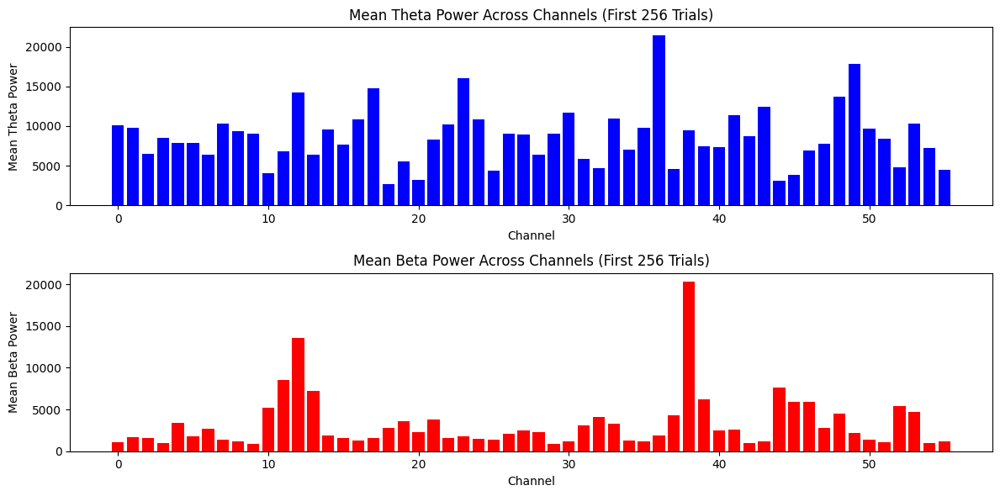

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
import scipy.io

# Step 1: Load the EEG data from a .mat file
mat_data = scipy.io.loadmat('/content/drive/MyDrive/EEG_dataset/ADHD_Files_combined.mat')

# Assuming the EEG data is stored in a variable called 'combined_data' in the .mat file
eeg_data = mat_data['combined_data']  # Example shape (385, 56, 5000) for (time_points, channels, trials)

# Step 2: Slice the data to get only the first 256 trials for the first participant
eeg_data_first_256_trials = eeg_data[:, :, :256]  # Shape (385, 56, 256)

# Step 3: Sampling frequency and parameters
fs = 256  # Sampling frequency (Hz)
nperseg = 128  # Number of points per segment for STFT

# Number of time points, channels, and trials
time_points, num_channels, num_trials = eeg_data_first_256_trials.shape

# Initialize arrays to store power for Theta and Beta bands for each channel
theta_power = np.zeros((num_channels, num_trials))  # (Channels x Trials)
beta_power = np.zeros((num_channels, num_trials))   # (Channels x Trials)

# Step 4: Apply STFT to each channel across the first 256 trials and calculate Theta and Beta power
for channel in range(num_channels):
    for trial in range(num_trials):
        # Apply STFT to the trial and channel
        f, t, Zxx = stft(eeg_data_first_256_trials[:, channel, trial], fs=fs, nperseg=nperseg)

        # Magnitude of the STFT (frequency vs. time representation)
        magnitude = np.abs(Zxx)

        # Mask for Theta band (4-8 Hz)
        theta_mask = (f >= 4) & (f <= 8)
        # Mask for Beta band (13-30 Hz)
        beta_mask = (f >= 13) & (f <= 30)

        # Compute power in the Theta and Beta bands (sum of squared magnitude)
        theta_power[channel, trial] = np.sum(magnitude[theta_mask]**2)
        beta_power[channel, trial] = np.sum(magnitude[beta_mask]**2)

# Step 5: Aggregate the power for Theta and Beta bands across trials for each channel
mean_theta_power = np.mean(theta_power, axis=1)  # Mean Theta power for each channel
mean_beta_power = np.mean(beta_power, axis=1)    # Mean Beta power for each channel

# Step 6: Visualize the aggregated Theta and Beta power for each channel

# Plot the mean power for each channel
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.bar(range(num_channels), mean_theta_power, color='blue')
plt.title('Mean Theta Power Across Channels (First 256 Trials)')
plt.xlabel('Channel')
plt.ylabel('Mean Theta Power')

plt.subplot(2, 1, 2)
plt.bar(range(num_channels), mean_beta_power, color='red')
plt.title('Mean Beta Power Across Channels (First 256 Trials)')
plt.xlabel('Channel')
plt.ylabel('Mean Beta Power')

plt.tight_layout()
plt.show()


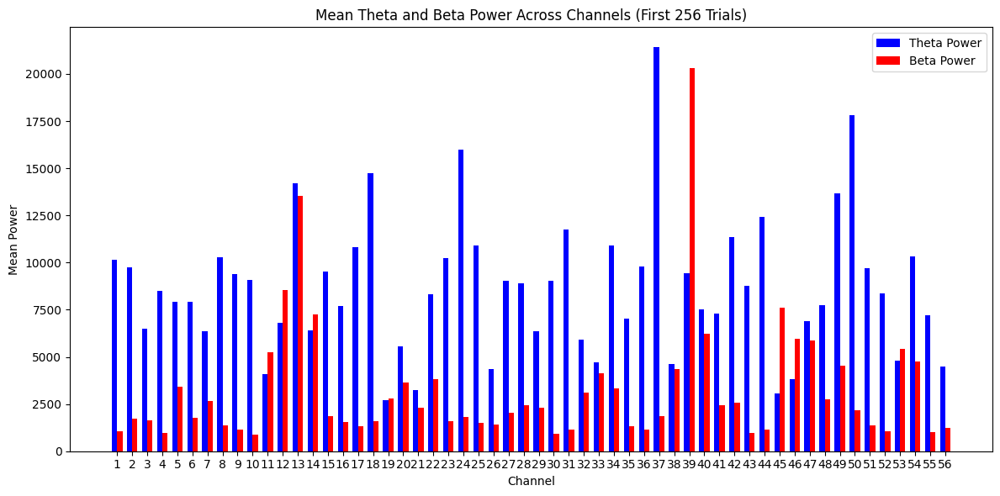

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
import scipy.io

# Step 1: Load the EEG data from a .mat file
mat_data = scipy.io.loadmat('/content/drive/MyDrive/EEG_dataset/ADHD_Files_combined.mat')

# Assuming the EEG data is stored in a variable called 'combined_data' in the .mat file
eeg_data = mat_data['combined_data']  # Example shape (385, 56, 5000) for (time_points, channels, trials)

# Step 2: Slice the data to get only the first 256 trials for the first participant
eeg_data_first_256_trials = eeg_data[:, :, :256]  # Shape (385, 56, 256)

# Step 3: Sampling frequency and parameters
fs = 256  # Sampling frequency (Hz)
nperseg = 128  # Number of points per segment for STFT

# Number of time points, channels, and trials
time_points, num_channels, num_trials = eeg_data_first_256_trials.shape

# Initialize arrays to store power for Theta and Beta bands for each channel
theta_power = np.zeros((num_channels, num_trials))  # (Channels x Trials)
beta_power = np.zeros((num_channels, num_trials))   # (Channels x Trials)

# Step 4: Apply STFT to each channel across the first 256 trials and calculate Theta and Beta power
for channel in range(num_channels):
    for trial in range(num_trials):
        # Apply STFT to the trial and channel
        f, t, Zxx = stft(eeg_data_first_256_trials[:, channel, trial], fs=fs, nperseg=nperseg)

        # Magnitude of the STFT (frequency vs. time representation)
        magnitude = np.abs(Zxx)

        # Mask for Theta band (4-8 Hz)
        theta_mask = (f >= 4) & (f <= 8)
        # Mask for Beta band (13-30 Hz)
        beta_mask = (f >= 13) & (f <= 30)

        # Compute power in the Theta and Beta bands (sum of squared magnitude)
        theta_power[channel, trial] = np.sum(magnitude[theta_mask]**2)
        beta_power[channel, trial] = np.sum(magnitude[beta_mask]**2)

# Step 5: Aggregate the power for Theta and Beta bands across trials for each channel
mean_theta_power = np.mean(theta_power, axis=1)  # Mean Theta power for each channel
mean_beta_power = np.mean(beta_power, axis=1)    # Mean Beta power for each channel

# Step 6: Visualize both Theta and Beta power in the same graph
x = np.arange(num_channels)  # Channel indices for plotting
width = 0.35  # Width of the bars

# Create a grouped bar plot
plt.figure(figsize=(12, 6))
plt.bar(x - width/2, mean_theta_power, width, label='Theta Power', color='blue')
plt.bar(x + width/2, mean_beta_power, width, label='Beta Power', color='red')

# Labels and title
plt.title('Mean Theta and Beta Power Across Channels (First 256 Trials)')
plt.xlabel('Channel')
plt.ylabel('Mean Power')
plt.xticks(x, range(1, num_channels+1))  # Displaying channel numbers on x-axis
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
# Compute Theta-to-Beta Ratio (TBR) for each channel
theta_to_beta_ratio = mean_theta_power / mean_beta_power

# Find the channel with the highest TBR
relevant_channel_index = np.argmax(theta_to_beta_ratio)
relevant_channel_tbr = theta_to_beta_ratio[relevant_channel_index]

print(f"Relevant Channel Index: {relevant_channel_index + 1}")  # +1 to match 1-based indexing
print(f"Highest Theta-to-Beta Ratio (TBR): {relevant_channel_tbr}")

# Optional: Sort channels by TBR to identify top channels
sorted_indices = np.argsort(theta_to_beta_ratio)[::-1]  # Descending order
print("Top Channels by TBR:", sorted_indices[:5] + 1)  # Display top 5 channels


Relevant Channel Index: 37
Highest Theta-to-Beta Ratio (TBR): 11.45878968036946
Top Channels by TBR: [37 44 10 31 30]


In [ ]:
#remove wrong channels from the mat file

import numpy as np
import scipy.io

# Step 1: Load the .mat file
mat_data = scipy.io.loadmat('/content/drive/MyDrive/EEG_dataset/dataset/chan.mat')

# Step 2: Access the channel data
# Adjust 'channel_data' to match the variable name in your .mat file
channel_data = mat_data['chan']
print("Shape of channel_data:", channel_data.shape)


# # Step 3: Define the indices of rows to remove (convert to 0-based indexing)
# rows_to_remove = np.array([28, 30, 57, 60]) - 1  # Convert to 0-based indexing

# # Step 4: Remove rows and maintain sequential order
# filtered_channel_data = np.delete(channel_data, rows_to_remove, axis=0)

# # Optional: Save the filtered data back to a .mat file
# scipy.io.savemat('/content/drive/MyDrive/EEG_dataset/filtered_channel_file.mat', {'filtered_channel_data': filtered_channel_data})

# # Print results to verify
# print(f"Original shape: {channel_data.shape}")
# print(f"Filtered shape: {filtered_channel_data.shape}")


Shape of channel_data: (1, 60)


In [ ]:
import numpy as np
import scipy.io

# Load the .mat file
mat_data = scipy.io.loadmat('/content/drive/MyDrive/EEG_dataset/dataset/chan.mat')

# Access channel data
channel_data = mat_data['chan']

# Check the shape of channel_data
print("Shape of channel_data before filtering:", channel_data.shape)

# Define the columns to remove (convert to 0-based indexing)
columns_to_remove = np.array([28, 30, 57, 60]) - 1

# Remove the specified columns
filtered_channel_data = np.delete(channel_data, columns_to_remove, axis=1)

# Optional: Save the filtered data back to a .mat file
scipy.io.savemat('/content/drive/MyDrive/EEG_dataset/filtered_channel_file.mat', {'filtered_channel_data': filtered_channel_data})

# Verify the results
print("Shape after filtering:", filtered_channel_data.shape)


Shape of channel_data before filtering: (1, 60)
Shape after filtering: (1, 56)


In [ ]:
import scipy.io

# Step 1: Load the new filtered .mat file
filtered_file = '/content/drive/MyDrive/EEG_dataset/filtered_channel_file.mat'
mat_data = scipy.io.loadmat(filtered_file)

# Step 2: Access the relevant variable
# Replace 'filtered_channel_data' with the actual variable name in the .mat file
if 'filtered_channel_data' in mat_data:
    filtered_channel_data = mat_data['filtered_channel_data']
    print("Filtered Channels:")

    # Assuming filtered_channel_data is 1D or 2D, print each channel name or value
    for i, channel in enumerate(filtered_channel_data.flatten(), start=1):  # Flatten in case it's not 1D
        print(f"Channel {i}: {channel}")
else:
    print("Error: 'filtered_channel_data' variable not found in the .mat file.")


Filtered Channels:
Channel 1: (array(['Cz'], dtype='<U2'), array(['µV/m²'], dtype='<U5'), array([[1]], dtype=uint8), array([[0]], dtype=uint8), array([[90]], dtype=uint8), array([[-0.]]), array([[0]], dtype=uint8), array([[6.123234e-17]]), array([[0]], dtype=uint8), array([[1]], dtype=uint8), array([], dtype='<U1'), array([], dtype='<U1'), array([], shape=(0, 0), dtype=uint8))
Channel 2: (array(['FCz'], dtype='<U3'), array(['µV/m²'], dtype='<U5'), array([[1]], dtype=uint8), array([[0]], dtype=uint8), array([[67]], dtype=uint8), array([[-0.]]), array([[0.12777778]]), array([[0.39073113]]), array([[0]], dtype=uint8), array([[0.92050485]]), array([], dtype='<U1'), array([], dtype='<U1'), array([], shape=(1, 0), dtype=float64))
Channel 3: (array(['FC1'], dtype='<U3'), array(['µV/m²'], dtype='<U5'), array([[1]], dtype=uint8), array([[60]], dtype=uint8), array([[67]], dtype=uint8), array([[-60]], dtype=int16), array([[0.12777778]]), array([[0.19536556]]), array([[0.33838308]]), array([[0.920

In [ ]:
# Compute Theta-to-Beta Ratio (TBR) for each channel
theta_to_beta_ratio = mean_theta_power / mean_beta_power

# Find the channel with the highest TBR
relevant_channel_index = np.argmax(theta_to_beta_ratio)  # 0-based index
relevant_channel_tbr = theta_to_beta_ratio[relevant_channel_index]

# Load the filtered channel names (optional: if you have a file or mapping)
filtered_channel_names = range(1, len(theta_to_beta_ratio) + 1)  # Assuming 1-based sequential numbering

# Map the index to the actual channel
relevant_channel_number = filtered_channel_names[relevant_channel_index]

print(f"Relevant Channel: {relevant_channel_number}")
print(f"Highest Theta-to-Beta Ratio (TBR): {relevant_channel_tbr}")

# Optional: Sort channels by TBR to identify top channels
sorted_indices = np.argsort(theta_to_beta_ratio)[::-1]  # Descending order
top_channels = [filtered_channel_names[idx] for idx in sorted_indices[:5]]  # Map to actual channel numbers
print("Top Channels by TBR:", top_channels)


Relevant Channel: 37
Highest Theta-to-Beta Ratio (TBR): 11.45878968036946
Top Channels by TBR: [37, 44, 10, 31, 30]


EEG Data Shape: (385, 56, 10742)


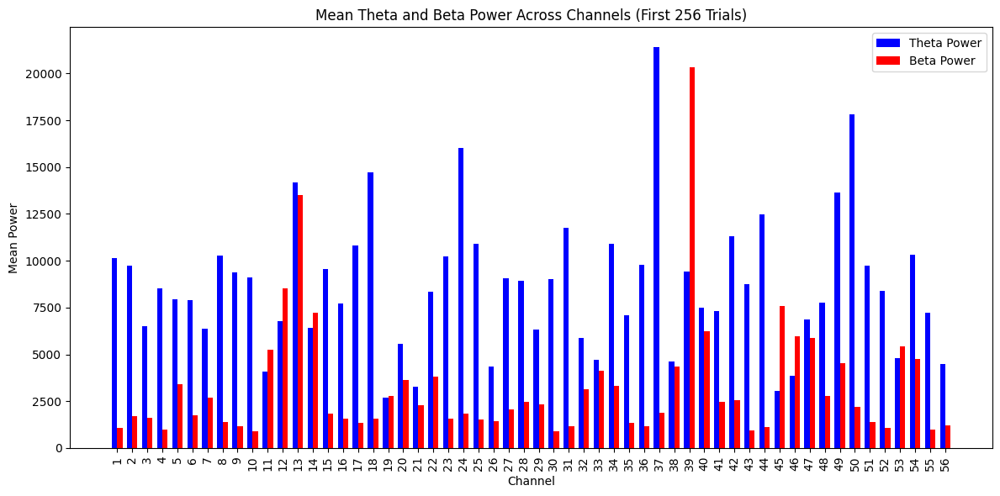

Relevant Channel Index: 37
Highest Theta-to-Beta Ratio (TBR): 11.462359919685221
Top Channels by TBR: [37 44 10 31 30]


In [ ]:


import matplotlib.pyplot as plt
from scipy.signal import stft
import scipy.io

# Step 1: Load the EEG data from a .mat file
mat_data = scipy.io.loadmat('/content/drive/MyDrive/EEG_dataset/ADHD_Files_combined.mat')

# Verify shape of the loaded data
eeg_data = mat_data['combined_data']
print(f"EEG Data Shape: {eeg_data.shape}")  # Check the data structure

# Step 2: Slice the data to get only the first 256 trials for the first participant
eeg_data_first_256_trials = eeg_data[:, :, :257]  # Shape (385, 56, 256)

# Step 3: Sampling frequency and parameters
fs = 256  # Sampling frequency (Hz)
nperseg = min(128, eeg_data_first_256_trials.shape[0])  # Ensure nperseg doesn't exceed time points

# Number of time points, channels, and trials
time_points, num_channels, num_trials = eeg_data_first_256_trials.shape

# Initialize arrays to store power for Theta and Beta bands for each channel
theta_power = np.zeros((num_channels, num_trials))  # (Channels x Trials)
beta_power = np.zeros((num_channels, num_trials))   # (Channels x Trials)

# Step 4: Apply STFT to each channel across the first 256 trials and calculate Theta and Beta power
for channel in range(num_channels):
    for trial in range(num_trials):
        # Apply STFT to the trial and channel
        f, t, Zxx = stft(eeg_data_first_256_trials[:, channel, trial], fs=fs, nperseg=nperseg)

        # Magnitude of the STFT (frequency vs. time representation)
        magnitude = np.abs(Zxx)

        # Mask for Theta band (4-8 Hz)
        theta_mask = (f >= 4) & (f <= 8)
        # Mask for Beta band (13-30 Hz)
        beta_mask = (f >= 13) & (f <= 30)

        # Compute power in the Theta and Beta bands (sum of squared magnitude)
        theta_power[channel, trial] = np.sum(magnitude[theta_mask]**2)
        beta_power[channel, trial] = np.sum(magnitude[beta_mask]**2)

# Step 5: Aggregate the power for Theta and Beta bands across trials for each channel
mean_theta_power = np.mean(theta_power, axis=1)  # Mean Theta power for each channel
mean_beta_power = np.mean(beta_power, axis=1)    # Mean Beta power for each channel

# Step 6: Compute Theta-to-Beta Ratio (TBR) for each channel
epsilon = 1e-10  # Prevent division by zero
theta_to_beta_ratio = mean_theta_power / (mean_beta_power + epsilon)

# Step 7: Visualize both Theta and Beta power in the same graph
x = np.arange(num_channels)  # Channel indices for plotting
width = 0.35  # Width of the bars

# Create a grouped bar plot
plt.figure(figsize=(12, 6))
plt.bar(x - width/2, mean_theta_power, width, label='Theta Power', color='blue')
plt.bar(x + width/2, mean_beta_power, width, label='Beta Power', color='red')

# Labels and title
plt.title('Mean Theta and Beta Power Across Channels (First 256 Trials)')
plt.xlabel('Channel')
plt.ylabel('Mean Power')
plt.xticks(x, range(1, num_channels+1), rotation=90)  # Displaying channel numbers on x-axis
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

# Step 8: Find the channel with the highest TBR
relevant_channel_index = np.argmax(theta_to_beta_ratio)
relevant_channel_tbr = theta_to_beta_ratio[relevant_channel_index]
print(f"Relevant Channel Index: {relevant_channel_index + 1}")  # +1 to match 1-based indexing
print(f"Highest Theta-to-Beta Ratio (TBR): {relevant_channel_tbr}")

# Optional: Sort channels by TBR to identify top channels
sorted_indices = np.argsort(theta_to_beta_ratio)[::-1]  # Descending order
print("Top Channels by TBR:", sorted_indices[:5] + 1)  # Display top 5 channels


EEG Data Shape: (385, 56, 10742)


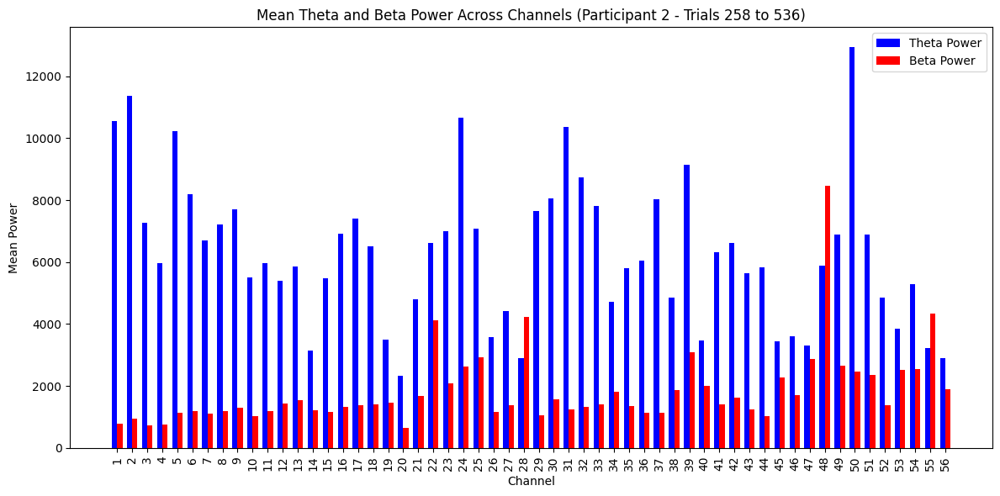

Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 13.325479982243364
Top Channels by TBR: [ 1  2  3  5 31]


In [ ]:
#second participant
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
import scipy.io

# Step 1: Load the EEG data from a .mat file
mat_data = scipy.io.loadmat('/content/drive/MyDrive/EEG_dataset/ADHD_Files_combined.mat')

# Verify shape of the loaded data
eeg_data = mat_data['combined_data']
print(f"EEG Data Shape: {eeg_data.shape}")  # Check the data structure

# Step 2: Slice the data to get the trials for the next participant (trials 258 to 536, which is 279 trials)
eeg_data_next_participant = eeg_data[:, :, 257:536]  # Shape (385, 56, 279)

# Step 3: Sampling frequency and parameters
fs = 256  # Sampling frequency (Hz)
nperseg = min(128, eeg_data_next_participant.shape[0])  # Ensure nperseg doesn't exceed time points

# Number of time points, channels, and trials
time_points, num_channels, num_trials = eeg_data_next_participant.shape

# Initialize arrays to store power for Theta and Beta bands for each channel
theta_power = np.zeros((num_channels, num_trials))  # (Channels x Trials)
beta_power = np.zeros((num_channels, num_trials))   # (Channels x Trials)

# Step 4: Apply STFT to each channel across the trials for the next participant and calculate Theta and Beta power
for channel in range(num_channels):
    for trial in range(num_trials):
        # Apply STFT to the trial and channel
        f, t, Zxx = stft(eeg_data_next_participant[:, channel, trial], fs=fs, nperseg=nperseg)

        # Magnitude of the STFT (frequency vs. time representation)
        magnitude = np.abs(Zxx)

        # Mask for Theta band (4-8 Hz)
        theta_mask = (f >= 4) & (f <= 8)
        # Mask for Beta band (13-30 Hz)
        beta_mask = (f >= 13) & (f <= 30)

        # Compute power in the Theta and Beta bands (sum of squared magnitude)
        theta_power[channel, trial] = np.sum(magnitude[theta_mask]**2)
        beta_power[channel, trial] = np.sum(magnitude[beta_mask]**2)

# Step 5: Aggregate the power for Theta and Beta bands across trials for each channel
mean_theta_power = np.mean(theta_power, axis=1)  # Mean Theta power for each channel
mean_beta_power = np.mean(beta_power, axis=1)    # Mean Beta power for each channel

# Step 6: Compute Theta-to-Beta Ratio (TBR) for each channel
epsilon = 1e-10  # Prevent division by zero
theta_to_beta_ratio = mean_theta_power / (mean_beta_power + epsilon)

# Step 7: Visualize both Theta and Beta power in the same graph for the new participant
x = np.arange(num_channels)  # Channel indices for plotting
width = 0.35  # Width of the bars

# Create a grouped bar plot
plt.figure(figsize=(12, 6))
plt.bar(x - width/2, mean_theta_power, width, label='Theta Power', color='blue')
plt.bar(x + width/2, mean_beta_power, width, label='Beta Power', color='red')

# Labels and title
plt.title('Mean Theta and Beta Power Across Channels (Participant 2 - Trials 258 to 536)')
plt.xlabel('Channel')
plt.ylabel('Mean Power')
plt.xticks(x, range(1, num_channels+1), rotation=90)  # Displaying channel numbers on x-axis
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

# Step 8: Find the channel with the highest TBR
relevant_channel_index = np.argmax(theta_to_beta_ratio)
relevant_channel_tbr = theta_to_beta_ratio[relevant_channel_index]
print(f"Relevant Channel Index: {relevant_channel_index + 1}")  # +1 to match 1-based indexing
print(f"Highest Theta-to-Beta Ratio (TBR): {relevant_channel_tbr}")

# Optional: Sort channels by TBR to identify top channels
sorted_indices = np.argsort(theta_to_beta_ratio)[::-1]  # Descending order
print("Top Channels by TBR:", sorted_indices[:5] + 1)  # Display top 5 channels


Selected Data Shape for Next 46 Trials: (385, 56, 46)


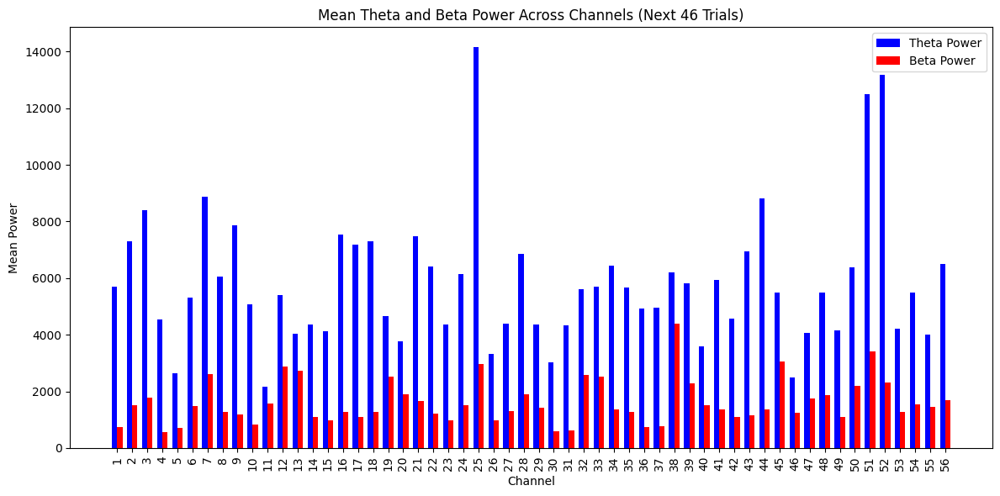

Relevant Channel Index: 4
Highest Theta-to-Beta Ratio (TBR): 8.232305446145238
Top Channels by TBR: [ 4  1 31 36  9]


In [ ]:
#third participant
# Step 1: Select the next 46 trials from the dataset (trials 537 to 582 in MATLAB, 536 to 581 in Python)
eeg_data_next_46_trials = eeg_data[:, :, 536:582]  # Select trials from 537 to 582 (46 trials)

# Verify the shape of the data slice
print(f"Selected Data Shape for Next 46 Trials: {eeg_data_next_46_trials.shape}")

# Number of time points, channels, and trials for the next 46 trials
time_points, num_channels, num_trials = eeg_data_next_46_trials.shape

# Initialize arrays to store power for Theta and Beta bands for each channel
theta_power = np.zeros((num_channels, num_trials))  # (Channels x Trials)
beta_power = np.zeros((num_channels, num_trials))   # (Channels x Trials)

# Step 2: Apply STFT to each channel across the next 46 trials and calculate Theta and Beta power
for channel in range(num_channels):
    for trial in range(num_trials):
        # Apply STFT to the trial and channel
        f, t, Zxx = stft(eeg_data_next_46_trials[:, channel, trial], fs=fs, nperseg=nperseg)

        # Magnitude of the STFT (frequency vs. time representation)
        magnitude = np.abs(Zxx)

        # Mask for Theta band (4-8 Hz)
        theta_mask = (f >= 4) & (f <= 8)
        # Mask for Beta band (13-30 Hz)
        beta_mask = (f >= 13) & (f <= 30)

        # Compute power in the Theta and Beta bands (sum of squared magnitude)
        theta_power[channel, trial] = np.sum(magnitude[theta_mask]**2)
        beta_power[channel, trial] = np.sum(magnitude[beta_mask]**2)

# Step 3: Aggregate the power for Theta and Beta bands across trials for each channel
mean_theta_power = np.mean(theta_power, axis=1)  # Mean Theta power for each channel
mean_beta_power = np.mean(beta_power, axis=1)    # Mean Beta power for each channel

# Step 4: Compute Theta-to-Beta Ratio (TBR) for each channel
theta_to_beta_ratio = mean_theta_power / (mean_beta_power + epsilon)

# Step 5: Visualize both Theta and Beta power in the same graph
x = np.arange(num_channels)  # Channel indices for plotting
width = 0.35  # Width of the bars

# Create a grouped bar plot
plt.figure(figsize=(12, 6))
plt.bar(x - width/2, mean_theta_power, width, label='Theta Power', color='blue')
plt.bar(x + width/2, mean_beta_power, width, label='Beta Power', color='red')

# Labels and title
plt.title('Mean Theta and Beta Power Across Channels (Next 46 Trials)')
plt.xlabel('Channel')
plt.ylabel('Mean Power')
plt.xticks(x, range(1, num_channels+1), rotation=90)  # Displaying channel numbers on x-axis
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

# Step 6: Find the channel with the highest TBR
relevant_channel_index = np.argmax(theta_to_beta_ratio)
relevant_channel_tbr = theta_to_beta_ratio[relevant_channel_index]
print(f"Relevant Channel Index: {relevant_channel_index + 1}")  # +1 to match 1-based indexing
print(f"Highest Theta-to-Beta Ratio (TBR): {relevant_channel_tbr}")

# Optional: Sort channels by TBR to identify top channels
sorted_indices = np.argsort(theta_to_beta_ratio)[::-1]  # Descending order
print("Top Channels by TBR:", sorted_indices[:5] + 1)  # Display top 5 channels


Selected Data Shape for Fourth Participant (259 Trials): (385, 56, 259)


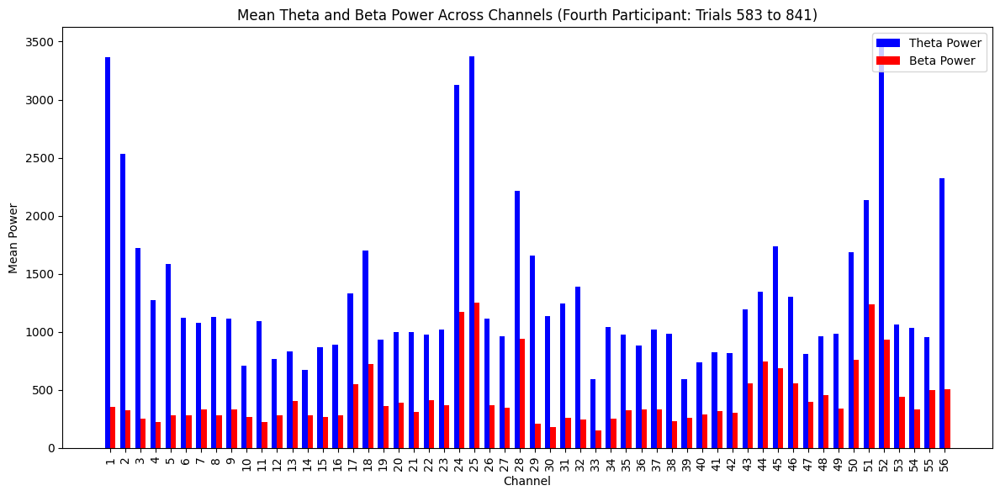

Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 9.559332981621706
Top Channels by TBR: [ 1 29  2  3 30]


In [ ]:
  # This code plots the mean Theta and Beta power for the fourth participant (trials 583 to 841)

# Step 1: Select the next 259 trials from the dataset (trials 583 to 841 in MATLAB, 582 to 840 in Python)
eeg_data_fourth_participant = eeg_data[:, :, 582:841]  # Select trials from 583 to 841 (259 trials)

# Verify the shape of the data slice
print(f"Selected Data Shape for Fourth Participant (259 Trials): {eeg_data_fourth_participant.shape}")

# Number of time points, channels, and trials for the fourth participant
time_points, num_channels, num_trials = eeg_data_fourth_participant.shape

# Initialize arrays to store power for Theta and Beta bands for each channel
theta_power = np.zeros((num_channels, num_trials))  # (Channels x Trials)
beta_power = np.zeros((num_channels, num_trials))   # (Channels x Trials)

# Step 2: Apply STFT to each channel across the 259 trials and calculate Theta and Beta power
for channel in range(num_channels):
    for trial in range(num_trials):
        # Apply STFT to the trial and channel
        f, t, Zxx = stft(eeg_data_fourth_participant[:, channel, trial], fs=fs, nperseg=nperseg)

        # Magnitude of the STFT (frequency vs. time representation)
        magnitude = np.abs(Zxx)

        # Mask for Theta band (4-8 Hz)
        theta_mask = (f >= 4) & (f <= 8)
        # Mask for Beta band (13-30 Hz)
        beta_mask = (f >= 13) & (f <= 30)

        # Compute power in the Theta and Beta bands (sum of squared magnitude)
        theta_power[channel, trial] = np.sum(magnitude[theta_mask]**2)
        beta_power[channel, trial] = np.sum(magnitude[beta_mask]**2)

# Step 3: Aggregate the power for Theta and Beta bands across trials for each channel
mean_theta_power = np.mean(theta_power, axis=1)  # Mean Theta power for each channel
mean_beta_power = np.mean(beta_power, axis=1)    # Mean Beta power for each channel

# Step 4: Compute Theta-to-Beta Ratio (TBR) for each channel
theta_to_beta_ratio = mean_theta_power / (mean_beta_power + epsilon)

# Step 5: Visualize both Theta and Beta power in the same graph
x = np.arange(num_channels)  # Channel indices for plotting
width = 0.35  # Width of the bars

# Create a grouped bar plot
plt.figure(figsize=(12, 6))
plt.bar(x - width/2, mean_theta_power, width, label='Theta Power', color='blue')
plt.bar(x + width/2, mean_beta_power, width, label='Beta Power', color='red')

# Labels and title
plt.title('Mean Theta and Beta Power Across Channels (Fourth Participant: Trials 583 to 841)')
plt.xlabel('Channel')
plt.ylabel('Mean Power')
plt.xticks(x, range(1, num_channels+1), rotation=90)  # Displaying channel numbers on x-axis
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

# Step 6: Find the channel with the highest TBR
relevant_channel_index = np.argmax(theta_to_beta_ratio)
relevant_channel_tbr = theta_to_beta_ratio[relevant_channel_index]
print(f"Relevant Channel Index: {relevant_channel_index + 1}")  # +1 to match 1-based indexing
print(f"Highest Theta-to-Beta Ratio (TBR): {relevant_channel_tbr}")

# Optional: Sort channels by TBR to identify top channels
sorted_indices = np.argsort(theta_to_beta_ratio)[::-1]  # Descending order
print("Top Channels by TBR:", sorted_indices[:5] + 1)  # Display top 5 channels


EEG Data Shape: (385, 56, 10742)
Selected Data Shape for Participant 5: (385, 56, 205)


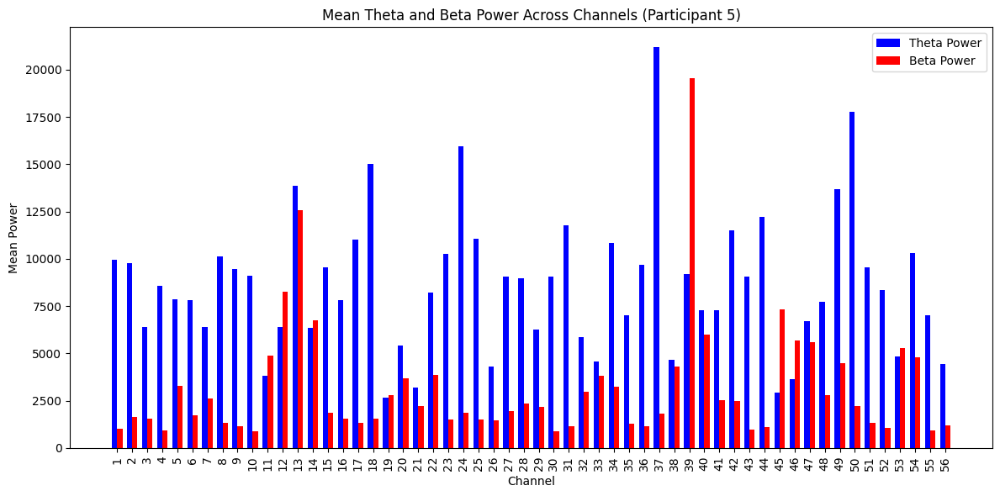

Participant 5: Relevant Channel Index: 37
Highest Theta-to-Beta Ratio (TBR): 11.659628483150318
Participant 5: Top Channels by TBR: [37 44 10 31 30]
Selected Data Shape for Participant 6: (385, 56, 262)


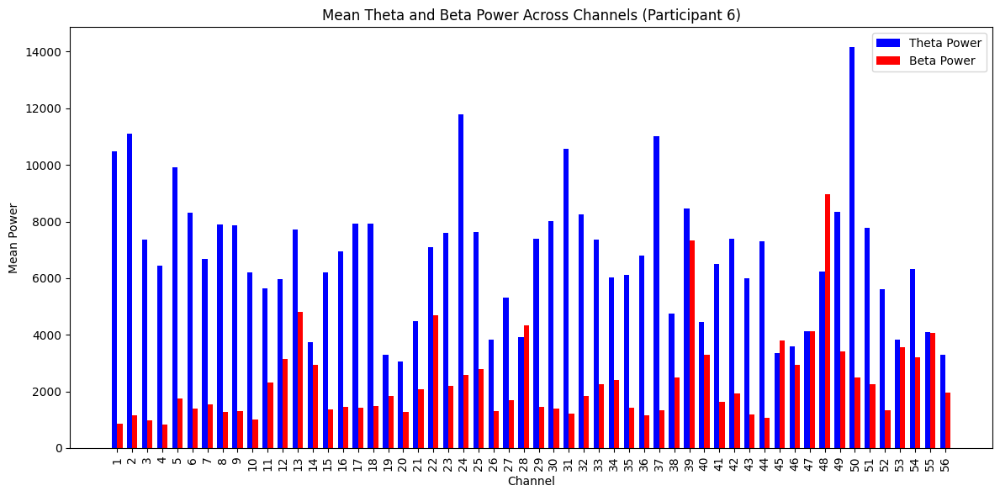

Participant 6: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 12.111853009867687
Participant 6: Top Channels by TBR: [ 1  2 31 37  4]
Selected Data Shape for Participant 7: (385, 56, 214)


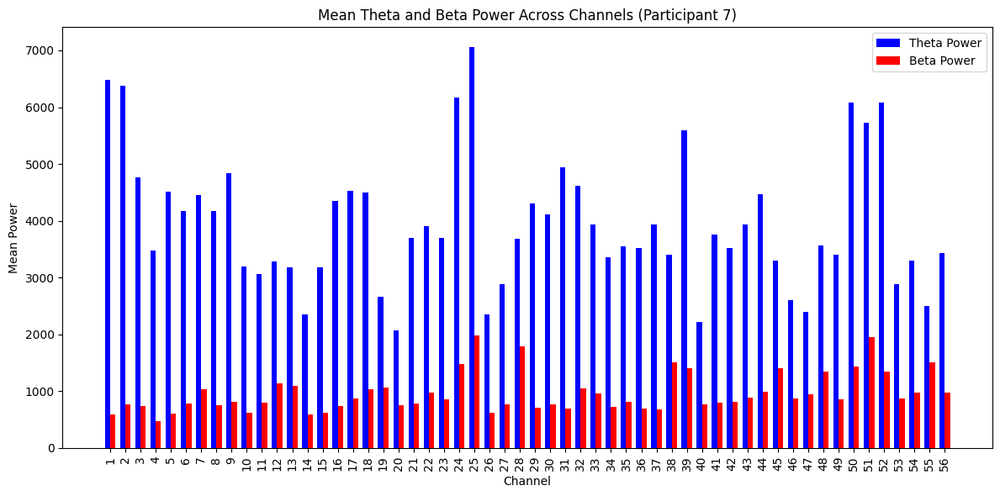

Participant 7: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 10.85986454364061
Participant 7: Top Channels by TBR: [ 1  2  4  5 31]
Selected Data Shape for Participant 8: (385, 56, 262)


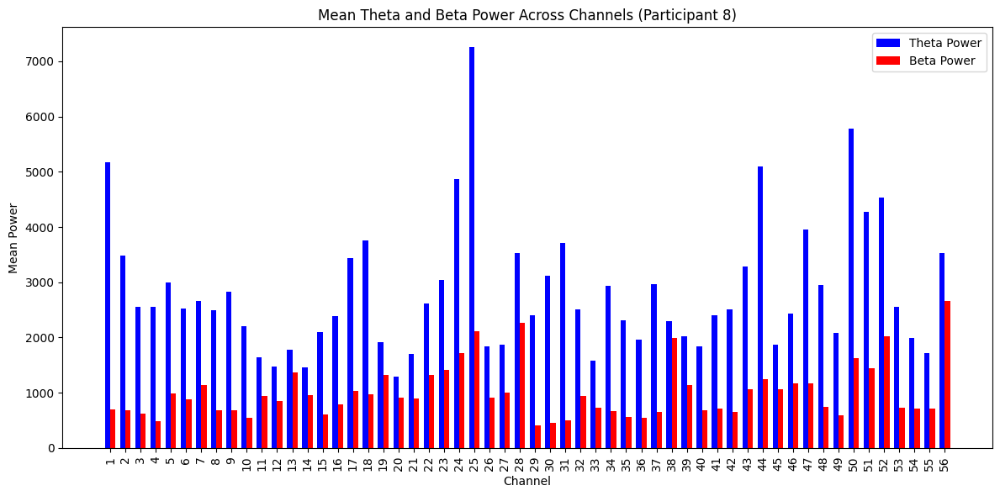

Participant 8: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 7.485648438579396
Participant 8: Top Channels by TBR: [31  1 30 29  4]
Selected Data Shape for Participant 9: (385, 56, 261)


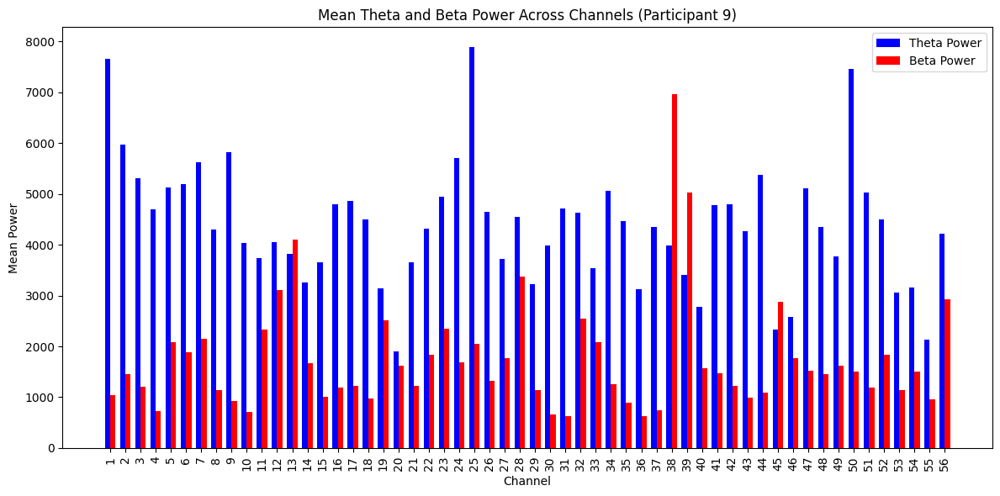

Participant 9: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 7.432444292698137
Participant 9: Top Channels by TBR: [31  1  4  9 30]
Selected Data Shape for Participant 10: (385, 56, 265)


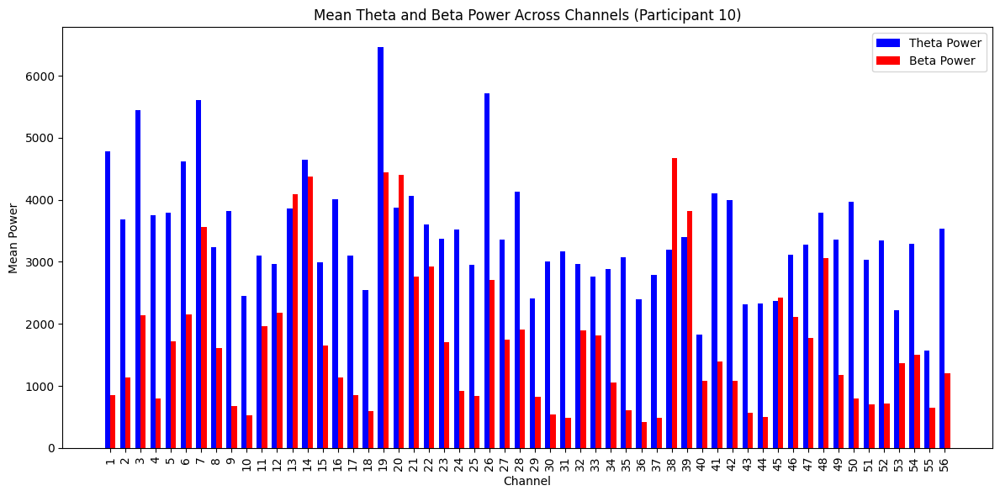

Participant 10: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 6.430290202854151
Participant 10: Top Channels by TBR: [31 36 37  9  1]
Selected Data Shape for Participant 11: (385, 56, 285)


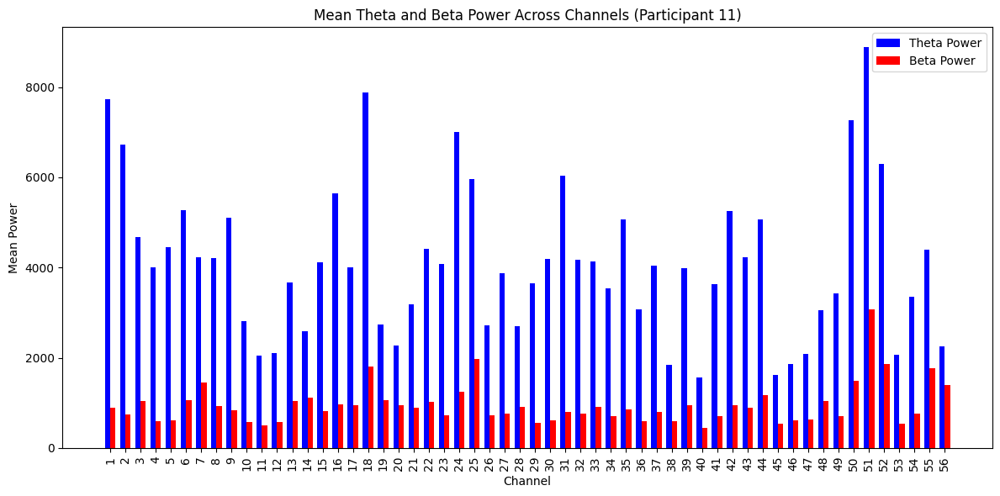

Participant 11: Relevant Channel Index: 2
Highest Theta-to-Beta Ratio (TBR): 9.098522035958243
Participant 11: Top Channels by TBR: [ 2  1 31  5 30]
Selected Data Shape for Participant 12: (385, 56, 255)


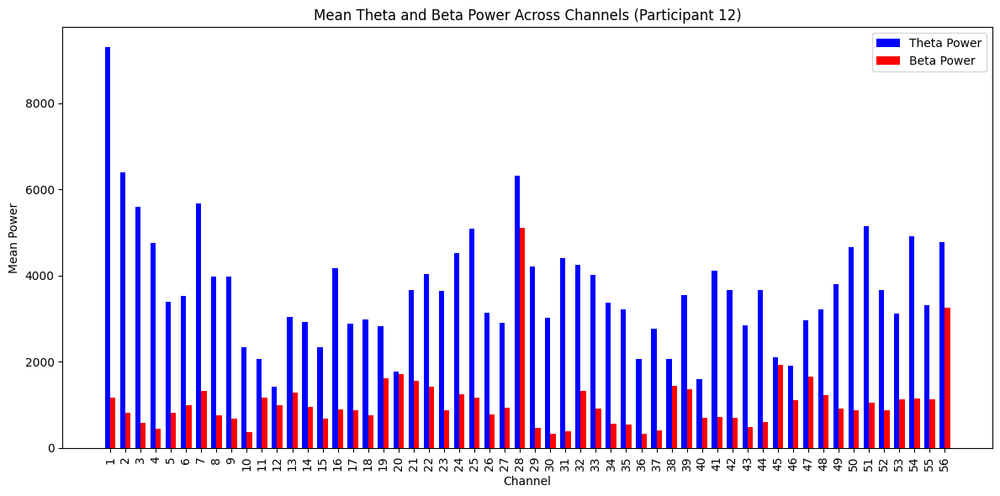

Participant 12: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 11.026268997062353
Participant 12: Top Channels by TBR: [31  4  3 30 29]
Selected Data Shape for Participant 13: (385, 56, 213)


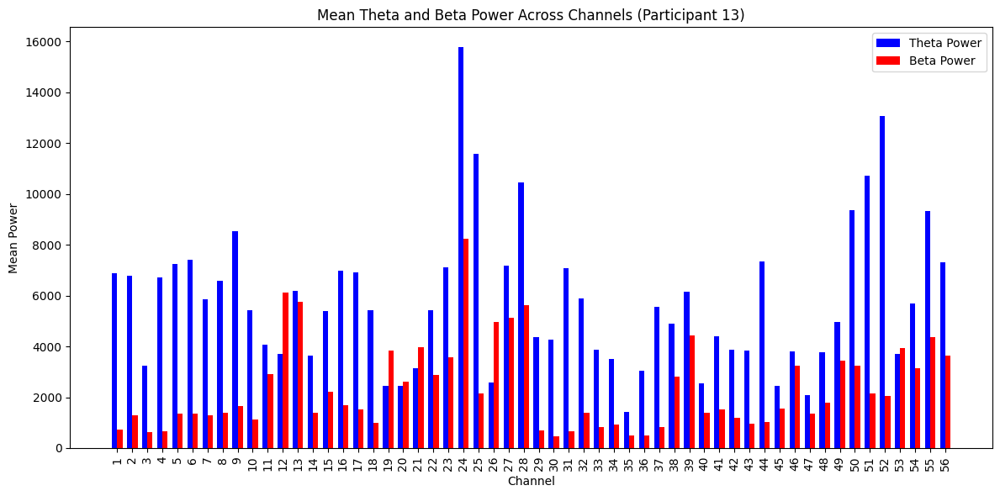

Participant 13: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 10.574365072495015
Participant 13: Top Channels by TBR: [31  4  1 30 44]
Selected Data Shape for Participant 14: (385, 56, 238)


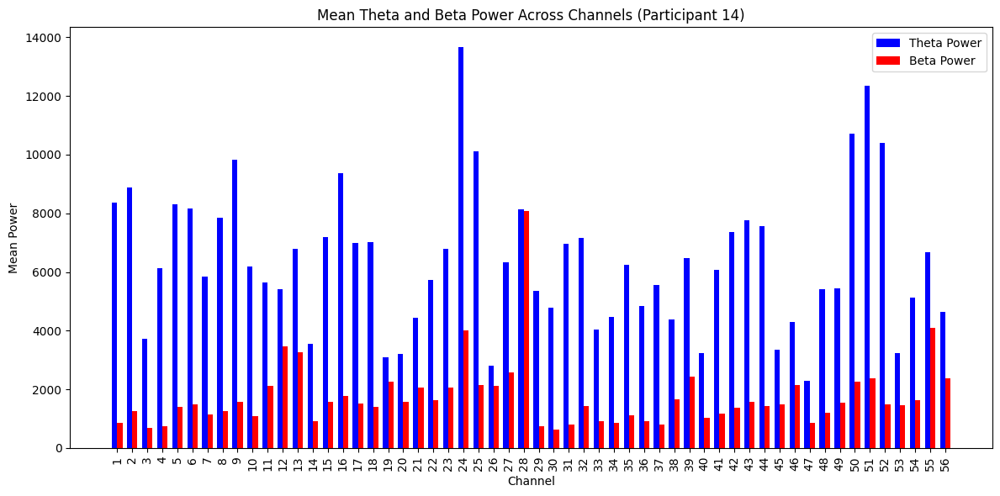

Participant 14: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 9.857281717515367
Participant 14: Top Channels by TBR: [ 1 31  4 30 29]
Selected Data Shape for Participant 15: (385, 56, 168)


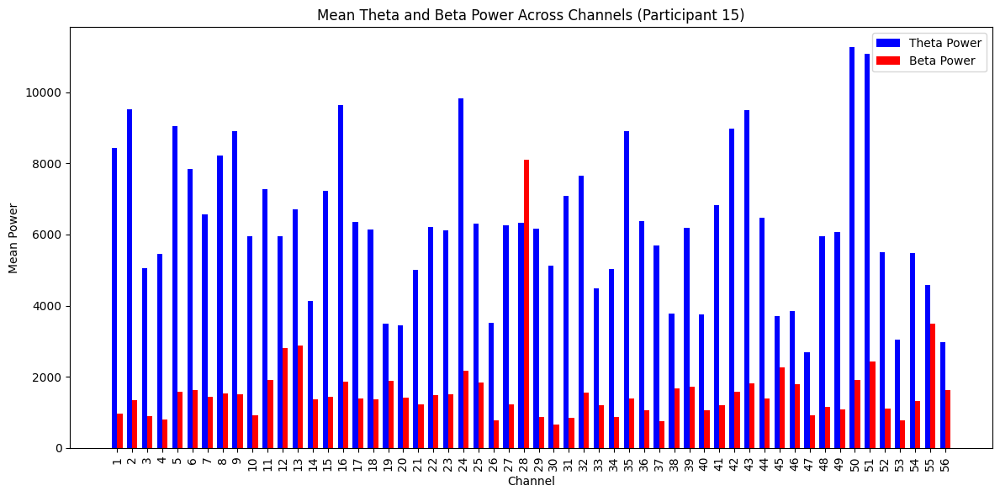

Participant 15: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 8.741440939870076
Participant 15: Top Channels by TBR: [ 1 31 30 37  2]
Selected Data Shape for Participant 16: (385, 56, 125)


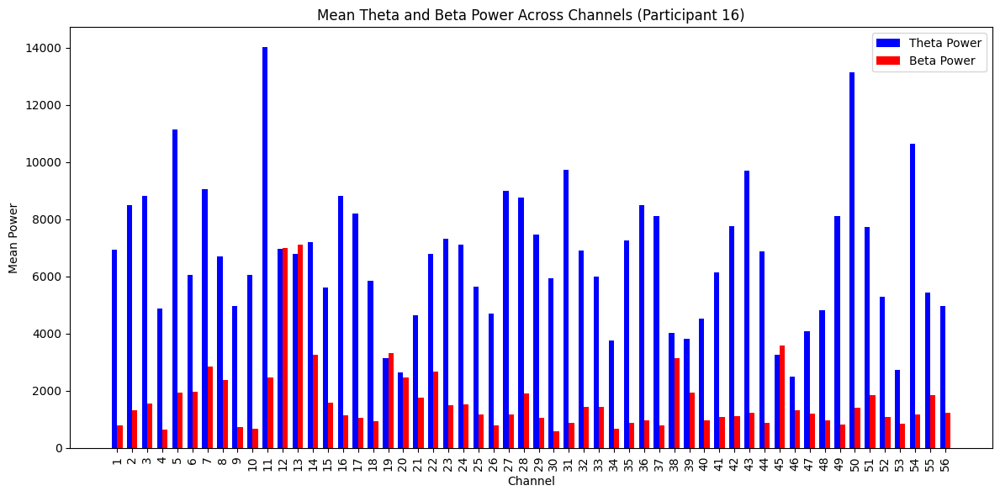

Participant 16: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 10.98518350161478
Participant 16: Top Channels by TBR: [31 37 30 49 50]
Selected Data Shape for Participant 17: (385, 56, 239)


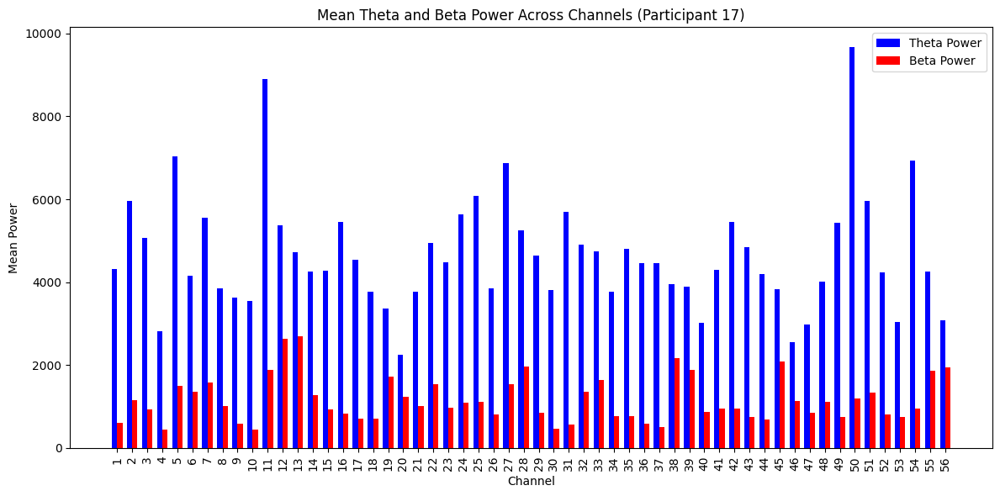

Participant 17: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 9.97173641637945
Participant 17: Top Channels by TBR: [31 37 30 50 10]
Selected Data Shape for Participant 18: (385, 56, 195)


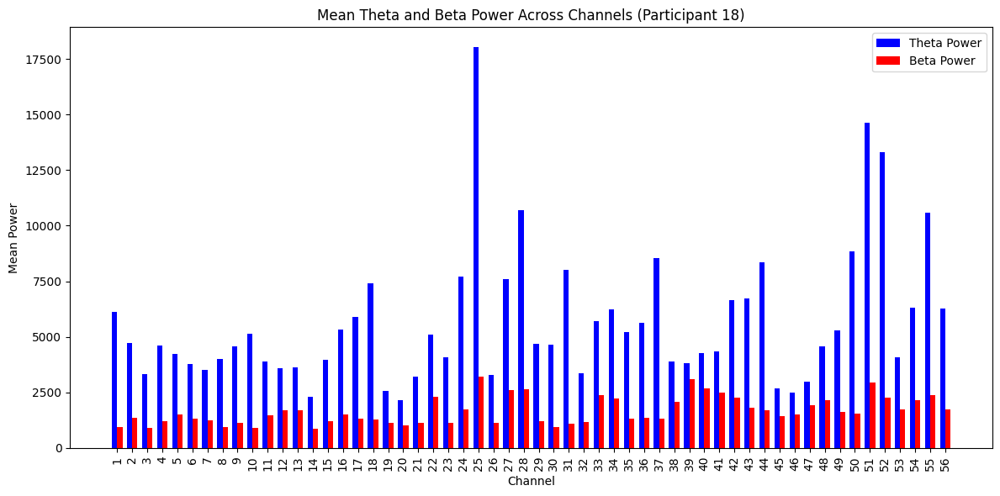

Participant 18: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 7.282242688519042
Participant 18: Top Channels by TBR: [31  1 37 52 10]
Selected Data Shape for Participant 19: (385, 56, 286)


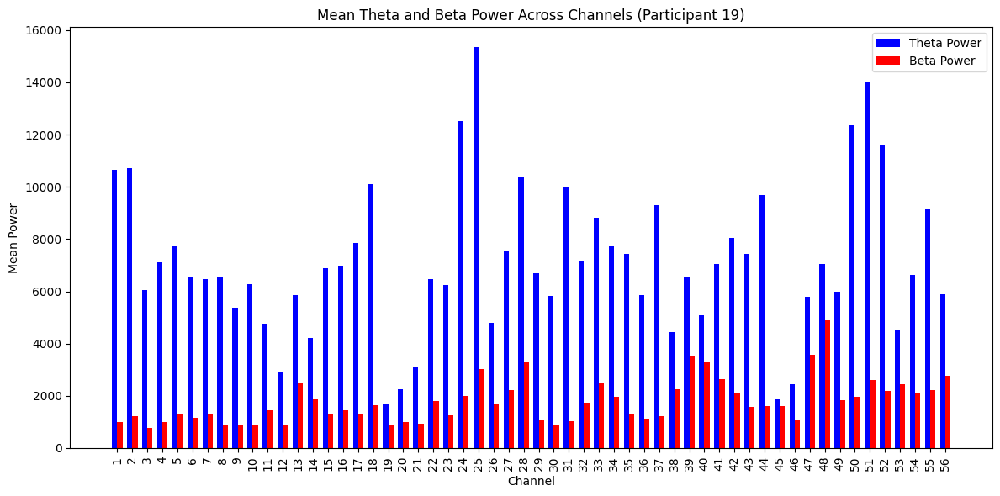

Participant 19: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 10.799673416349545
Participant 19: Top Channels by TBR: [ 1 31  2  3 37]
Selected Data Shape for Participant 20: (385, 56, 197)


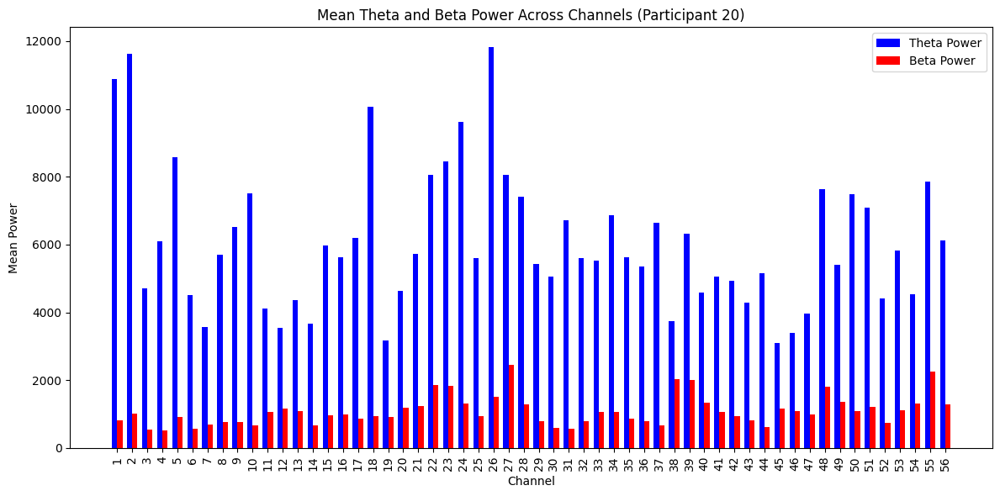

Participant 20: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 13.513308083263771
Participant 20: Top Channels by TBR: [ 1 31  4  2 10]
Selected Data Shape for Participant 21: (385, 56, 234)


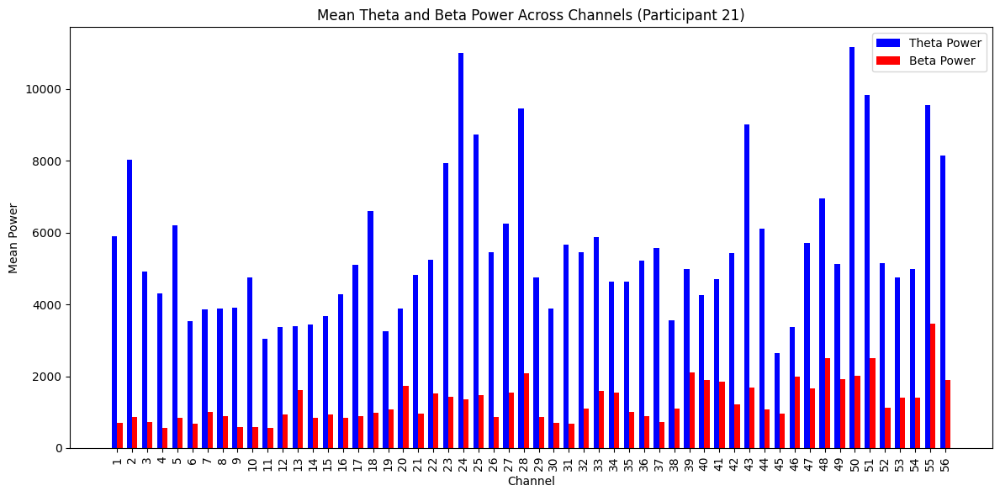

Participant 21: Relevant Channel Index: 2
Highest Theta-to-Beta Ratio (TBR): 9.199528544929198
Participant 21: Top Channels by TBR: [ 2 31  1 10 24]
Selected Data Shape for Participant 22: (385, 56, 203)


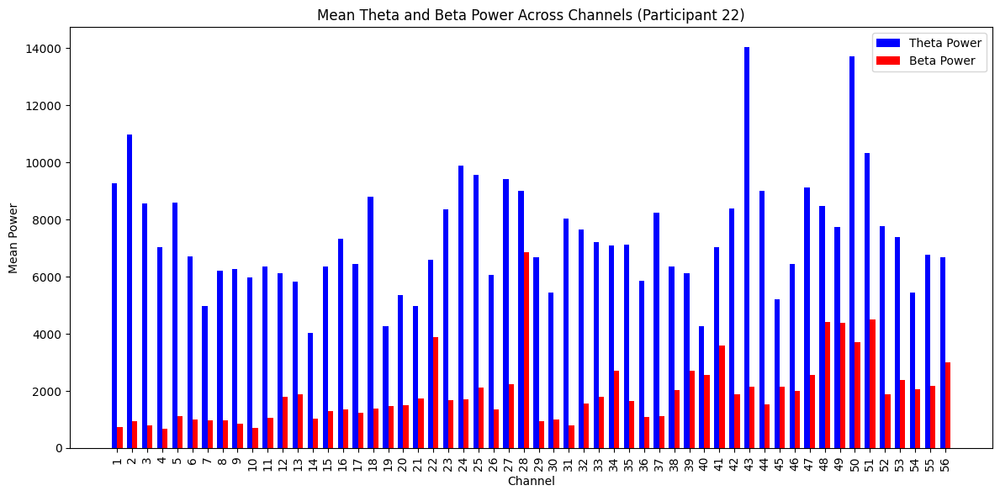

Participant 22: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 12.735210312056177
Participant 22: Top Channels by TBR: [ 1  2  3  4 31]
Selected Data Shape for Participant 23: (385, 56, 223)


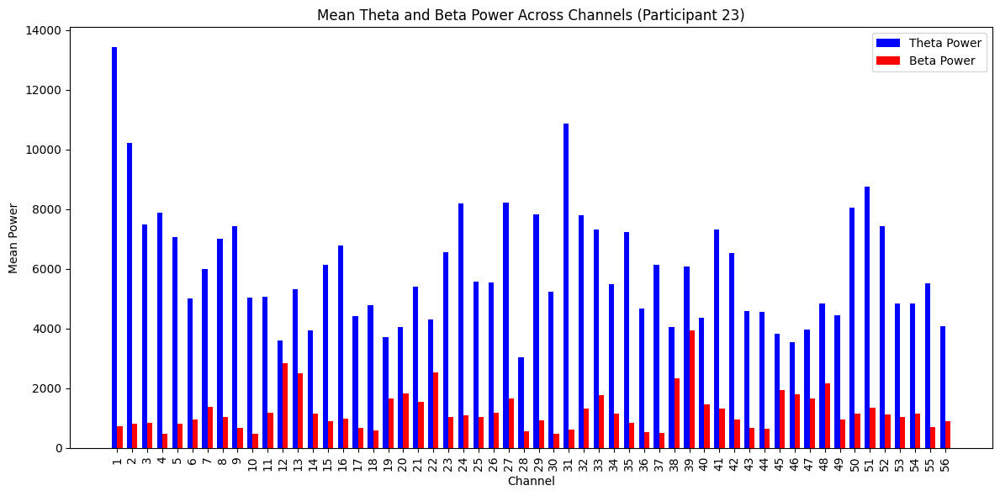

Participant 23: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 18.522598739471633
Participant 23: Top Channels by TBR: [ 1 31  4  2 37]
Selected Data Shape for Participant 24: (385, 56, 265)


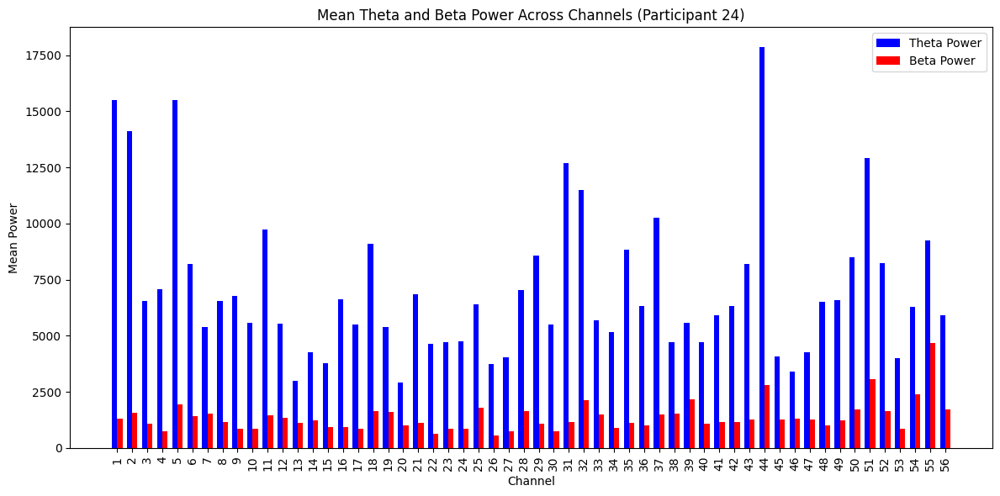

Participant 24: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 11.737010835006982
Participant 24: Top Channels by TBR: [ 1 31  4  2  5]
Selected Data Shape for Participant 25: (385, 56, 255)


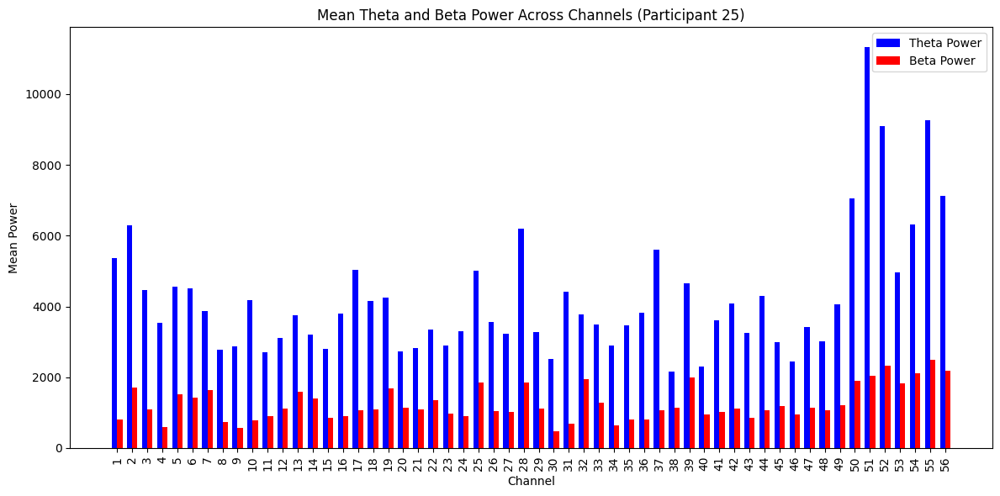

Participant 25: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 6.5485439404796555
Participant 25: Top Channels by TBR: [ 1 31  4 51 10]
Selected Data Shape for Participant 26: (385, 56, 226)


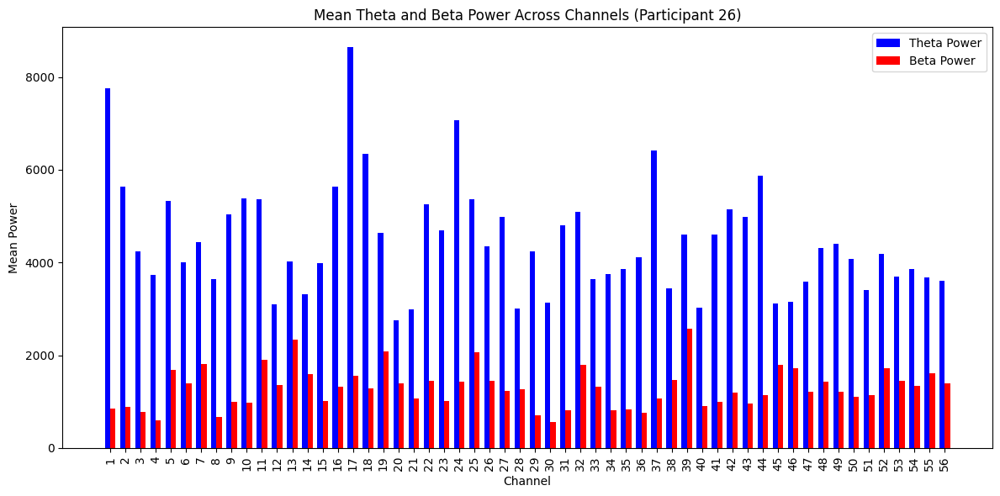

Participant 26: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 9.155640075340994
Participant 26: Top Channels by TBR: [ 1  2  4 29 37]
Selected Data Shape for Participant 27: (385, 56, 264)


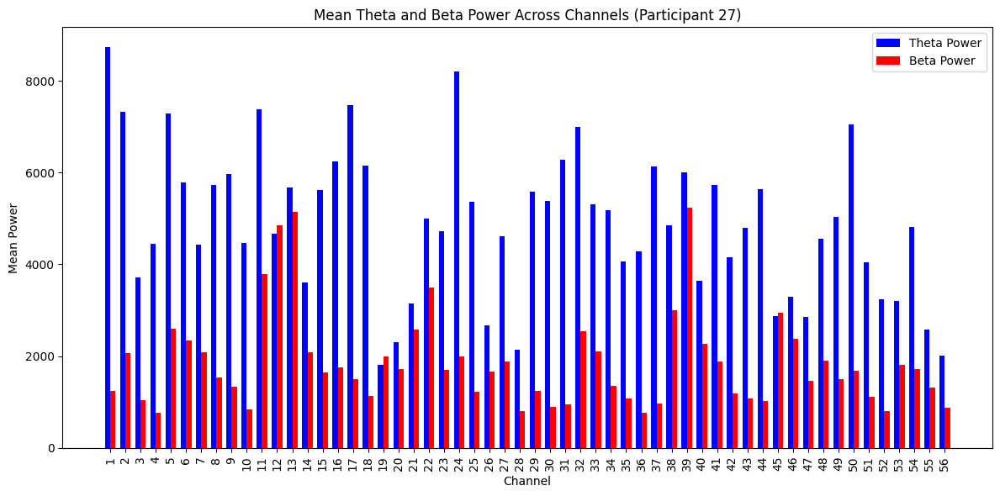

Participant 27: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 7.01288533077359
Participant 27: Top Channels by TBR: [ 1 31 37 30  4]
Selected Data Shape for Participant 28: (385, 56, 259)


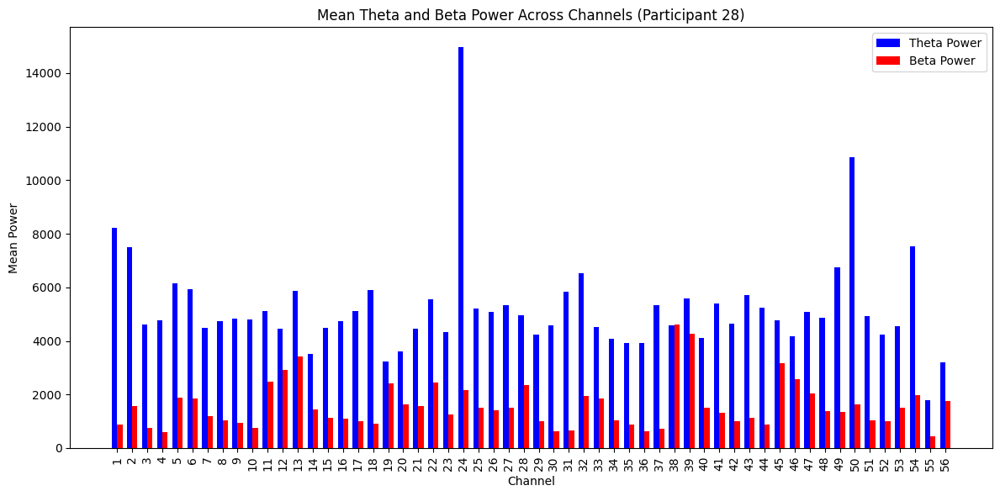

Participant 28: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 9.40393822192152
Participant 28: Top Channels by TBR: [ 1 31  4 37 30]
Selected Data Shape for Participant 29: (385, 56, 260)


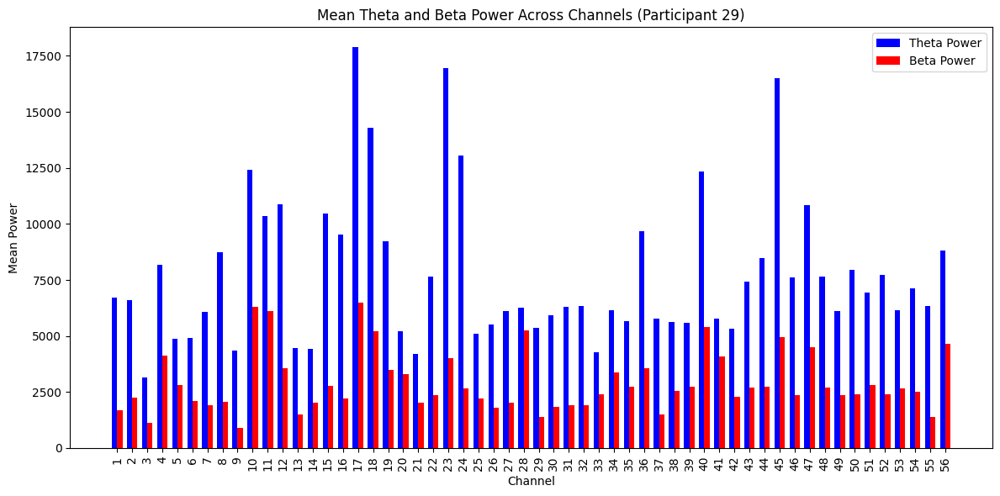

Participant 29: Relevant Channel Index: 24
Highest Theta-to-Beta Ratio (TBR): 4.898731363570377
Participant 29: Top Channels by TBR: [24  9 55 16  8]
Selected Data Shape for Participant 30: (385, 56, 290)


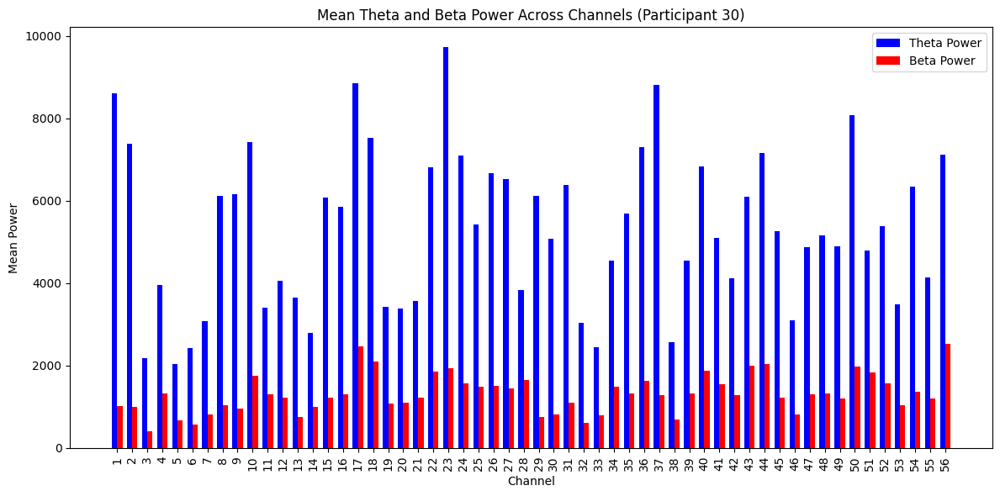

Participant 30: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 8.461414930167745
Participant 30: Top Channels by TBR: [ 1 29  2 37  9]
Selected Data Shape for Participant 31: (385, 56, 287)


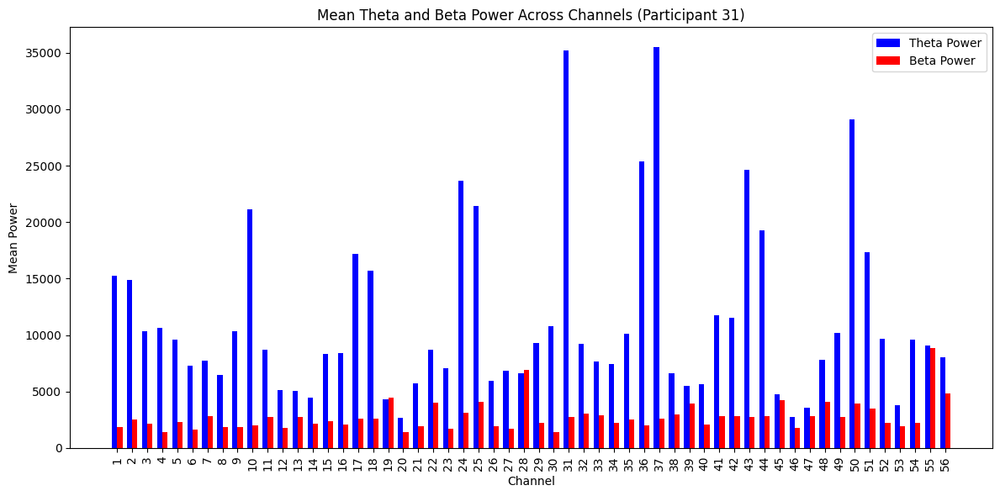

Participant 31: Relevant Channel Index: 37
Highest Theta-to-Beta Ratio (TBR): 13.479241731015668
Participant 31: Top Channels by TBR: [37 36 31 10 43]
Selected Data Shape for Participant 32: (385, 56, 229)


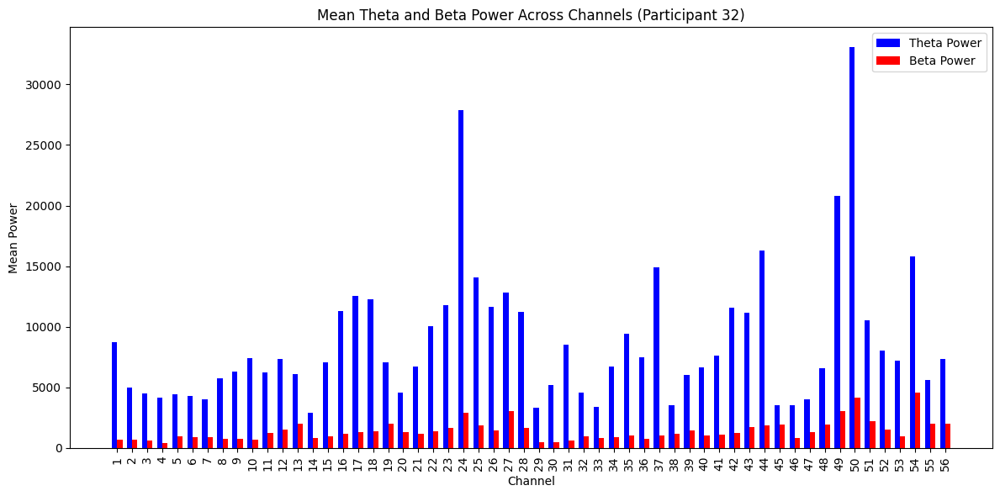

Participant 32: Relevant Channel Index: 37
Highest Theta-to-Beta Ratio (TBR): 14.445705390068884
Participant 32: Top Channels by TBR: [37 31  1 10  4]
Selected Data Shape for Participant 33: (385, 56, 172)


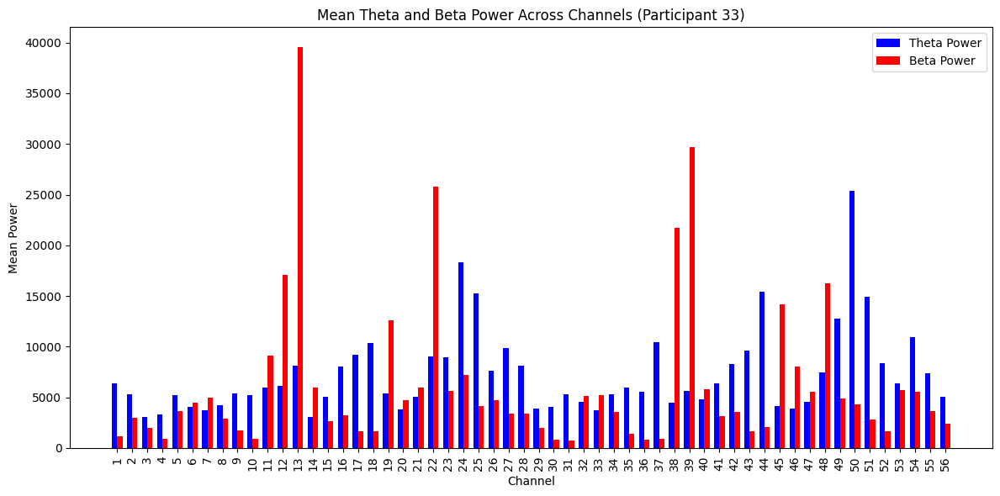

Participant 33: Relevant Channel Index: 37
Highest Theta-to-Beta Ratio (TBR): 11.831586866980595
Participant 33: Top Channels by TBR: [37 44 36 31 18]
Selected Data Shape for Participant 34: (385, 56, 219)


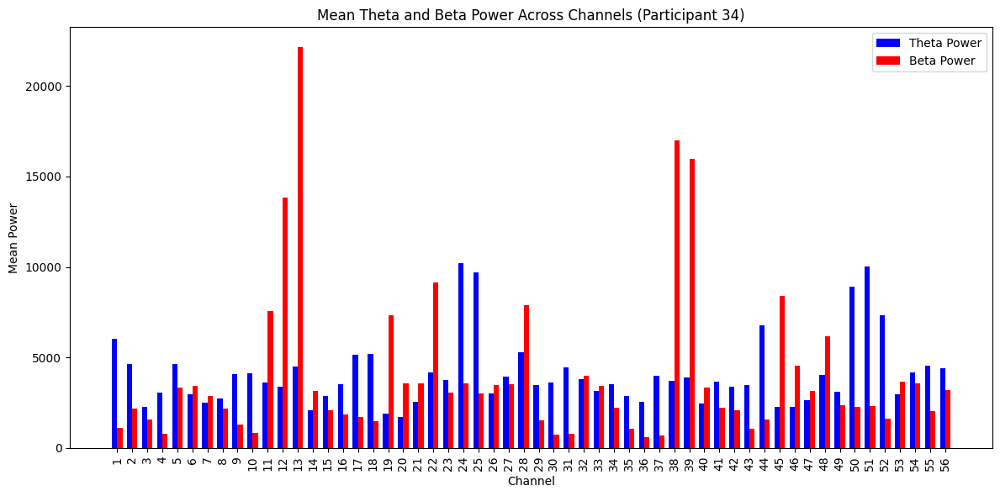

Participant 34: Relevant Channel Index: 37
Highest Theta-to-Beta Ratio (TBR): 5.775610747835249
Participant 34: Top Channels by TBR: [37 31  1 10 30]
Selected Data Shape for Participant 35: (385, 56, 217)


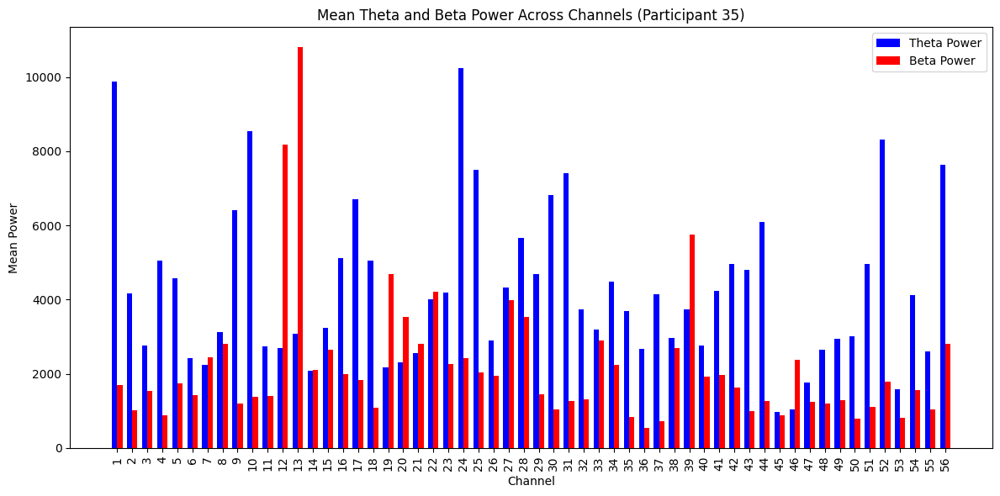

Participant 35: Relevant Channel Index: 30
Highest Theta-to-Beta Ratio (TBR): 6.471295601712787
Participant 35: Top Channels by TBR: [30 10 31  1  4]
Selected Data Shape for Participant 36: (385, 56, 129)


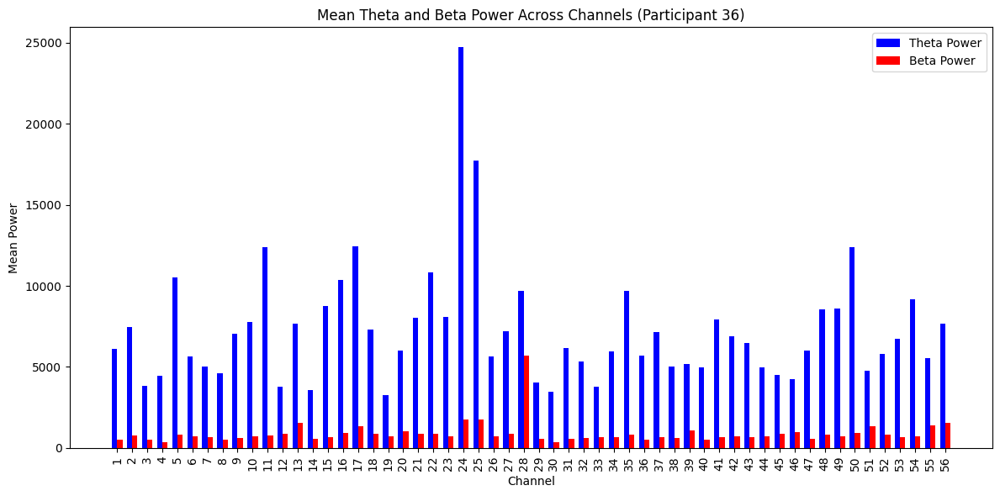

Participant 36: Relevant Channel Index: 11
Highest Theta-to-Beta Ratio (TBR): 15.825473204789946
Participant 36: Top Channels by TBR: [11 24 50  5 54]
Selected Data Shape for Participant 37: (385, 56, 187)


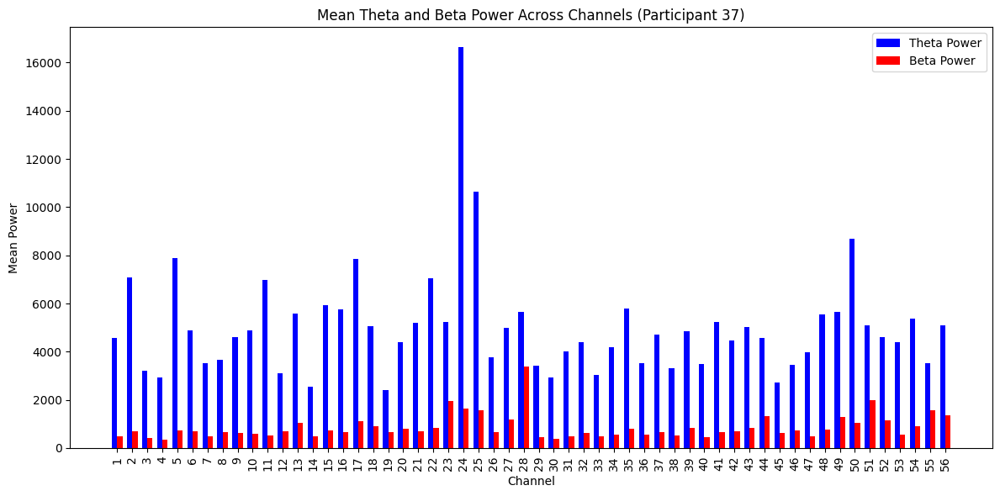

Participant 37: Relevant Channel Index: 11
Highest Theta-to-Beta Ratio (TBR): 13.600966585325347
Participant 37: Top Channels by TBR: [11  5 24  2  1]
Selected Data Shape for Participant 38: (385, 56, 51)


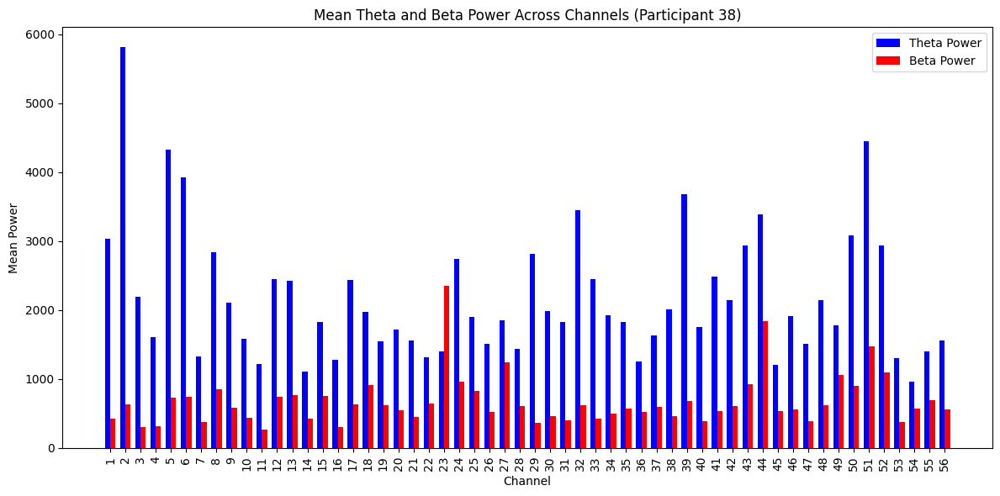

Participant 38: Relevant Channel Index: 2
Highest Theta-to-Beta Ratio (TBR): 9.14114524685725
Participant 38: Top Channels by TBR: [ 2 29  3  1  5]
Selected Data Shape for Participant 39: (385, 56, 269)


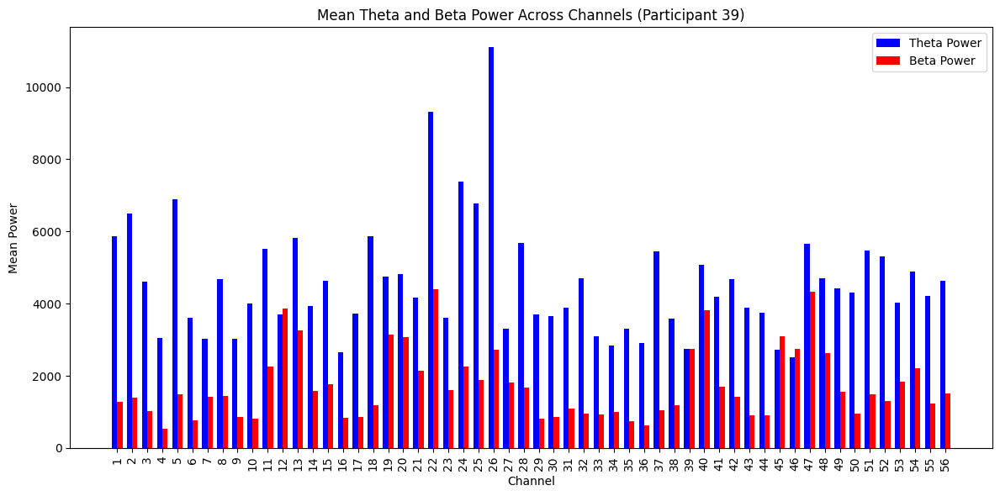

Participant 39: Relevant Channel Index: 4
Highest Theta-to-Beta Ratio (TBR): 5.699672012378619
Participant 39: Top Channels by TBR: [ 4 37 10 32 18]
Selected Data Shape for Participant 40: (385, 56, 234)


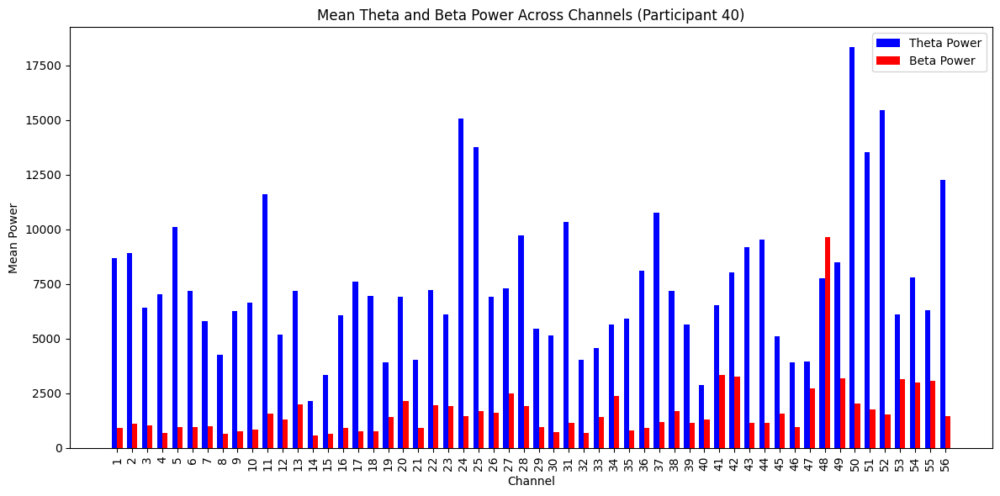

Participant 40: Relevant Channel Index: 4
Highest Theta-to-Beta Ratio (TBR): 10.448466952385031
Participant 40: Top Channels by TBR: [ 4 24  5 52 17]
Selected Data Shape for Participant 41: (385, 56, 124)


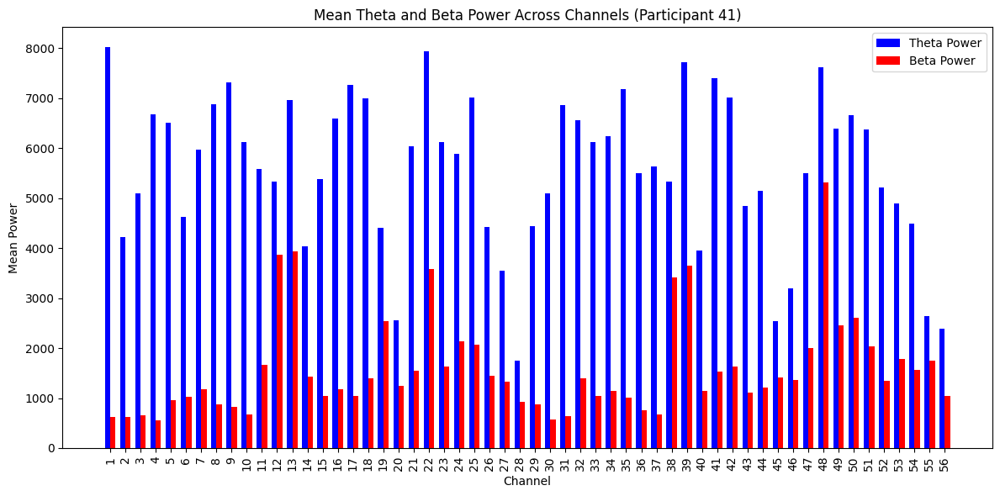

Participant 41: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 12.963298716956746
Participant 41: Top Channels by TBR: [ 1  4 31 10  9]
Selected Data Shape for Participant 42: (385, 56, 204)


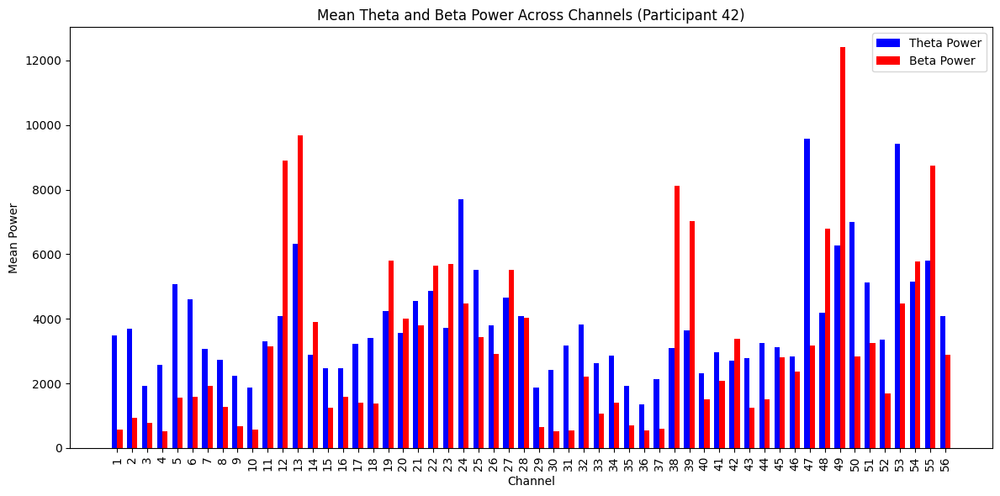

Participant 42: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 6.129085989350678
Participant 42: Top Channels by TBR: [ 1 31  4 30  2]
Selected Data Shape for Participant 43: (385, 56, 262)


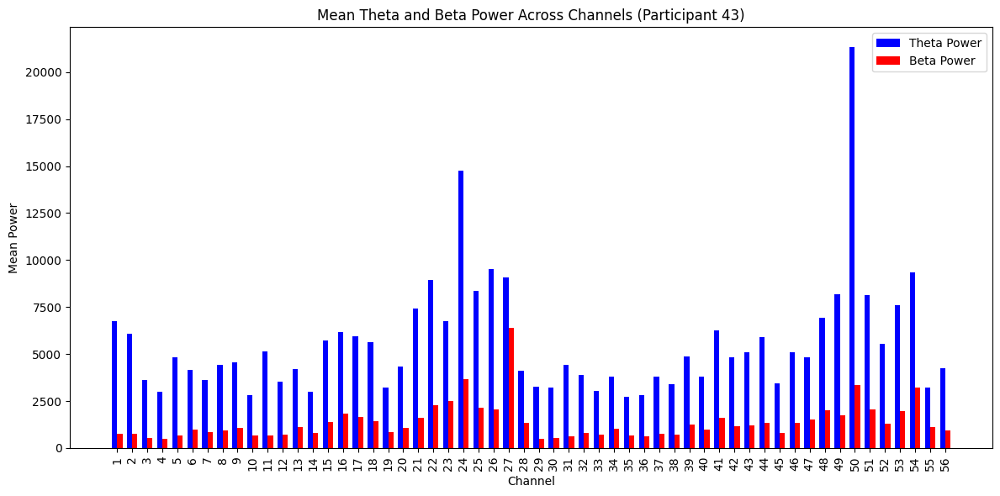

Participant 43: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 8.699819547519688
Participant 43: Top Channels by TBR: [ 1  2 11 31  5]
Selected Data Shape for Participant 44: (385, 56, 254)


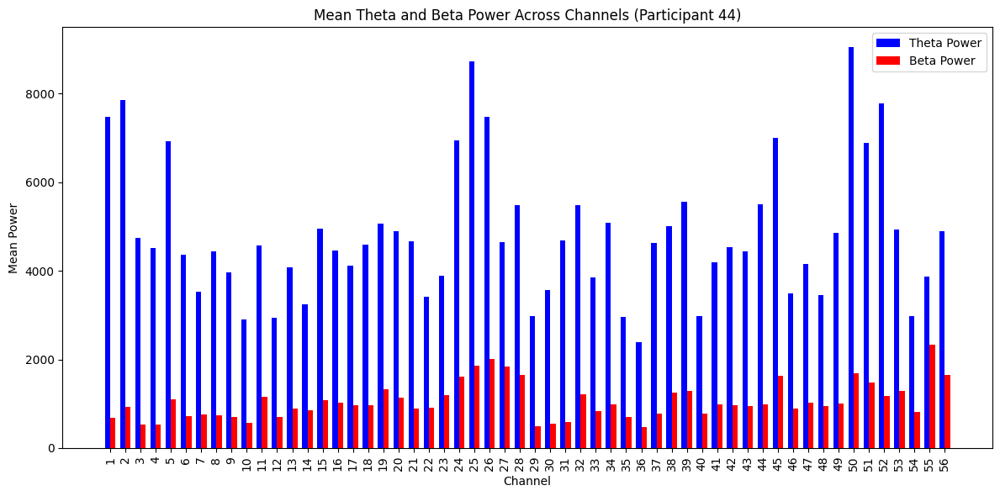

Participant 44: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 10.947029474693585
Participant 44: Top Channels by TBR: [ 1  3  4  2 31]
Selected Data Shape for Participant 45: (385, 56, 142)


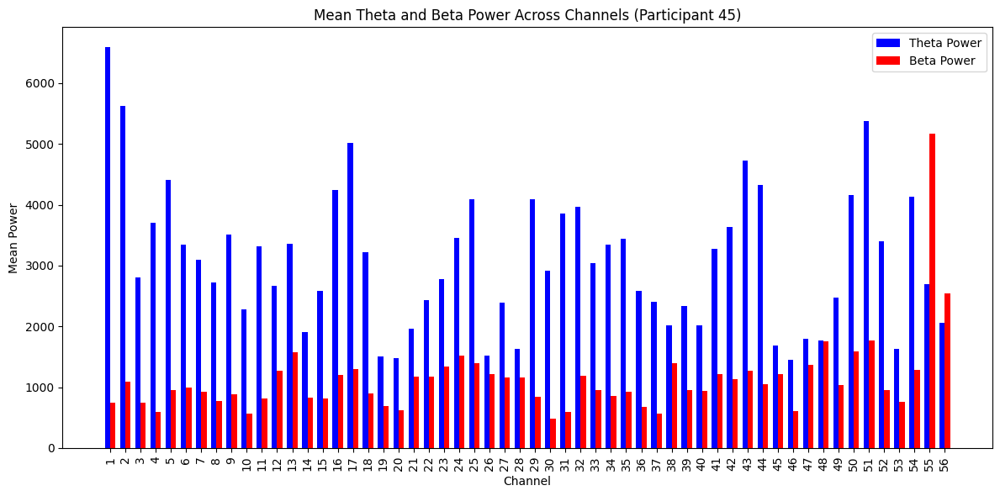

Participant 45: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 8.84987310038552
Participant 45: Top Channels by TBR: [ 1 31  4 30  2]
Selected Data Shape for Participant 46: (385, 56, 270)


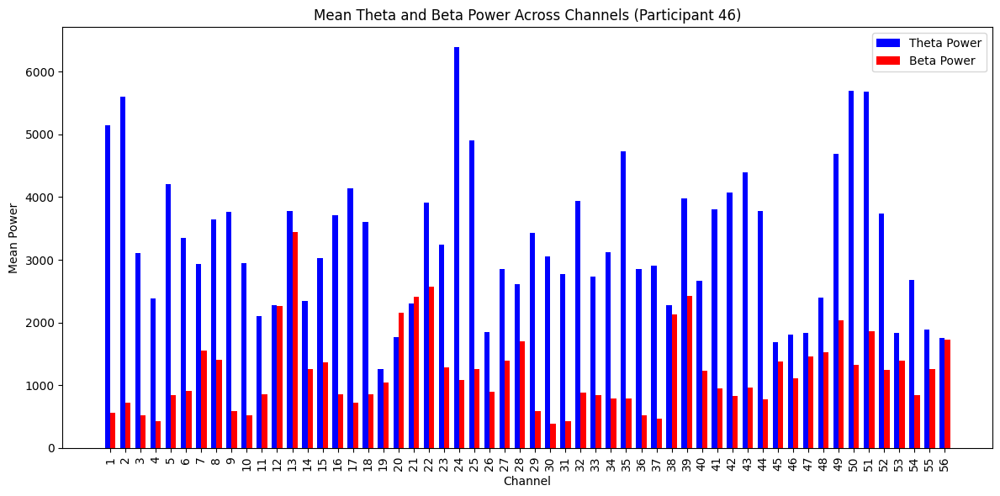

Participant 46: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 9.135883307359894
Participant 46: Top Channels by TBR: [ 1 30  2 31  9]
Selected Data Shape for Participant 47: (385, 56, 219)


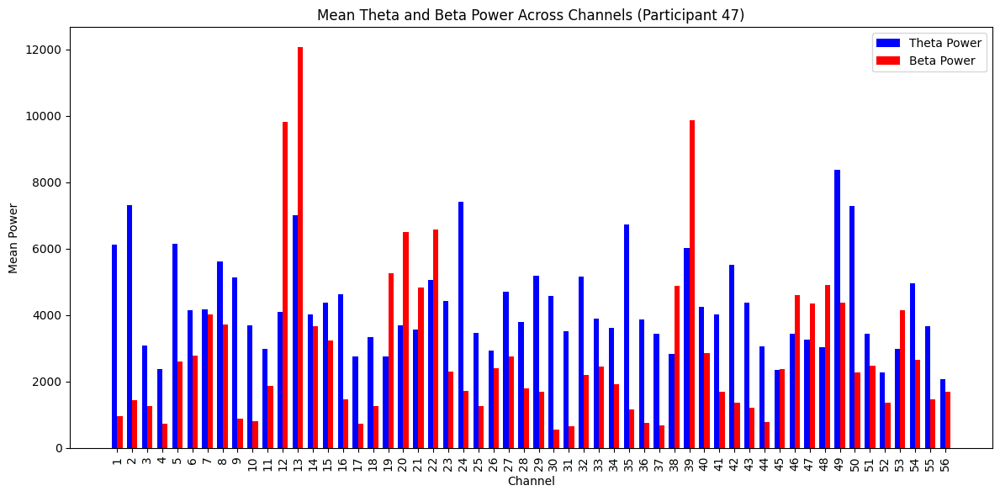

Participant 47: Relevant Channel Index: 30
Highest Theta-to-Beta Ratio (TBR): 8.279830086788
Participant 47: Top Channels by TBR: [30  1  9 35 31]
Selected Data Shape for Participant 48: (385, 56, 283)


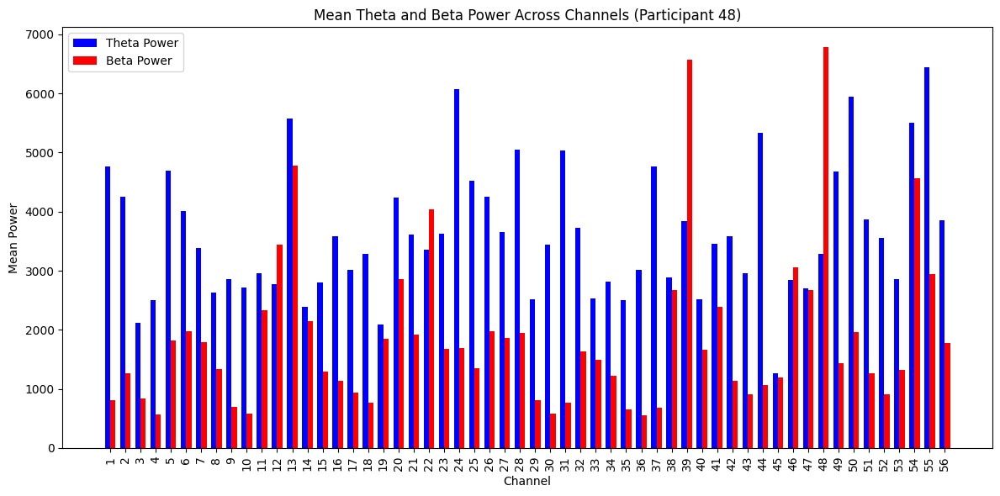

Participant 48: Relevant Channel Index: 37
Highest Theta-to-Beta Ratio (TBR): 6.951719094298577
Participant 48: Top Channels by TBR: [37 31  1 30 36]


In [ ]:
#
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
import scipy.io

# Step 1: Load the EEG data from a .mat file
mat_data = scipy.io.loadmat('/content/drive/MyDrive/EEG_dataset/ADHD_Files_combined.mat')

# Verify shape of the loaded data
eeg_data = mat_data['combined_data']
print(f"EEG Data Shape: {eeg_data.shape}")  # Check the data structure

# Step 2: Define the trial details for each participant
participant_trials = {
    5: 205, 6: 262, 7: 214, 8: 262, 9: 261, 10: 265,
    11: 285, 12: 255, 13: 213, 14: 238, 15: 168, 16: 125,
    17: 239, 18: 195, 19: 286, 20: 197, 21: 234, 22: 203,
    23: 223, 24: 265, 25: 255, 26: 226, 27: 264, 28: 259,
    29: 260, 30: 290, 31: 287, 32: 229, 33: 172, 34: 219,
    35: 217, 36: 129, 37: 187, 38: 51, 39: 269, 40: 234,
    41: 124, 42: 204, 43: 262, 44: 254, 45: 142, 46: 270,
    47: 219, 48: 283
}

# Step 3: Sampling frequency and parameters
fs = 256  # Sampling frequency (Hz)
nperseg = 128  # Number of points per segment for STFT

# Number of time points and channels
time_points, num_channels, _ = eeg_data.shape

# Step 4: Loop through each participant to plot the Theta and Beta power
for participant, num_trials in participant_trials.items():
    # Get the correct range of trials for the participant
    start_trial = sum([participant_trials[i] for i in range(5, participant)])  # Summing previous trials
    end_trial = start_trial + num_trials  # Get the end trial index for the current participant

    # Extract data for the current participant
    eeg_data_participant = eeg_data[:, :, start_trial:end_trial]

    # Verify the shape of the data slice for the participant
    print(f"Selected Data Shape for Participant {participant}: {eeg_data_participant.shape}")

    # Number of trials for this participant
    _, num_channels, num_trials = eeg_data_participant.shape

    # Initialize arrays to store power for Theta and Beta bands for each channel
    theta_power = np.zeros((num_channels, num_trials))  # (Channels x Trials)
    beta_power = np.zeros((num_channels, num_trials))   # (Channels x Trials)

    # Step 5: Apply STFT to each channel across the trials and calculate Theta and Beta power
    for channel in range(num_channels):
        for trial in range(num_trials):
            # Apply STFT to the trial and channel
            f, t, Zxx = stft(eeg_data_participant[:, channel, trial], fs=fs, nperseg=nperseg)

            # Magnitude of the STFT (frequency vs. time representation)
            magnitude = np.abs(Zxx)

            # Mask for Theta band (4-8 Hz)
            theta_mask = (f >= 4) & (f <= 8)
            # Mask for Beta band (13-30 Hz)
            beta_mask = (f >= 13) & (f <= 30)

            # Compute power in the Theta and Beta bands (sum of squared magnitude)
            theta_power[channel, trial] = np.sum(magnitude[theta_mask]**2)
            beta_power[channel, trial] = np.sum(magnitude[beta_mask]**2)

    # Step 6: Aggregate the power for Theta and Beta bands across trials for each channel
    mean_theta_power = np.mean(theta_power, axis=1)  # Mean Theta power for each channel
    mean_beta_power = np.mean(beta_power, axis=1)    # Mean Beta power for each channel

    # Step 7: Compute Theta-to-Beta Ratio (TBR) for each channel
    epsilon = 1e-10  # Prevent division by zero
    theta_to_beta_ratio = mean_theta_power / (mean_beta_power + epsilon)

    # Step 8: Visualize both Theta and Beta power in the same graph
    x = np.arange(num_channels)  # Channel indices for plotting
    width = 0.35  # Width of the bars

    # Create a grouped bar plot
    plt.figure(figsize=(12, 6))
    plt.bar(x - width/2, mean_theta_power, width, label='Theta Power', color='blue')
    plt.bar(x + width/2, mean_beta_power, width, label='Beta Power', color='red')

    # Labels and title
    plt.title(f'Mean Theta and Beta Power Across Channels (Participant {participant})')
    plt.xlabel('Channel')
    plt.ylabel('Mean Power')
    plt.xticks(x, range(1, num_channels+1), rotation=90)  # Displaying channel numbers on x-axis
    plt.legend()

    # Show the plot
    plt.tight_layout()
    plt.show()

    # Step 9: Find the channel with the highest TBR
    relevant_channel_index = np.argmax(theta_to_beta_ratio)
    relevant_channel_tbr = theta_to_beta_ratio[relevant_channel_index]
    print(f"Participant {participant}: Relevant Channel Index: {relevant_channel_index + 1}")
    print(f"Highest Theta-to-Beta Ratio (TBR): {relevant_channel_tbr}")

    # Optional: Sort channels by TBR to identify top channels
    sorted_indices = np.argsort(theta_to_beta_ratio)[::-1]  # Descending order
    print(f"Participant {participant}: Top Channels by TBR:", sorted_indices[:5] + 1)  # Display top 5 channels


EEG Data Shape: (385, 56, 10742)
Selected Data Shape for Participant 1: (385, 56, 257)


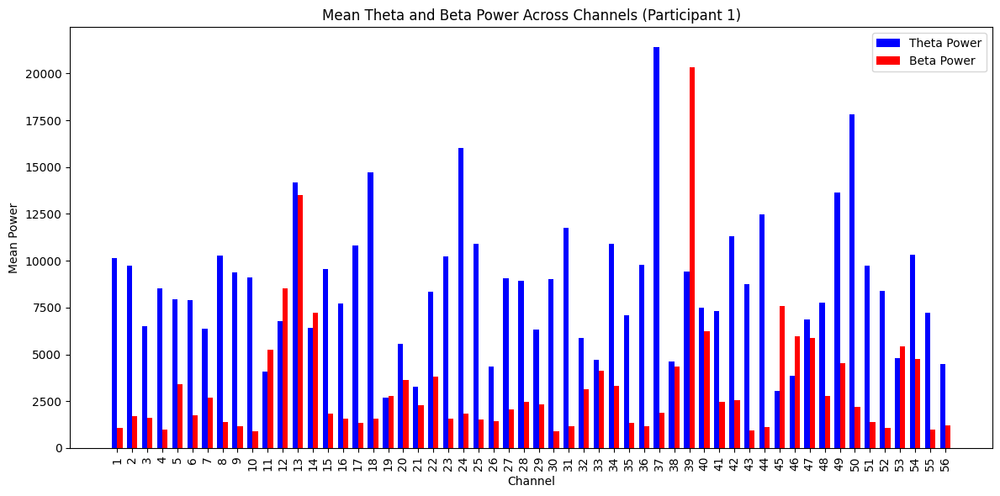

Participant 1: Relevant Channel Index: 37
Highest Theta-to-Beta Ratio (TBR): 11.462359919685221
Participant 1: Top Channels by TBR: [37 44 10 31 30]
Selected Data Shape for Participant 2: (385, 56, 279)


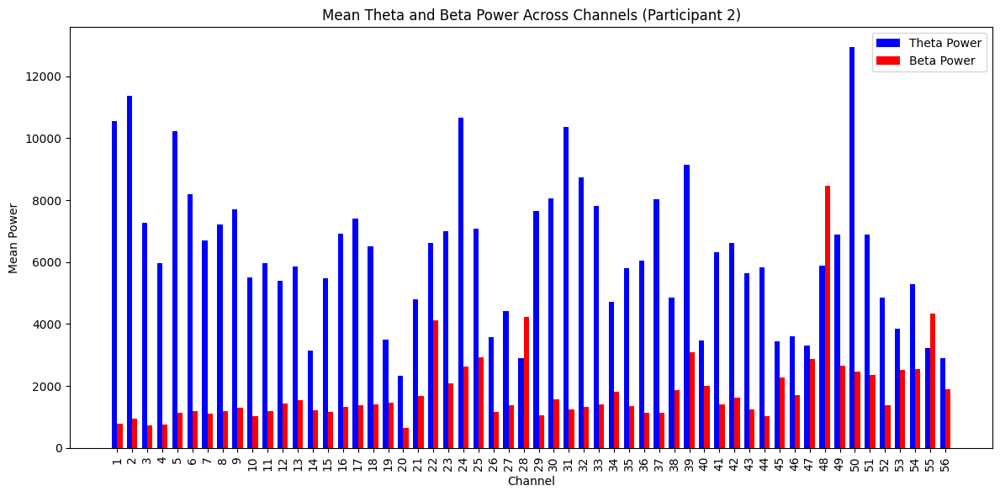

Participant 2: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 13.325479982243364
Participant 2: Top Channels by TBR: [ 1  2  3  5 31]
Selected Data Shape for Participant 3: (385, 56, 46)


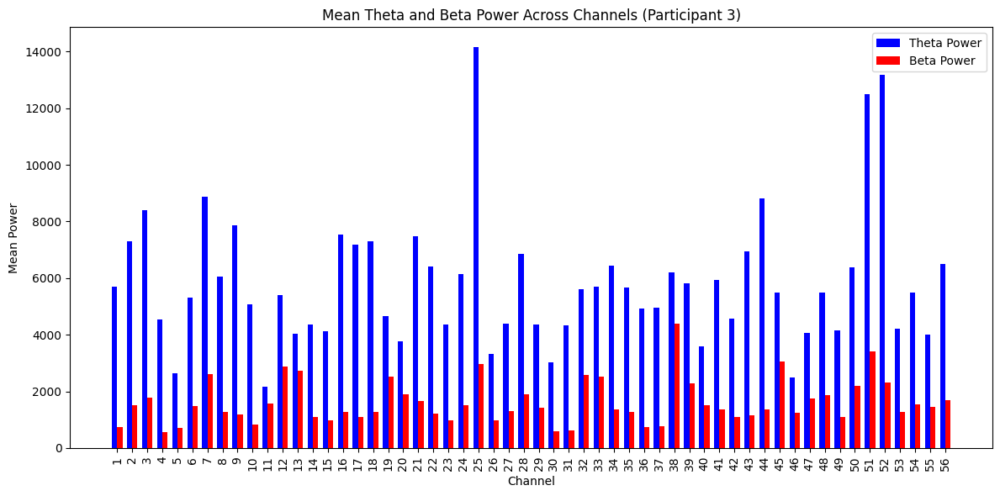

Participant 3: Relevant Channel Index: 4
Highest Theta-to-Beta Ratio (TBR): 8.232305446145238
Participant 3: Top Channels by TBR: [ 4  1 31 36  9]
Selected Data Shape for Participant 4: (385, 56, 259)


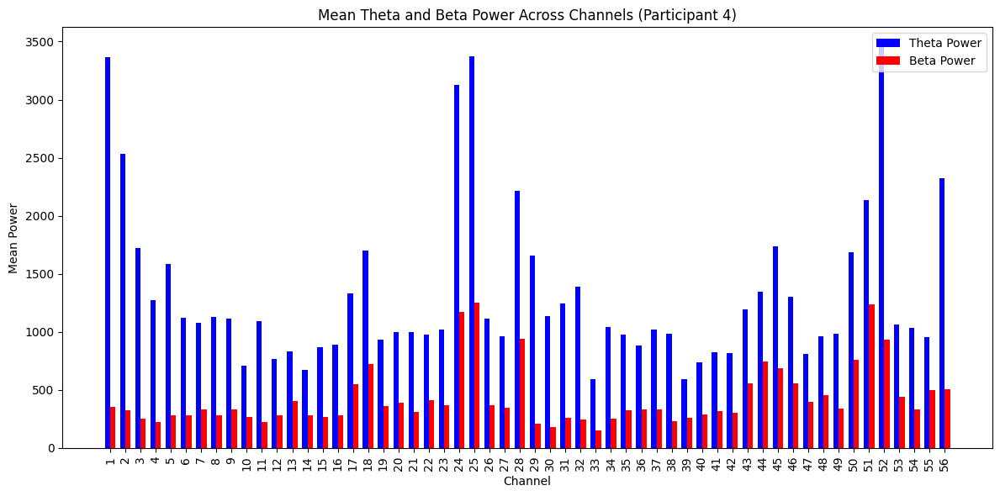

Participant 4: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 9.559332981621706
Participant 4: Top Channels by TBR: [ 1 29  2  3 30]
Selected Data Shape for Participant 5: (385, 56, 205)


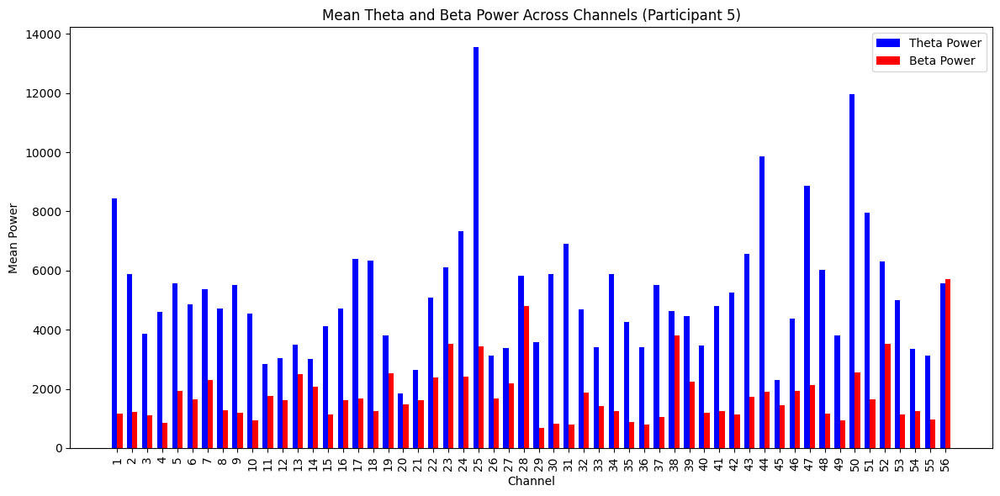

Participant 5: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 8.805401541257492
Participant 5: Top Channels by TBR: [31  1 30  4 37]
Selected Data Shape for Participant 6: (385, 56, 262)


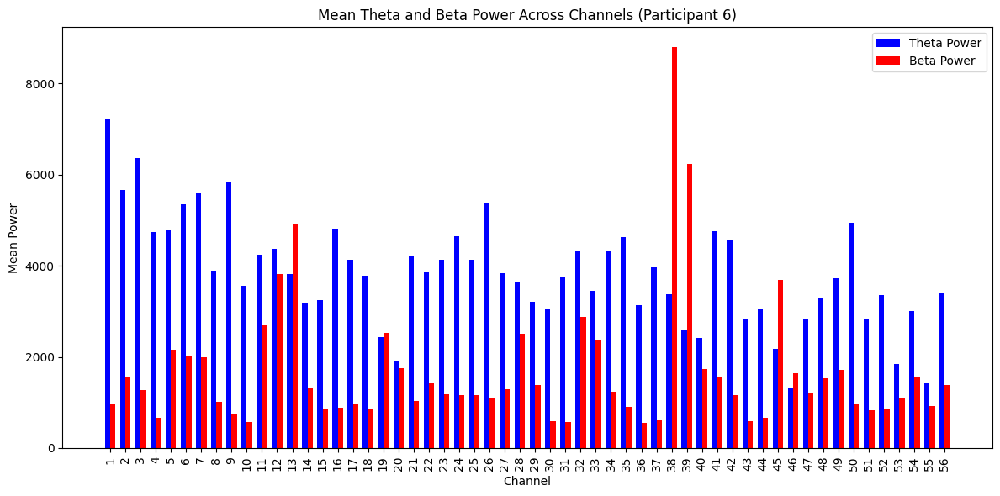

Participant 6: Relevant Channel Index: 9
Highest Theta-to-Beta Ratio (TBR): 7.88595227108046
Participant 6: Top Channels by TBR: [ 9  1  4 37 31]
Selected Data Shape for Participant 7: (385, 56, 214)


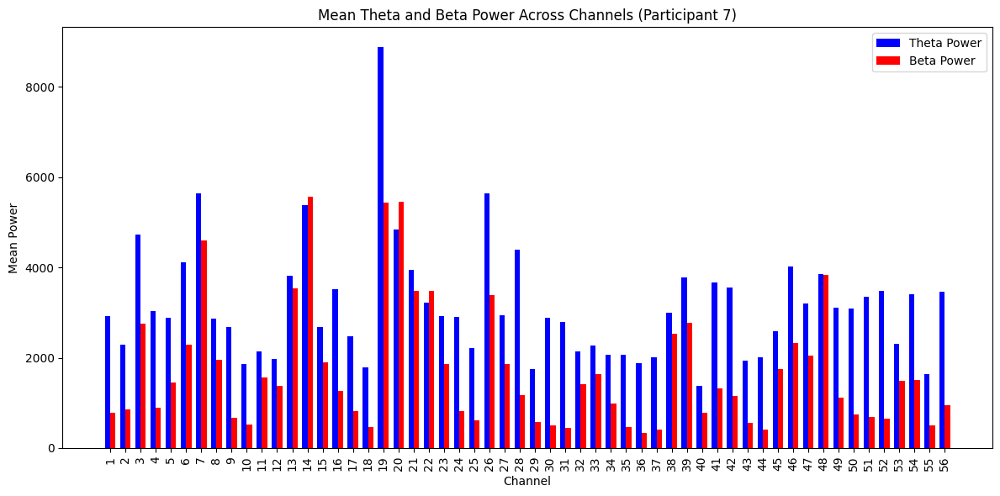

Participant 7: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 6.2137292811479785
Participant 7: Top Channels by TBR: [31 30 36 52 44]
Selected Data Shape for Participant 8: (385, 56, 262)


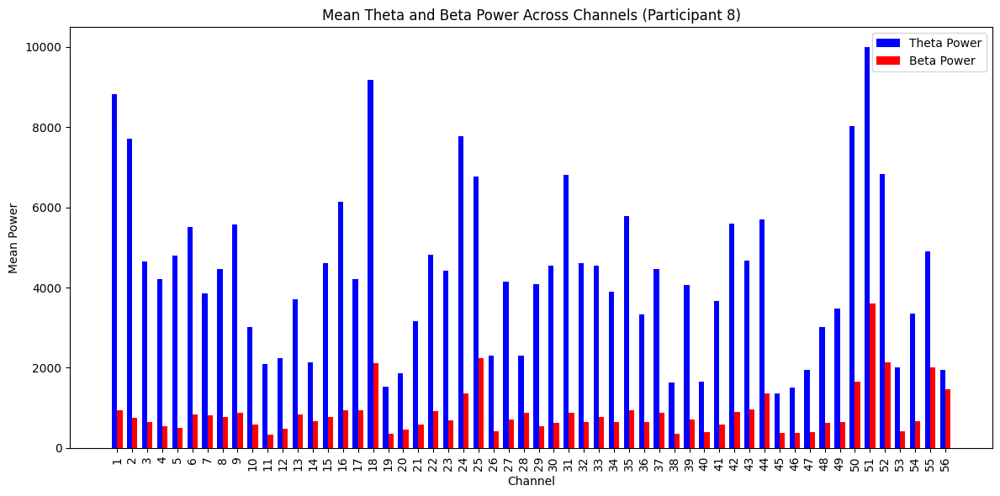

Participant 8: Relevant Channel Index: 2
Highest Theta-to-Beta Ratio (TBR): 10.356127625421799
Participant 8: Top Channels by TBR: [ 2  5  1  4 31]
Selected Data Shape for Participant 9: (385, 56, 261)


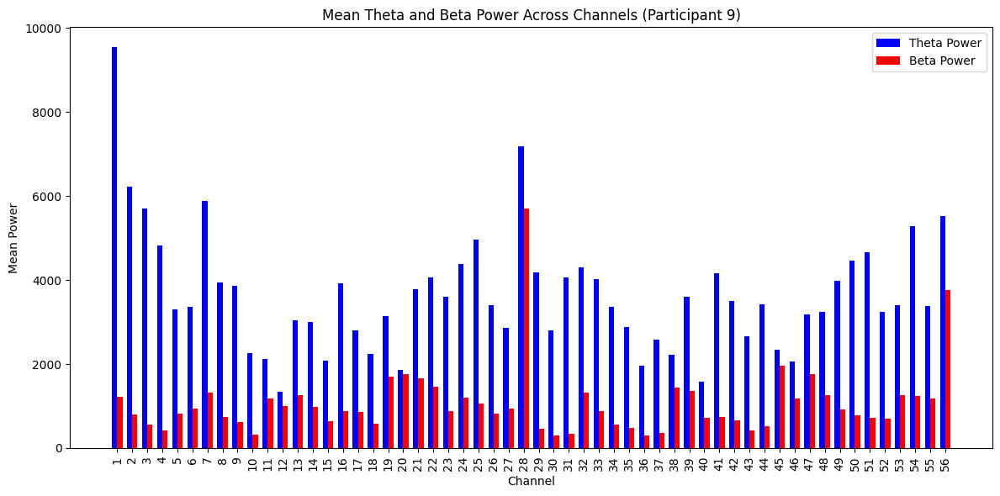

Participant 9: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 12.297986175351582
Participant 9: Top Channels by TBR: [31  4  3 30 29]
Selected Data Shape for Participant 10: (385, 56, 265)


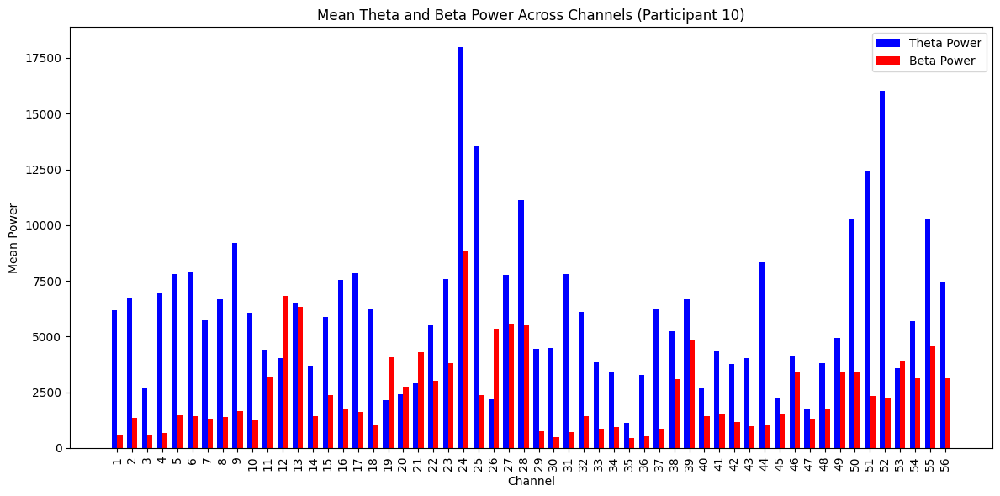

Participant 10: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 10.79994600622616
Participant 10: Top Channels by TBR: [31  1  4 30 44]
Selected Data Shape for Participant 11: (385, 56, 285)


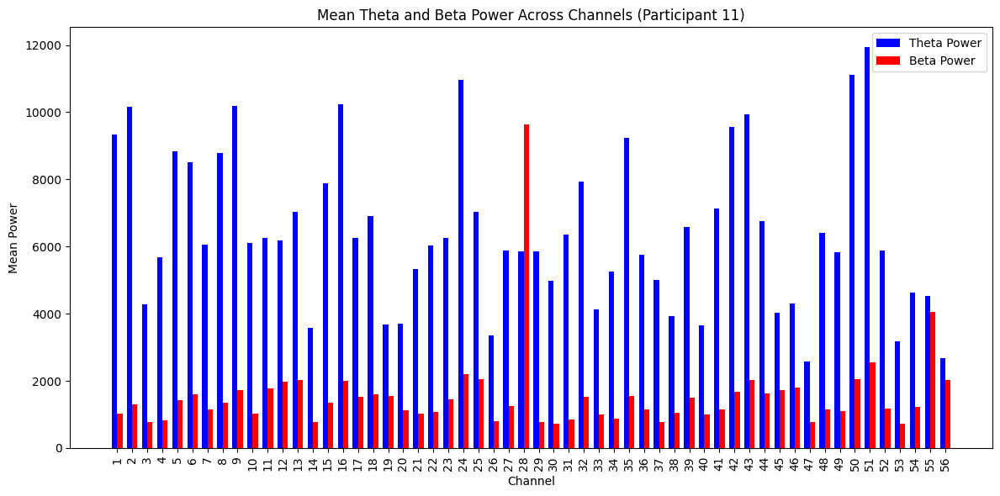

Participant 11: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 9.065521242253523
Participant 11: Top Channels by TBR: [ 1  2 29 31 30]
Selected Data Shape for Participant 12: (385, 56, 255)


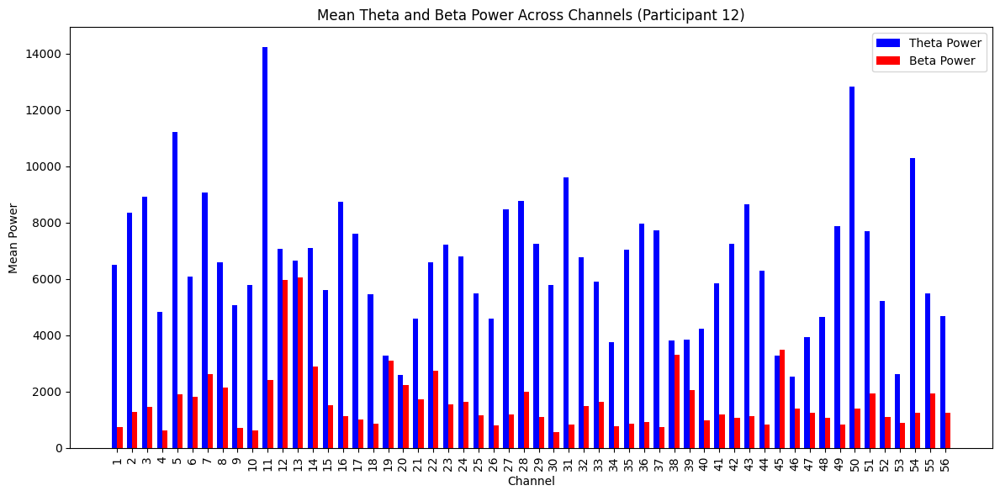

Participant 12: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 11.406872331326904
Participant 12: Top Channels by TBR: [31 37 30 10 49]
Selected Data Shape for Participant 13: (385, 56, 213)


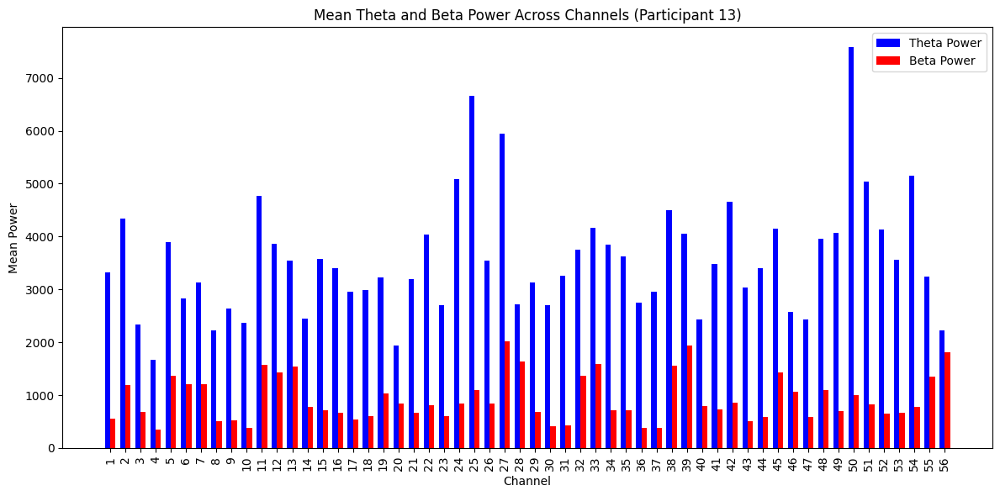

Participant 13: Relevant Channel Index: 37
Highest Theta-to-Beta Ratio (TBR): 7.801571569579707
Participant 13: Top Channels by TBR: [37 31 50 36 54]
Selected Data Shape for Participant 14: (385, 56, 238)


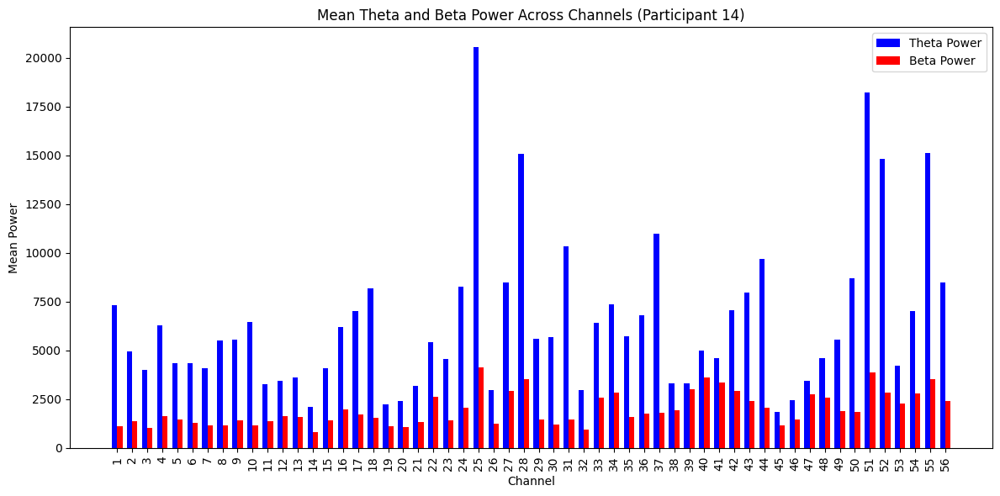

Participant 14: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 7.0571548602751735
Participant 14: Top Channels by TBR: [31  1 37 10 18]
Selected Data Shape for Participant 15: (385, 56, 168)


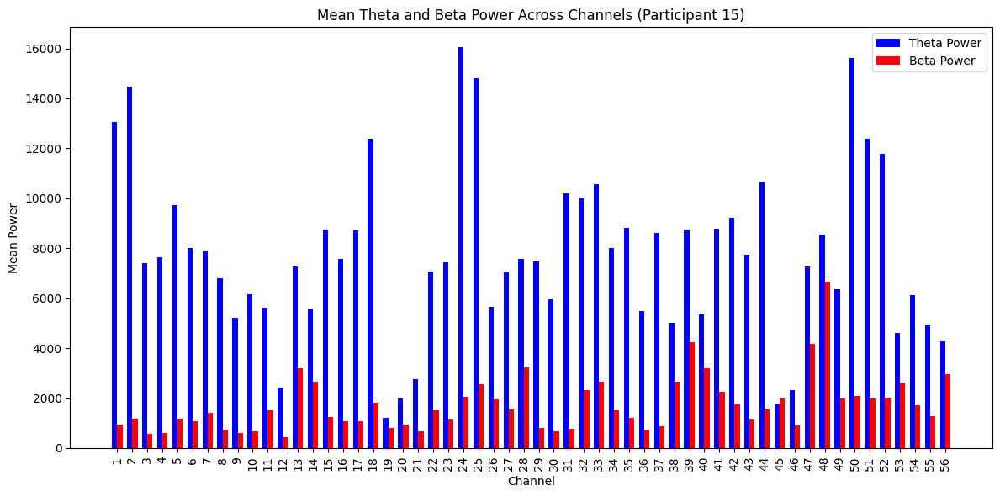

Participant 15: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 14.133155853149514
Participant 15: Top Channels by TBR: [ 1 31  3  4  2]
Selected Data Shape for Participant 16: (385, 56, 125)


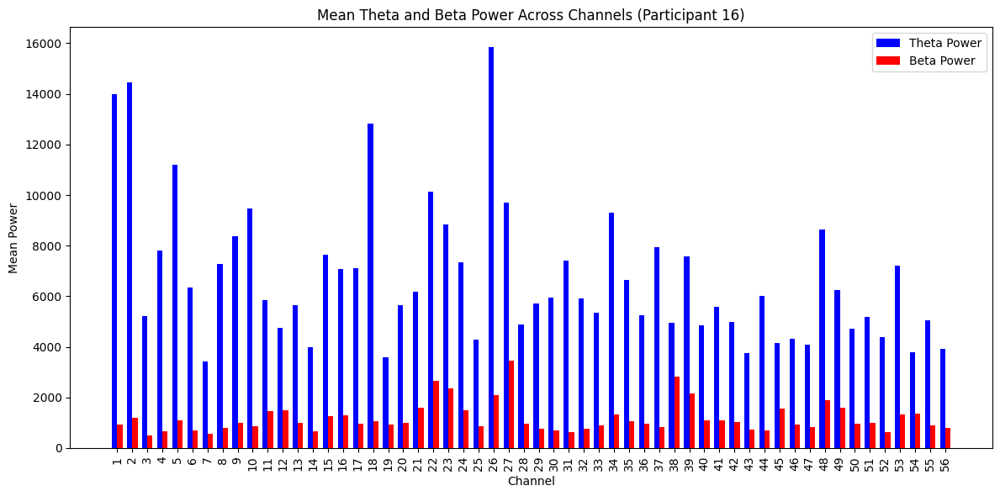

Participant 16: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 14.942098688044616
Participant 16: Top Channels by TBR: [ 1  2 18  4 31]
Selected Data Shape for Participant 17: (385, 56, 239)


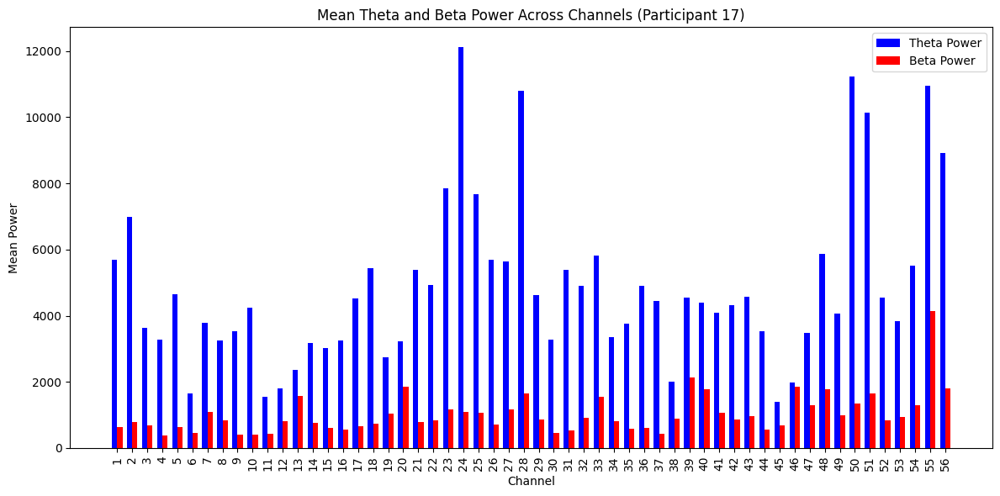

Participant 17: Relevant Channel Index: 24
Highest Theta-to-Beta Ratio (TBR): 11.069852781609985
Participant 17: Top Channels by TBR: [24 31 37 10  2]
Selected Data Shape for Participant 18: (385, 56, 195)


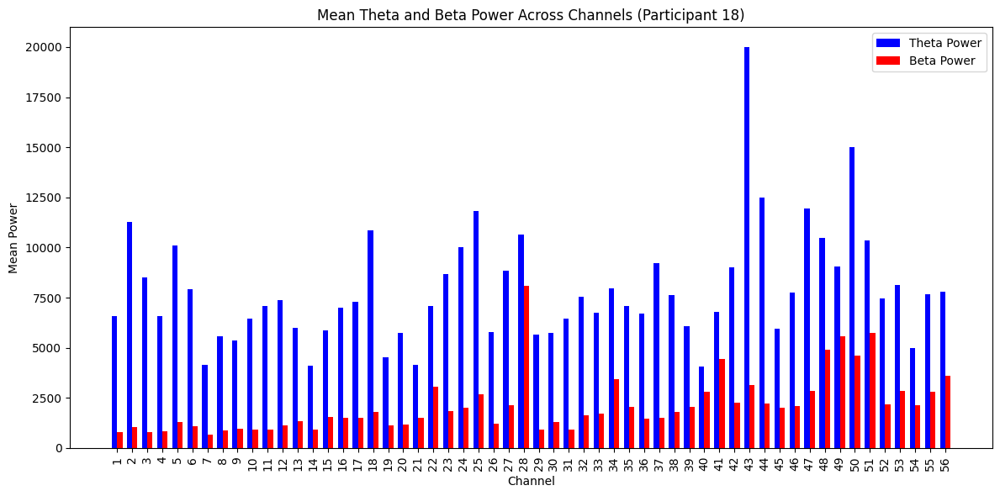

Participant 18: Relevant Channel Index: 3
Highest Theta-to-Beta Ratio (TBR): 10.968046144713993
Participant 18: Top Channels by TBR: [ 3  2  1 11  4]
Selected Data Shape for Participant 19: (385, 56, 286)


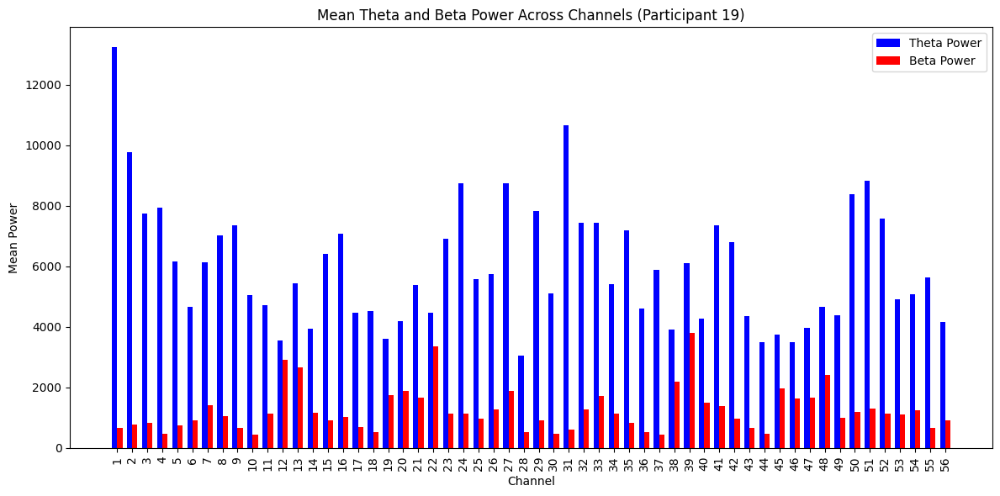

Participant 19: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 19.571546235897134
Participant 19: Top Channels by TBR: [ 1 31  4 37  2]
Selected Data Shape for Participant 20: (385, 56, 197)


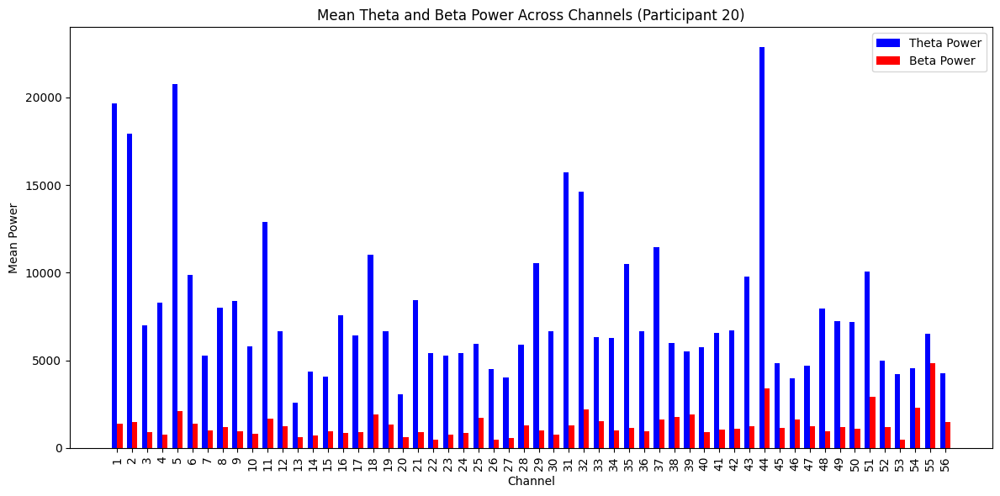

Participant 20: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 13.954915756844459
Participant 20: Top Channels by TBR: [ 1 31  2 22 29]
Selected Data Shape for Participant 21: (385, 56, 234)


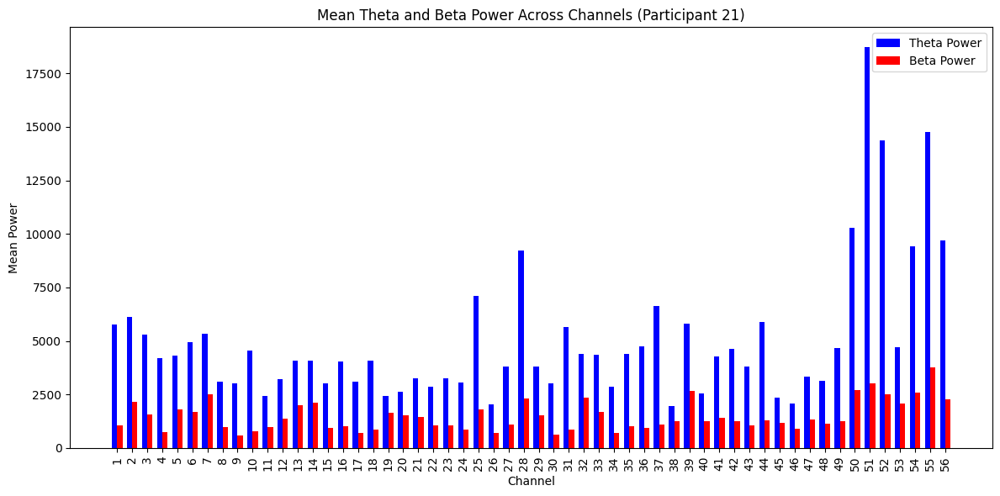

Participant 21: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 6.593692591133721
Participant 21: Top Channels by TBR: [31 51 37 10 52]
Selected Data Shape for Participant 22: (385, 56, 203)


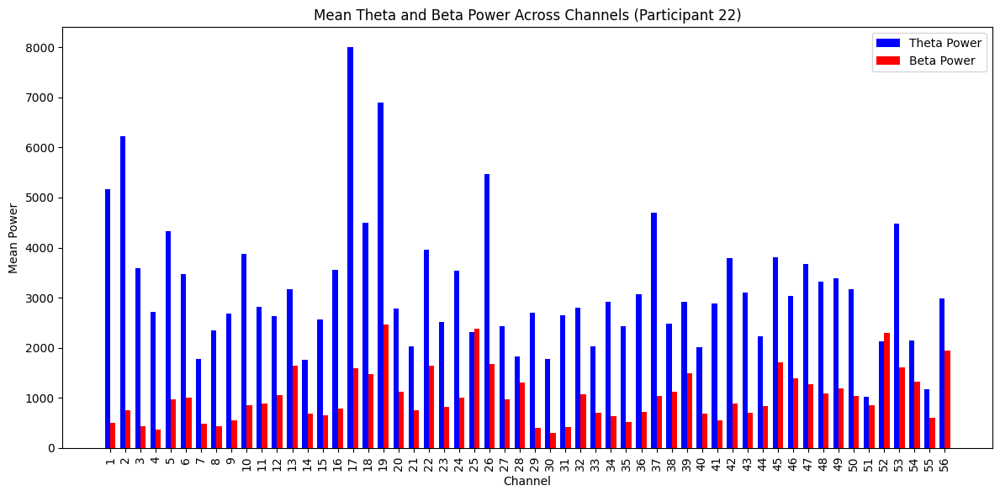

Participant 22: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 10.422694537856033
Participant 22: Top Channels by TBR: [ 1  2  3  4 29]
Selected Data Shape for Participant 23: (385, 56, 223)


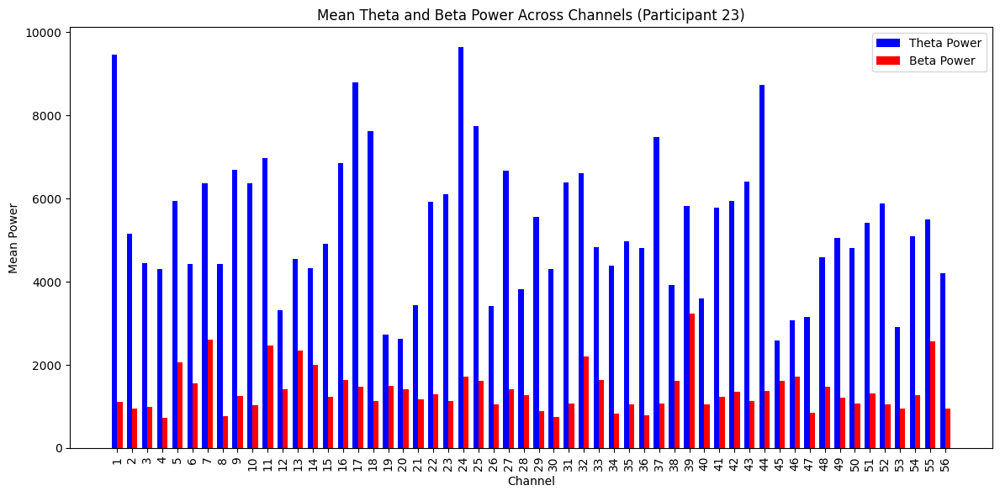

Participant 23: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 8.53694180594088
Participant 23: Top Channels by TBR: [ 1 37 18 44 29]
Selected Data Shape for Participant 24: (385, 56, 265)


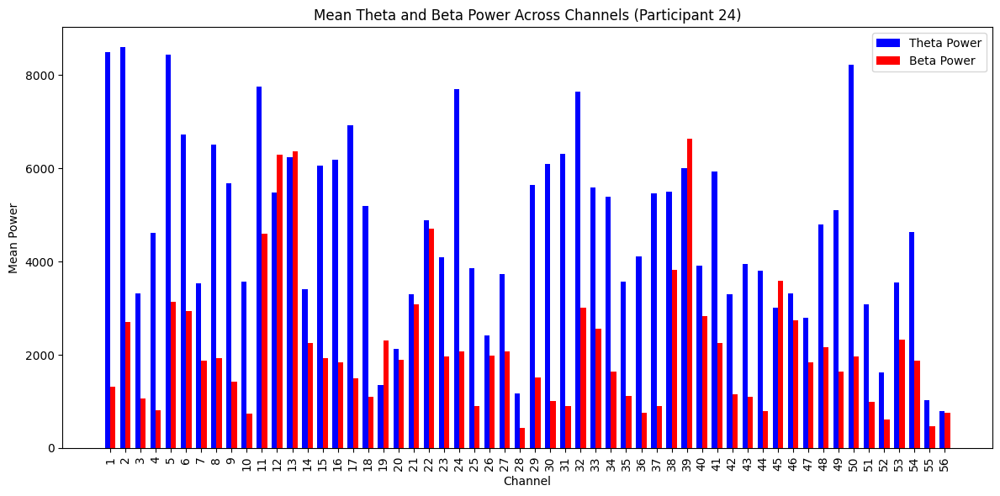

Participant 24: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 6.958110042402156
Participant 24: Top Channels by TBR: [31  1 37 30  4]
Selected Data Shape for Participant 25: (385, 56, 255)


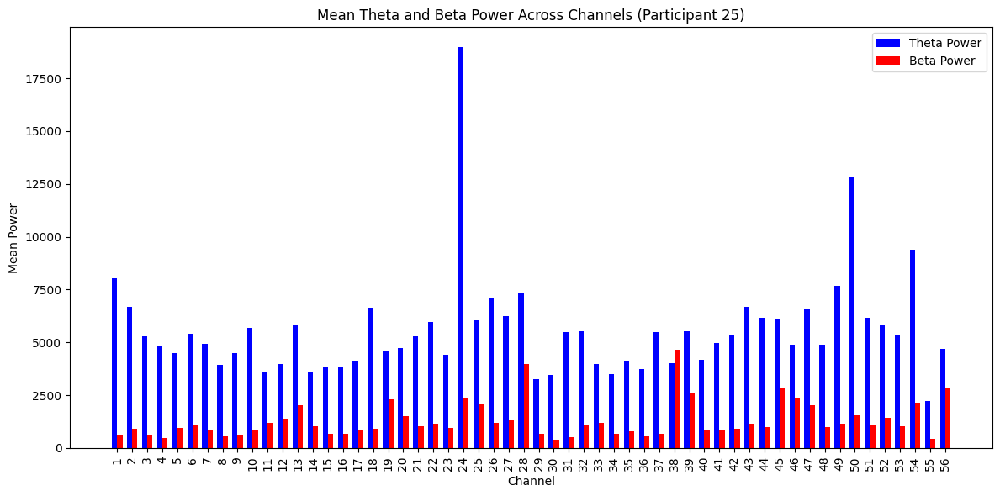

Participant 25: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 12.595669152030798
Participant 25: Top Channels by TBR: [ 1 31  4  3 30]
Selected Data Shape for Participant 26: (385, 56, 226)


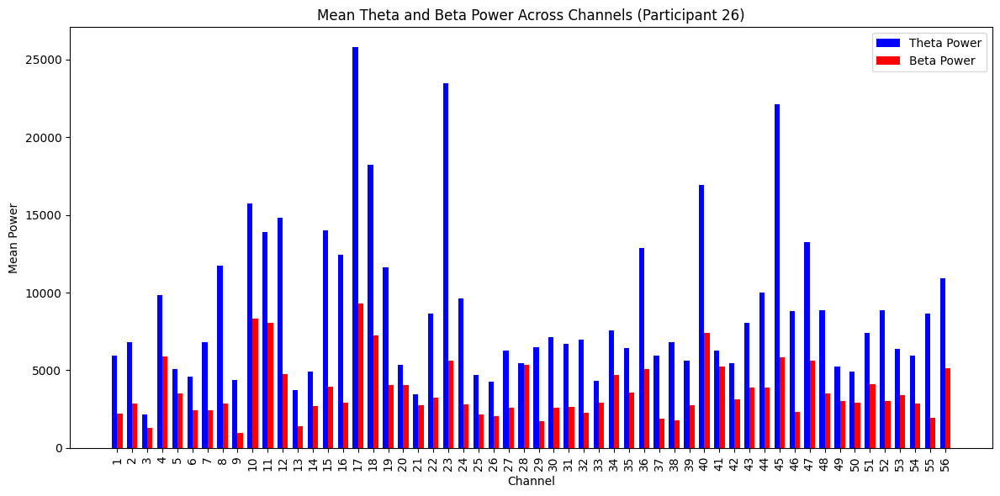

Participant 26: Relevant Channel Index: 9
Highest Theta-to-Beta Ratio (TBR): 4.584412490291439
Participant 26: Top Channels by TBR: [ 9 55 16 23  8]
Selected Data Shape for Participant 27: (385, 56, 264)


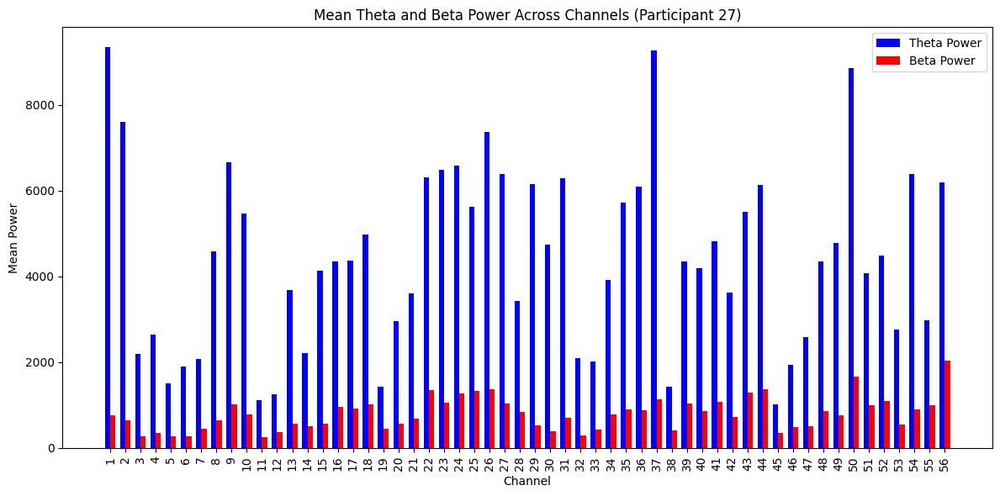

Participant 27: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 12.39074067646335
Participant 27: Top Channels by TBR: [ 1 30  2 29 31]
Selected Data Shape for Participant 28: (385, 56, 259)


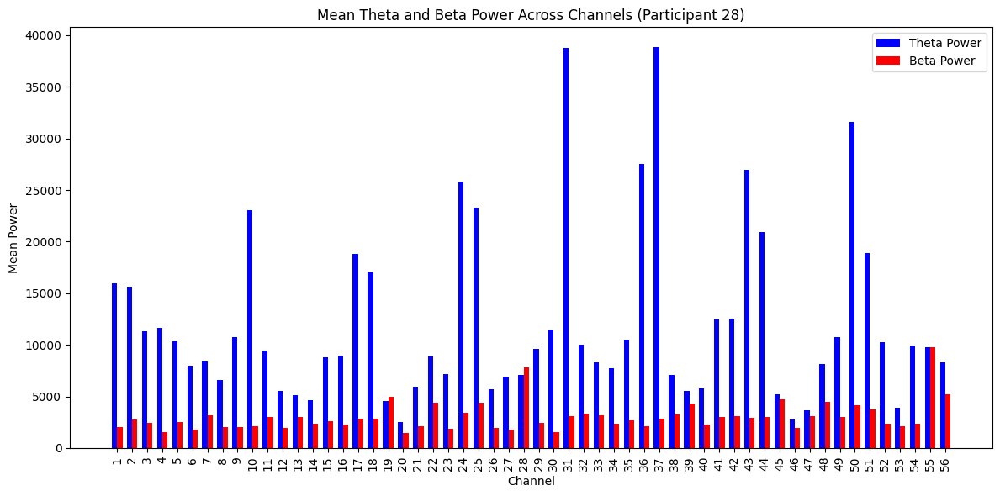

Participant 28: Relevant Channel Index: 37
Highest Theta-to-Beta Ratio (TBR): 13.721898247712007
Participant 28: Top Channels by TBR: [37 36 31 10 43]
Selected Data Shape for Participant 29: (385, 56, 260)


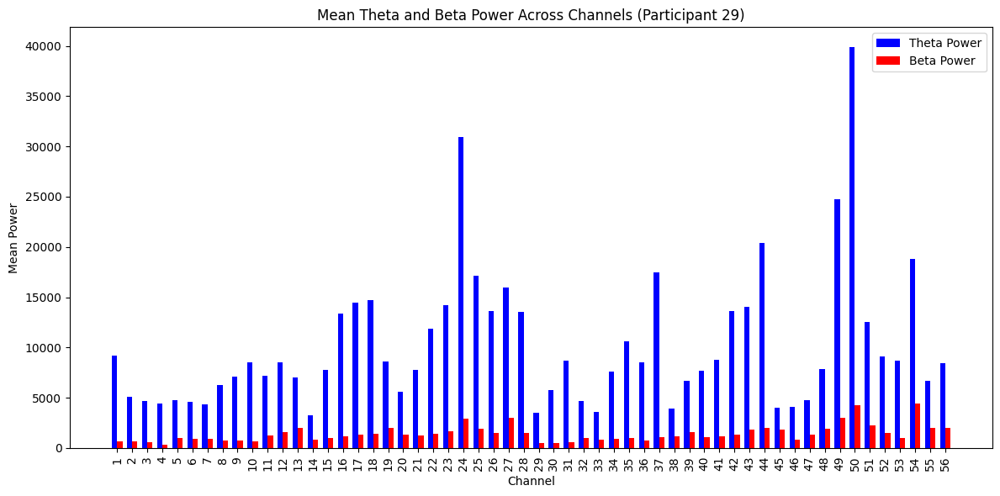

Participant 29: Relevant Channel Index: 37
Highest Theta-to-Beta Ratio (TBR): 15.931320285809214
Participant 29: Top Channels by TBR: [37 31  1  4 10]
Selected Data Shape for Participant 30: (385, 56, 290)


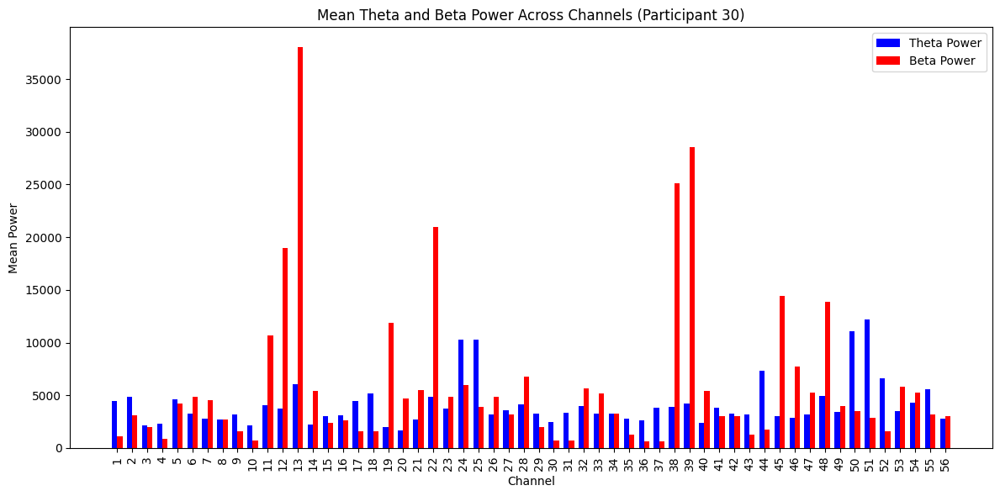

Participant 30: Relevant Channel Index: 37
Highest Theta-to-Beta Ratio (TBR): 5.762438208862616
Participant 30: Top Channels by TBR: [37 31 51 44 52]
Selected Data Shape for Participant 31: (385, 56, 287)


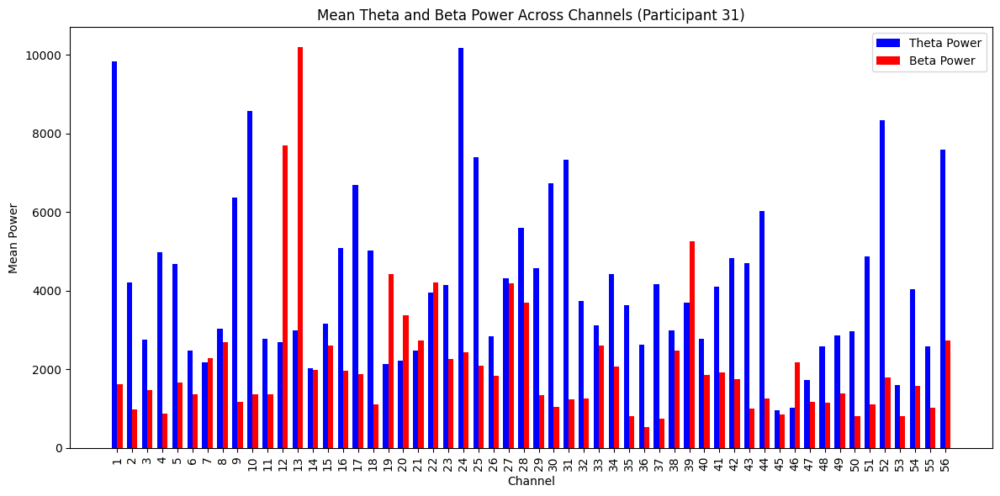

Participant 31: Relevant Channel Index: 30
Highest Theta-to-Beta Ratio (TBR): 6.490829082650157
Participant 31: Top Channels by TBR: [30 10  1 31  4]
Selected Data Shape for Participant 32: (385, 56, 229)


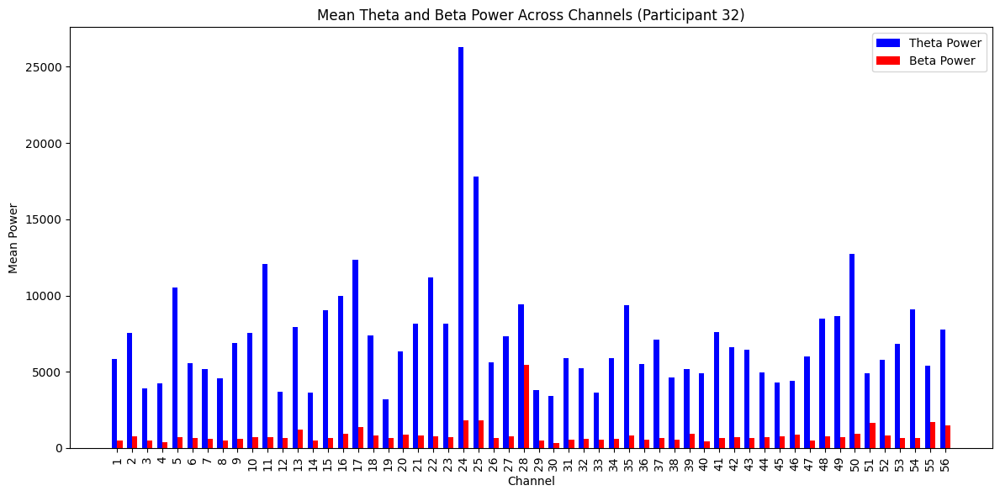

Participant 32: Relevant Channel Index: 11
Highest Theta-to-Beta Ratio (TBR): 16.661585204114093
Participant 32: Top Channels by TBR: [11 24 22  5 15]
Selected Data Shape for Participant 33: (385, 56, 172)


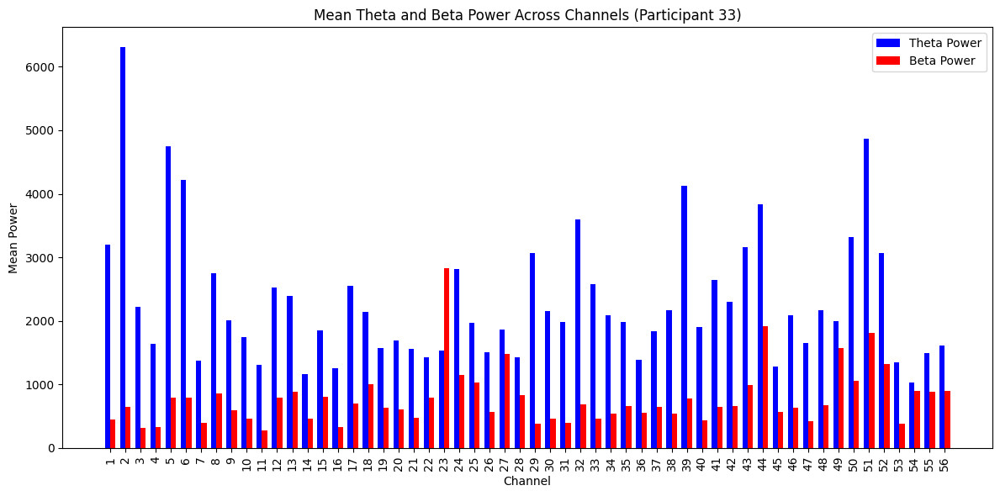

Participant 33: Relevant Channel Index: 2
Highest Theta-to-Beta Ratio (TBR): 9.716160262869312
Participant 33: Top Channels by TBR: [ 2 29  3  1  5]
Selected Data Shape for Participant 34: (385, 56, 219)


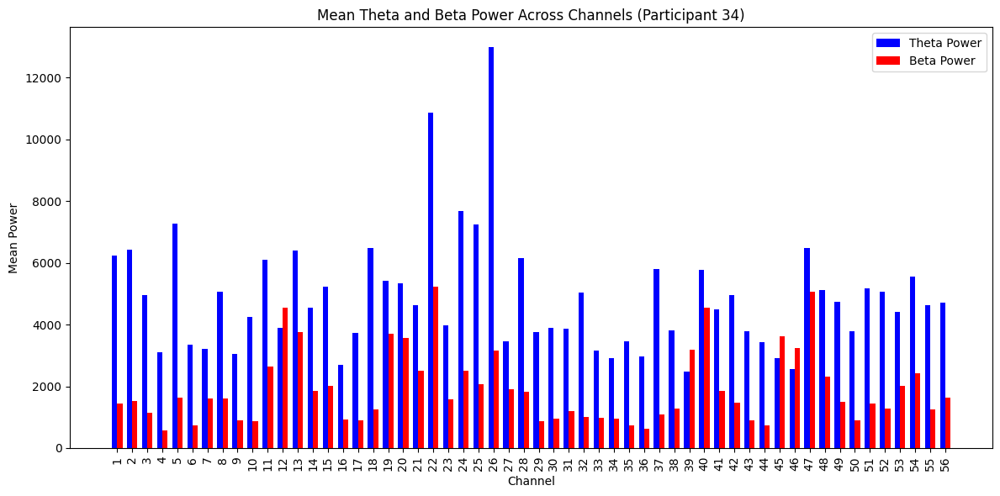

Participant 34: Relevant Channel Index: 4
Highest Theta-to-Beta Ratio (TBR): 5.535617180759519
Participant 34: Top Channels by TBR: [ 4 37 18 32 10]
Selected Data Shape for Participant 35: (385, 56, 217)


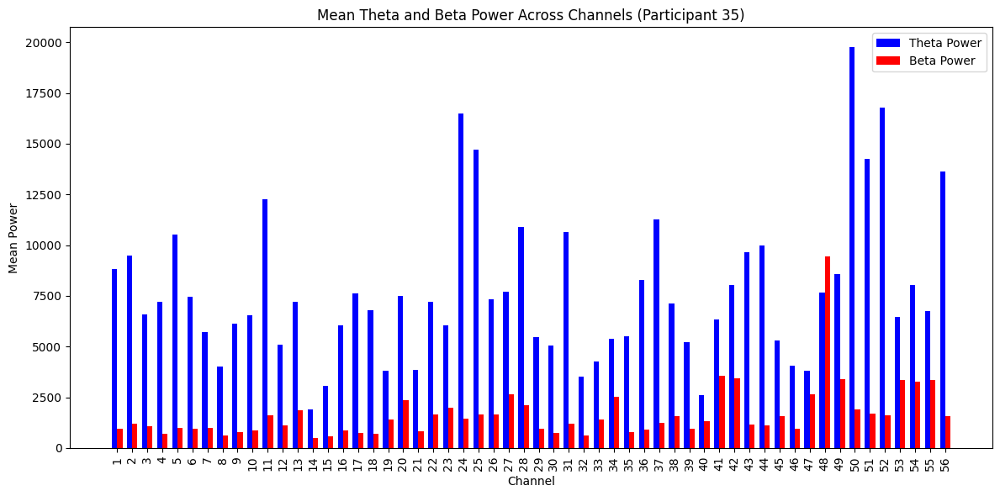

Participant 35: Relevant Channel Index: 24
Highest Theta-to-Beta Ratio (TBR): 11.366572018831166
Participant 35: Top Channels by TBR: [24 52  4  5 50]
Selected Data Shape for Participant 36: (385, 56, 129)


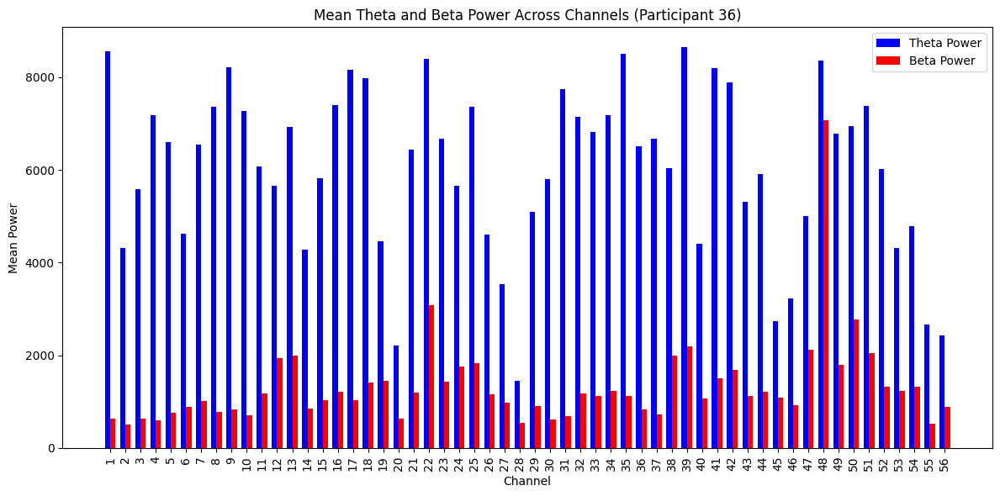

Participant 36: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 13.580913725868575
Participant 36: Top Channels by TBR: [ 1  4 31 10  9]
Selected Data Shape for Participant 37: (385, 56, 187)


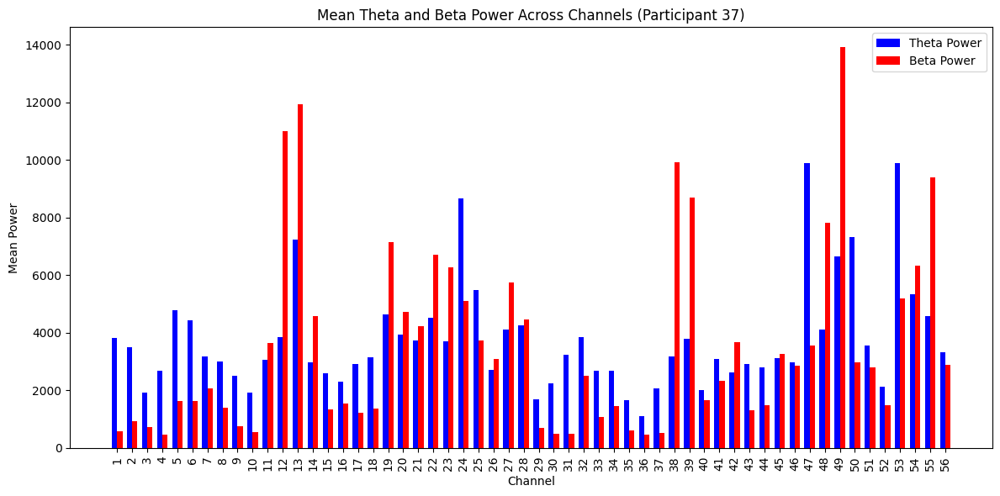

Participant 37: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 6.690854816535932
Participant 37: Top Channels by TBR: [ 1 31  4 30 37]
Selected Data Shape for Participant 38: (385, 56, 51)


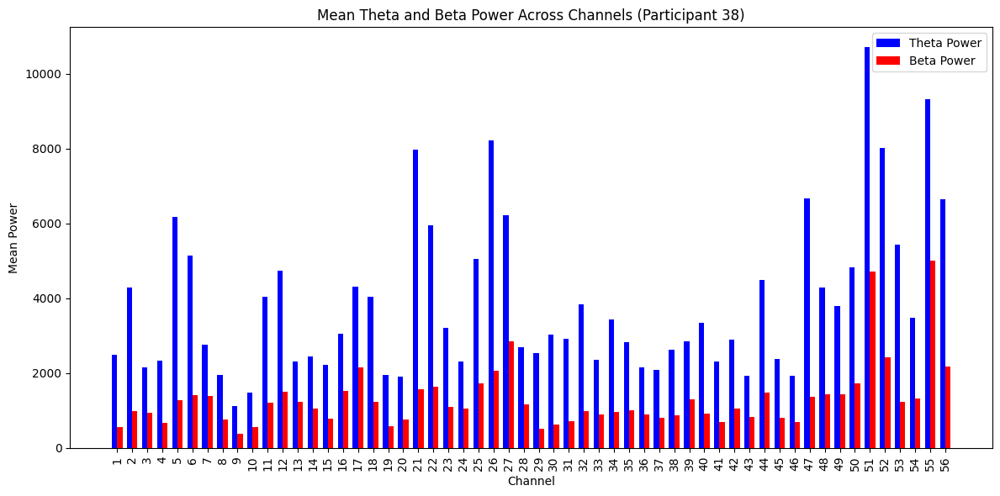

Participant 38: Relevant Channel Index: 21
Highest Theta-to-Beta Ratio (TBR): 5.0908854611275425
Participant 38: Top Channels by TBR: [21 47 29  5 30]
Selected Data Shape for Participant 39: (385, 56, 269)


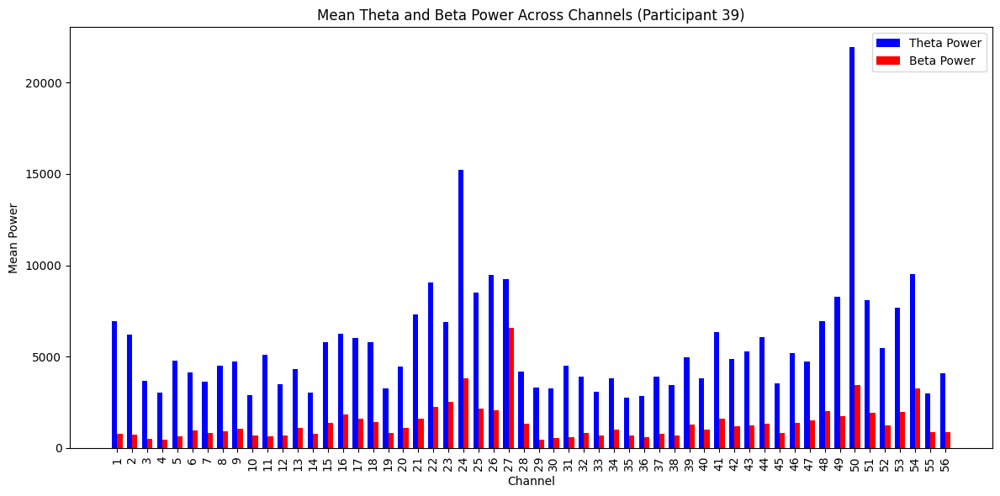

Participant 39: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 8.926676033900367
Participant 39: Top Channels by TBR: [ 1  2 11 31  5]
Selected Data Shape for Participant 40: (385, 56, 234)


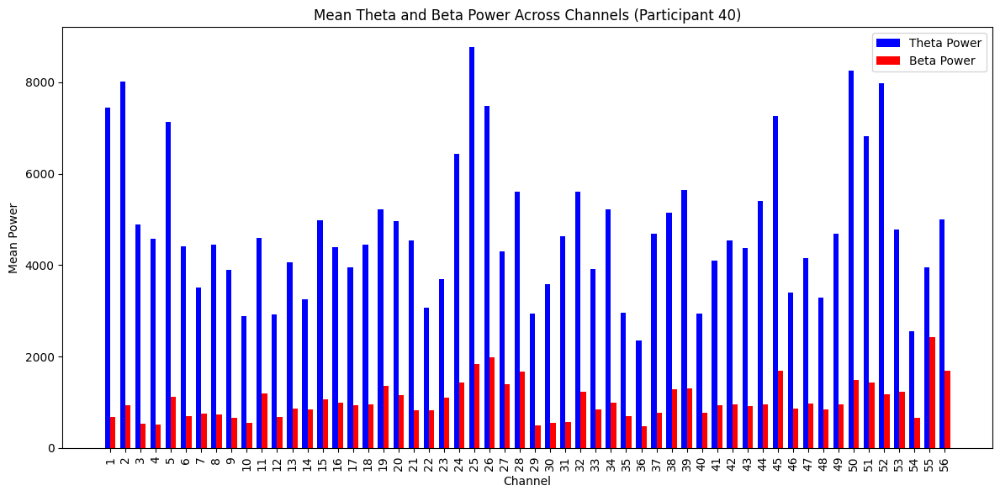

Participant 40: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 11.057741377489794
Participant 40: Top Channels by TBR: [ 1  3  4  2 31]
Selected Data Shape for Participant 41: (385, 56, 124)


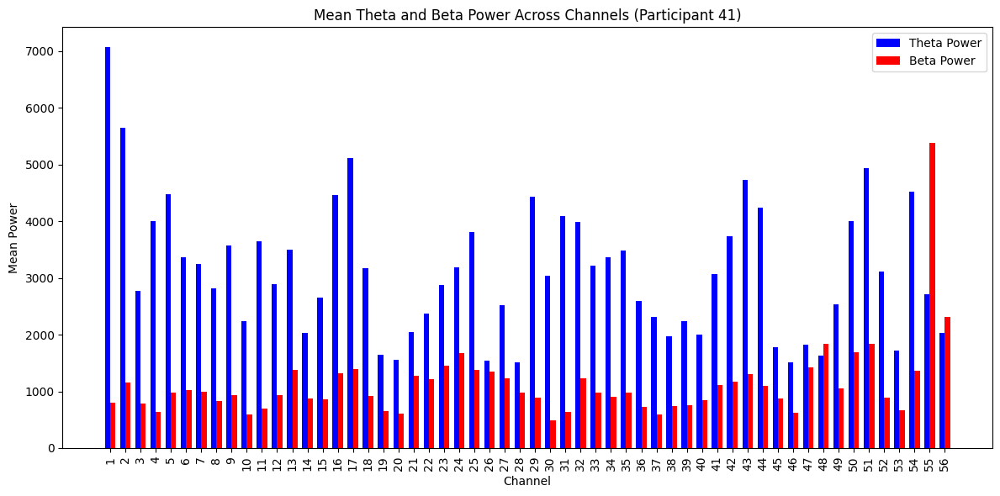

Participant 41: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 8.905390162174033
Participant 41: Top Channels by TBR: [ 1 31  4 30 11]
Selected Data Shape for Participant 42: (385, 56, 204)


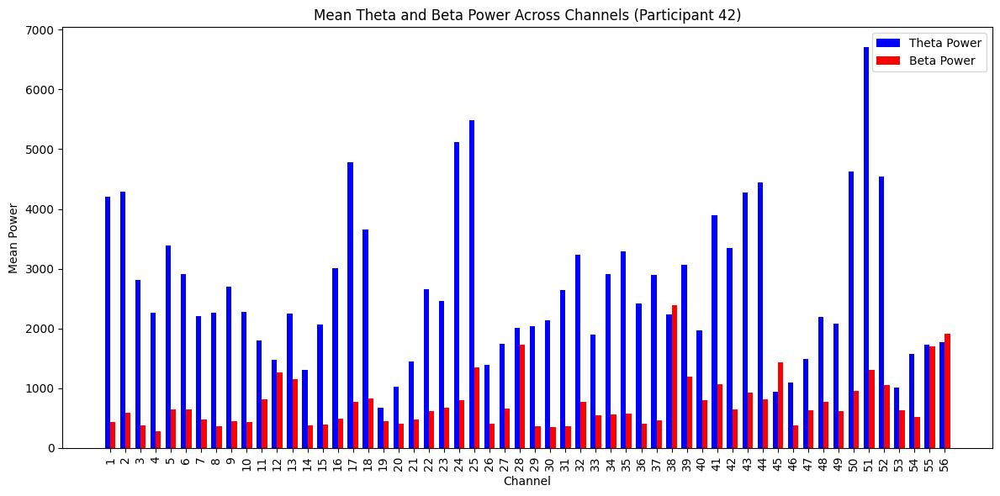

Participant 42: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 9.576983334165856
Participant 42: Top Channels by TBR: [ 1  4  3  2 31]
Selected Data Shape for Participant 43: (385, 56, 262)


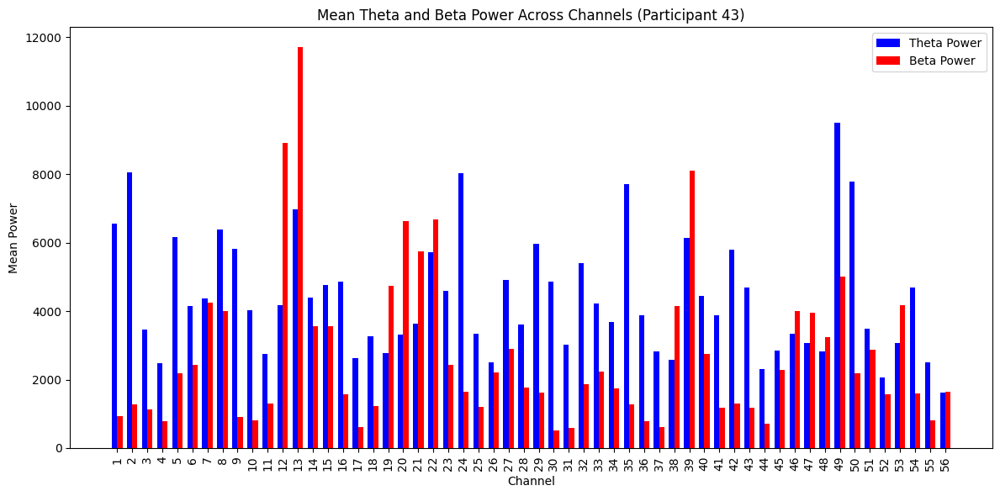

Participant 43: Relevant Channel Index: 30
Highest Theta-to-Beta Ratio (TBR): 9.384786943140387
Participant 43: Top Channels by TBR: [30  1  9  2 35]
Selected Data Shape for Participant 44: (385, 56, 254)


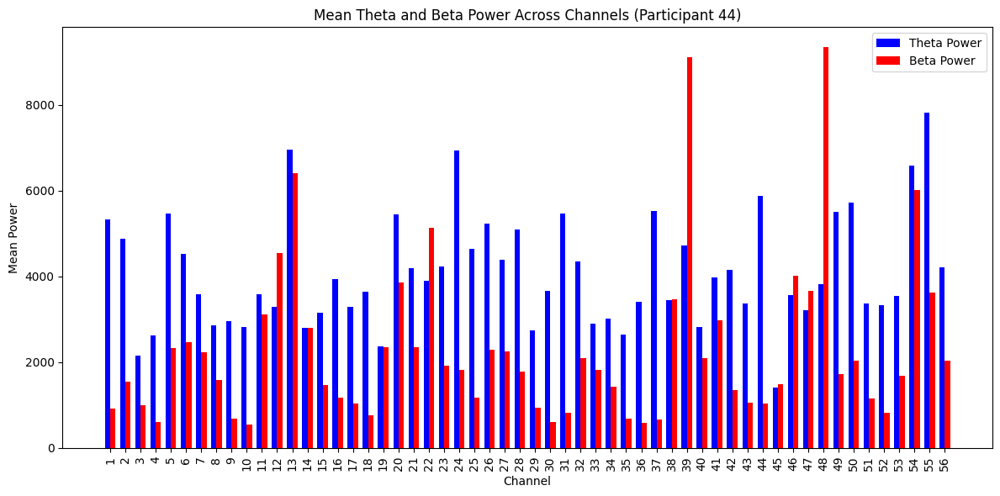

Participant 44: Relevant Channel Index: 37
Highest Theta-to-Beta Ratio (TBR): 8.310075092925896
Participant 44: Top Channels by TBR: [37 31 30 36  1]
Selected Data Shape for Participant 45: (385, 56, 142)


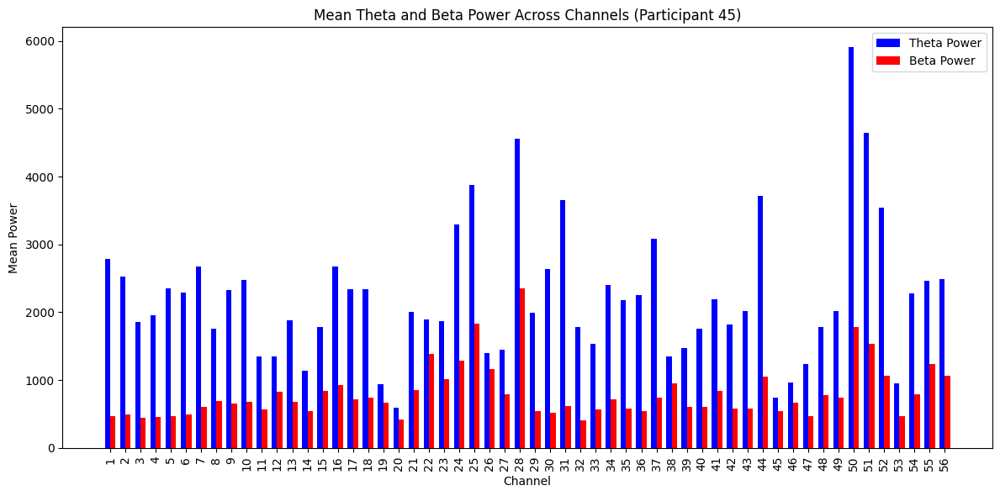

Participant 45: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 5.955152234503546
Participant 45: Top Channels by TBR: [31  1 30  2  5]
Selected Data Shape for Participant 46: (385, 56, 270)


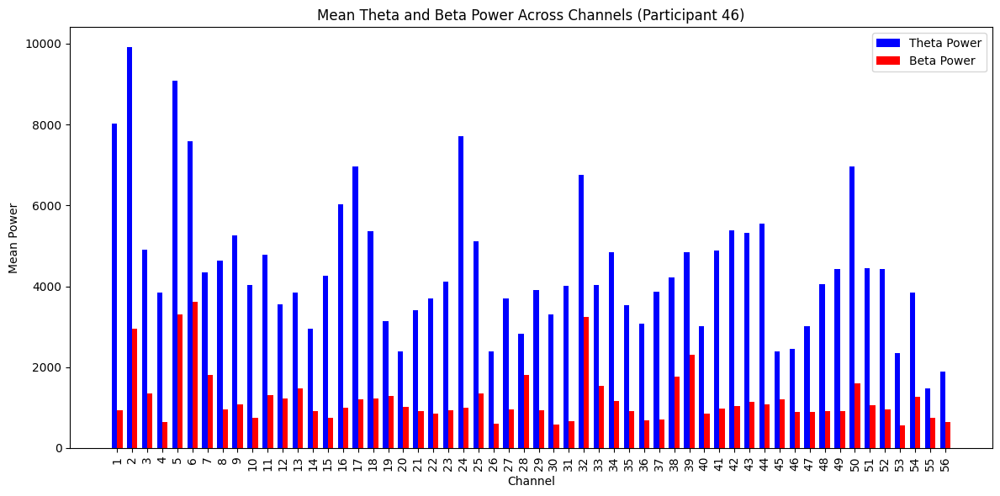

Participant 46: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 8.553517055582576
Participant 46: Top Channels by TBR: [ 1 24 31 16  4]
Selected Data Shape for Participant 47: (385, 56, 219)


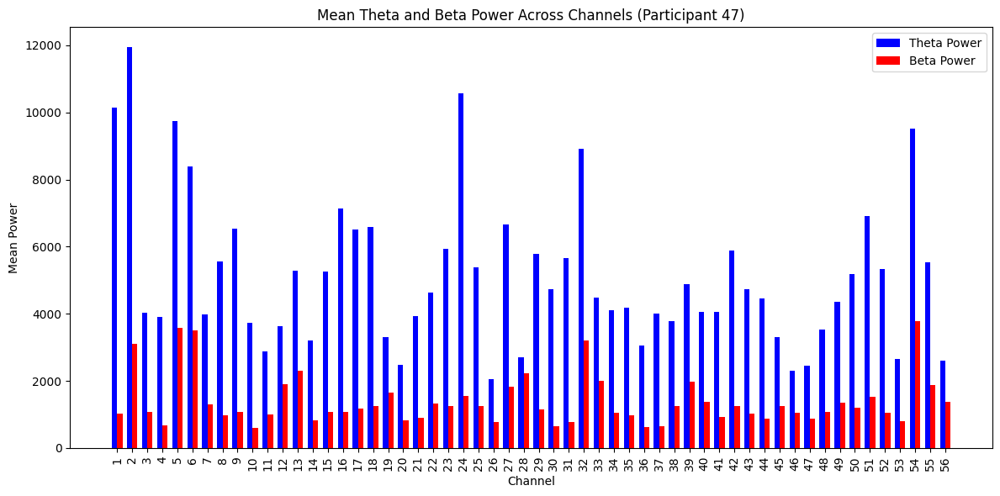

Participant 47: Relevant Channel Index: 1
Highest Theta-to-Beta Ratio (TBR): 9.9615623542194
Participant 47: Top Channels by TBR: [ 1 30 31 24 16]
Selected Data Shape for Participant 48: (385, 56, 283)


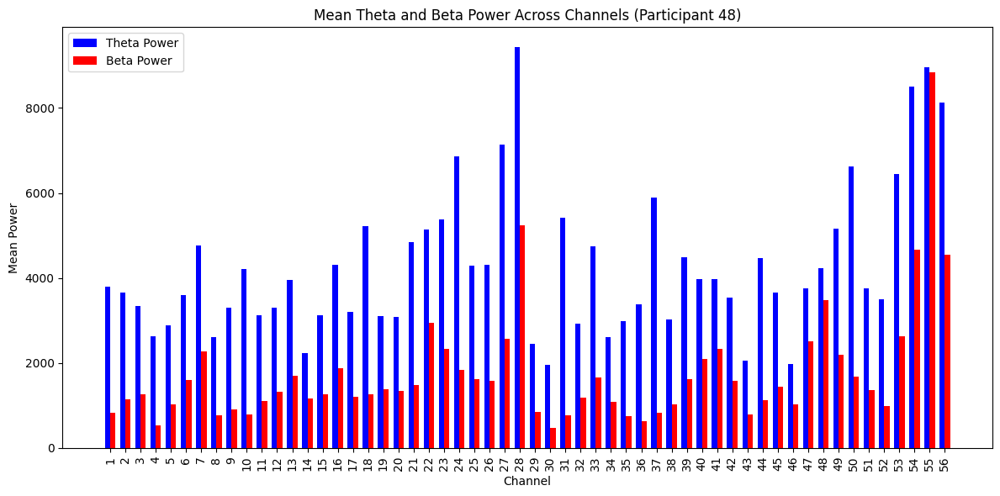

Participant 48: Relevant Channel Index: 31
Highest Theta-to-Beta Ratio (TBR): 7.028744385089171
Participant 48: Top Channels by TBR: [31 37 36 10  4]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
import scipy.io

# Step 1: Load the EEG data from a .mat file
mat_data = scipy.io.loadmat('/content/drive/MyDrive/EEG_dataset/ADHD_Files_combined.mat')

# Verify shape of the loaded data
eeg_data = mat_data['combined_data']
print(f"EEG Data Shape: {eeg_data.shape}")  # Check the data structure

# Step 2: Define the trial details for each participant
participant_trials = {
    1: 257, 2: 279, 3: 46, 4: 259, 5: 205, 6: 262, 7: 214, 8: 262,
    9: 261, 10: 265, 11: 285, 12: 255, 13: 213, 14: 238, 15: 168, 16: 125,
    17: 239, 18: 195, 19: 286, 20: 197, 21: 234, 22: 203, 23: 223, 24: 265,
    25: 255, 26: 226, 27: 264, 28: 259, 29: 260, 30: 290, 31: 287, 32: 229,
    33: 172, 34: 219, 35: 217, 36: 129, 37: 187, 38: 51, 39: 269, 40: 234,
    41: 124, 42: 204, 43: 262, 44: 254, 45: 142, 46: 270, 47: 219, 48: 283
}

# Step 3: Sampling frequency and parameters
fs = 256  # Sampling frequency (Hz)
nperseg = 128  # Number of points per segment for STFT

# Number of time points and channels
time_points, num_channels, _ = eeg_data.shape

# Step 4: Loop through each participant to plot the Theta and Beta power
for participant, num_trials in participant_trials.items():
    # Get the correct range of trials for the participant
    start_trial = sum([participant_trials[i] for i in range(1, participant)])  # Summing previous trials
    end_trial = start_trial + num_trials  # Get the end trial index for the current participant

    # Extract data for the current participant
    eeg_data_participant = eeg_data[:, :, start_trial:end_trial]

    # Verify the shape of the data slice for the participant
    print(f"Selected Data Shape for Participant {participant}: {eeg_data_participant.shape}")

    # Number of trials for this participant
    _, num_channels, num_trials = eeg_data_participant.shape

    # Initialize arrays to store power for Theta and Beta bands for each channel
    theta_power = np.zeros((num_channels, num_trials))  # (Channels x Trials)
    beta_power = np.zeros((num_channels, num_trials))   # (Channels x Trials)

    # Step 5: Apply STFT to each channel across the trials and calculate Theta and Beta power
    for channel in range(num_channels):
        for trial in range(num_trials):
            # Apply STFT to the trial and channel
            f, t, Zxx = stft(eeg_data_participant[:, channel, trial], fs=fs, nperseg=nperseg)

            # Magnitude of the STFT (frequency vs. time representation)
            magnitude = np.abs(Zxx)

            # Mask for Theta band (4-8 Hz)
            theta_mask = (f >= 4) & (f <= 8)
            # Mask for Beta band (13-30 Hz)
            beta_mask = (f >= 13) & (f <= 30)

            # Compute power in the Theta and Beta bands (sum of squared magnitude)
            theta_power[channel, trial] = np.sum(magnitude[theta_mask]**2)
            beta_power[channel, trial] = np.sum(magnitude[beta_mask]**2)

    # Step 6: Aggregate the power for Theta and Beta bands across trials for each channel
    mean_theta_power = np.mean(theta_power, axis=1)  # Mean Theta power for each channel
    mean_beta_power = np.mean(beta_power, axis=1)    # Mean Beta power for each channel

    # Step 7: Compute Theta-to-Beta Ratio (TBR) for each channel
    epsilon = 1e-10  # Prevent division by zero
    theta_to_beta_ratio = mean_theta_power / (mean_beta_power + epsilon)

    # Step 8: Visualize both Theta and Beta power in the same graph
    x = np.arange(num_channels)  # Channel indices for plotting
    width = 0.35  # Width of the bars

    # Create a grouped bar plot
    plt.figure(figsize=(12, 6))
    plt.bar(x - width/2, mean_theta_power, width, label='Theta Power', color='blue')
    plt.bar(x + width/2, mean_beta_power, width, label='Beta Power', color='red')

    # Labels and title
    plt.title(f'Mean Theta and Beta Power Across Channels (Participant {participant})')
    plt.xlabel('Channel')
    plt.ylabel('Mean Power')
    plt.xticks(x, range(1, num_channels+1), rotation=90)  # Displaying channel numbers on x-axis
    plt.legend()

    # Show the plot
    plt.tight_layout()
    plt.show()

    # Step 9: Find the channel with the highest TBR
    relevant_channel_index = np.argmax(theta_to_beta_ratio)
    relevant_channel_tbr = theta_to_beta_ratio[relevant_channel_index]
    print(f"Participant {participant}: Relevant Channel Index: {relevant_channel_index + 1}")
    print(f"Highest Theta-to-Beta Ratio (TBR): {relevant_channel_tbr}")

    # Optional: Sort channels by TBR to identify top channels
    sorted_indices = np.argsort(theta_to_beta_ratio)[::-1]  # Descending order
    print(f"Participant {participant}: Top Channels by TBR:", sorted_indices[:5] + 1)  # Display top 5 channels


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
import scipy.io
from collections import Counter

# Step 1: Load the EEG data from a .mat file
mat_data = scipy.io.loadmat('/content/drive/MyDrive/EEG_dataset/ADHD_Files_combined.mat')

# Verify shape of the loaded data
eeg_data = mat_data['combined_data']
print(f"EEG Data Shape: {eeg_data.shape}")  # Check the data structure

# Step 2: Define the trial details for each participant
participant_trials = {
    1: 257, 2: 279, 3: 46, 4: 259, 5: 205, 6: 262,
    7: 214, 8: 262, 9: 261, 10: 265, 11: 285, 12: 255,
    13: 213, 14: 238, 15: 168, 16: 125, 17: 239, 18: 195,
    19: 286, 20: 197, 21: 234, 22: 203, 23: 223, 24: 265,
    25: 255, 26: 226, 27: 264, 28: 259, 29: 260, 30: 290,
    31: 287, 32: 229, 33: 172, 34: 219, 35: 217, 36: 129,
    37: 187, 38: 51, 39: 269, 40: 234, 41: 124, 42: 204,
    43: 262, 44: 254, 45: 142, 46: 270, 47: 219, 48: 283
}

# Step 3: Sampling frequency and parameters
fs = 256  # Sampling frequency (Hz)
nperseg = 128  # Number of points per segment for STFT

# Number of time points and channels
time_points, num_channels, _ = eeg_data.shape

# List to store top 5 channels for each participant
top_channels_all_participants = []

# Step 4: Loop through each participant to plot the Theta and Beta power and extract top channels
for participant, num_trials in participant_trials.items():
    # Get the correct range of trials for the participant
    start_trial = sum([participant_trials[i] for i in range(1, participant)])  # Summing previous trials
    end_trial = start_trial + num_trials  # Get the end trial index for the current participant

    # Extract data for the current participant
    eeg_data_participant = eeg_data[:, :, start_trial:end_trial]

    # Verify the shape of the data slice for the participant
    print(f"Selected Data Shape for Participant {participant}: {eeg_data_participant.shape}")

    # Number of trials for this participant
    _, num_channels, num_trials = eeg_data_participant.shape

    # Initialize arrays to store power for Theta and Beta bands for each channel
    theta_power = np.zeros((num_channels, num_trials))  # (Channels x Trials)
    beta_power = np.zeros((num_channels, num_trials))   # (Channels x Trials)

    # Step 5: Apply STFT to each channel across the trials and calculate Theta and Beta power
    for channel in range(num_channels):
        for trial in range(num_trials):
            # Apply STFT to the trial and channel
            f, t, Zxx = stft(eeg_data_participant[:, channel, trial], fs=fs, nperseg=nperseg)

            # Magnitude of the STFT (frequency vs. time representation)
            magnitude = np.abs(Zxx)

            # Mask for Theta band (4-8 Hz)
            theta_mask = (f >= 4) & (f <= 8)
            # Mask for Beta band (13-30 Hz)
            beta_mask = (f >= 13) & (f <= 30)

            # Compute power in the Theta and Beta bands (sum of squared magnitude)
            theta_power[channel, trial] = np.sum(magnitude[theta_mask]**2)
            beta_power[channel, trial] = np.sum(magnitude[beta_mask]**2)

    # Step 6: Aggregate the power for Theta and Beta bands across trials for each channel
    mean_theta_power = np.mean(theta_power, axis=1)  # Mean Theta power for each channel
    mean_beta_power = np.mean(beta_power, axis=1)    # Mean Beta power for each channel

    # Step 7: Compute Theta-to-Beta Ratio (TBR) for each channel
    epsilon = 1e-10  # Prevent division by zero
    theta_to_beta_ratio = mean_theta_power / (mean_beta_power + epsilon)

    # Step 8: Find the top 5 channels by TBR for the participant
    sorted_indices = np.argsort(theta_to_beta_ratio)[::-1]  # Descending order
    top_channels = sorted_indices[:5]  # Get top 5 channels by TBR

    # Store the top 5 channels for this participant
    top_channels_all_participants.extend(top_channels)

    # Optional: Plot the Theta and Beta power
    # (You can use the previous plotting code here if you still want to visualize)

# Step 9: Count the frequency of each channel across all participants
channel_counts = Counter(top_channels_all_participants)

# Step 10: Sort channels by frequency of occurrence
sorted_channel_counts = channel_counts.most_common()

# Step 11: Display the most common top channels
print("\nMost Common Top Channels (across all participants):")
for channel, count in sorted_channel_counts:
    print(f"Channel {channel + 1}: {count} occurrences")



EEG Data Shape: (385, 56, 10742)
Selected Data Shape for Participant 1: (385, 56, 257)
Selected Data Shape for Participant 2: (385, 56, 279)
Selected Data Shape for Participant 3: (385, 56, 46)
Selected Data Shape for Participant 4: (385, 56, 259)
Selected Data Shape for Participant 5: (385, 56, 205)
Selected Data Shape for Participant 6: (385, 56, 262)
Selected Data Shape for Participant 7: (385, 56, 214)
Selected Data Shape for Participant 8: (385, 56, 262)
Selected Data Shape for Participant 9: (385, 56, 261)
Selected Data Shape for Participant 10: (385, 56, 265)
Selected Data Shape for Participant 11: (385, 56, 285)
Selected Data Shape for Participant 12: (385, 56, 255)
Selected Data Shape for Participant 13: (385, 56, 213)
Selected Data Shape for Participant 14: (385, 56, 238)
Selected Data Shape for Participant 15: (385, 56, 168)
Selected Data Shape for Participant 16: (385, 56, 125)
Selected Data Shape for Participant 17: (385, 56, 239)
Selected Data Shape for Participant 18: (3

EEG Data Shape: (385, 56, 10129)
Participant 1: Data Shape: (385, 56, 281)


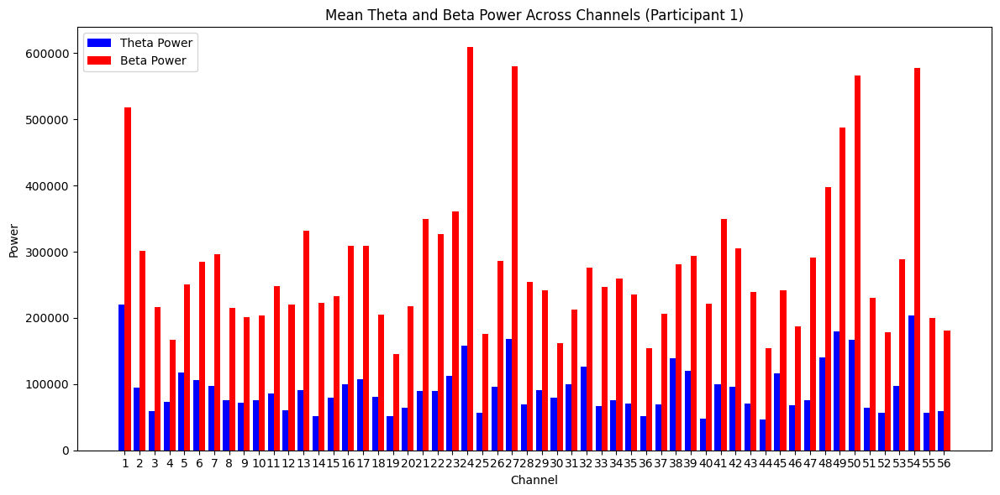

Participant 1: Top Channels by TBR: [38 30 45 31  5]
Participant 2: Data Shape: (385, 56, 262)


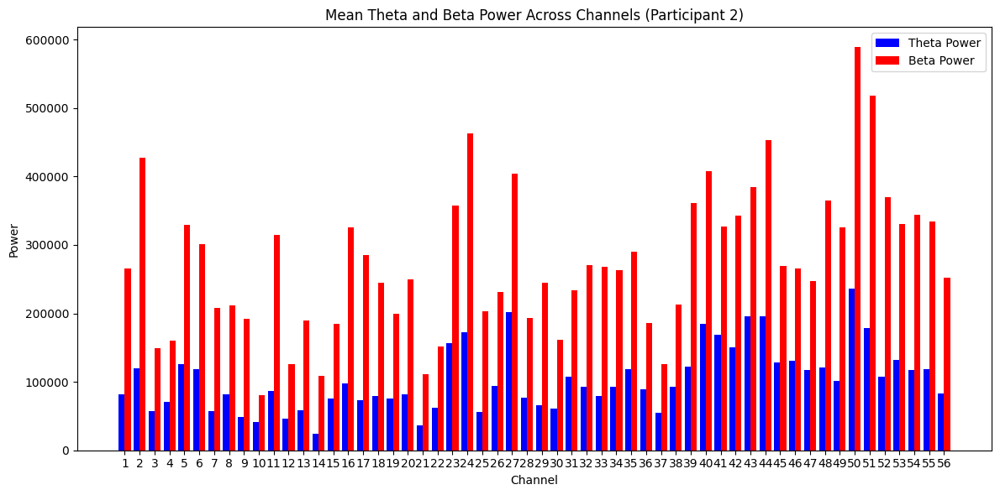

Participant 2: Top Channels by TBR: [41 43 10 27 46]
Participant 3: Data Shape: (385, 56, 295)


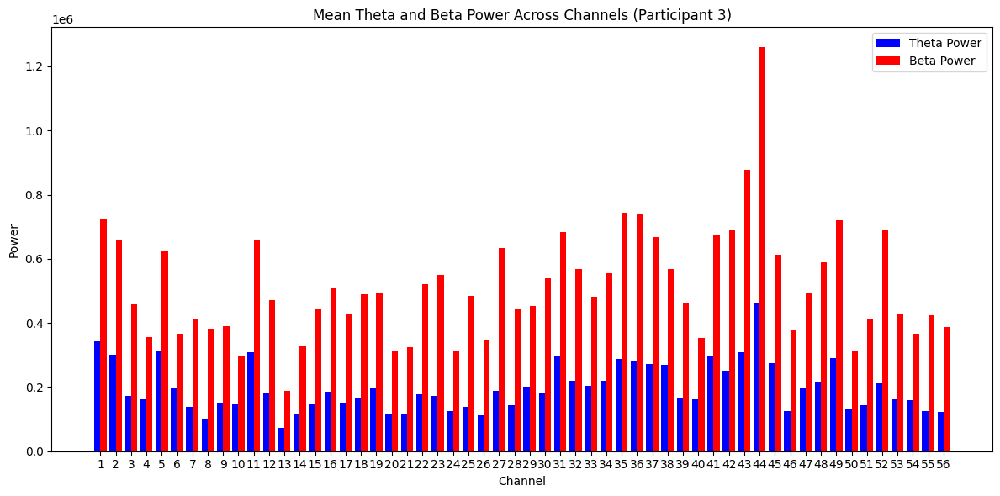

Participant 3: Top Channels by TBR: [ 6  5 10  1 38]
Participant 4: Data Shape: (385, 56, 229)


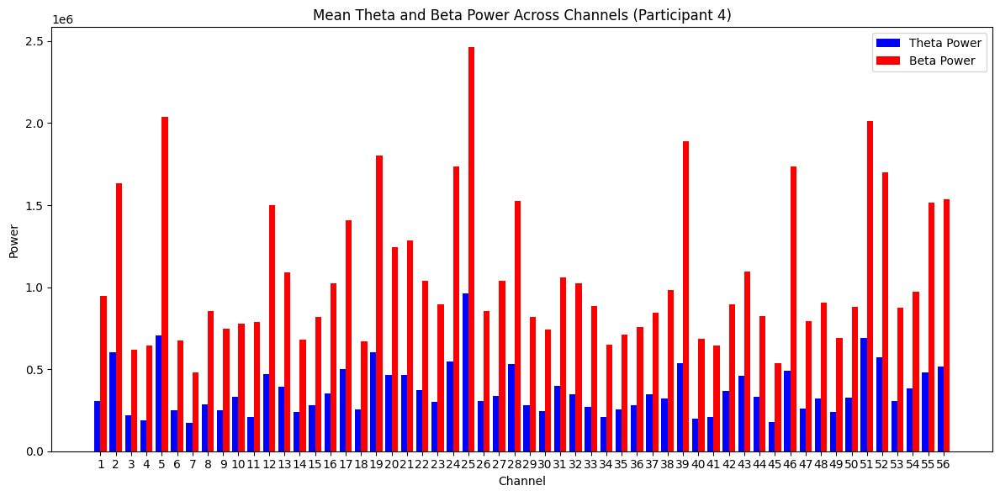

Participant 4: Top Channels by TBR: [10 43 37 42 44]
Participant 5: Data Shape: (385, 56, 255)


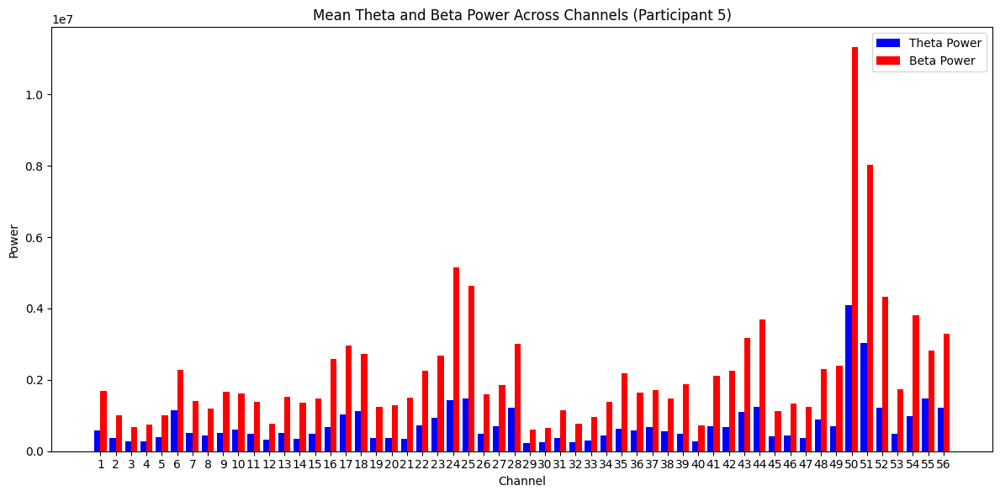

Participant 5: Top Channels by TBR: [55  6 12 18  3]
Participant 6: Data Shape: (385, 56, 135)


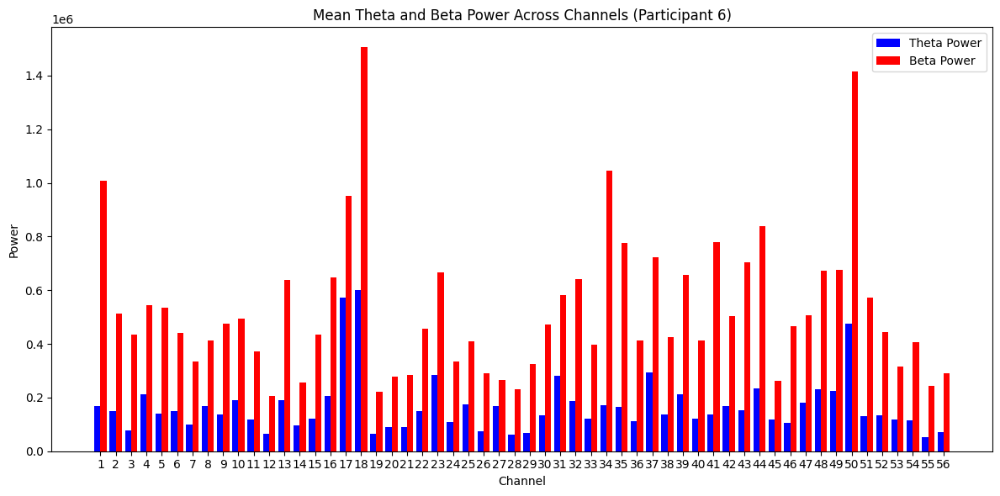

Participant 6: Top Channels by TBR: [27 17 31 45 23]
Participant 7: Data Shape: (385, 56, 232)


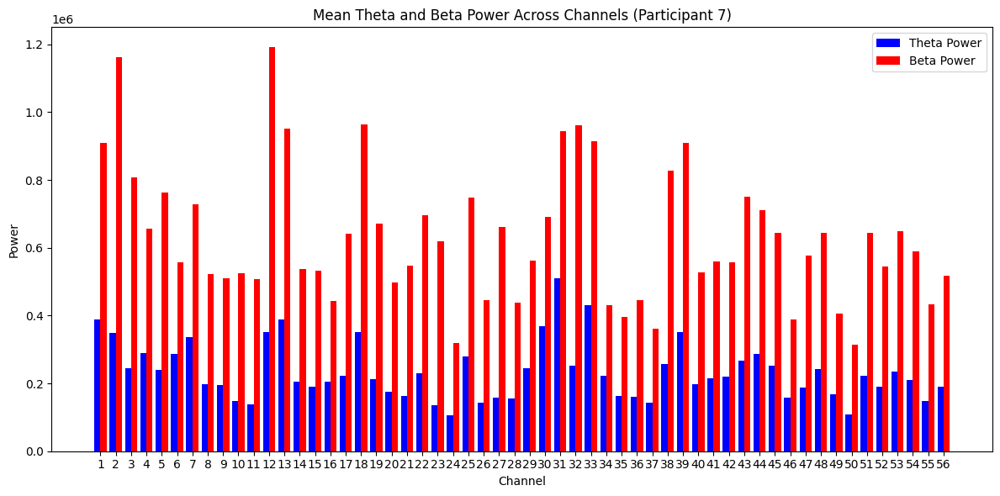

Participant 7: Top Channels by TBR: [31 30  6 34 33]
Participant 8: Data Shape: (385, 56, 254)


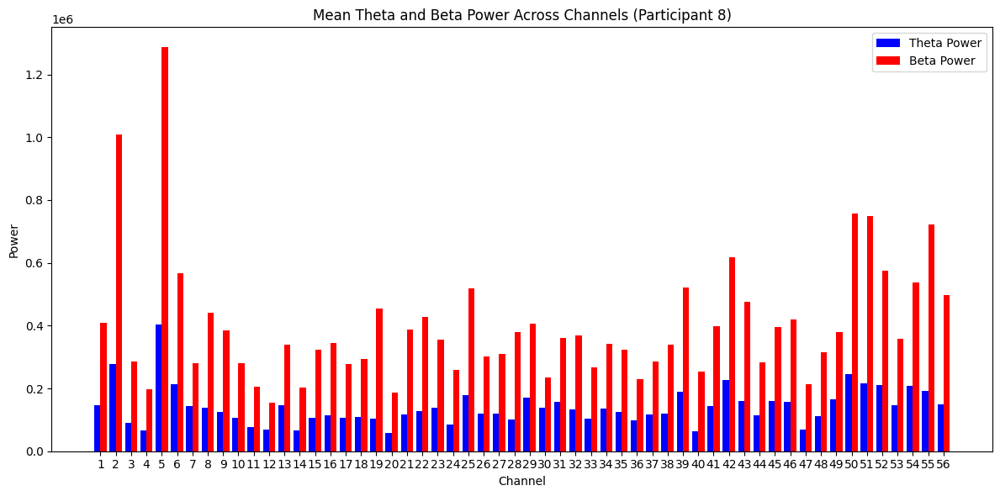

Participant 8: Top Channels by TBR: [30  7 12 31 13]
Participant 9: Data Shape: (385, 56, 159)


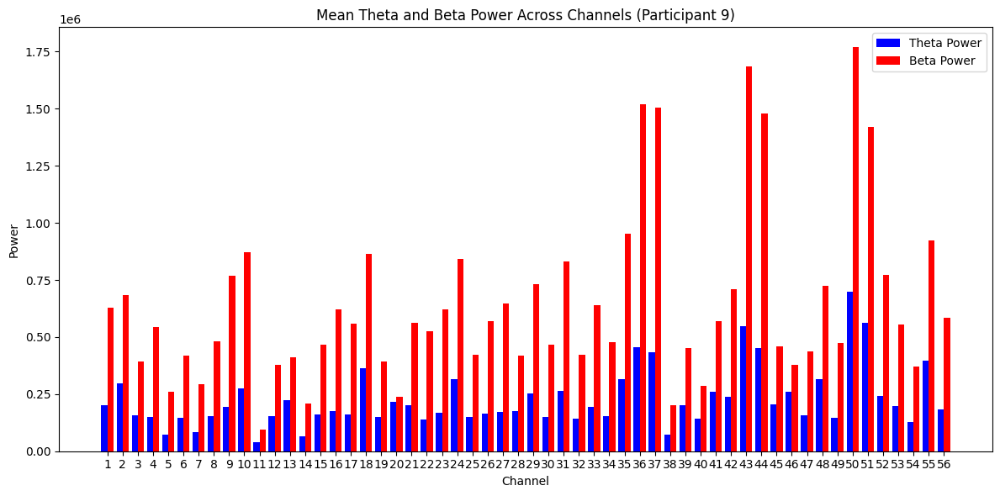

Participant 9: Top Channels by TBR: [20 46 13 40 41]
Participant 10: Data Shape: (385, 56, 272)


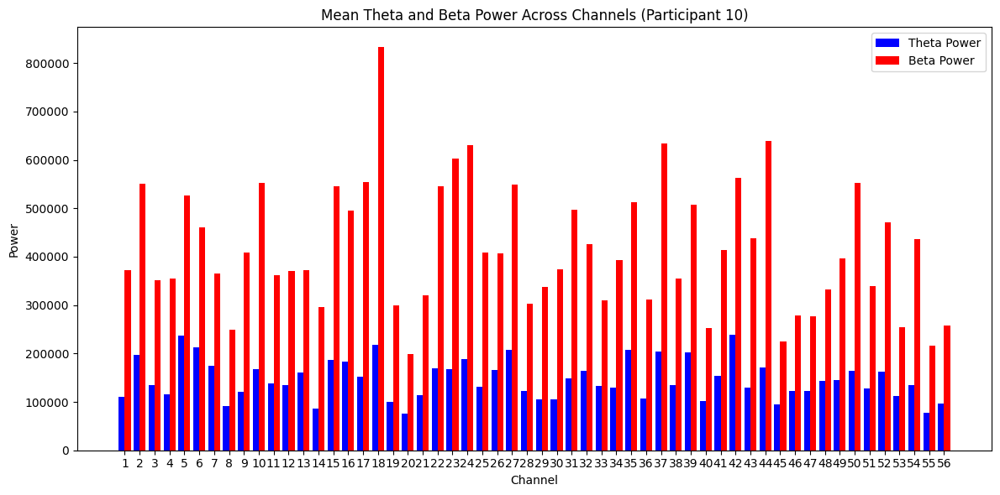

Participant 10: Top Channels by TBR: [ 7  6  5 47 46]
Participant 11: Data Shape: (385, 56, 279)


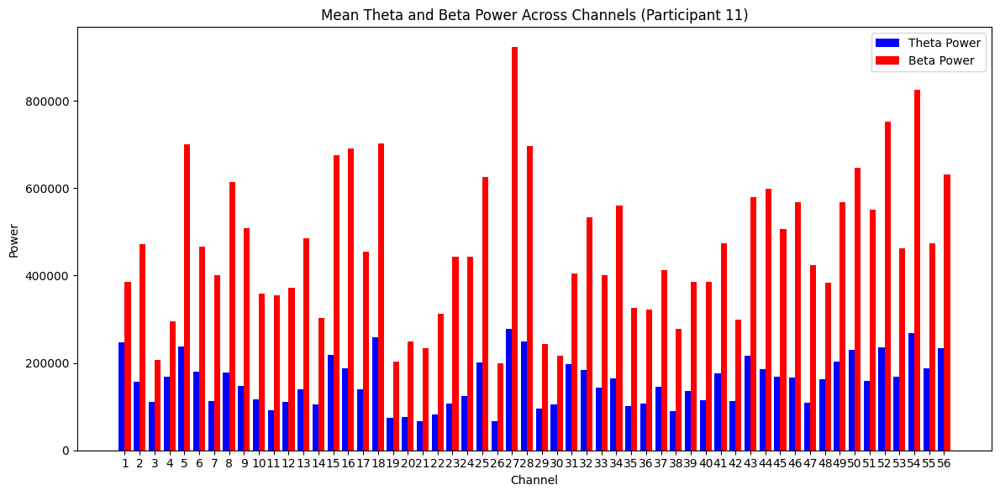

Participant 11: Top Channels by TBR: [ 1  4  3 31 30]
Participant 12: Data Shape: (385, 56, 168)


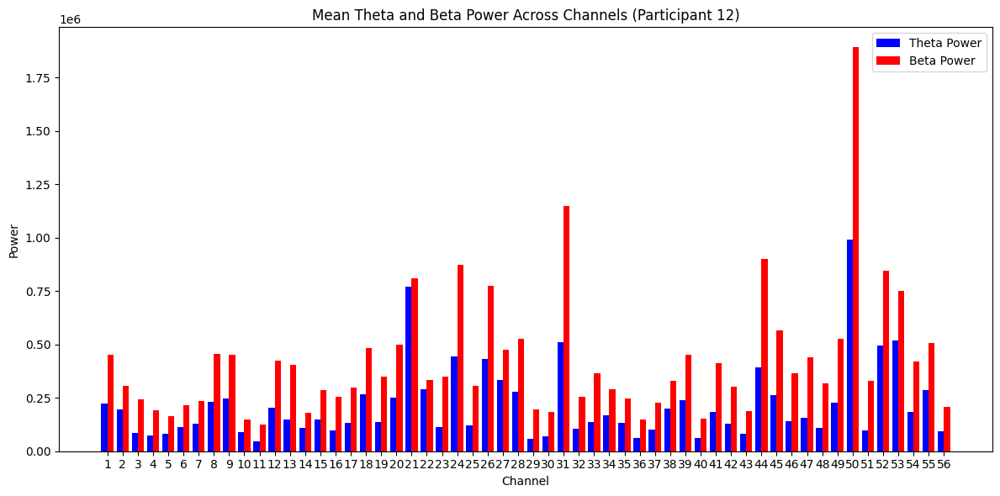

Participant 12: Top Channels by TBR: [21 22 27 53  2]
Participant 13: Data Shape: (385, 56, 137)


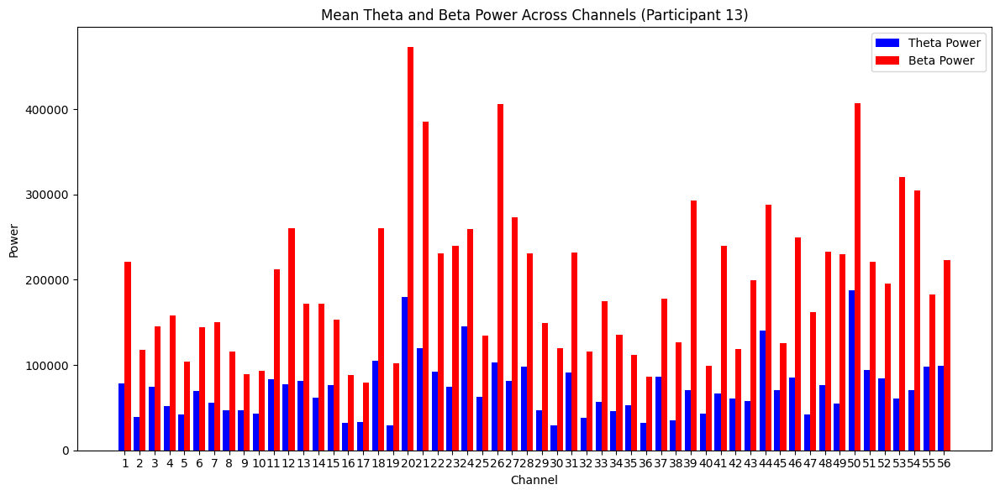

Participant 13: Top Channels by TBR: [45 24 55  9  3]
Participant 14: Data Shape: (385, 56, 237)


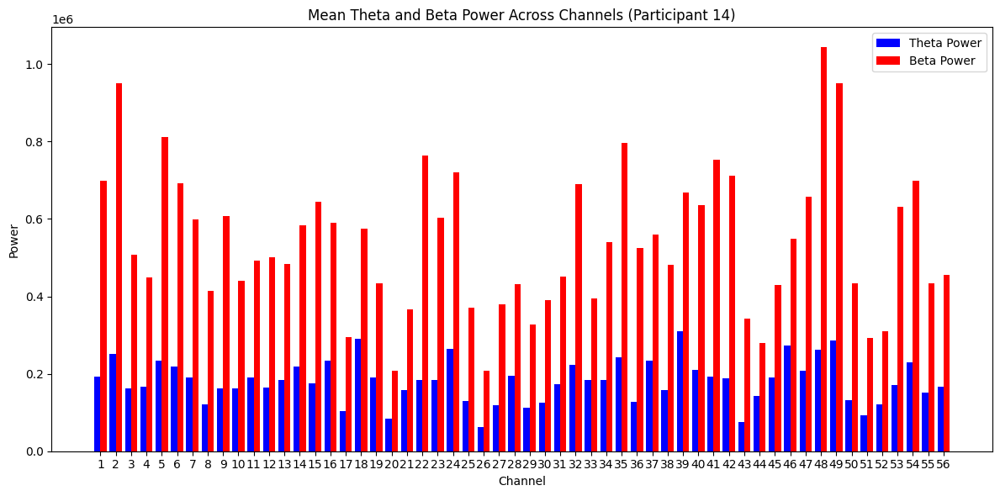

Participant 14: Top Channels by TBR: [44 18 46 33 39]
Participant 15: Data Shape: (385, 56, 205)


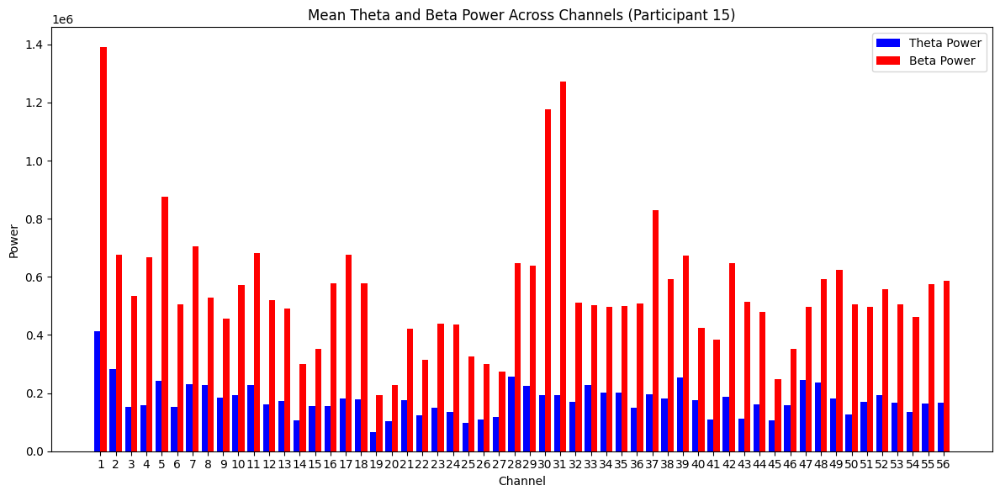

Participant 15: Top Channels by TBR: [47 33 20 46 15]
Participant 16: Data Shape: (385, 56, 115)


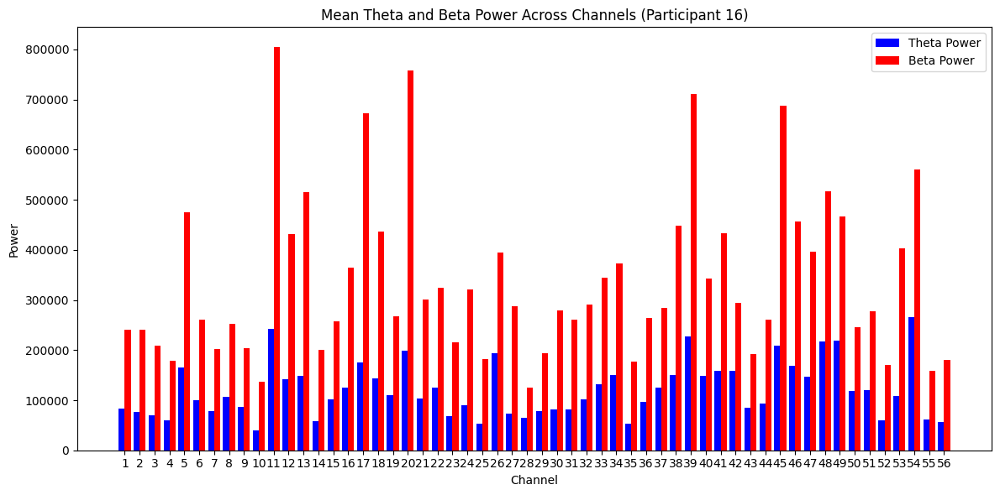

Participant 16: Top Channels by TBR: [42 28 26 50 54]
Participant 17: Data Shape: (385, 56, 195)


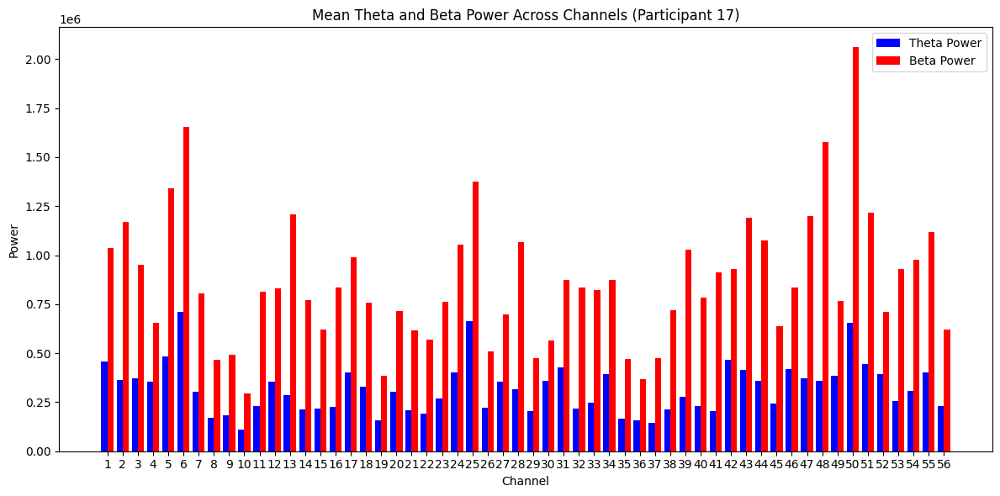

Participant 17: Top Channels by TBR: [30 52  4 27 49]
Participant 18: Data Shape: (385, 56, 229)


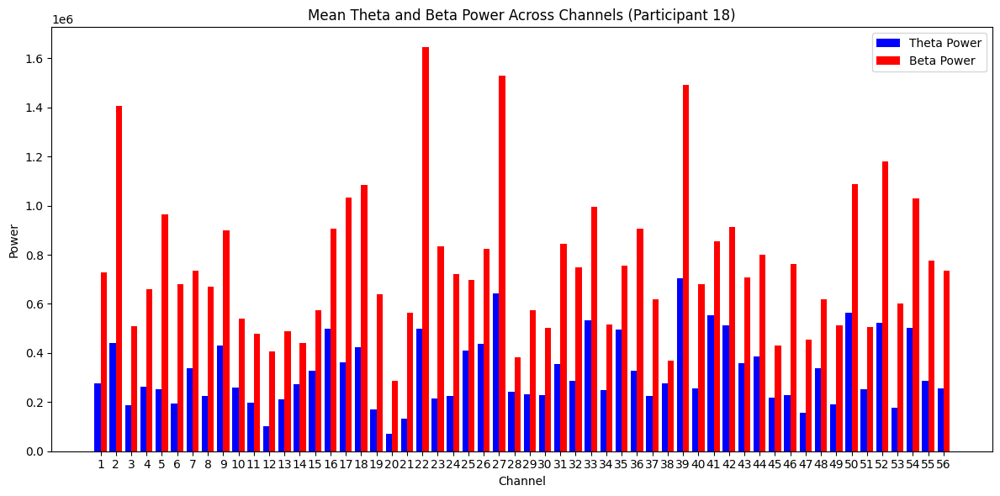

Participant 18: Top Channels by TBR: [38 35 41 28 14]
Participant 19: Data Shape: (385, 56, 222)


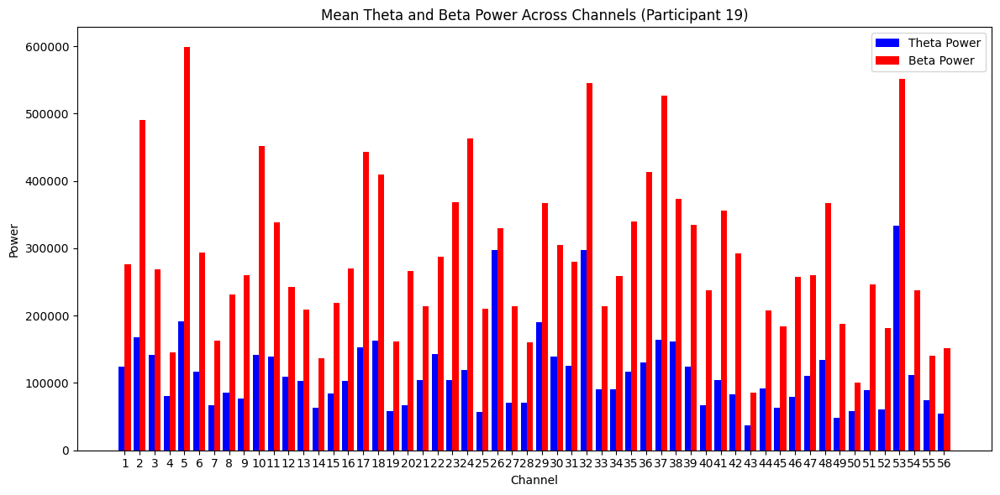

Participant 19: Top Channels by TBR: [26 53 50  4 32]
Participant 20: Data Shape: (385, 56, 209)


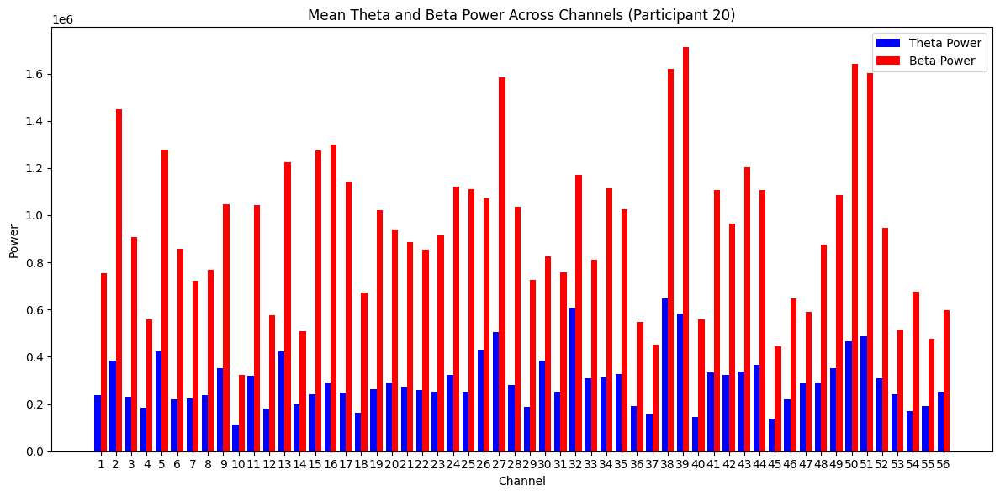

Participant 20: Top Channels by TBR: [32 47 53 30 56]
Participant 21: Data Shape: (385, 56, 160)


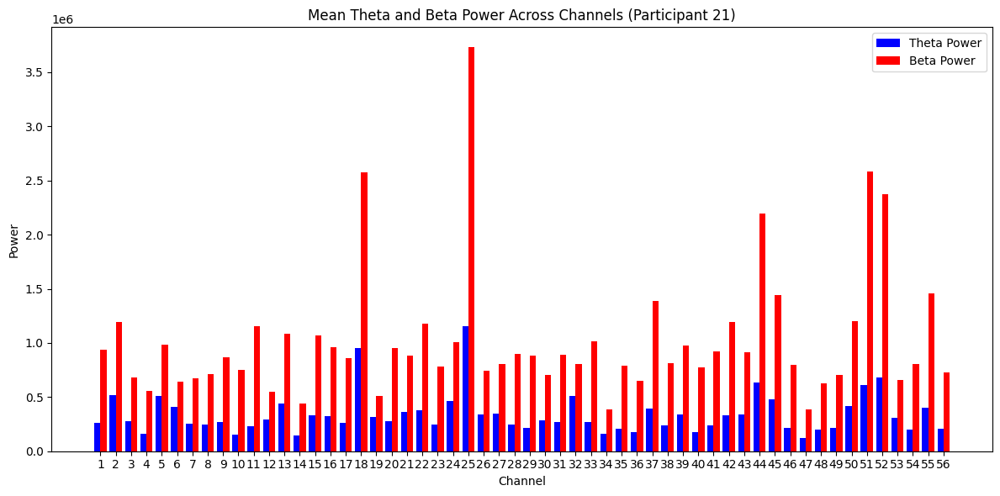

Participant 21: Top Channels by TBR: [ 6 32 19 12  5]
Participant 22: Data Shape: (385, 56, 229)


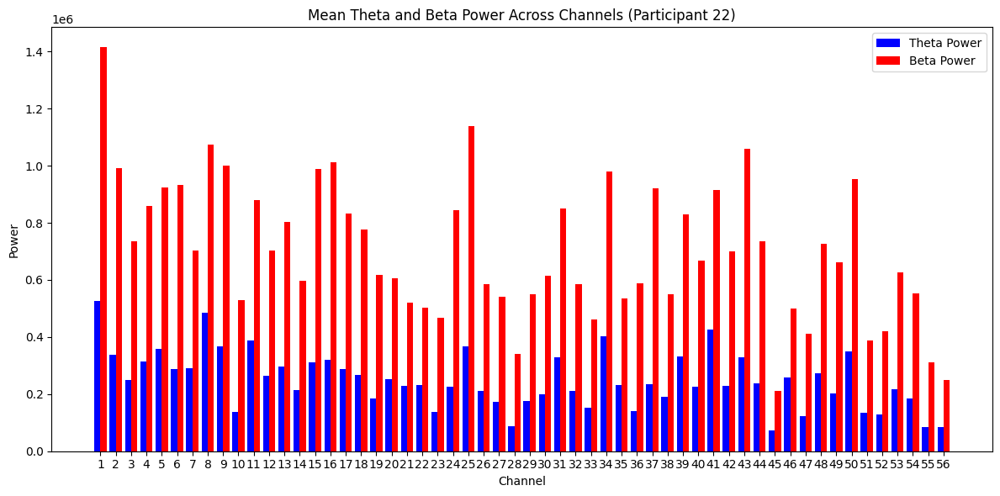

Participant 22: Top Channels by TBR: [46 41 22  8 11]
Participant 23: Data Shape: (385, 56, 203)


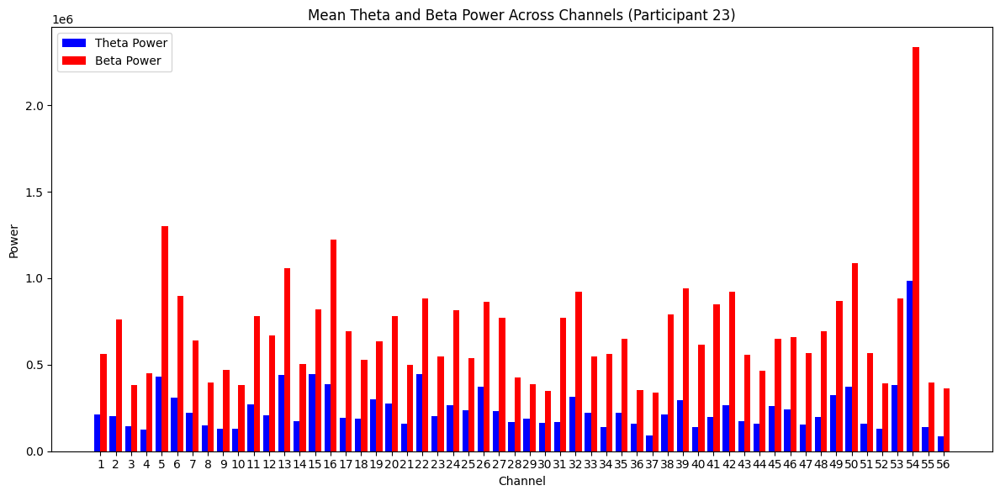

Participant 23: Top Channels by TBR: [15 22 29 30 19]
Participant 24: Data Shape: (385, 56, 99)


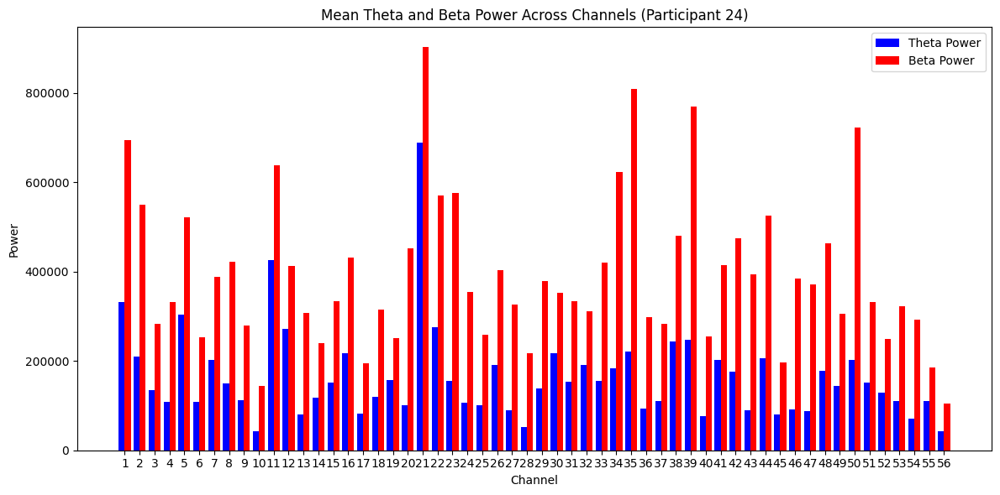

Participant 24: Top Channels by TBR: [21 11 12 19 30]
Participant 25: Data Shape: (385, 56, 229)


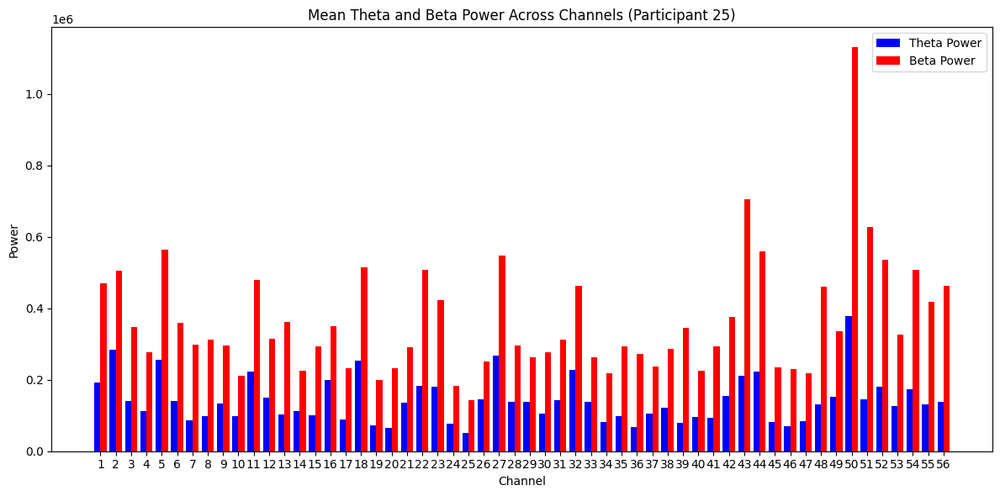

Participant 25: Top Channels by TBR: [26 16  2 33 29]
Participant 26: Data Shape: (385, 56, 241)


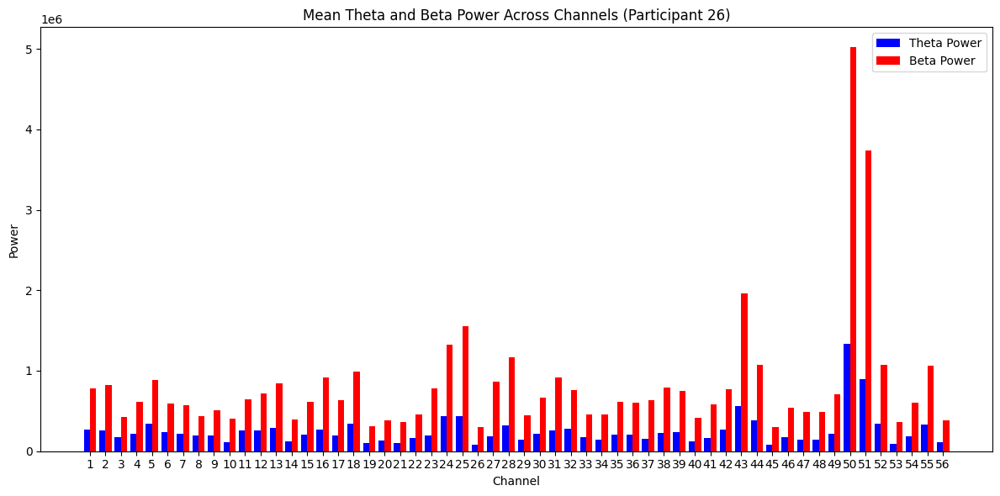

Participant 26: Top Channels by TBR: [ 8  3 11  6  9]
Participant 27: Data Shape: (385, 56, 79)


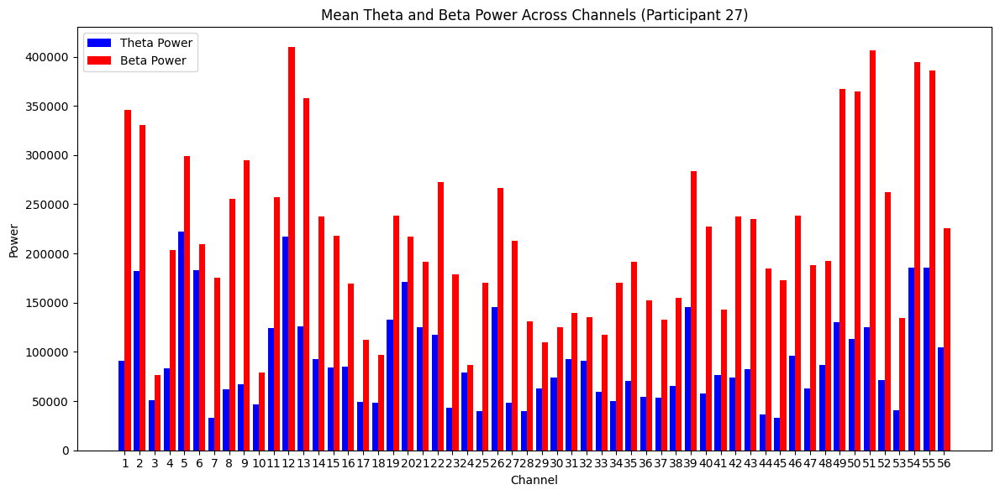

Participant 27: Top Channels by TBR: [24  6 20  5 32]
Participant 28: Data Shape: (385, 56, 287)


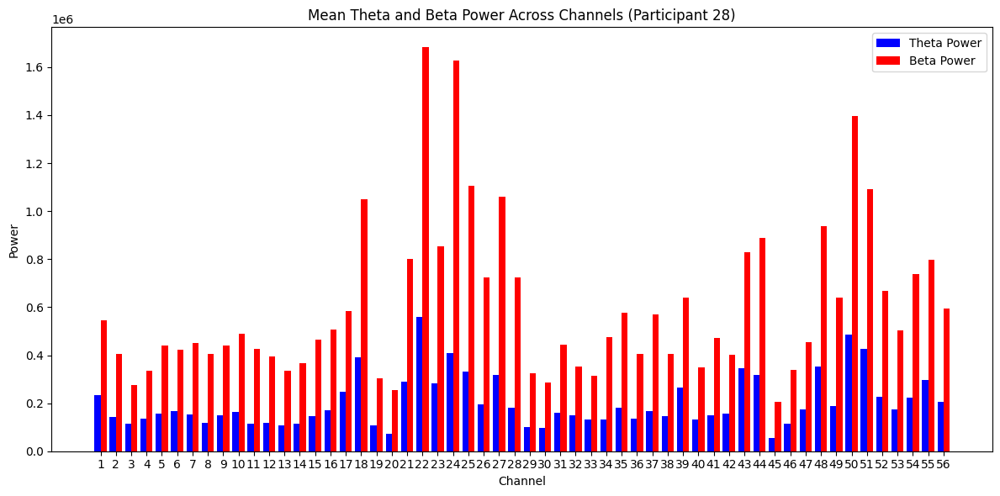

Participant 28: Top Channels by TBR: [17 32  1 43 33]
Participant 29: Data Shape: (385, 56, 102)


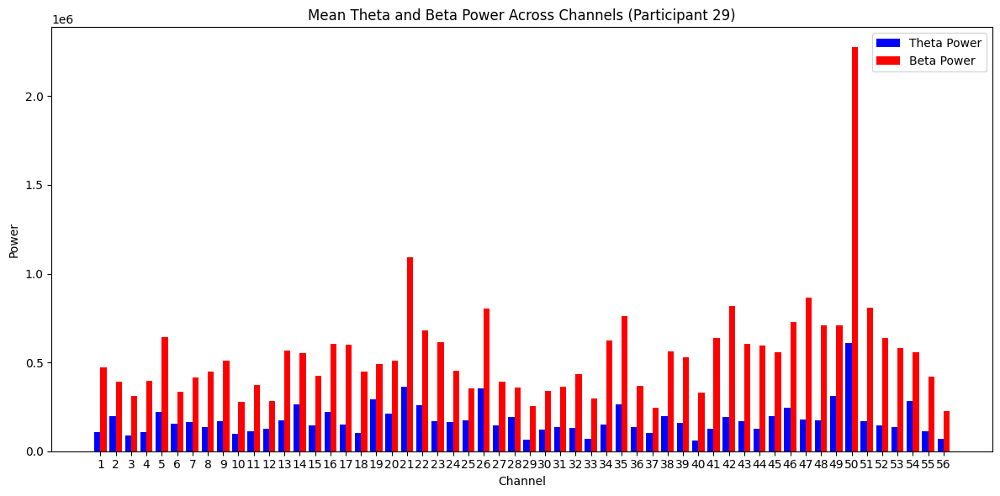

Participant 29: Top Channels by TBR: [19 28  2 54 25]
Participant 30: Data Shape: (385, 56, 279)


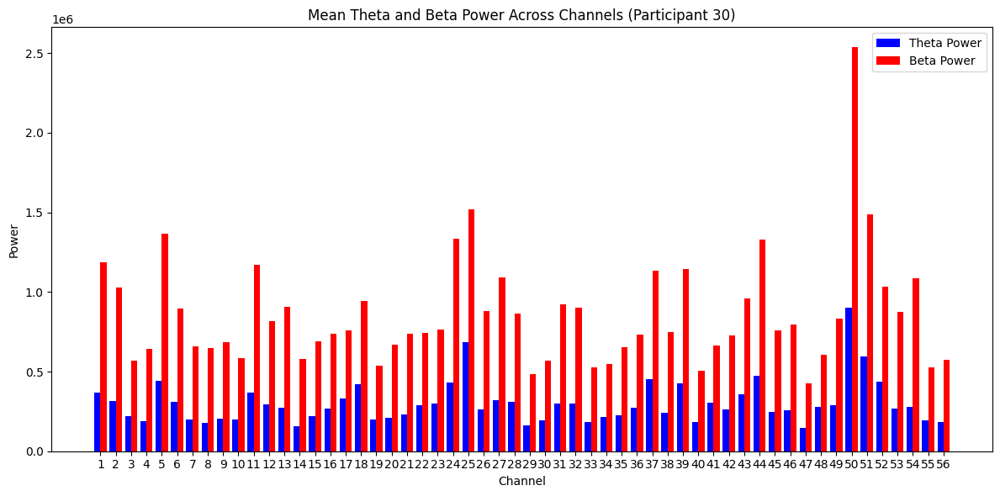

Participant 30: Top Channels by TBR: [48 41 25 18 17]
Participant 31: Data Shape: (385, 56, 278)


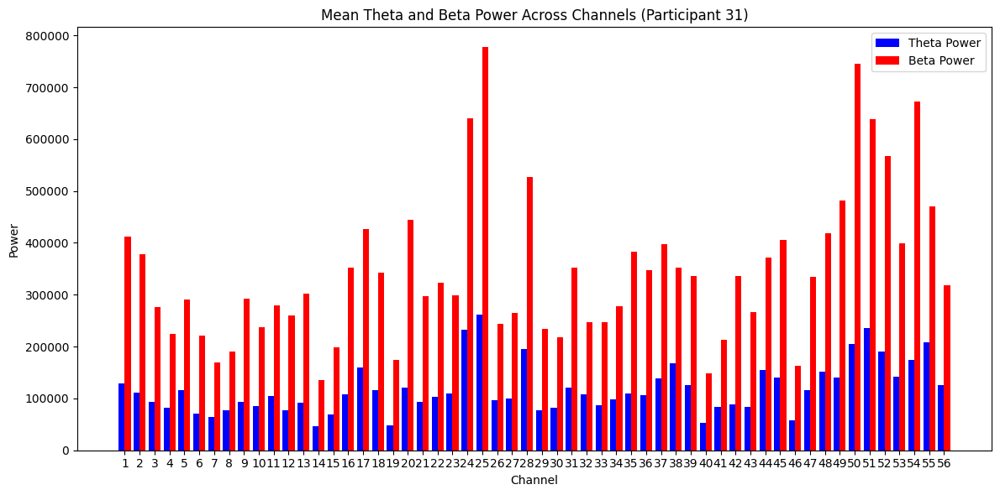

Participant 31: Top Channels by TBR: [38 55 32 44  8]
Participant 32: Data Shape: (385, 56, 276)


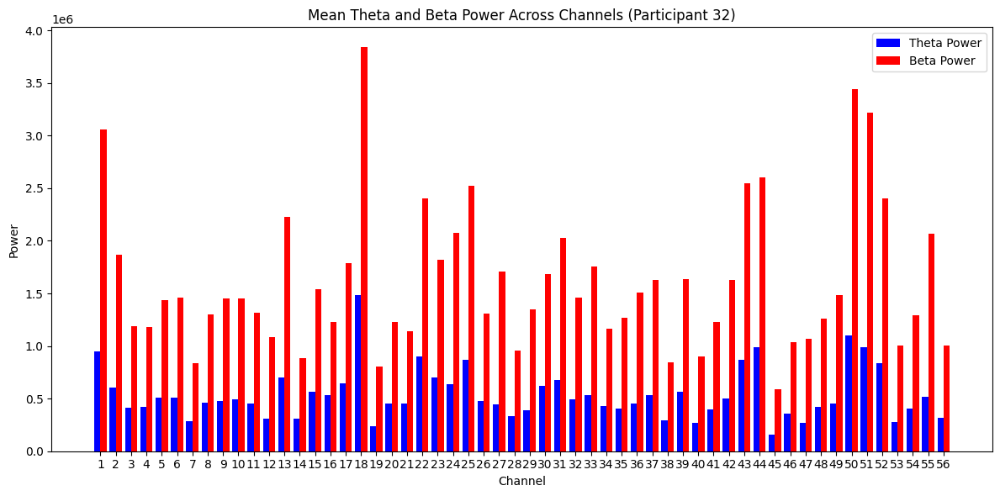

Participant 32: Top Channels by TBR: [16 21 18 23 44]
Participant 33: Data Shape: (385, 56, 280)


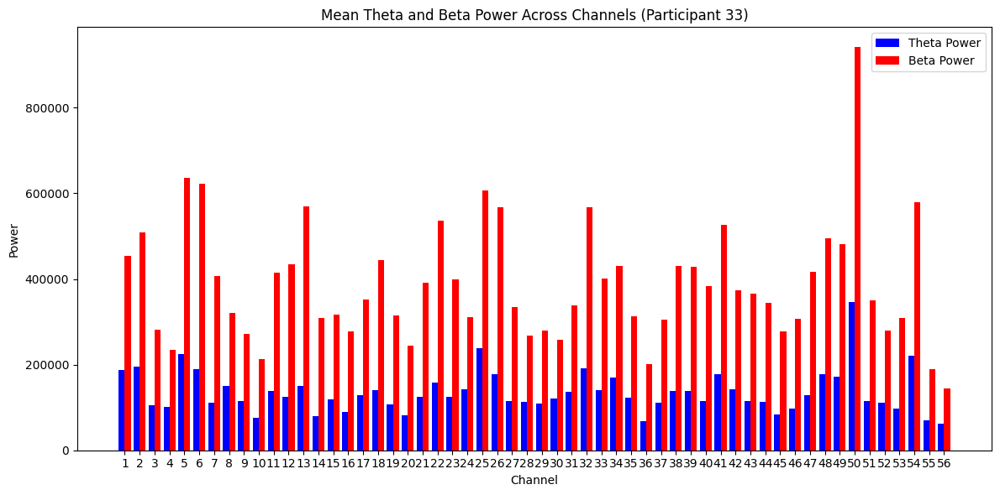

Participant 33: Top Channels by TBR: [ 8 30 24  4 56]
Participant 34: Data Shape: (385, 56, 241)


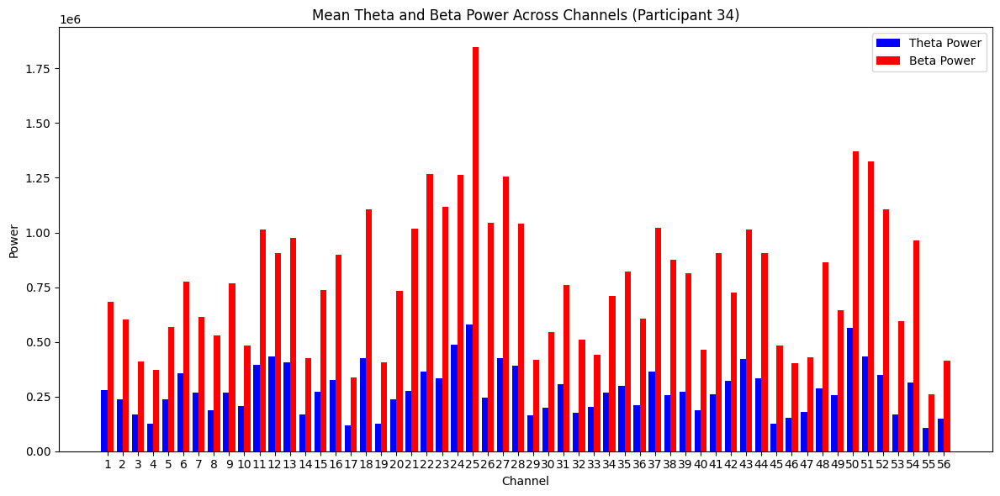

Participant 34: Top Channels by TBR: [12  6 33 42  7]
Participant 35: Data Shape: (385, 56, 288)


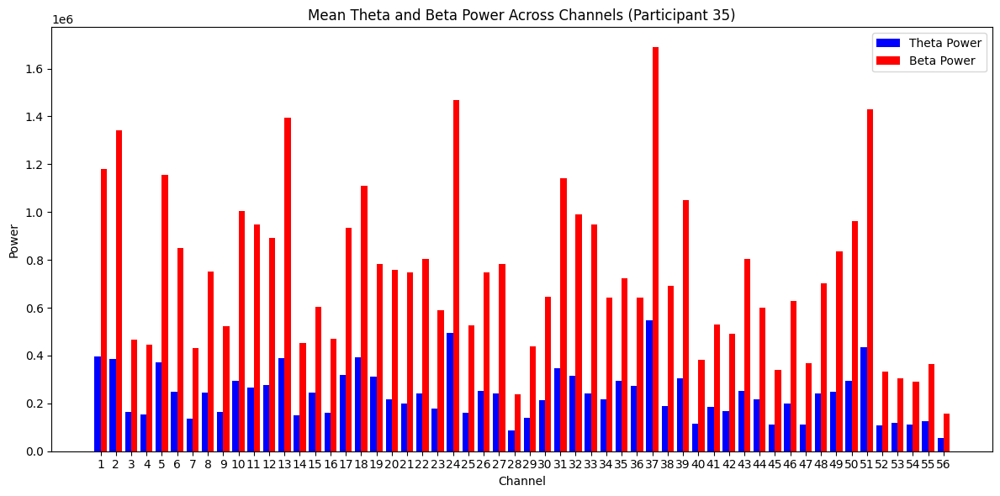

Participant 35: Top Channels by TBR: [36 15 35 19 53]
Participant 36: Data Shape: (385, 56, 273)


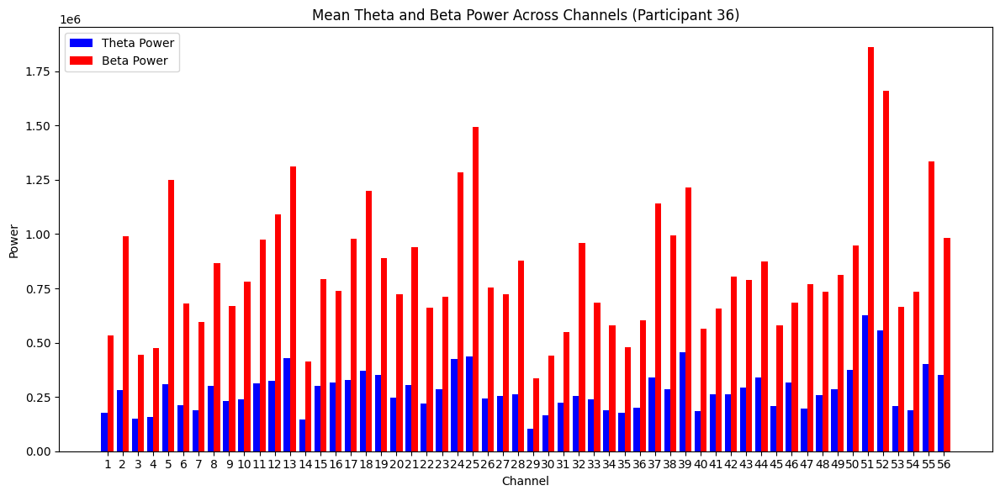

Participant 36: Top Channels by TBR: [46 16 31 23 41]
Participant 37: Data Shape: (385, 56, 267)


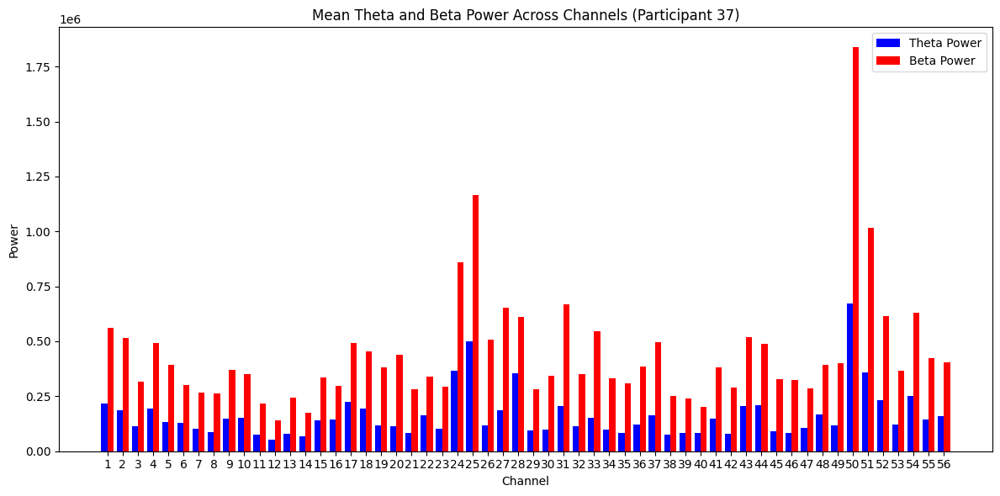

Participant 37: Top Channels by TBR: [28 22 16 17 10]
Participant 38: Data Shape: (385, 56, 259)


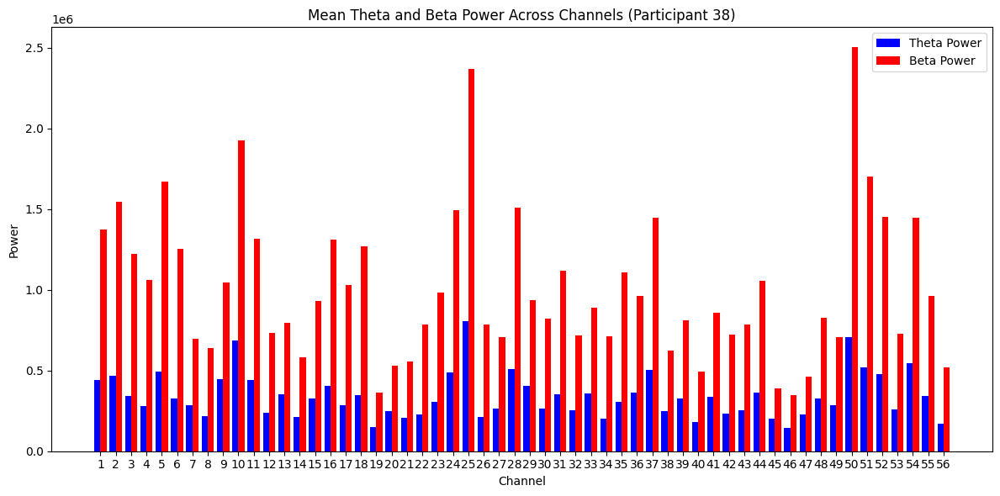

Participant 38: Top Channels by TBR: [45 47 20 13 29]
Participant 39: Data Shape: (385, 56, 273)


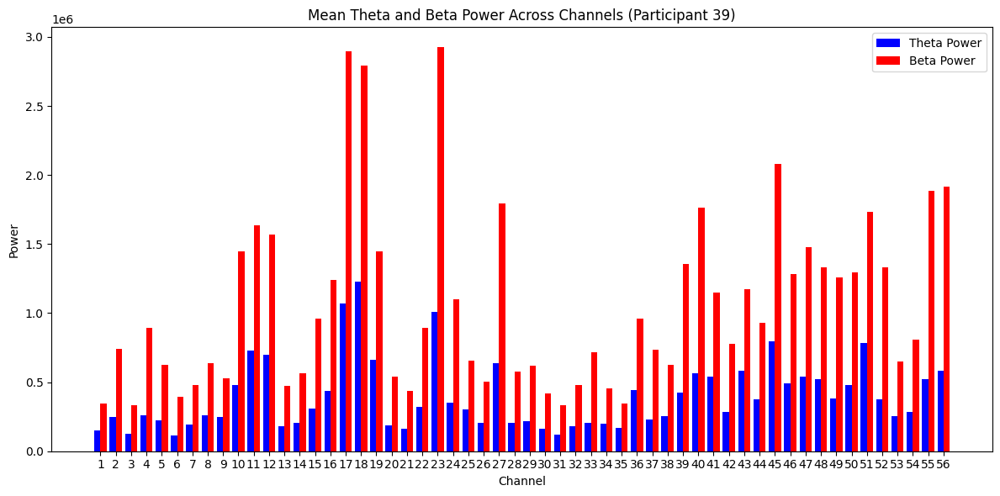

Participant 39: Top Channels by TBR: [43 35 41  9 25]
Participant 40: Data Shape: (385, 56, 279)


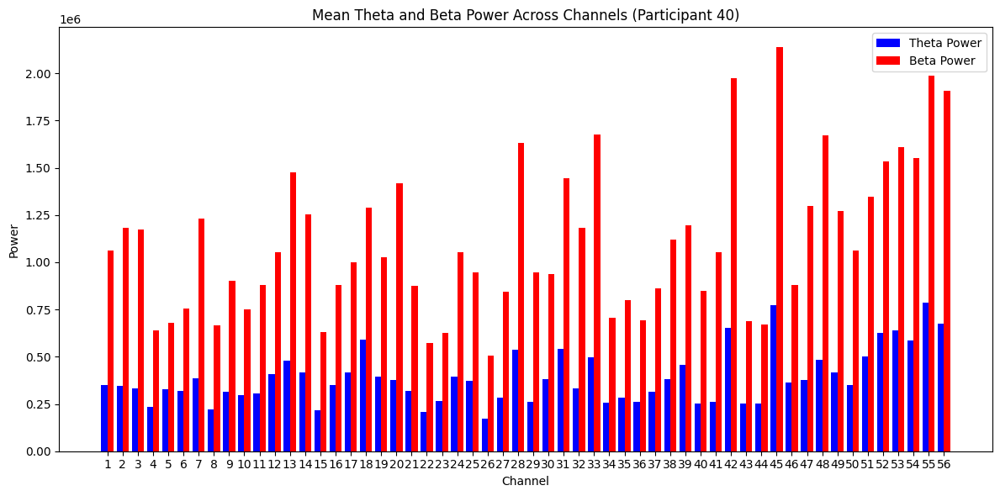

Participant 40: Top Channels by TBR: [ 5 18  6 23 17]
Participant 41: Data Shape: (385, 56, 292)


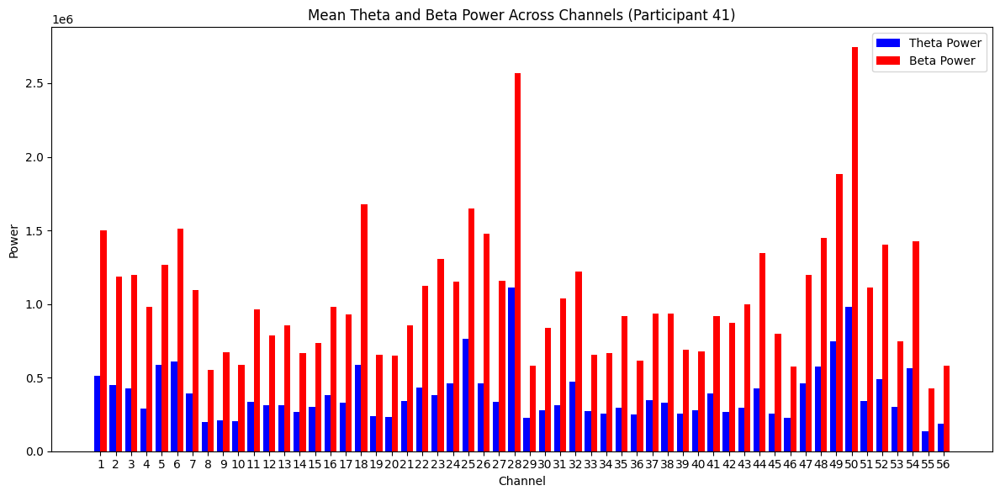

Participant 41: Top Channels by TBR: [ 5 25 28 41 33]
Participant 42: Data Shape: (385, 56, 290)


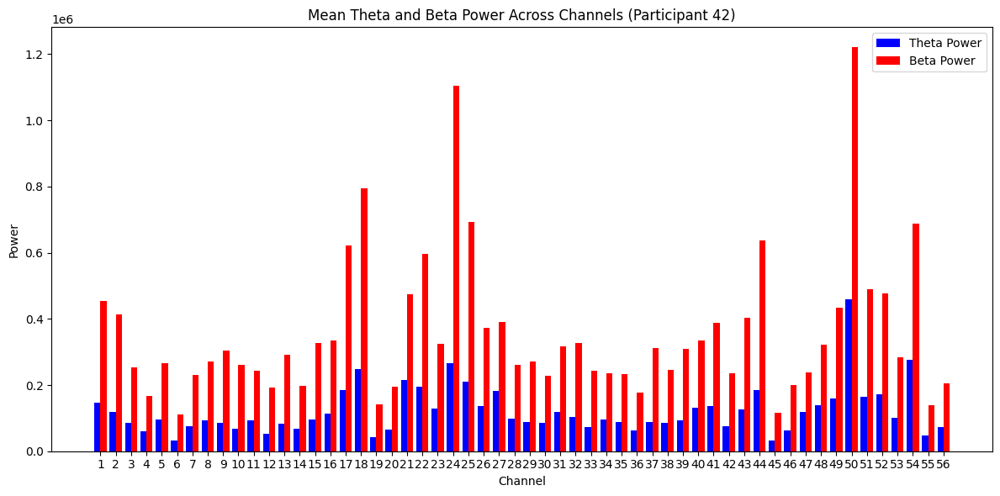

Participant 42: Top Channels by TBR: [47 27 21 48 34]
Participant 43: Data Shape: (385, 56, 277)


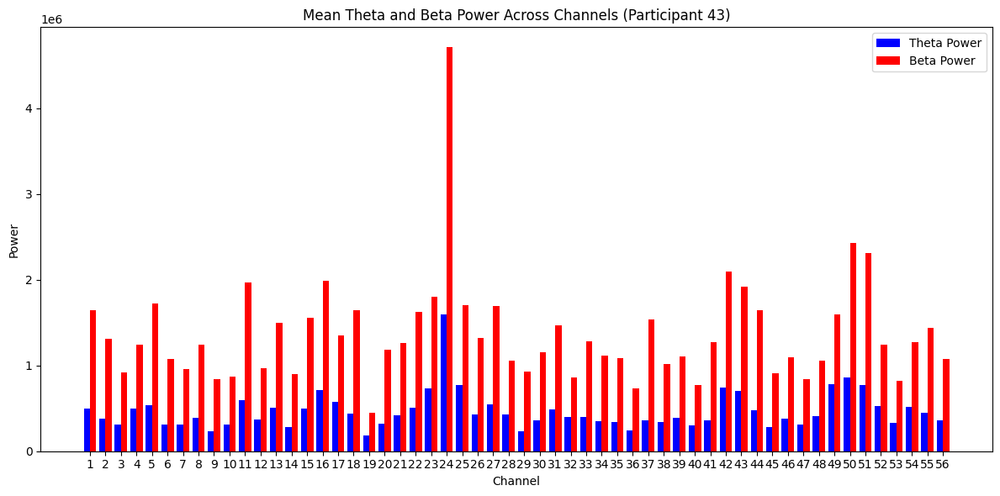

Participant 43: Top Channels by TBR: [49 32 25 17 52]
Participant 44: Data Shape: (385, 56, 278)


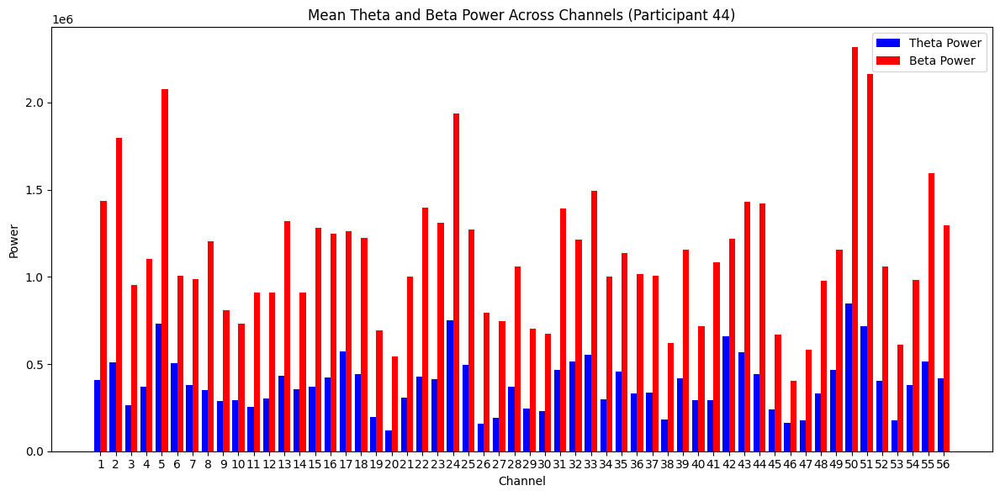

Participant 44: Top Channels by TBR: [42  6 17 32 40]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
import scipy.io

# Step 1: Load the EEG data from the combined file
mat_data = scipy.io.loadmat('/content/drive/MyDrive/EEG_dataset/control_Files_combined.mat')
eeg_data = mat_data['combined_data']  # Adjust this based on the actual key in the .mat file
print(f"EEG Data Shape: {eeg_data.shape}")  # Confirm structure (time_points, num_channels, num_trials)

# Step 2: Define participant trials
participant_trials = {
    1: 281, 2: 262, 3: 295, 4: 229, 5: 255, 6: 135, 7: 232, 8: 254,
    9: 159, 10: 272, 11: 279, 12: 168, 13: 137, 14: 237, 15: 205, 16: 115,
    17: 195, 18: 229, 19: 222, 20: 209, 21: 160, 22: 229, 23: 203, 24: 99,
    25: 229, 26: 241, 27: 79, 28: 287, 29: 102, 30: 279, 31: 278, 32: 276,
    33: 280, 34: 241, 35: 288, 36: 273, 37: 267, 38: 259, 39: 273, 40: 279,
    41: 292, 42: 290, 43: 277, 44: 278
}

# Step 3: Sampling frequency and STFT parameters
fs = 256  # Hz
nperseg = 128  # Points per segment for STFT

# Initialize start trial index
start_trial = 0

# Step 4: Loop through participants and process their data
for participant, num_trials in participant_trials.items():
    # Determine trial range for the participant
    end_trial = start_trial + num_trials
    eeg_data_participant = eeg_data[:, :, start_trial:end_trial]
    start_trial = end_trial  # Update start trial for the next participant

    # Confirm participant data shape
    print(f"Participant {participant}: Data Shape: {eeg_data_participant.shape}")  # (time_points, num_channels, num_trials)

    # Initialize arrays to store Theta and Beta power
    num_channels = eeg_data_participant.shape[1]
    theta_power = np.zeros(num_channels)
    beta_power = np.zeros(num_channels)

    # Step 5: Calculate Theta and Beta power for each channel
    for channel in range(num_channels):
        # Concatenate all trials for the current channel
        channel_data = eeg_data_participant[:, channel, :].flatten()

        # Apply STFT
        f, t, Zxx = stft(channel_data, fs=fs, nperseg=nperseg)
        magnitude = np.abs(Zxx)

        # Compute power for Theta (4-8 Hz) and Beta (13-30 Hz)
        theta_power[channel] = np.sum(magnitude[(f >= 4) & (f <= 8)]**2)
        beta_power[channel] = np.sum(magnitude[(f >= 13) & (f <= 30)]**2)

    # Compute Theta-to-Beta Ratio (TBR) for each channel
    epsilon = 1e-10  # To prevent division by zero
    theta_to_beta_ratio = theta_power / (beta_power + epsilon)

    # Step 6: Visualize power for each channel
    x = np.arange(1, num_channels + 1)  # Channel indices
    plt.figure(figsize=(12, 6))
    plt.bar(x - 0.2, theta_power, width=0.4, label='Theta Power', color='blue')
    plt.bar(x + 0.2, beta_power, width=0.4, label='Beta Power', color='red')
    plt.title(f'Mean Theta and Beta Power Across Channels (Participant {participant})')
    plt.xlabel('Channel')
    plt.ylabel('Power')
    plt.xticks(x, x)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Step 7: Identify top channels based on TBR
    sorted_indices = np.argsort(theta_to_beta_ratio)[::-1]  # Sort in descending order
    top_channels = sorted_indices[:5] + 1  # Convert to 1-based indexing
    print(f"Participant {participant}: Top Channels by TBR: {top_channels}")


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
import scipy.io
from collections import Counter

# Step 1: Load the EEG data from a .mat file
mat_data = scipy.io.loadmat('/content/drive/MyDrive/EEG_dataset/control_Files_combined.mat')

# Verify shape of the loaded data
eeg_data = mat_data['combined_data']
print(f"EEG Data Shape: {eeg_data.shape}")  # Check the data structure

# Step 2: Define the trial details for each participant

participant_trials = {
    1: 281, 2: 262, 3: 295, 4: 229, 5: 255, 6: 135,
    7: 232, 8: 254, 9: 159, 10: 272, 11: 279, 12: 168,
    13: 137, 14: 237, 15: 205, 16: 115, 17: 195, 18: 229,
    19: 222, 20: 209, 21: 160, 22: 229, 23: 203, 24: 99,
    25: 229, 26: 241, 27: 79, 28: 287, 29: 102, 30: 279,
    31: 278, 32: 276, 33: 280, 34: 241, 35: 288, 36: 273,
    37: 267, 38: 259, 39: 273, 40: 279, 41: 292, 42: 290,
    43: 277, 44: 278
}


# Step 3: Sampling frequency and parameters
fs = 256  # Sampling frequency (Hz)
nperseg = 128  # Number of points per segment for STFT

# Number of time points and channels
time_points, num_channels, _ = eeg_data.shape

# List to store top 5 channels for each participant
top_channels_all_participants = []

# Step 4: Loop through each participant to plot the Theta and Beta power and extract top channels
for participant, num_trials in participant_trials.items():
    # Get the correct range of trials for the participant
    start_trial = sum([participant_trials[i] for i in range(1, participant)])  # Summing previous trials
    end_trial = start_trial + num_trials  # Get the end trial index for the current participant

    # Extract data for the current participant
    eeg_data_participant = eeg_data[:, :, start_trial:end_trial]

    # Verify the shape of the data slice for the participant
    print(f"Selected Data Shape for Participant {participant}: {eeg_data_participant.shape}")

    # Number of trials for this participant
    _, num_channels, num_trials = eeg_data_participant.shape

    # Initialize arrays to store power for Theta and Beta bands for each channel
    theta_power = np.zeros((num_channels, num_trials))  # (Channels x Trials)
    beta_power = np.zeros((num_channels, num_trials))   # (Channels x Trials)

    # Step 5: Apply STFT to each channel across the trials and calculate Theta and Beta power
    for channel in range(num_channels):
        for trial in range(num_trials):
            # Apply STFT to the trial and channel
            f, t, Zxx = stft(eeg_data_participant[:, channel, trial], fs=fs, nperseg=nperseg)

            # Magnitude of the STFT (frequency vs. time representation)
            magnitude = np.abs(Zxx)

            # Mask for Theta band (4-8 Hz)
            theta_mask = (f >= 4) & (f <= 8)
            # Mask for Beta band (13-30 Hz)
            beta_mask = (f >= 13) & (f <= 30)

            # Compute power in the Theta and Beta bands (sum of squared magnitude)
            theta_power[channel, trial] = np.sum(magnitude[theta_mask]**2)
            beta_power[channel, trial] = np.sum(magnitude[beta_mask]**2)

    # Step 6: Aggregate the power for Theta and Beta bands across trials for each channel
    mean_theta_power = np.mean(theta_power, axis=1)  # Mean Theta power for each channel
    mean_beta_power = np.mean(beta_power, axis=1)    # Mean Beta power for each channel

    # Step 7: Compute Theta-to-Beta Ratio (TBR) for each channel
    epsilon = 1e-10  # Prevent division by zero
    theta_to_beta_ratio = mean_theta_power / (mean_beta_power + epsilon)

    # Step 8: Find the top 5 channels by TBR for the participant
    sorted_indices = np.argsort(theta_to_beta_ratio)[::-1]  # Descending order
    top_channels = sorted_indices[:5]  # Get top 5 channels by TBR

    # Store the top 5 channels for this participant
    top_channels_all_participants.extend(top_channels)

    # Optional: Plot the Theta and Beta power
    # (You can use the previous plotting code here if you still want to visualize)

# Step 9: Count the frequency of each channel across all participants
channel_counts = Counter(top_channels_all_participants)

# Step 10: Sort channels by frequency of occurrence
sorted_channel_counts = channel_counts.most_common()

# Step 11: Display the most common top channels
print("\nMost Common Top Channels (across all participants):")
for channel, count in sorted_channel_counts:
    print(f"Channel {channel + 1}: {count} occurrences")

EEG Data Shape: (385, 56, 10129)
Selected Data Shape for Participant 1: (385, 56, 281)
Selected Data Shape for Participant 2: (385, 56, 262)
Selected Data Shape for Participant 3: (385, 56, 295)
Selected Data Shape for Participant 4: (385, 56, 229)
Selected Data Shape for Participant 5: (385, 56, 255)
Selected Data Shape for Participant 6: (385, 56, 135)
Selected Data Shape for Participant 7: (385, 56, 232)
Selected Data Shape for Participant 8: (385, 56, 254)
Selected Data Shape for Participant 9: (385, 56, 159)
Selected Data Shape for Participant 10: (385, 56, 272)
Selected Data Shape for Participant 11: (385, 56, 279)
Selected Data Shape for Participant 12: (385, 56, 168)
Selected Data Shape for Participant 13: (385, 56, 137)
Selected Data Shape for Participant 14: (385, 56, 237)
Selected Data Shape for Participant 15: (385, 56, 205)
Selected Data Shape for Participant 16: (385, 56, 115)
Selected Data Shape for Participant 17: (385, 56, 195)
Selected Data Shape for Participant 18: (

EEG Data Shape: (385, 56, 10129)
Selected Data Shape for Participant 1: (385, 56, 281)
Selected Data Shape for Participant 2: (385, 56, 262)
Selected Data Shape for Participant 3: (385, 56, 295)
Selected Data Shape for Participant 4: (385, 56, 229)
Selected Data Shape for Participant 5: (385, 56, 255)
Selected Data Shape for Participant 6: (385, 56, 135)
Selected Data Shape for Participant 7: (385, 56, 232)
Selected Data Shape for Participant 8: (385, 56, 254)
Selected Data Shape for Participant 9: (385, 56, 159)
Selected Data Shape for Participant 10: (385, 56, 272)
Selected Data Shape for Participant 11: (385, 56, 279)
Selected Data Shape for Participant 12: (385, 56, 168)
Selected Data Shape for Participant 13: (385, 56, 137)
Selected Data Shape for Participant 14: (385, 56, 237)
Selected Data Shape for Participant 15: (385, 56, 205)
Selected Data Shape for Participant 16: (385, 56, 115)
Selected Data Shape for Participant 17: (385, 56, 195)
Selected Data Shape for Participant 18: (

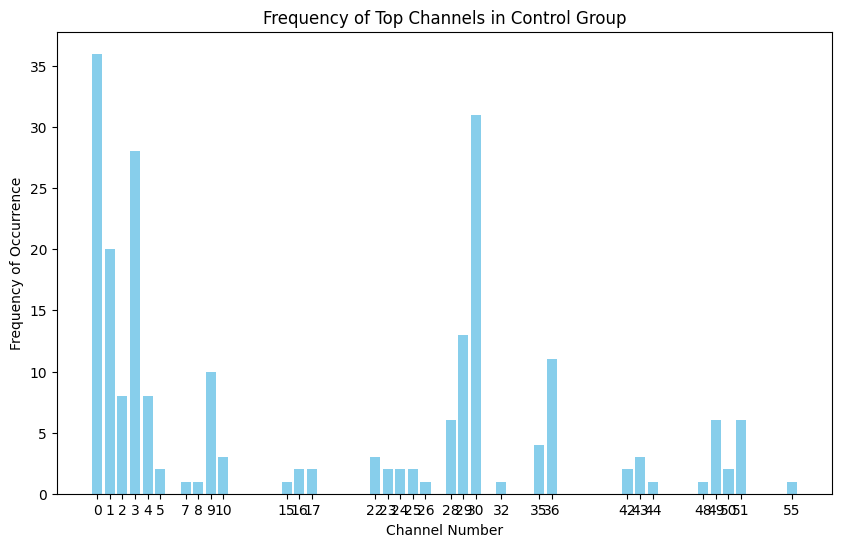

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
import scipy.io
from collections import Counter

# Step 1: Load the EEG data from a .mat file
mat_data = scipy.io.loadmat('/content/drive/MyDrive/EEG_dataset/control_Files_combined.mat')  # Control group data

# Verify shape of the loaded data
eeg_data = mat_data['combined_data']
print(f"EEG Data Shape: {eeg_data.shape}")  # Check the data structure

control_participant_trials = {
    1: 281, 2: 262, 3: 295, 4: 229, 5: 255, 6: 135, 7: 232, 8: 254,
    9: 159, 10: 272, 11: 279, 12: 168, 13: 137, 14: 237, 15: 205, 16: 115,
    17: 195, 18: 229, 19: 222, 20: 209, 21: 160, 22: 229, 23: 203, 24: 99,
    25: 229, 26: 241, 27: 79, 28: 287, 29: 102, 30: 279, 31: 278, 32: 276,
    33: 280, 34: 241, 35: 288, 36: 273, 37: 267, 38: 259, 39: 273, 40: 279,
    41: 292, 42: 290, 43: 277, 44: 278
}

# Step 3: Sampling frequency and parameters
fs = 256  # Sampling frequency (Hz)
nperseg = 128  # Number of points per segment for STFT

# Number of time points and channels
time_points, num_channels, _ = eeg_data.shape

# List to store top 5 channels for each participant
top_channels_all_participants = []

# Step 4: Loop through each participant in the control group to aggregate the trials and extract power
for participant, num_trials in control_participant_trials.items():
    # Get the correct range of trials for the participant
    start_trial = sum([control_participant_trials[i] for i in range(1, participant)])  # Summing previous trials
    end_trial = start_trial + num_trials  # Get the end trial index for the current participant

    # Extract data for the current participant
    eeg_data_participant = eeg_data[:, :, start_trial:end_trial]

    # Verify the shape of the data slice for the participant
    print(f"Selected Data Shape for Participant {participant}: {eeg_data_participant.shape}")

    # Number of trials for this participant
    _, num_channels, num_trials = eeg_data_participant.shape

    # Initialize arrays to store power for Theta and Beta bands for each channel
    theta_power = np.zeros((num_channels, num_trials))  # (Channels x Trials)
    beta_power = np.zeros((num_channels, num_trials))   # (Channels x Trials)

    # Step 5: Apply STFT to each channel across the trials and calculate Theta and Beta power
    for channel in range(num_channels):
        for trial in range(num_trials):
            # Apply STFT to the trial and channel
            f, t, Zxx = stft(eeg_data_participant[:, channel, trial], fs=fs, nperseg=nperseg)

            # Magnitude of the STFT (frequency vs. time representation)
            magnitude = np.abs(Zxx)

            # Mask for Theta band (4-8 Hz)
            theta_mask = (f >= 4) & (f <= 8)
            # Mask for Beta band (13-30 Hz)
            beta_mask = (f >= 13) & (f <= 30)

            # Compute power in the Theta and Beta bands (sum of squared magnitude)
            theta_power[channel, trial] = np.sum(magnitude[theta_mask]**2)
            beta_power[channel, trial] = np.sum(magnitude[beta_mask]**2)

    # Step 6: Aggregate the power for Theta and Beta bands across trials for each channel
    mean_theta_power = np.mean(theta_power, axis=1)  # Mean Theta power for each channel
    mean_beta_power = np.mean(beta_power, axis=1)    # Mean Beta power for each channel

    # Step 7: Compute Theta-to-Beta Ratio (TBR) for each channel
    epsilon = 1e-10  # Prevent division by zero
    theta_to_beta_ratio = mean_theta_power / (mean_beta_power + epsilon)

    # Step 8: Find the top 5 channels by TBR for the participant
    sorted_indices = np.argsort(theta_to_beta_ratio)[::-1]  # Descending order
    top_channels = sorted_indices[:5]  # Get top 5 channels by TBR

    # Store the top 5 channels for this participant
    top_channels_all_participants.extend(top_channels)

# Step 9: Count the frequency of each channel across all participants
channel_counts = Counter(top_channels_all_participants)

# Step 10: Sort channels by frequency of occurrence
sorted_channel_counts = channel_counts.most_common()

# Step 11: Display the most common top channels
print("\nMost Common Top Channels (across all participants):")
for channel, count in sorted_channel_counts:
    print(f"Channel {channel + 1}: {count} occurrences")

# Step 12: Plot the frequencies of the top channels
channels, frequencies = zip(*sorted_channel_counts)

plt.figure(figsize=(10, 6))
plt.bar(channels, frequencies, color='skyblue')
plt.xlabel('Channel Number')
plt.ylabel('Frequency of Occurrence')
plt.title('Frequency of Top Channels in Control Group')
plt.xticks(channels)
plt.show()


In [ ]:
#channels 31 1 4 has the highest tbr values

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
import scipy.io
from collections import Counter

# Step 1: Load the EEG data from a .mat file
mat_data = scipy.io.loadmat('/content/drive/MyDrive/EEG_dataset/ADHD_Files_combined.mat')

# Verify shape of the loaded data
eeg_data = mat_data['combined_data']
print(f"EEG Data Shape: {eeg_data.shape}")  # Check the data structure

# Step 2: Define the trial details for each participant
participant_trials = {
    1: 257, 2: 279, 3: 46, 4: 259, 5: 205, 6: 262,
    7: 214, 8: 262, 9: 261, 10: 265, 11: 285, 12: 255,
    13: 213, 14: 238, 15: 168, 16: 125, 17: 239, 18: 195,
    19: 286, 20: 197, 21: 234, 22: 203, 23: 223, 24: 265,
    25: 255, 26: 226, 27: 264, 28: 259, 29: 260, 30: 290,
    31: 287, 32: 229, 33: 172, 34: 219, 35: 217, 36: 129,
    37: 187, 38: 51, 39: 269, 40: 234, 41: 124, 42: 204,
    43: 262, 44: 254, 45: 142, 46: 270, 47: 219, 48: 283
}

# Step 3: Sampling frequency and parameters
fs = 256  # Sampling frequency (Hz)
nperseg = 128  # Number of points per segment for STFT

# Number of time points and channels
time_points, num_channels, _ = eeg_data.shape

# Lists to store top 5 channels with highest and lowest TBR for each participant
top_channels_highest_tbr = []
top_channels_lowest_tbr = []

# Step 4: Loop through each participant to calculate the Theta-to-Beta Ratio (TBR)
for participant, num_trials in participant_trials.items():
    # Get the correct range of trials for the participant
    start_trial = sum([participant_trials[i] for i in range(1, participant)])  # Summing previous trials
    end_trial = start_trial + num_trials  # Get the end trial index for the current participant

    # Extract data for the current participant
    eeg_data_participant = eeg_data[:, :, start_trial:end_trial]

    # Verify the shape of the data slice for the participant
    print(f"Selected Data Shape for Participant {participant}: {eeg_data_participant.shape}")

    # Number of trials for this participant
    _, num_channels, num_trials = eeg_data_participant.shape

    # Initialize arrays to store power for Theta and Beta bands for each channel
    theta_power = np.zeros((num_channels, num_trials))  # (Channels x Trials)
    beta_power = np.zeros((num_channels, num_trials))   # (Channels x Trials)

    # Step 5: Apply STFT to each channel across the trials and calculate Theta and Beta power
    for channel in range(num_channels):
        for trial in range(num_trials):
            # Apply STFT to the trial and channel
            f, t, Zxx = stft(eeg_data_participant[:, channel, trial], fs=fs, nperseg=nperseg)

            # Magnitude of the STFT (frequency vs. time representation)
            magnitude = np.abs(Zxx)

            # Mask for Theta band (4-8 Hz)
            theta_mask = (f >= 4) & (f <= 8)
            # Mask for Beta band (13-30 Hz)
            beta_mask = (f >= 13) & (f <= 30)

            # Compute power in the Theta and Beta bands (sum of squared magnitude)
            theta_power[channel, trial] = np.sum(magnitude[theta_mask]**2)
            beta_power[channel, trial] = np.sum(magnitude[beta_mask]**2)

    # Step 6: Aggregate the power for Theta and Beta bands across trials for each channel
    mean_theta_power = np.mean(theta_power, axis=1)  # Mean Theta power for each channel
    mean_beta_power = np.mean(beta_power, axis=1)    # Mean Beta power for each channel

    # Step 7: Compute Theta-to-Beta Ratio (TBR) for each channel
    epsilon = 1e-10  # Prevent division by zero
    theta_to_beta_ratio = mean_theta_power / (mean_beta_power + epsilon)

    # Step 8: Find the top 5 channels by TBR (highest) and the bottom 5 channels (lowest)
    sorted_indices_highest = np.argsort(theta_to_beta_ratio)[::-1]  # Descending order for highest
    sorted_indices_lowest = np.argsort(theta_to_beta_ratio)          # Ascending order for lowest
    top_channels_highest = sorted_indices_highest[:5]  # Get top 5 channels by highest TBR
    top_channels_lowest = sorted_indices_lowest[:5]    # Get top 5 channels by lowest TBR

    # Store the top 5 channels for highest and lowest TBR for this participant
    top_channels_highest_tbr.extend(top_channels_highest)
    top_channels_lowest_tbr.extend(top_channels_lowest)

    # Optional: Plot the Theta and Beta power
    # (You can use the previous plotting code here if you still want to visualize)

# Step 9: Count the frequency of each channel across all participants for highest and lowest TBR
channel_counts_highest_tbr = Counter(top_channels_highest_tbr)
channel_counts_lowest_tbr = Counter(top_channels_lowest_tbr)

# Step 10: Sort channels by frequency of occurrence for highest and lowest TBR
sorted_channel_counts_highest = channel_counts_highest_tbr.most_common()
sorted_channel_counts_lowest = channel_counts_lowest_tbr.most_common()

# Step 11: Display the most common top channels with highest and lowest TBR
print("\nMost Common Channels with Highest TBR (across all participants):")
for channel, count in sorted_channel_counts_highest:
    print(f"Channel {channel + 1}: {count} occurrences")

print("\nMost Common Channels with Lowest TBR (across all participants):")
for channel, count in sorted_channel_counts_lowest:
    print(f"Channel {channel + 1}: {count} occurrences")


EEG Data Shape: (385, 56, 10742)
Selected Data Shape for Participant 1: (385, 56, 257)
Selected Data Shape for Participant 2: (385, 56, 279)
Selected Data Shape for Participant 3: (385, 56, 46)
Selected Data Shape for Participant 4: (385, 56, 259)
Selected Data Shape for Participant 5: (385, 56, 205)
Selected Data Shape for Participant 6: (385, 56, 262)
Selected Data Shape for Participant 7: (385, 56, 214)
Selected Data Shape for Participant 8: (385, 56, 262)
Selected Data Shape for Participant 9: (385, 56, 261)
Selected Data Shape for Participant 10: (385, 56, 265)
Selected Data Shape for Participant 11: (385, 56, 285)
Selected Data Shape for Participant 12: (385, 56, 255)
Selected Data Shape for Participant 13: (385, 56, 213)
Selected Data Shape for Participant 14: (385, 56, 238)
Selected Data Shape for Participant 15: (385, 56, 168)
Selected Data Shape for Participant 16: (385, 56, 125)
Selected Data Shape for Participant 17: (385, 56, 239)
Selected Data Shape for Participant 18: (3

EEG Data Shape: (385, 56, 10129)
Participant 1: Data Shape: (385, 56, 281)


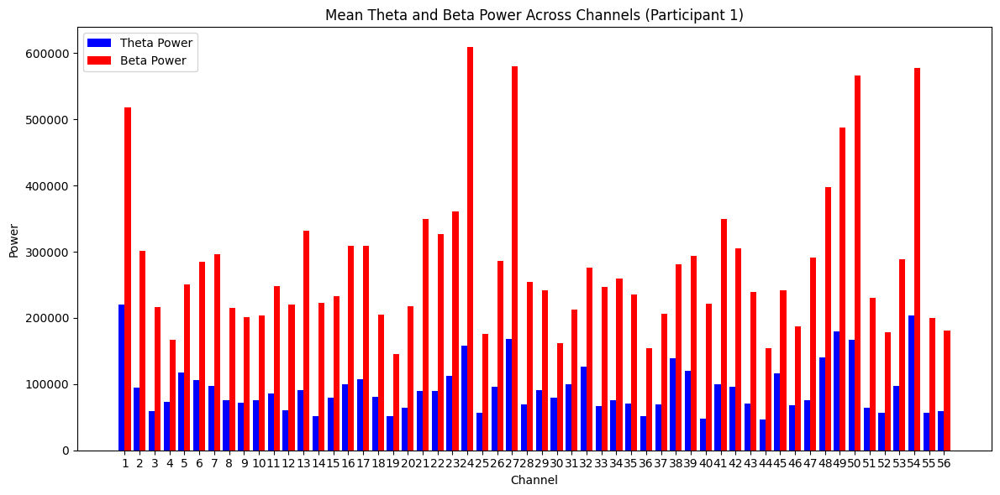

Participant 1: Top Channels by Lowest TBR: [40 14 21 24 47]
Participant 2: Data Shape: (385, 56, 262)


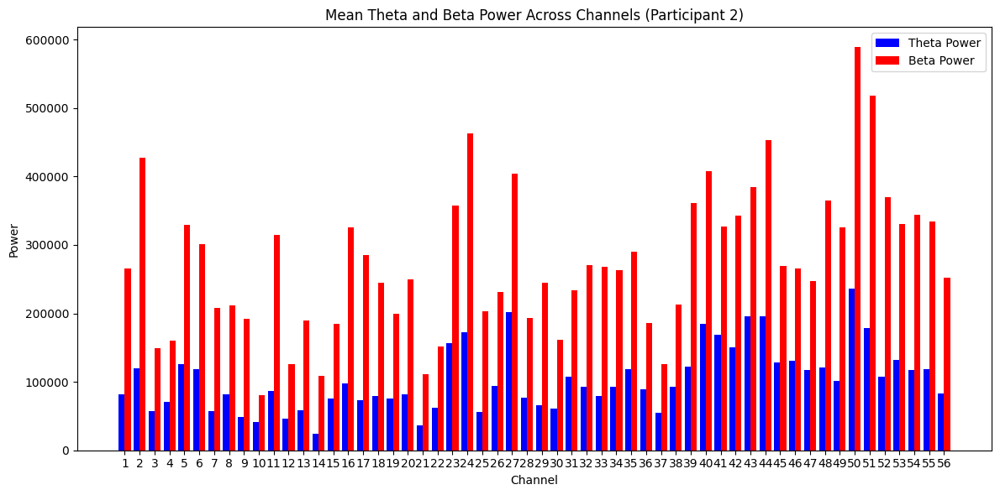

Participant 2: Top Channels by Lowest TBR: [14  9 17 29  7]
Participant 3: Data Shape: (385, 56, 295)


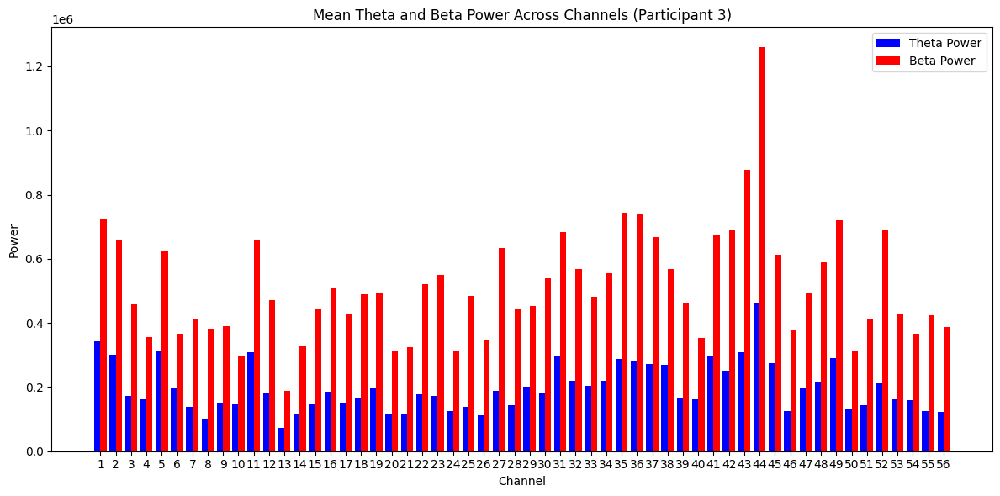

Participant 3: Top Channels by Lowest TBR: [ 8 25 27 55 52]
Participant 4: Data Shape: (385, 56, 229)


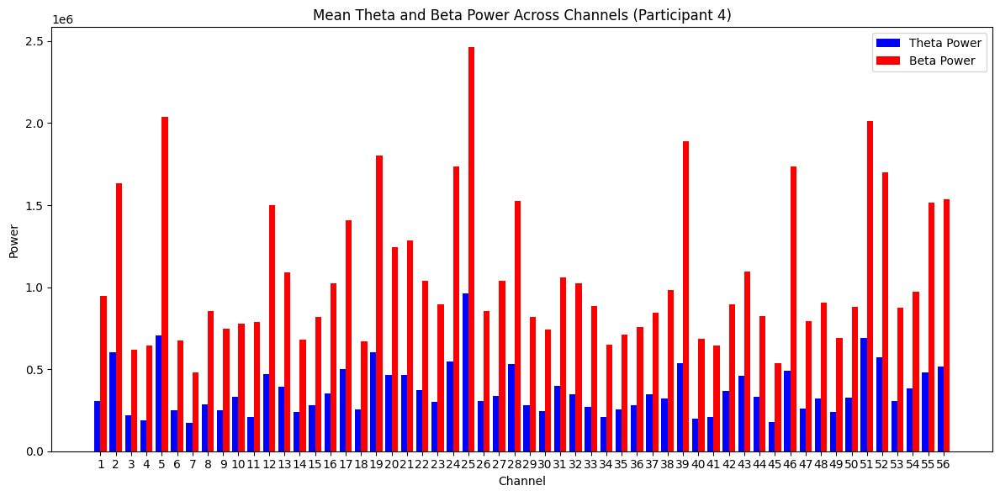

Participant 4: Top Channels by Lowest TBR: [11 46 39 40  4]
Participant 5: Data Shape: (385, 56, 255)


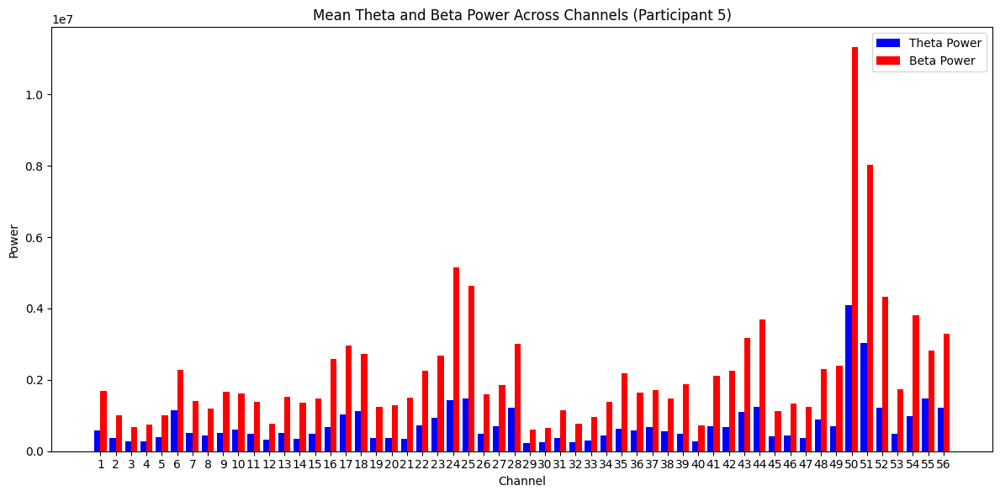

Participant 5: Top Channels by Lowest TBR: [21 54 14 16 39]
Participant 6: Data Shape: (385, 56, 135)


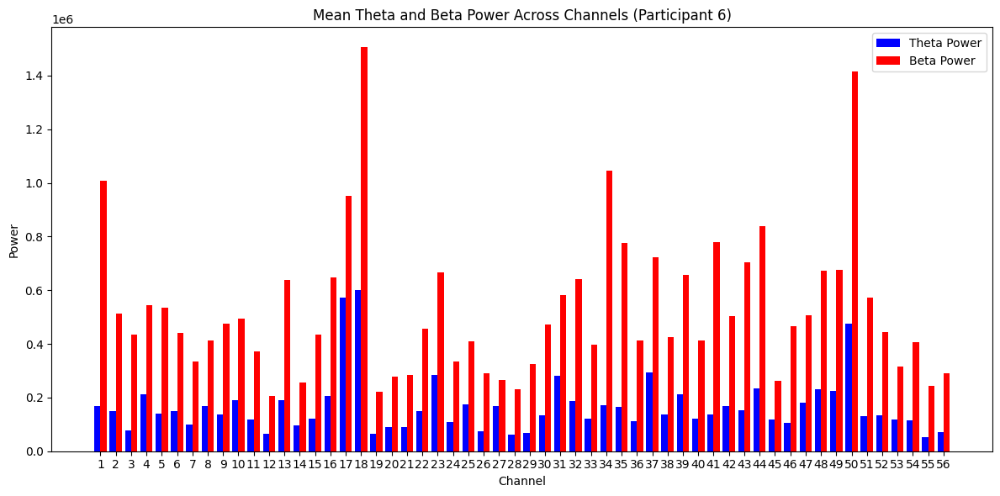

Participant 6: Top Channels by Lowest TBR: [34  1 41  3 29]
Participant 7: Data Shape: (385, 56, 232)


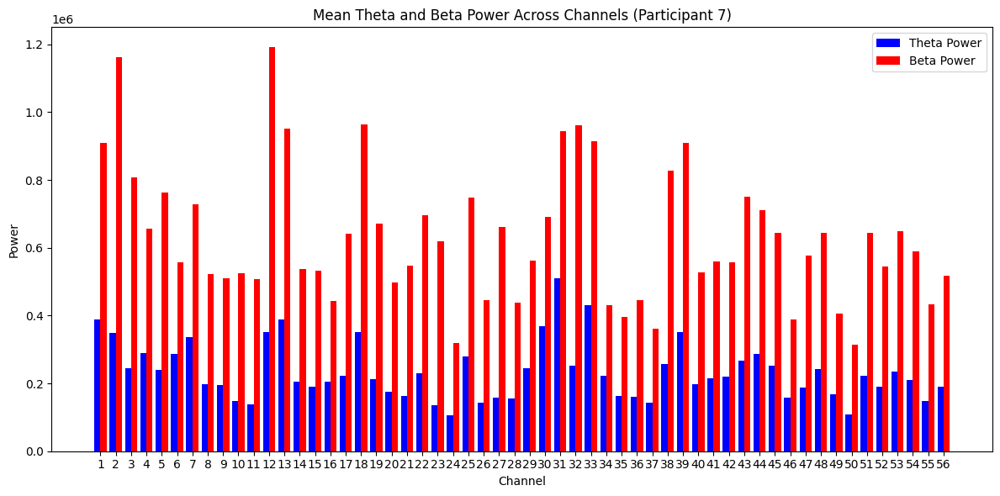

Participant 7: Top Channels by Lowest TBR: [23 27 32 11 10]
Participant 8: Data Shape: (385, 56, 254)


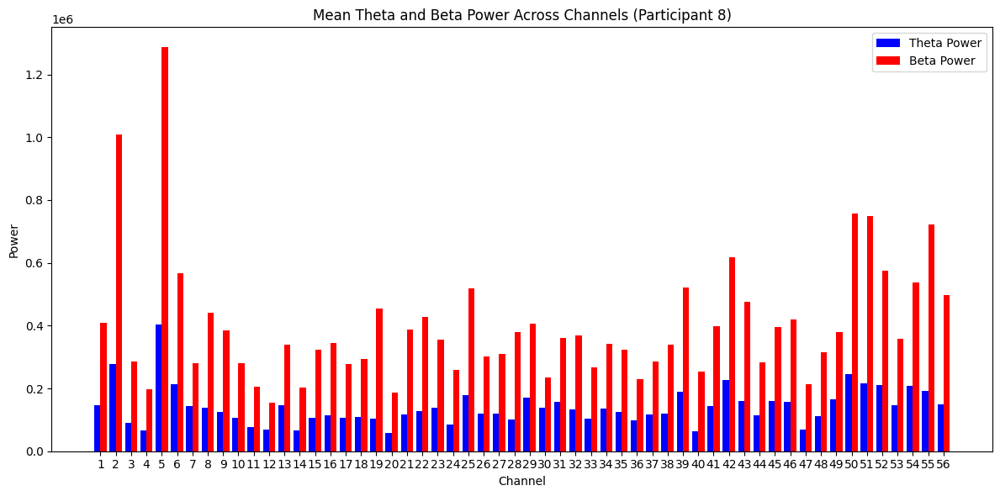

Participant 8: Top Channels by Lowest TBR: [19 40 55 28  2]
Participant 9: Data Shape: (385, 56, 159)


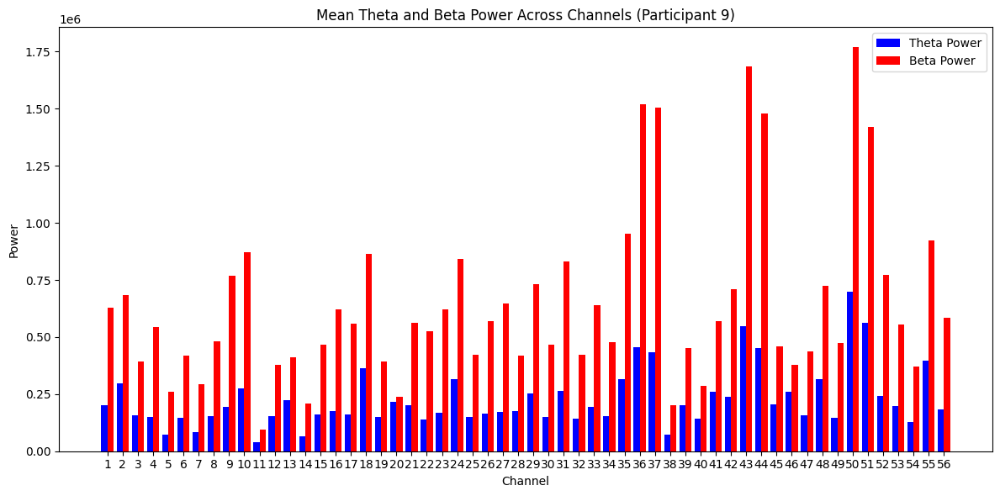

Participant 9: Top Channels by Lowest TBR: [ 9 22 27 23  4]
Participant 10: Data Shape: (385, 56, 272)


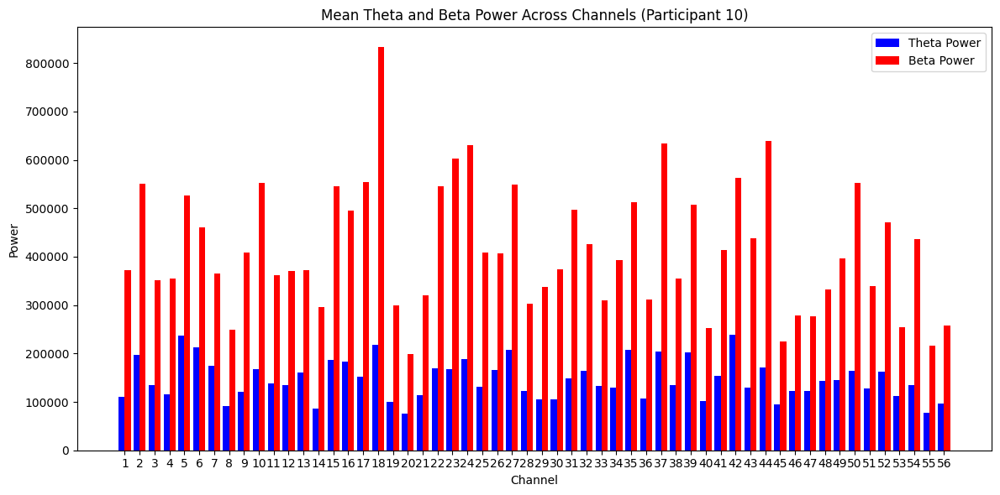

Participant 10: Top Channels by Lowest TBR: [18 44 17 23 30]
Participant 11: Data Shape: (385, 56, 279)


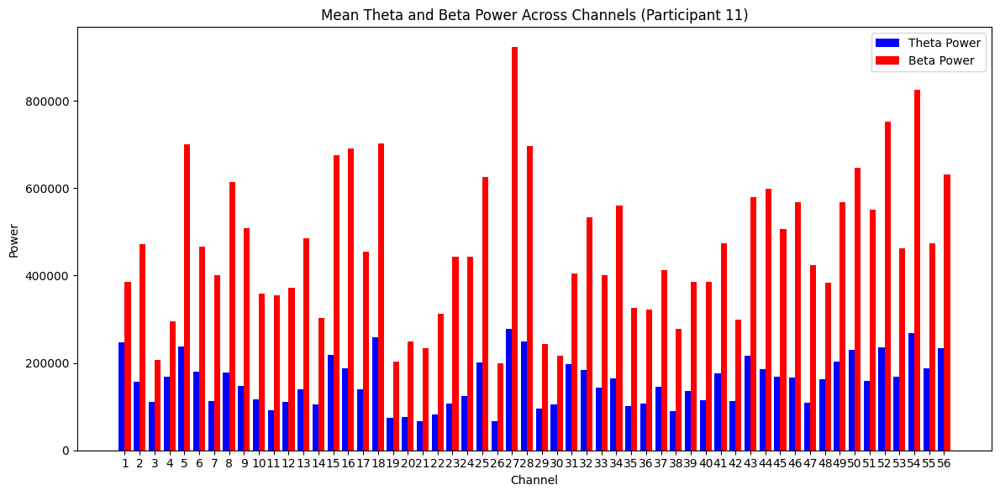

Participant 11: Top Channels by Lowest TBR: [23 47 11 22 16]
Participant 12: Data Shape: (385, 56, 168)


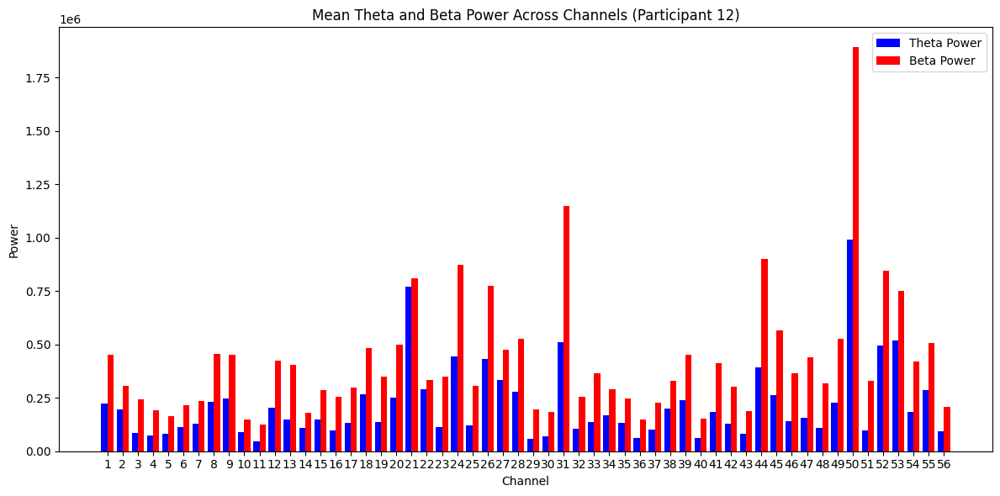

Participant 12: Top Channels by Lowest TBR: [29 51 23 48  3]
Participant 13: Data Shape: (385, 56, 137)


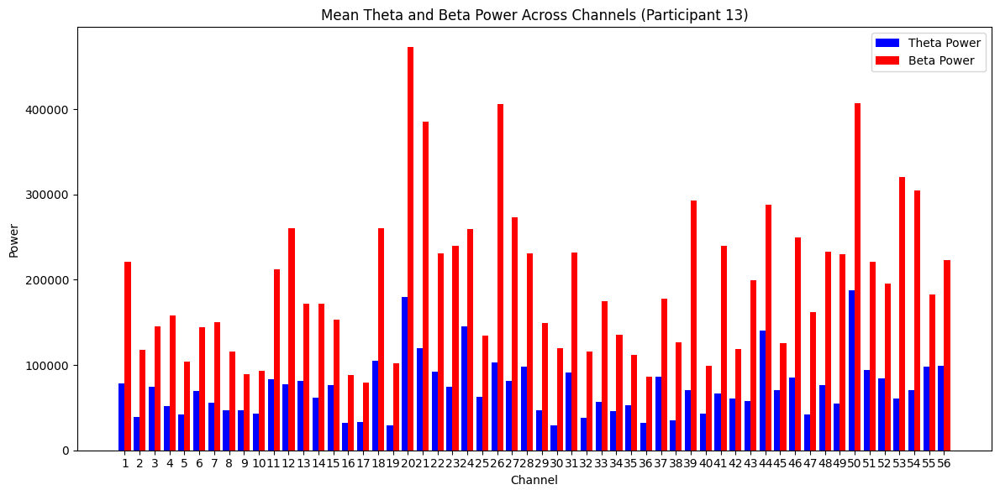

Participant 13: Top Channels by Lowest TBR: [53 54 49 39 30]
Participant 14: Data Shape: (385, 56, 237)


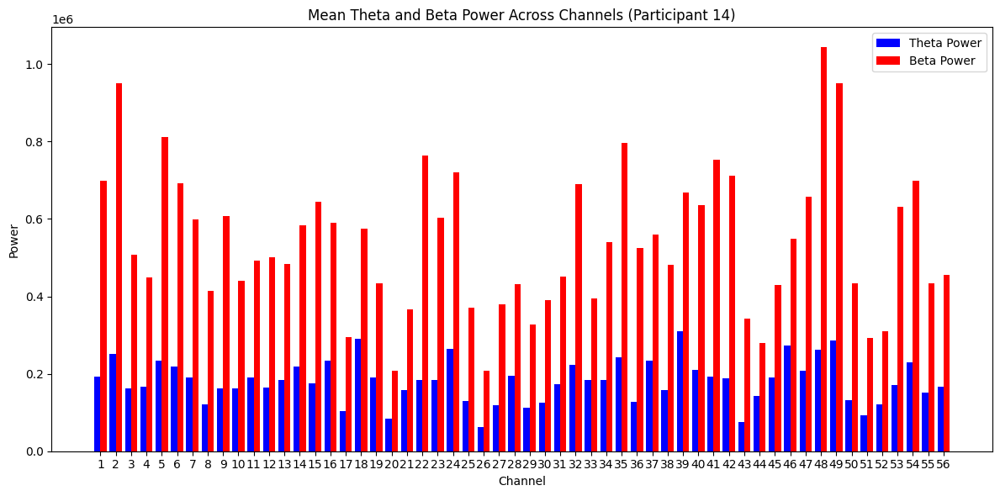

Participant 14: Top Channels by Lowest TBR: [43 36 22 48 41]
Participant 15: Data Shape: (385, 56, 205)


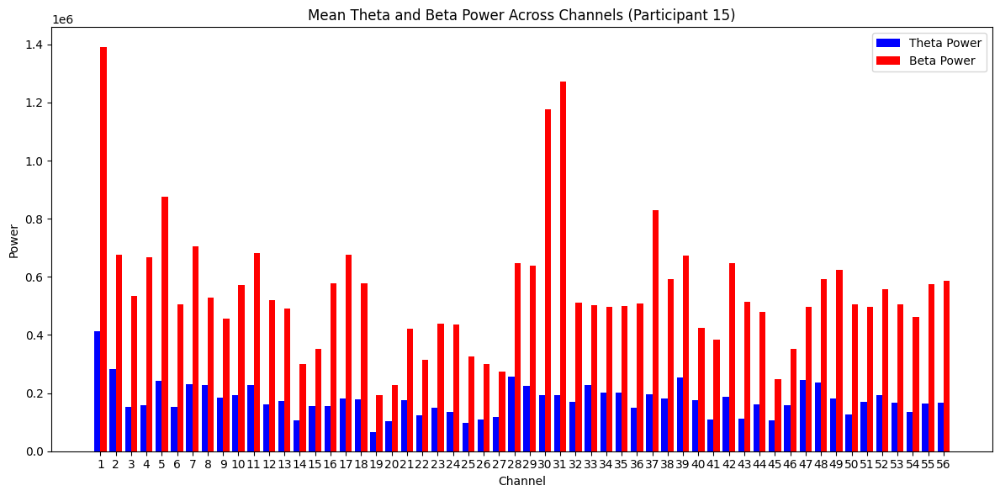

Participant 15: Top Channels by Lowest TBR: [31 30 43 37  4]
Participant 16: Data Shape: (385, 56, 115)


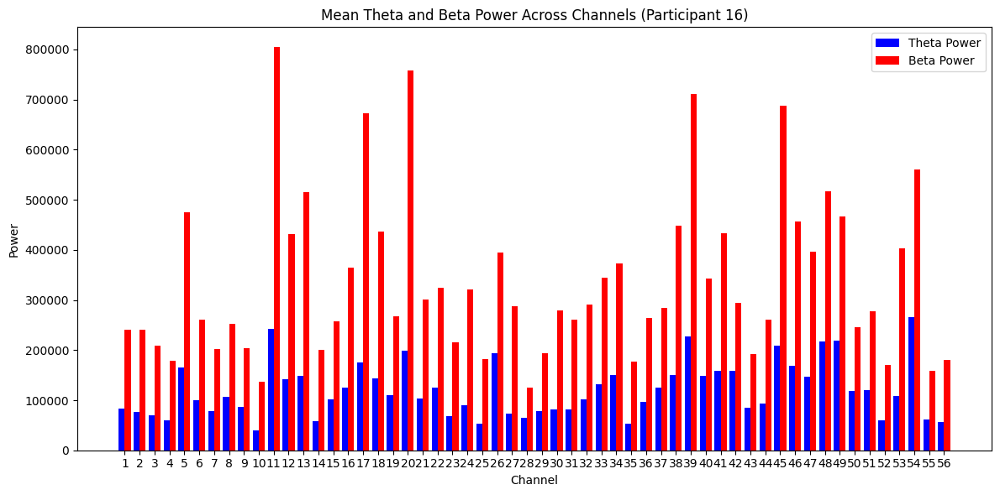

Participant 16: Top Channels by Lowest TBR: [27 17 20 53 24]
Participant 17: Data Shape: (385, 56, 195)


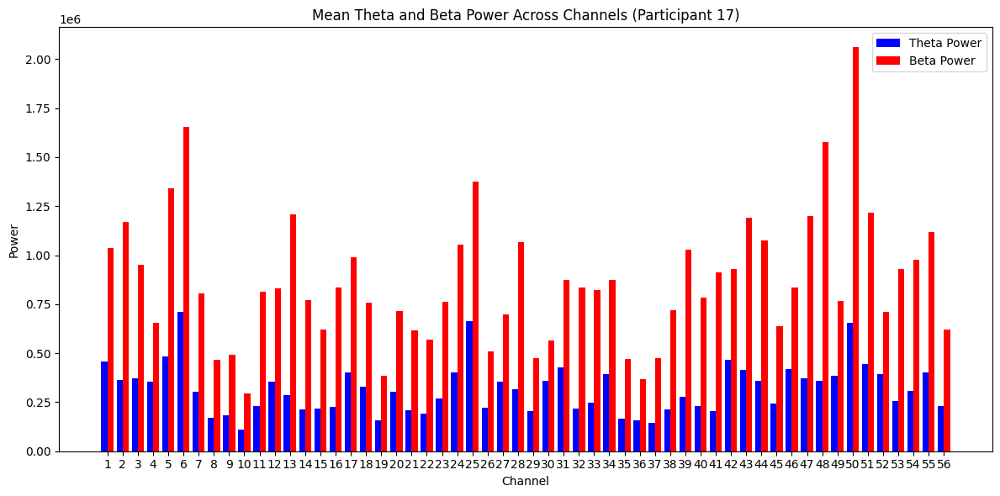

Participant 17: Top Channels by Lowest TBR: [41 48 13 32 16]
Participant 18: Data Shape: (385, 56, 229)


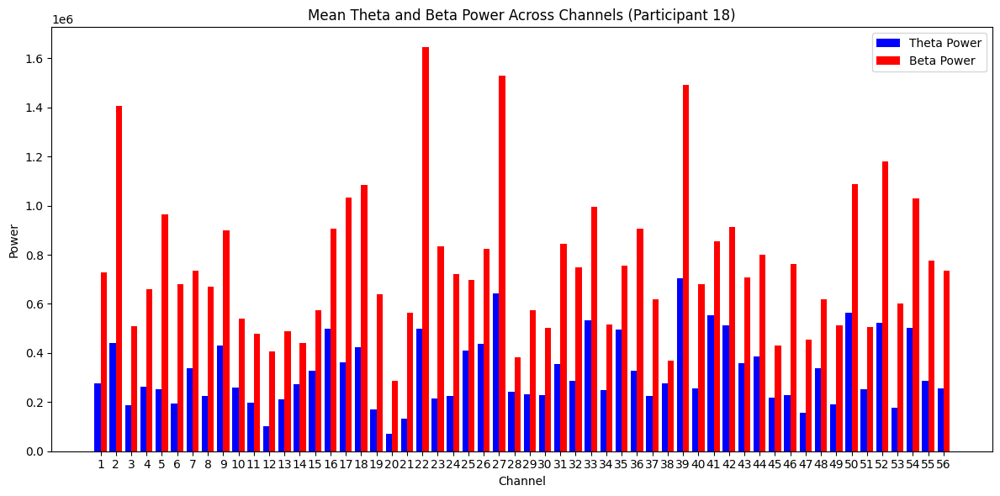

Participant 18: Top Channels by Lowest TBR: [21 20 12 23  5]
Participant 19: Data Shape: (385, 56, 222)


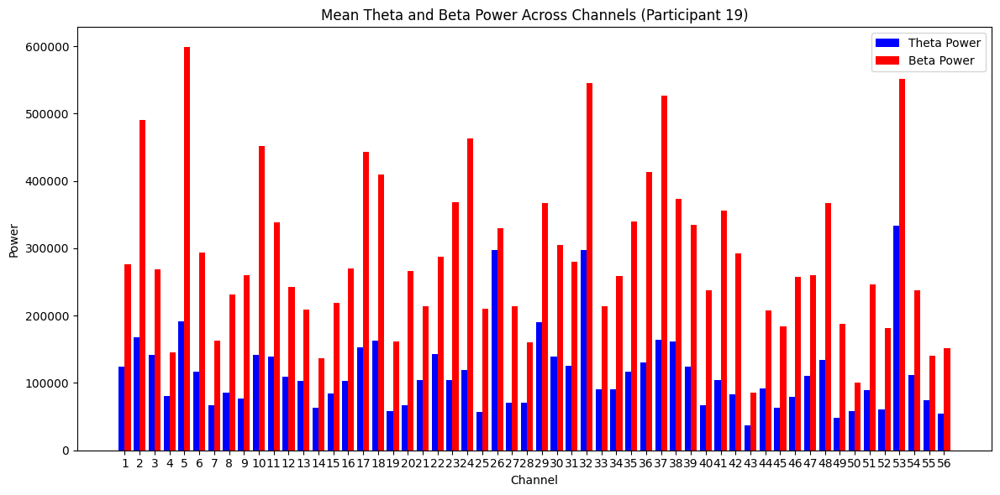

Participant 19: Top Channels by Lowest TBR: [20 49 24 25 42]
Participant 20: Data Shape: (385, 56, 209)


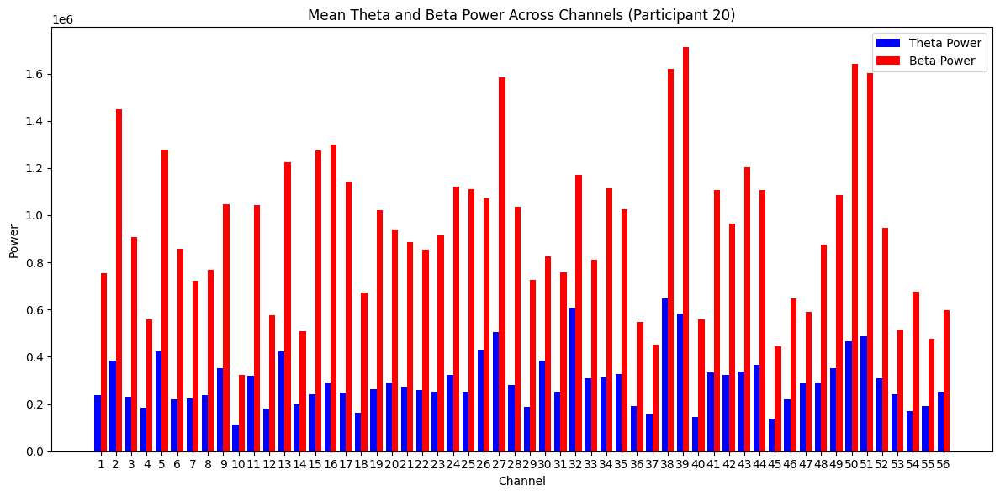

Participant 20: Top Channels by Lowest TBR: [15 17 16 25 18]
Participant 21: Data Shape: (385, 56, 160)


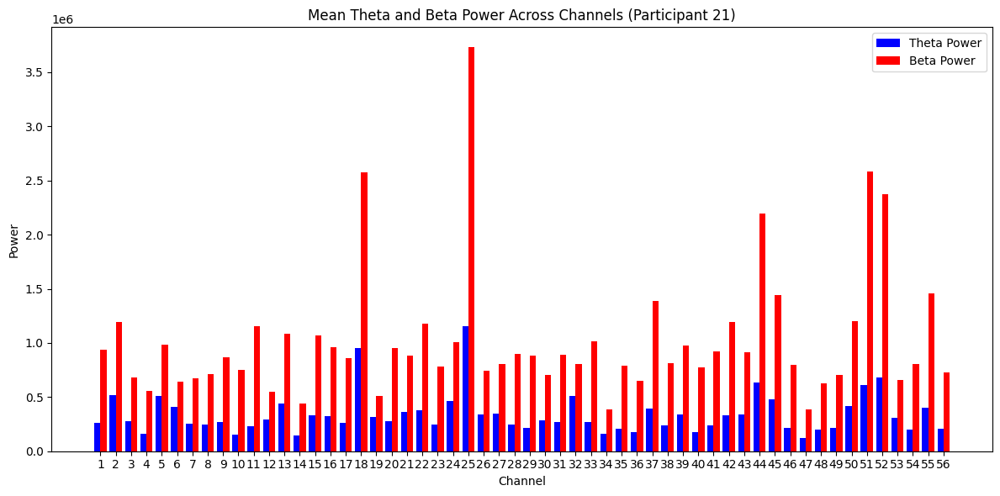

Participant 21: Top Channels by Lowest TBR: [11 10 40 51 29]
Participant 22: Data Shape: (385, 56, 229)


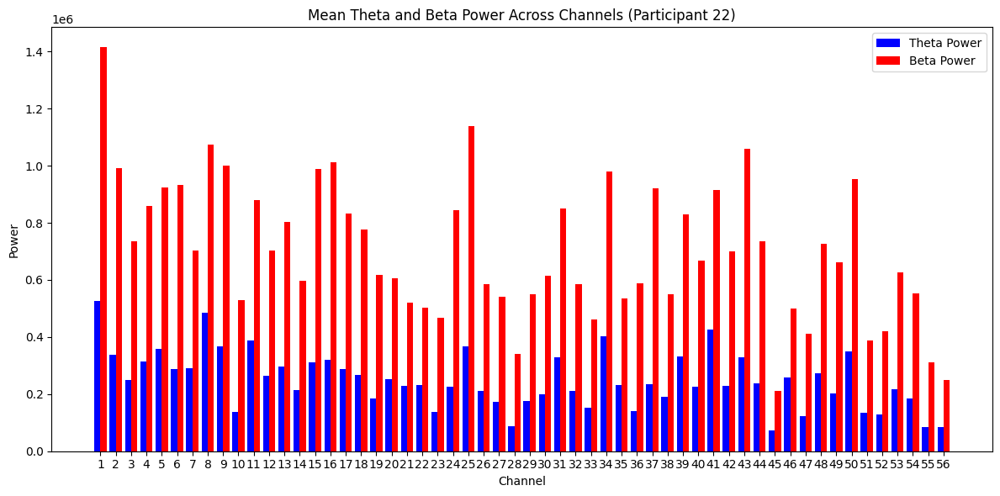

Participant 22: Top Channels by Lowest TBR: [36 37 28 10 55]
Participant 23: Data Shape: (385, 56, 203)


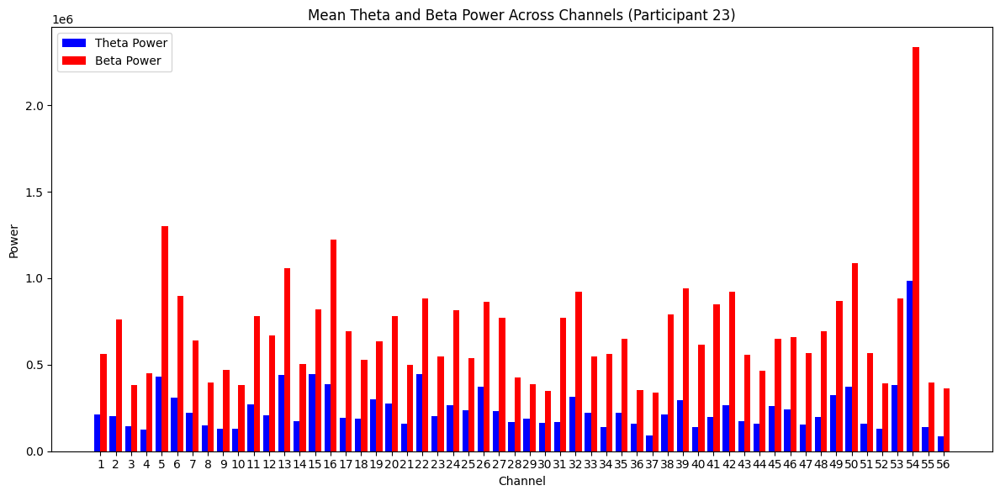

Participant 23: Top Channels by Lowest TBR: [31 40 56 41 34]
Participant 24: Data Shape: (385, 56, 99)


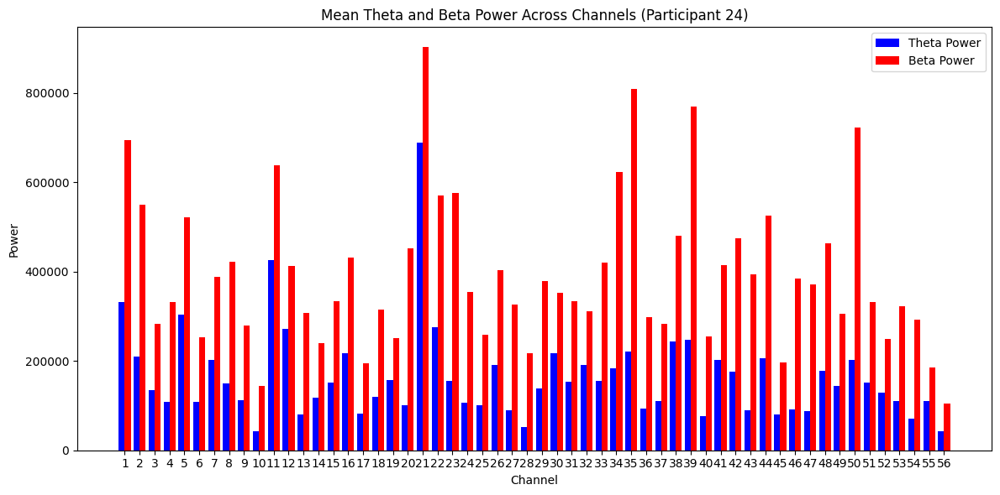

Participant 24: Top Channels by Lowest TBR: [20 43 47 28 46]
Participant 25: Data Shape: (385, 56, 229)


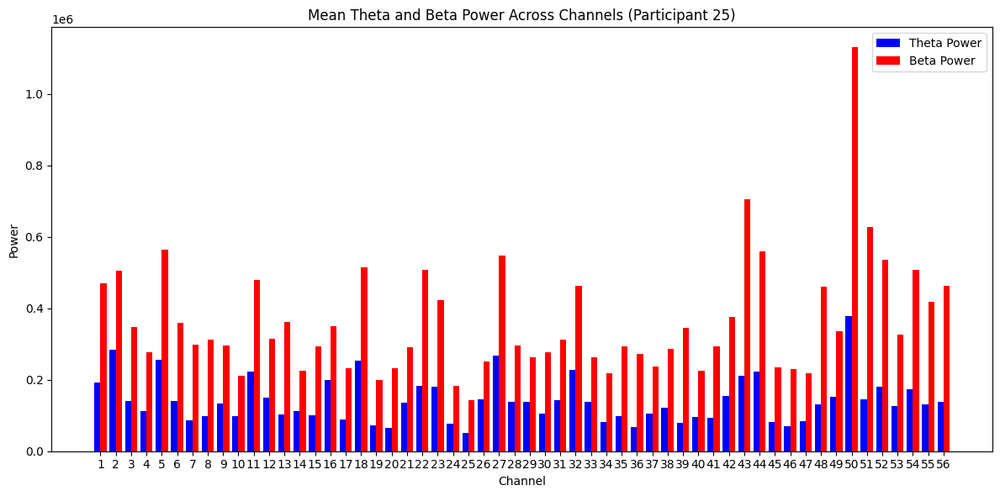

Participant 25: Top Channels by Lowest TBR: [39 51 36 20 13]
Participant 26: Data Shape: (385, 56, 241)


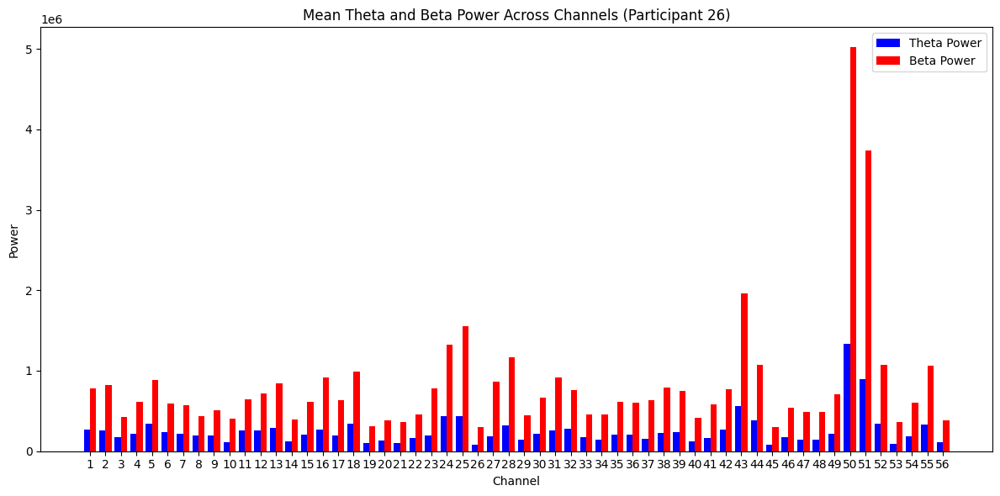

Participant 26: Top Channels by Lowest TBR: [27 51 37 53 23]
Participant 27: Data Shape: (385, 56, 79)


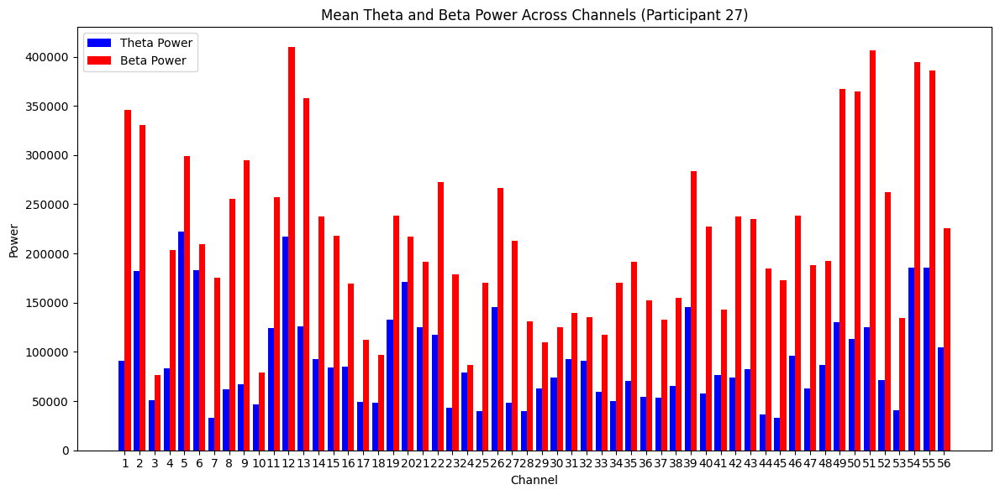

Participant 27: Top Channels by Lowest TBR: [ 7 45 44  9 27]
Participant 28: Data Shape: (385, 56, 287)


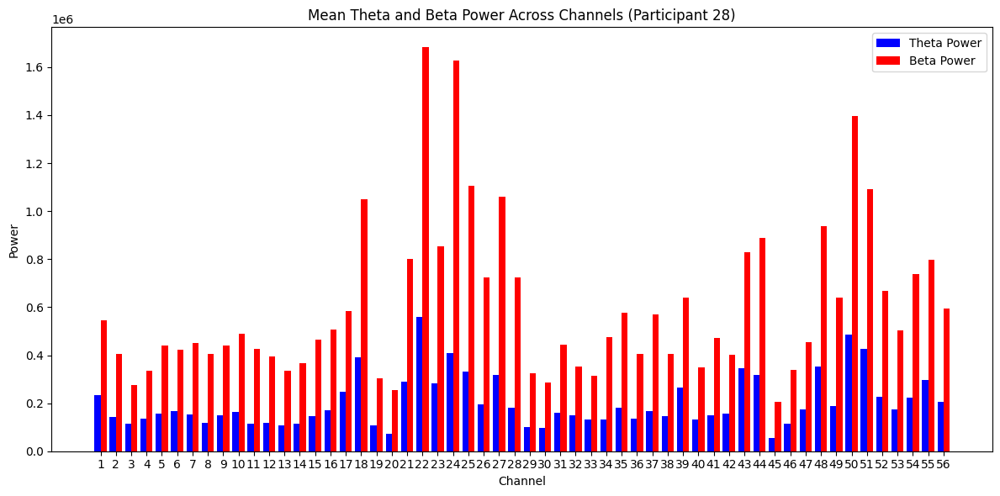

Participant 28: Top Channels by Lowest TBR: [24 28 26 45 11]
Participant 29: Data Shape: (385, 56, 102)


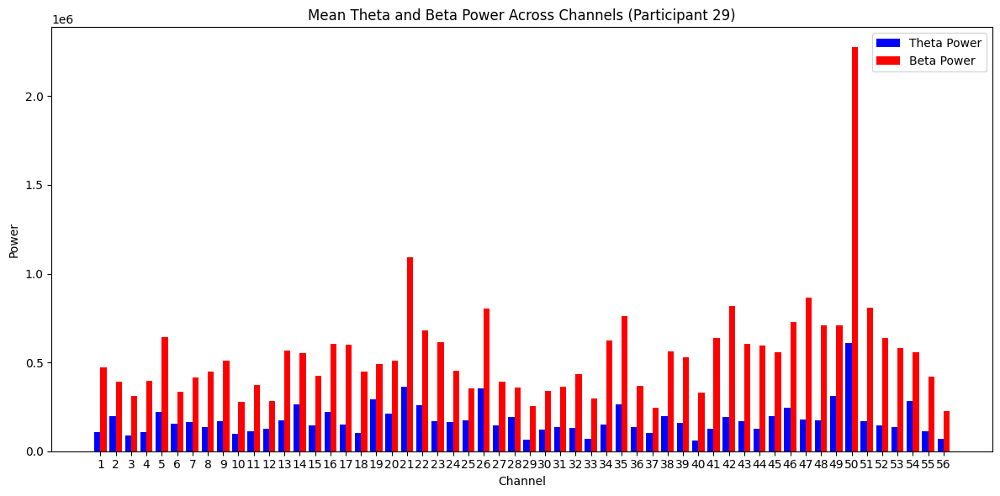

Participant 29: Top Channels by Lowest TBR: [40 41 47 51 44]
Participant 30: Data Shape: (385, 56, 279)


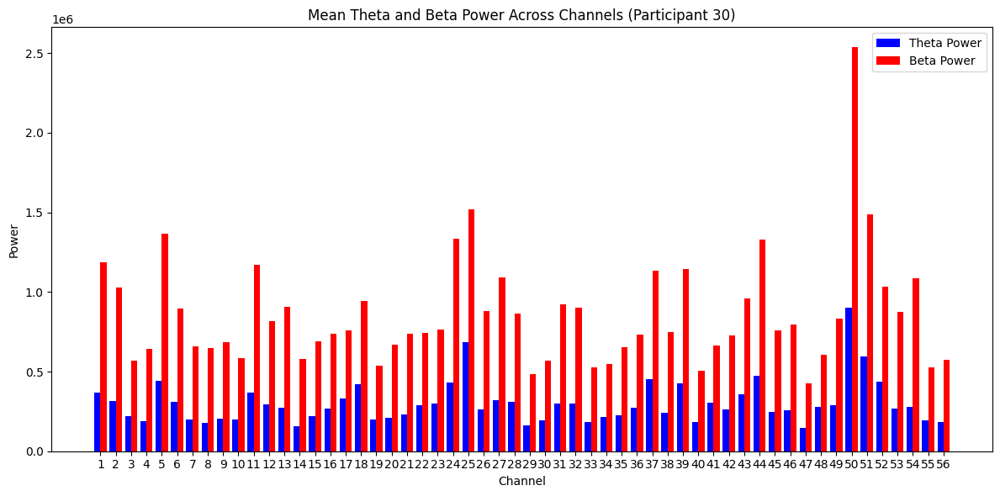

Participant 30: Top Channels by Lowest TBR: [54 14  8 27  4]
Participant 31: Data Shape: (385, 56, 278)


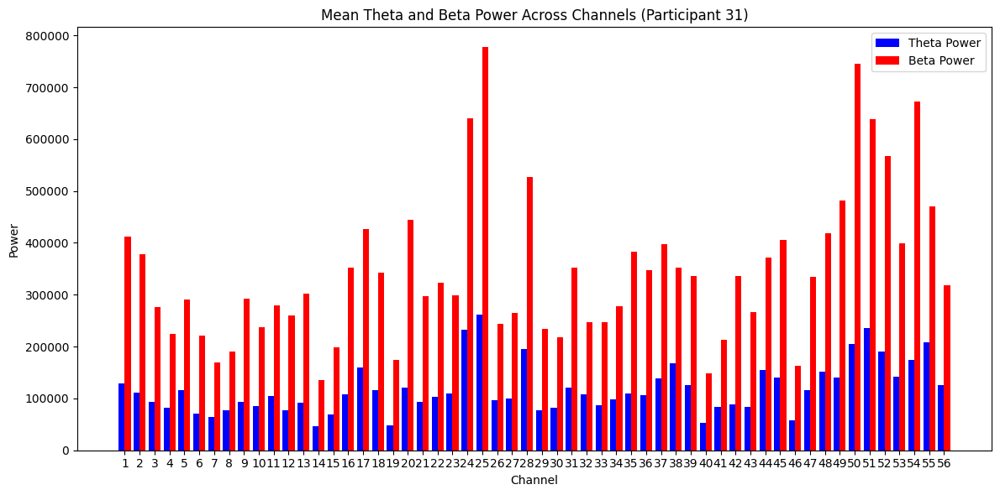

Participant 31: Top Channels by Lowest TBR: [54 42 20 50 19]
Participant 32: Data Shape: (385, 56, 276)


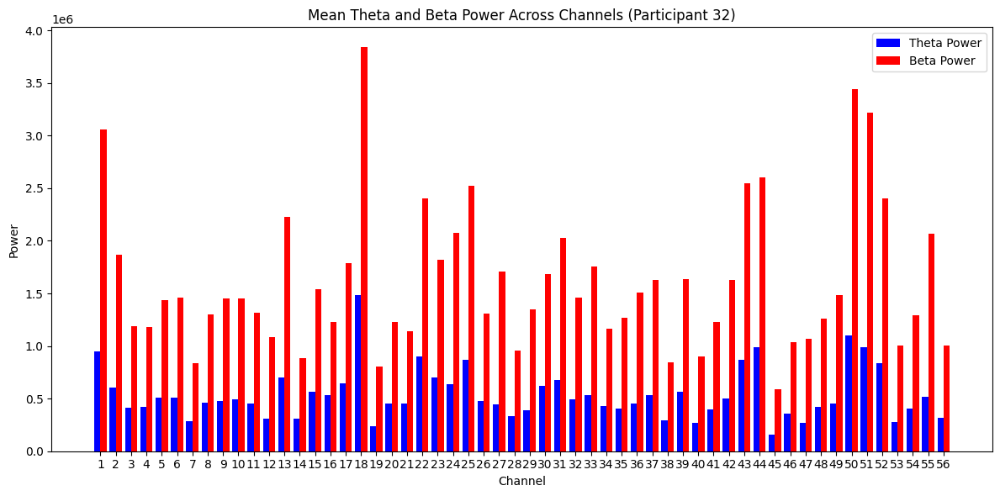

Participant 32: Top Channels by Lowest TBR: [55 47 27 45 53]
Participant 33: Data Shape: (385, 56, 280)


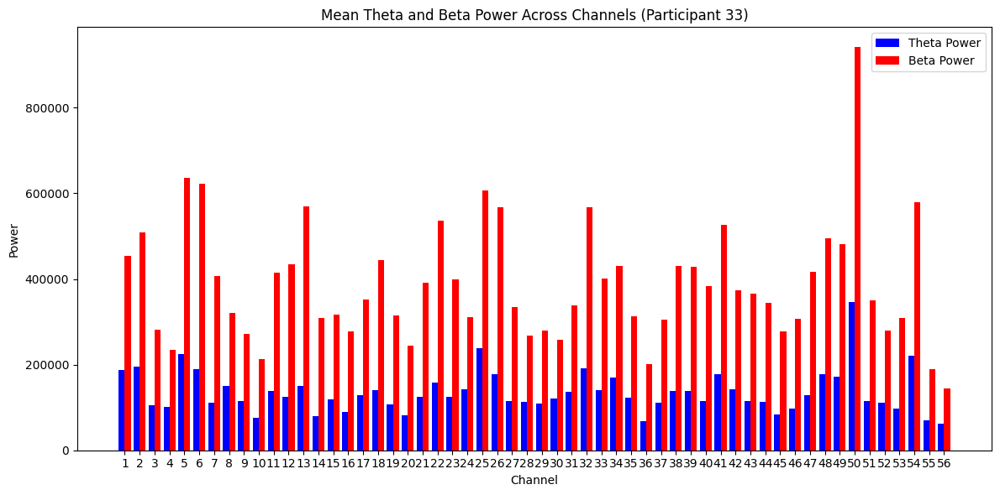

Participant 33: Top Channels by Lowest TBR: [14 13  7 12 22]
Participant 34: Data Shape: (385, 56, 241)


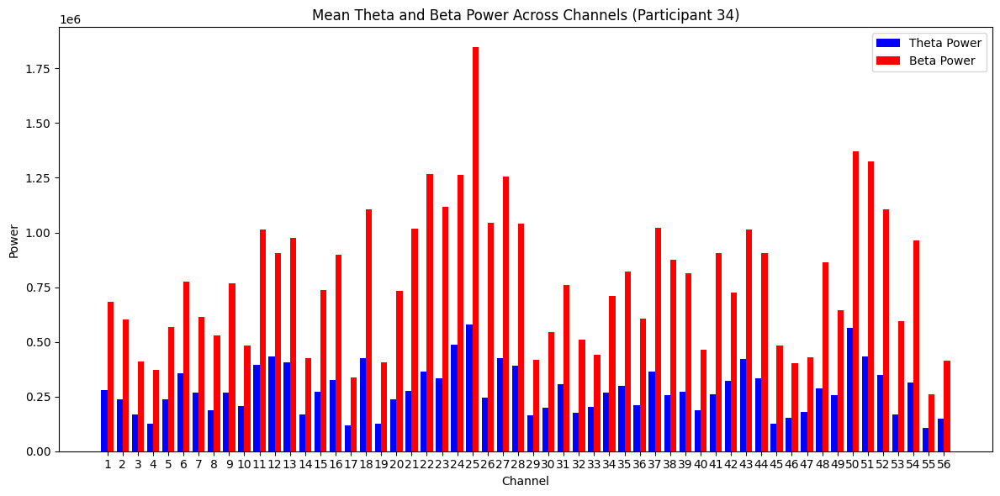

Participant 34: Top Channels by Lowest TBR: [26 45 21 53 22]
Participant 35: Data Shape: (385, 56, 288)


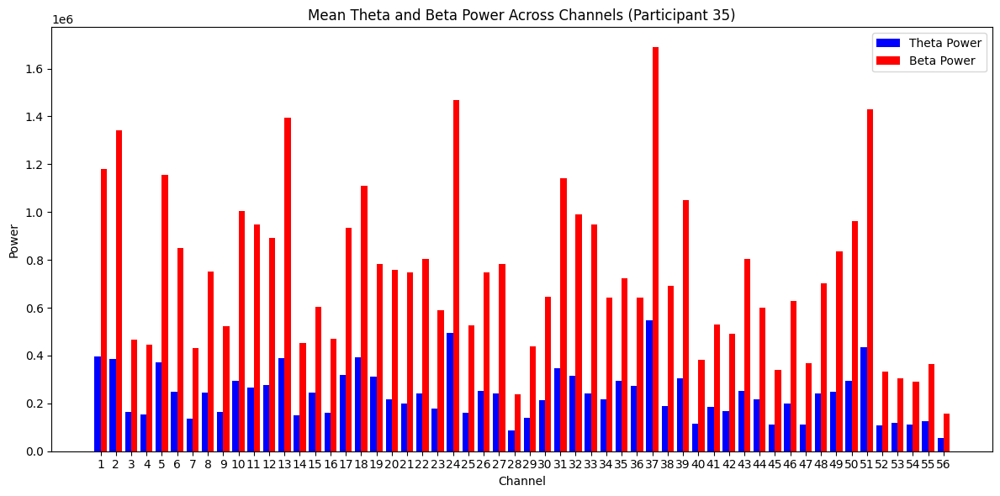

Participant 35: Top Channels by Lowest TBR: [33 21 38 13 11]
Participant 36: Data Shape: (385, 56, 273)


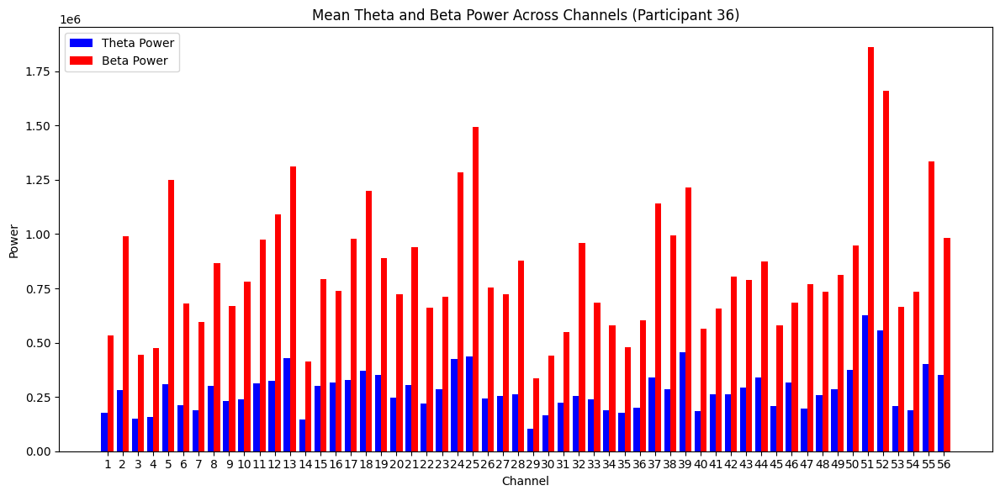

Participant 36: Top Channels by Lowest TBR: [ 5 47 54 32  2]
Participant 37: Data Shape: (385, 56, 267)


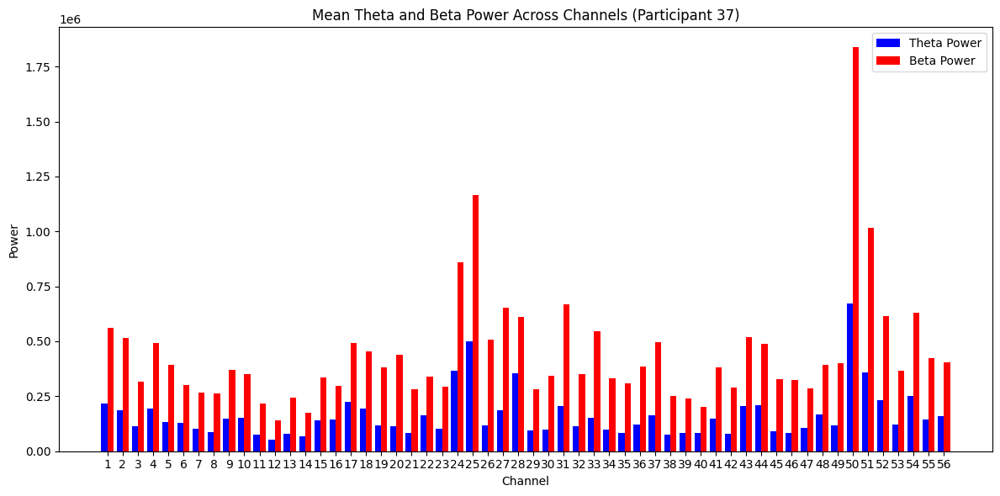

Participant 37: Top Channels by Lowest TBR: [26 46 20 35 45]
Participant 38: Data Shape: (385, 56, 259)


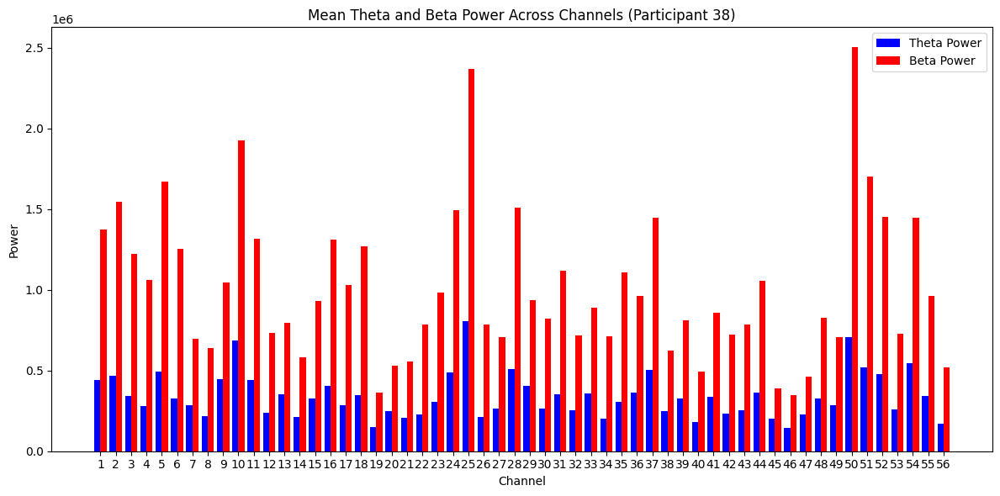

Participant 38: Top Channels by Lowest TBR: [ 6  4 26 18 17]
Participant 39: Data Shape: (385, 56, 273)


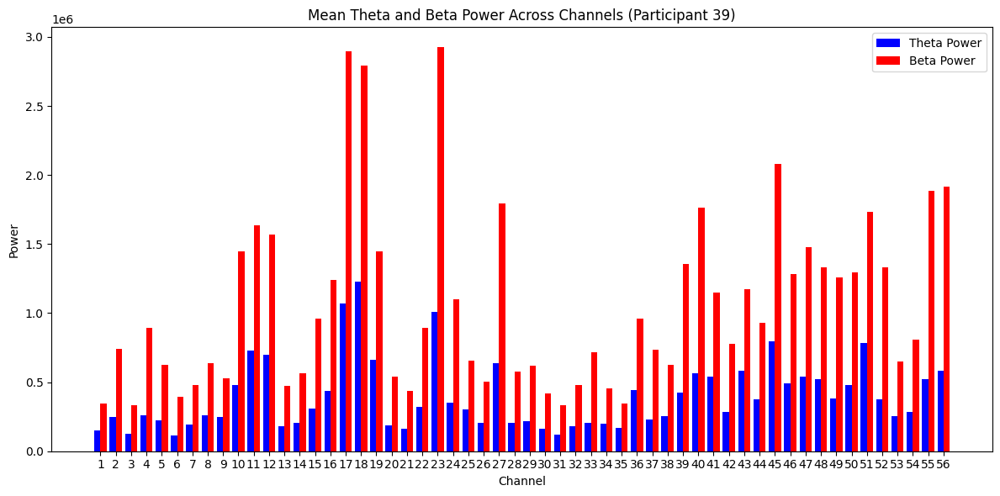

Participant 39: Top Channels by Lowest TBR: [55 52 33  4  6]
Participant 40: Data Shape: (385, 56, 279)


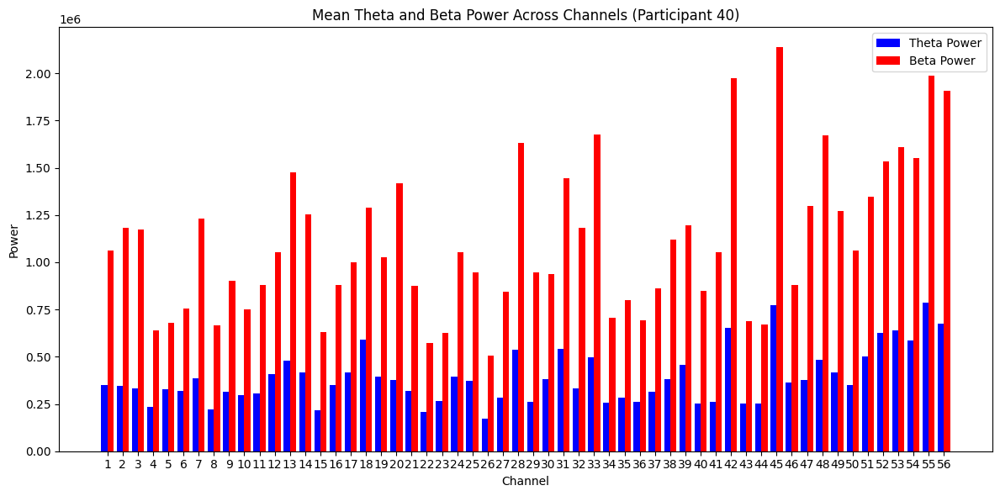

Participant 40: Top Channels by Lowest TBR: [41 20 29 32  3]
Participant 41: Data Shape: (385, 56, 292)


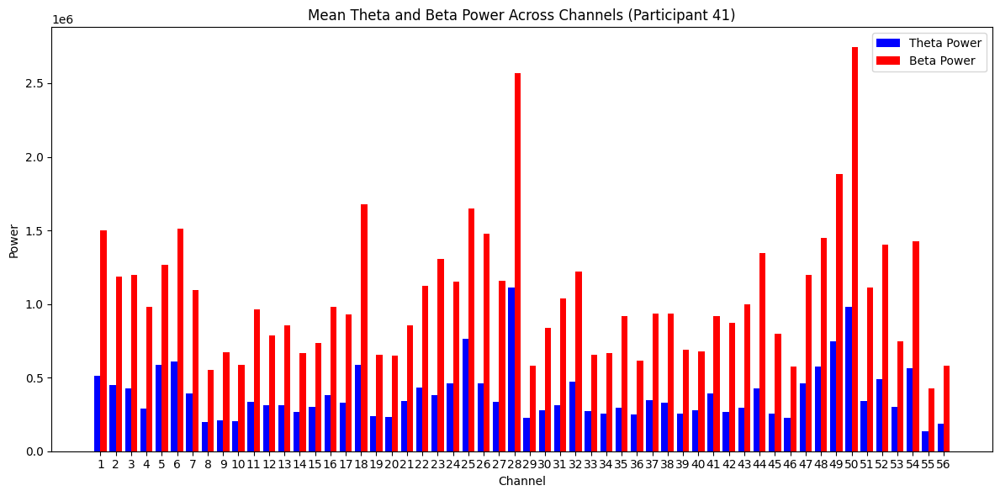

Participant 41: Top Channels by Lowest TBR: [27 23  4 43 31]
Participant 42: Data Shape: (385, 56, 290)


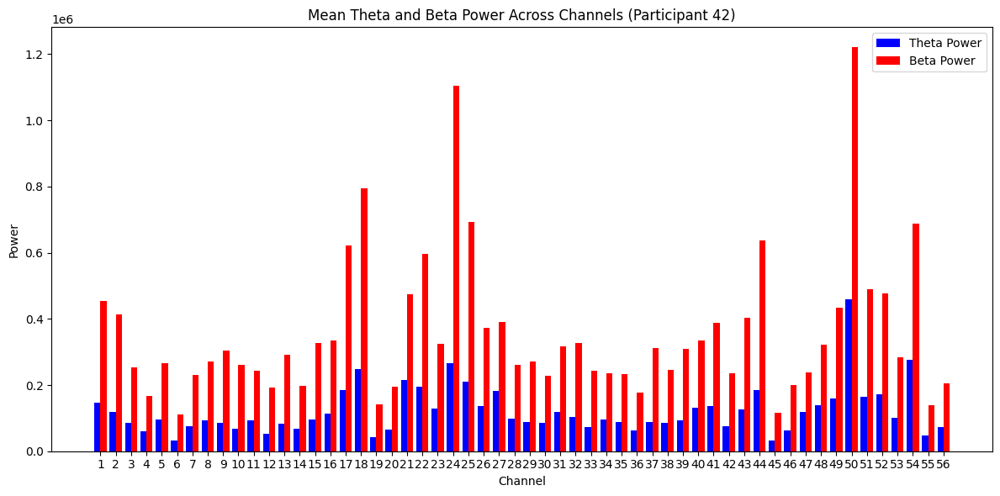

Participant 42: Top Channels by Lowest TBR: [24 10 12 45 37]
Participant 43: Data Shape: (385, 56, 277)


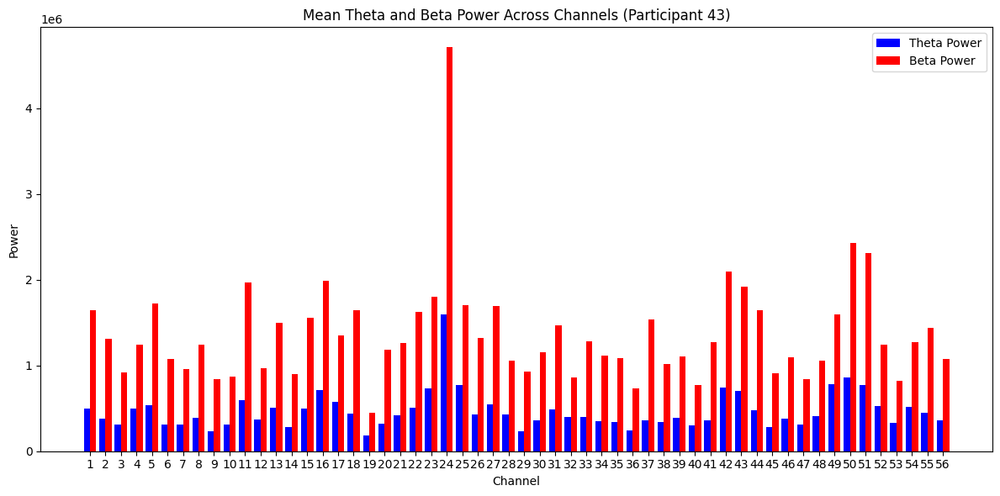

Participant 43: Top Channels by Lowest TBR: [37 29 20 18  9]
Participant 44: Data Shape: (385, 56, 278)


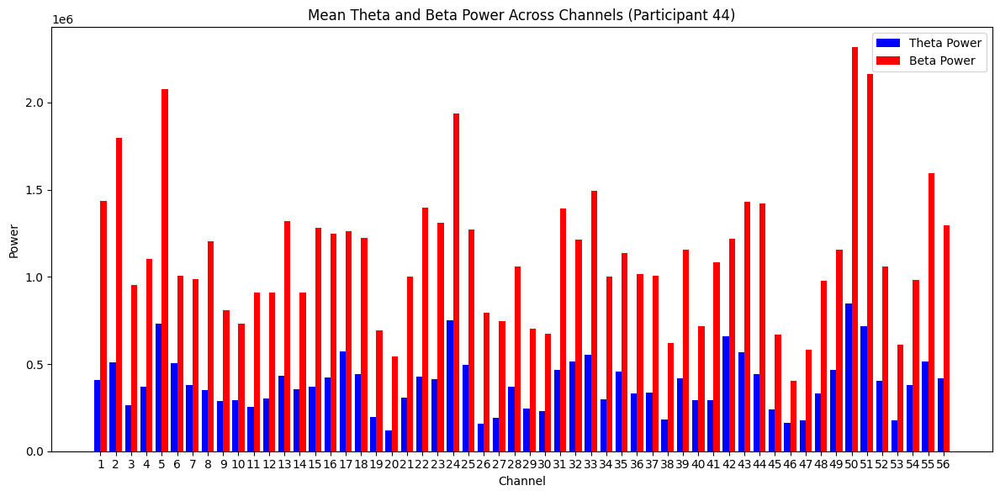

Participant 44: Top Channels by Lowest TBR: [26 20 27 41  3]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
import scipy.io

# Step 1: Load the EEG data from the combined file
mat_data = scipy.io.loadmat('/content/drive/MyDrive/EEG_dataset/control_Files_combined.mat')
eeg_data = mat_data['combined_data']  # Adjust this based on the actual key in the .mat file
print(f"EEG Data Shape: {eeg_data.shape}")  # Confirm structure (time_points, num_channels, num_trials)

# Step 2: Define participant trials
participant_trials = {
    1: 281, 2: 262, 3: 295, 4: 229, 5: 255, 6: 135, 7: 232, 8: 254,
    9: 159, 10: 272, 11: 279, 12: 168, 13: 137, 14: 237, 15: 205, 16: 115,
    17: 195, 18: 229, 19: 222, 20: 209, 21: 160, 22: 229, 23: 203, 24: 99,
    25: 229, 26: 241, 27: 79, 28: 287, 29: 102, 30: 279, 31: 278, 32: 276,
    33: 280, 34: 241, 35: 288, 36: 273, 37: 267, 38: 259, 39: 273, 40: 279,
    41: 292, 42: 290, 43: 277, 44: 278
}

# Step 3: Sampling frequency and STFT parameters
fs = 256  # Hz
nperseg = 128  # Points per segment for STFT

# Initialize start trial index
start_trial = 0

# Step 4: Loop through participants and process their data
for participant, num_trials in participant_trials.items():
    # Determine trial range for the participant
    end_trial = start_trial + num_trials
    eeg_data_participant = eeg_data[:, :, start_trial:end_trial]
    start_trial = end_trial  # Update start trial for the next participant

    # Confirm participant data shape
    print(f"Participant {participant}: Data Shape: {eeg_data_participant.shape}")  # (time_points, num_channels, num_trials)

    # Initialize arrays to store Theta and Beta power
    num_channels = eeg_data_participant.shape[1]
    theta_power = np.zeros(num_channels)
    beta_power = np.zeros(num_channels)

    # Step 5: Calculate Theta and Beta power for each channel
    for channel in range(num_channels):
        # Concatenate all trials for the current channel
        channel_data = eeg_data_participant[:, channel, :].flatten()

        # Apply STFT
        f, t, Zxx = stft(channel_data, fs=fs, nperseg=nperseg)
        magnitude = np.abs(Zxx)

        # Compute power for Theta (4-8 Hz) and Beta (13-30 Hz)
        theta_power[channel] = np.sum(magnitude[(f >= 4) & (f <= 8)]**2)
        beta_power[channel] = np.sum(magnitude[(f >= 13) & (f <= 30)]**2)

    # Compute Theta-to-Beta Ratio (TBR) for each channel
    epsilon = 1e-10  # To prevent division by zero
    theta_to_beta_ratio = theta_power / (beta_power + epsilon)

    # Step 6: Visualize power for each channel
    x = np.arange(1, num_channels + 1)  # Channel indices
    plt.figure(figsize=(12, 6))
    plt.bar(x - 0.2, theta_power, width=0.4, label='Theta Power', color='blue')
    plt.bar(x + 0.2, beta_power, width=0.4, label='Beta Power', color='red')
    plt.title(f'Mean Theta and Beta Power Across Channels (Participant {participant})')
    plt.xlabel('Channel')
    plt.ylabel('Power')
    plt.xticks(x, x)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Step 7: Identify top channels based on lowest TBR
    sorted_indices = np.argsort(theta_to_beta_ratio)  # Sort in ascending order for lowest TBR
    top_channels = sorted_indices[:5] + 1  # Convert to 1-based indexing
    print(f"Participant {participant}: Top Channels by Lowest TBR: {top_channels}")


EEG Data Shape: (385, 56, 10742)
Selected Data Shape for Participant 1: (385, 56, 257)


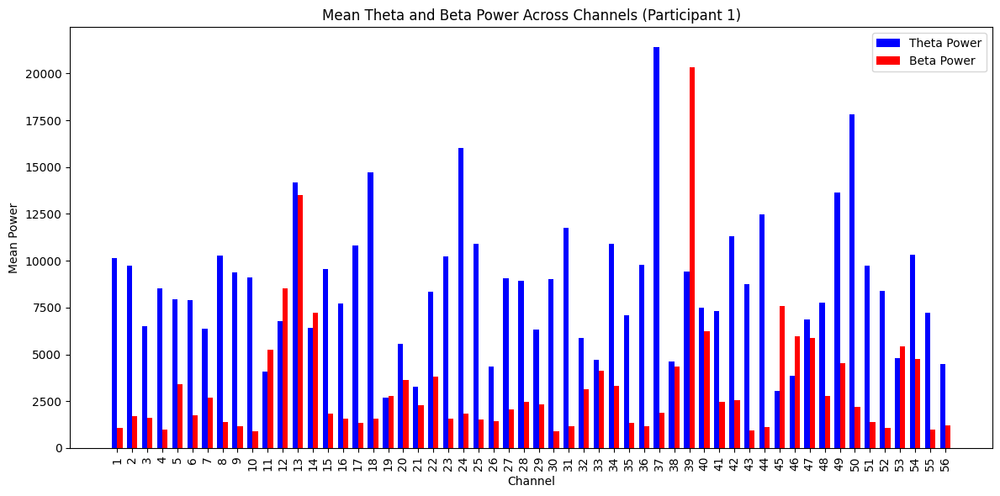

Participant 1: Top Channels by Lowest TBR: [45 39 46 11 12]
Channel 45 - TBR: 0.4038660073887595
Channel 39 - TBR: 0.46326686682146445
Channel 46 - TBR: 0.644632231352922
Channel 11 - TBR: 0.7741765427691236
Channel 12 - TBR: 0.7935436944934826
Selected Data Shape for Participant 2: (385, 56, 279)


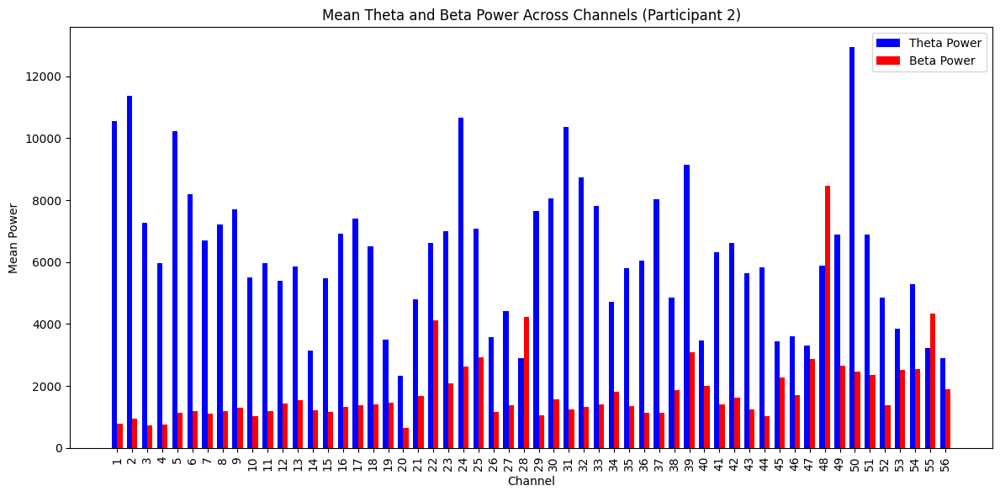

Participant 2: Top Channels by Lowest TBR: [28 48 55 47 45]
Channel 28 - TBR: 0.688509155382847
Channel 48 - TBR: 0.6952581081017496
Channel 55 - TBR: 0.742337122185045
Channel 47 - TBR: 1.1526118579339664
Channel 45 - TBR: 1.505018734523998
Selected Data Shape for Participant 3: (385, 56, 46)


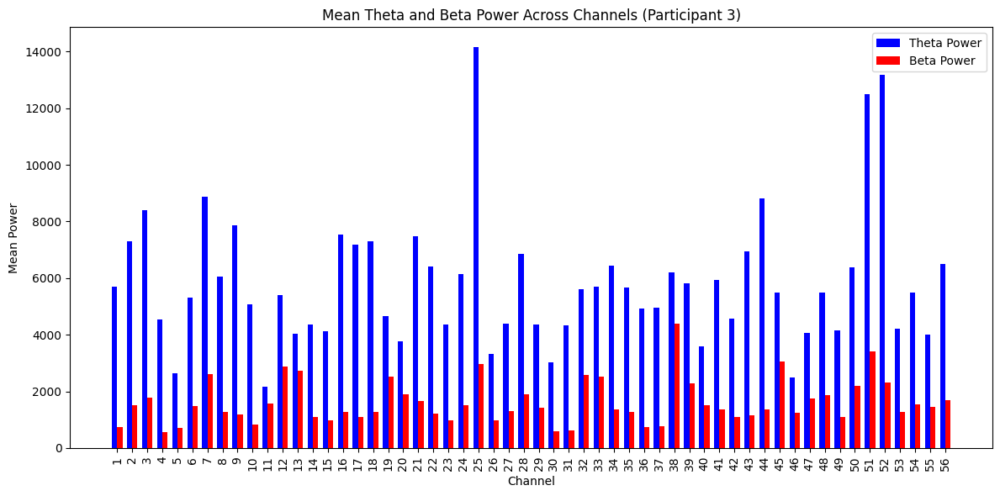

Participant 3: Top Channels by Lowest TBR: [11 38 13 45 19]
Channel 11 - TBR: 1.3780235079116325
Channel 38 - TBR: 1.4074607137670616
Channel 13 - TBR: 1.4773607270081566
Channel 45 - TBR: 1.7912921707374891
Channel 19 - TBR: 1.8504028950414884
Selected Data Shape for Participant 4: (385, 56, 259)


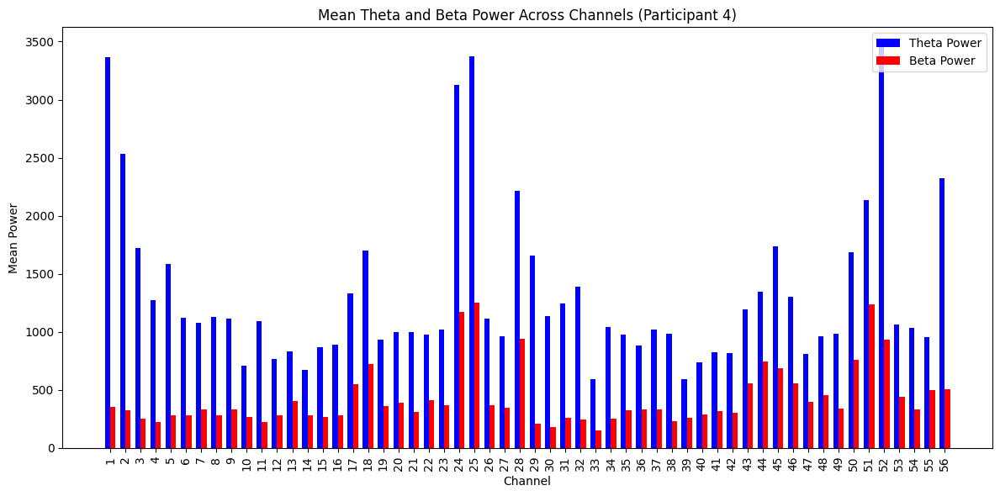

Participant 4: Top Channels by Lowest TBR: [51 44 55 47 13]
Channel 51 - TBR: 1.729640429287099
Channel 44 - TBR: 1.8033043704685865
Channel 55 - TBR: 1.8968227599802172
Channel 47 - TBR: 2.0356459053706706
Channel 13 - TBR: 2.037605882924973
Selected Data Shape for Participant 5: (385, 56, 205)


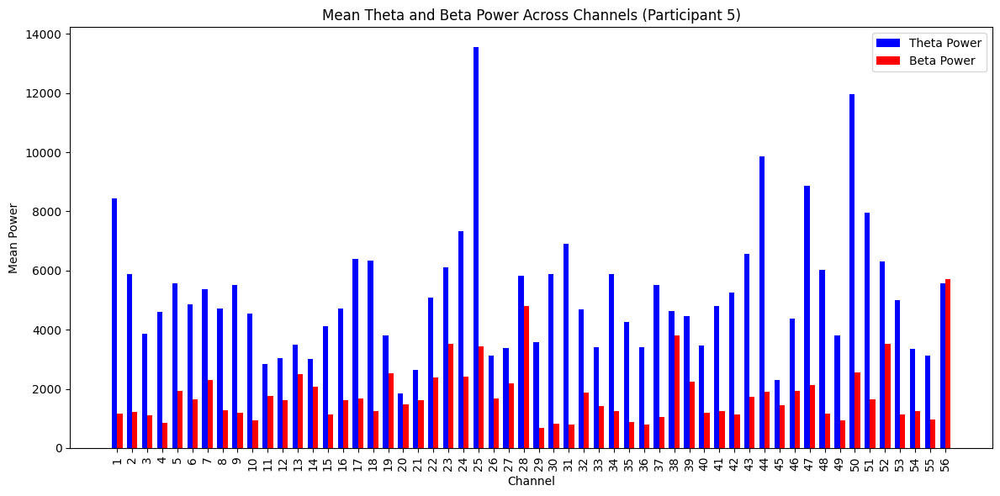

Participant 5: Top Channels by Lowest TBR: [56 28 38 20 13]
Channel 56 - TBR: 0.974569678613904
Channel 28 - TBR: 1.2151653187536406
Channel 38 - TBR: 1.2179023195906544
Channel 20 - TBR: 1.2395090071225865
Channel 13 - TBR: 1.3963004001359158
Selected Data Shape for Participant 6: (385, 56, 262)


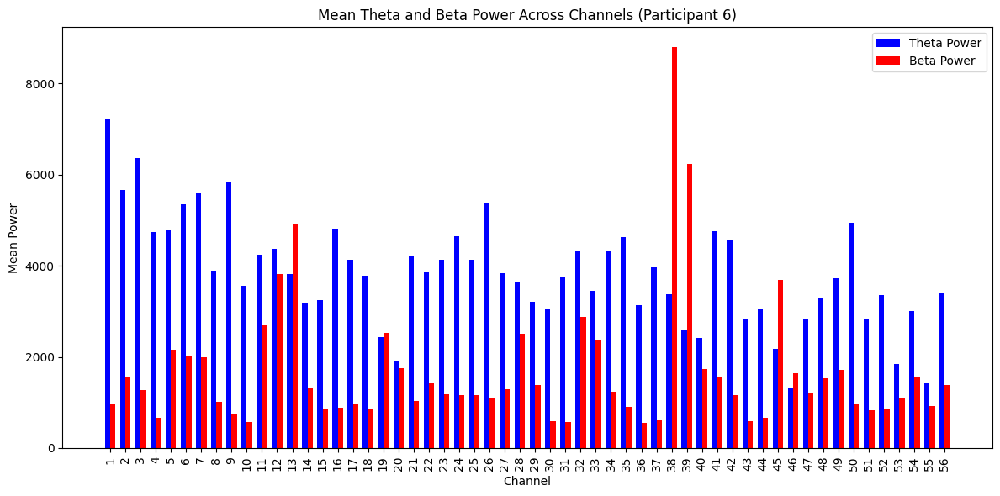

Participant 6: Top Channels by Lowest TBR: [38 39 45 13 46]
Channel 38 - TBR: 0.3838354037342707
Channel 39 - TBR: 0.4188545289533148
Channel 45 - TBR: 0.5905062675651452
Channel 13 - TBR: 0.778829585030225
Channel 46 - TBR: 0.8092239212837717
Selected Data Shape for Participant 7: (385, 56, 214)


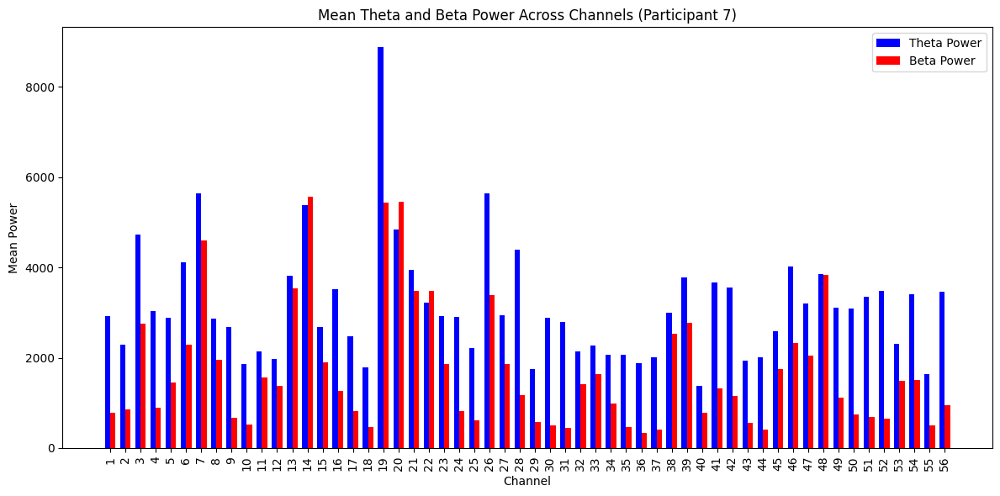

Participant 7: Top Channels by Lowest TBR: [20 22 14 48 13]
Channel 20 - TBR: 0.8872852474132902
Channel 22 - TBR: 0.9275815013943812
Channel 14 - TBR: 0.9643423921849203
Channel 48 - TBR: 1.003886622048244
Channel 13 - TBR: 1.0830897064786582
Selected Data Shape for Participant 8: (385, 56, 262)


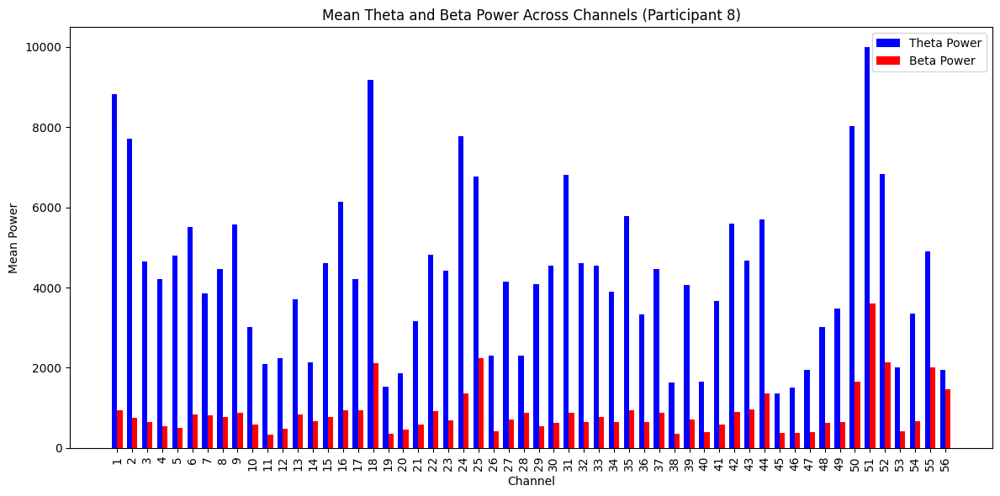

Participant 8: Top Channels by Lowest TBR: [56 55 28 51 25]
Channel 56 - TBR: 1.3191660756734511
Channel 55 - TBR: 2.4453067312557084
Channel 28 - TBR: 2.6420317070968444
Channel 51 - TBR: 2.773406912435933
Channel 25 - TBR: 3.0045428384798223
Selected Data Shape for Participant 9: (385, 56, 261)


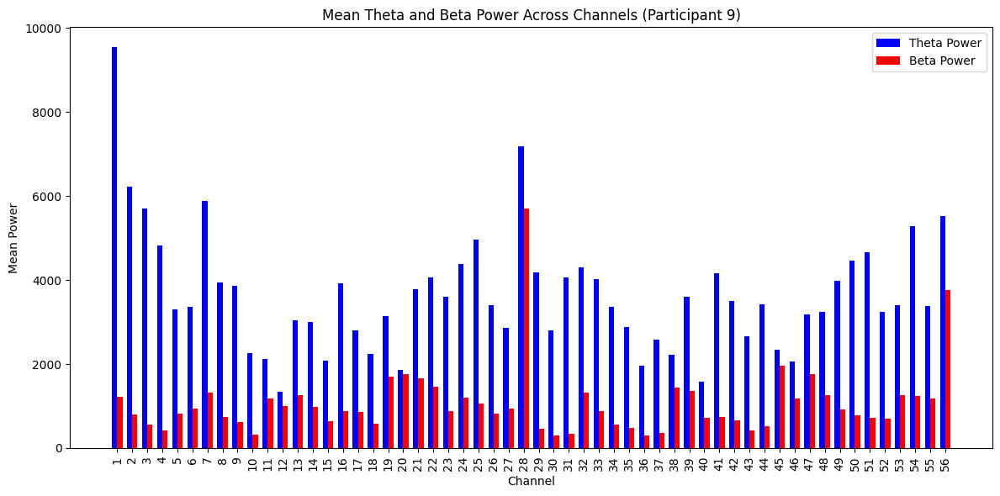

Participant 9: Top Channels by Lowest TBR: [20 45 28 12 56]
Channel 20 - TBR: 1.049636807836782
Channel 45 - TBR: 1.1951294867167288
Channel 28 - TBR: 1.2595345851862947
Channel 12 - TBR: 1.3538143174338069
Channel 56 - TBR: 1.4682168811841991
Selected Data Shape for Participant 10: (385, 56, 265)


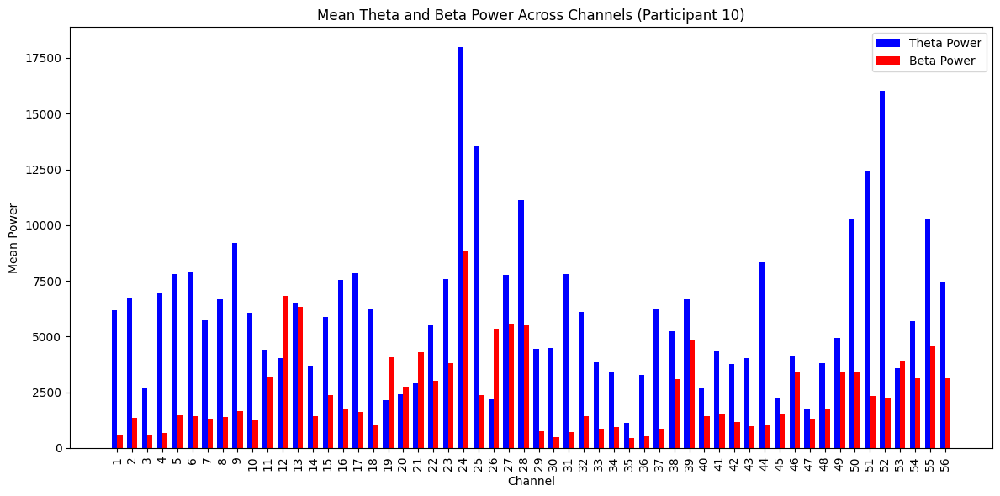

Participant 10: Top Channels by Lowest TBR: [26 19 12 21 20]
Channel 26 - TBR: 0.4061178484617538
Channel 19 - TBR: 0.5232839117682266
Channel 12 - TBR: 0.5905851501099283
Channel 21 - TBR: 0.6851678221609877
Channel 20 - TBR: 0.8893110616573667
Selected Data Shape for Participant 11: (385, 56, 285)


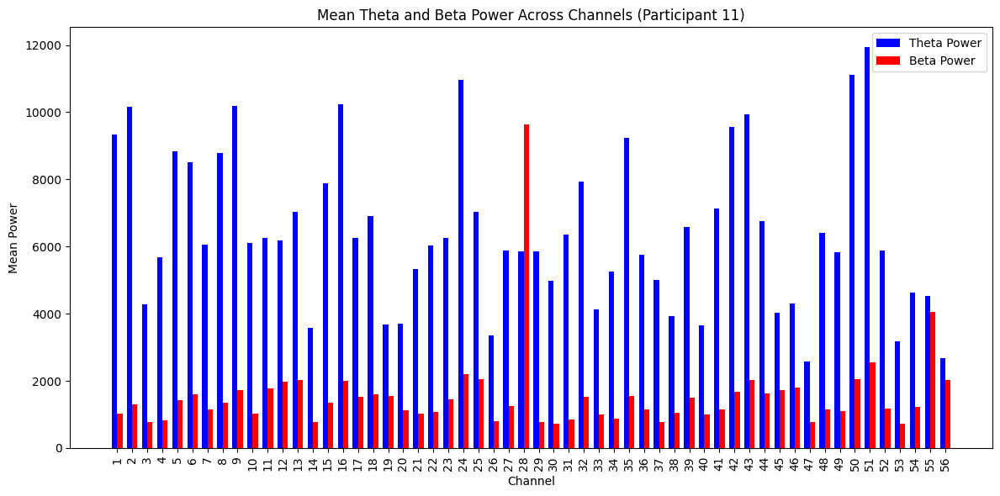

Participant 11: Top Channels by Lowest TBR: [28 55 56 45 19]
Channel 28 - TBR: 0.6065435152314794
Channel 55 - TBR: 1.1166007163542078
Channel 56 - TBR: 1.3188377568653276
Channel 45 - TBR: 2.3266012663276334
Channel 19 - TBR: 2.3662029994210076
Selected Data Shape for Participant 12: (385, 56, 255)


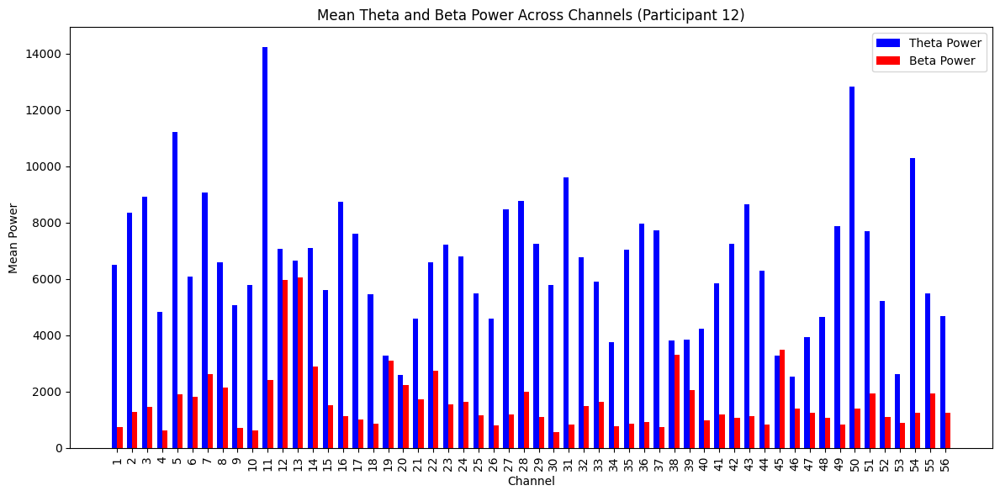

Participant 12: Top Channels by Lowest TBR: [45 19 13 38 20]
Channel 45 - TBR: 0.9395459143794933
Channel 19 - TBR: 1.0584354493448858
Channel 13 - TBR: 1.1010355346464455
Channel 38 - TBR: 1.1459765068629917
Channel 20 - TBR: 1.1546496626825558
Selected Data Shape for Participant 13: (385, 56, 213)


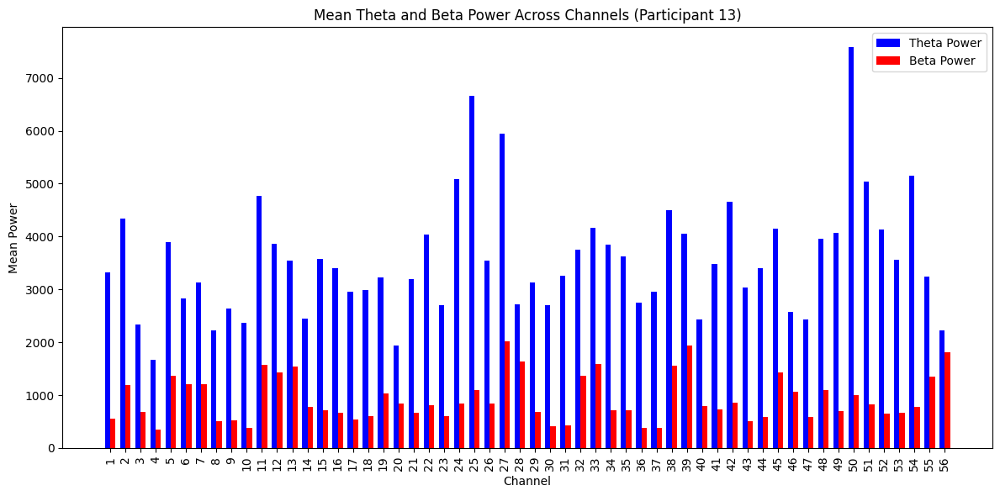

Participant 13: Top Channels by Lowest TBR: [56 28 39 13 20]
Channel 56 - TBR: 1.2319999088401874
Channel 28 - TBR: 1.6526704630724949
Channel 39 - TBR: 2.0859349550512998
Channel 13 - TBR: 2.2945567918016314
Channel 20 - TBR: 2.307421246152196
Selected Data Shape for Participant 14: (385, 56, 238)


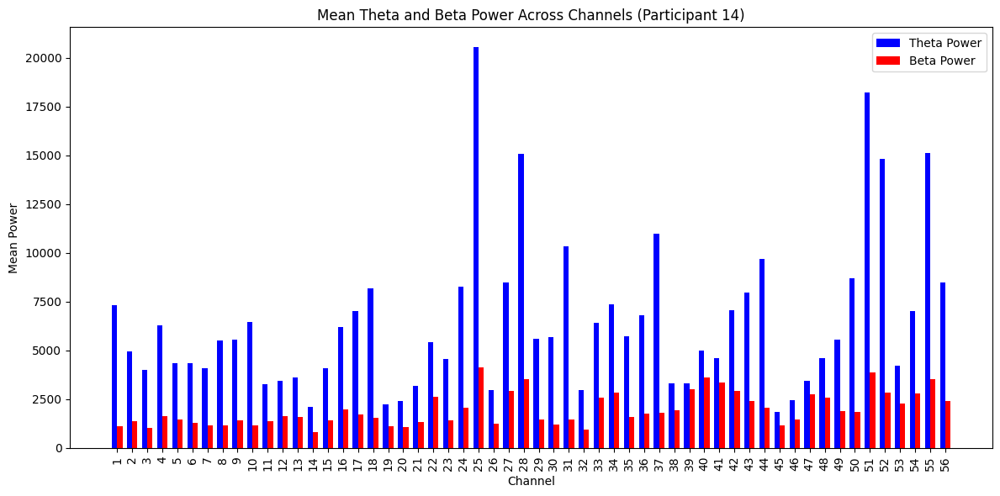

Participant 14: Top Channels by Lowest TBR: [39 47 41 40 45]
Channel 39 - TBR: 1.0994508455809804
Channel 47 - TBR: 1.244326455735533
Channel 41 - TBR: 1.3771807898869028
Channel 40 - TBR: 1.3805287391615235
Channel 45 - TBR: 1.584733226392203
Selected Data Shape for Participant 15: (385, 56, 168)


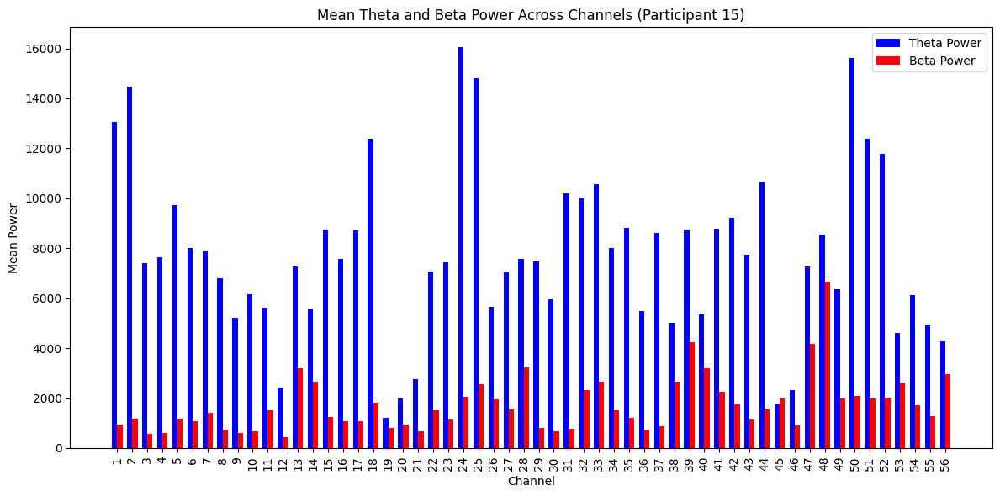

Participant 15: Top Channels by Lowest TBR: [45 48 56 19 40]
Channel 45 - TBR: 0.8946807776052923
Channel 48 - TBR: 1.2845351198286301
Channel 56 - TBR: 1.441285627434851
Channel 19 - TBR: 1.4660103419502974
Channel 40 - TBR: 1.667643576835756
Selected Data Shape for Participant 16: (385, 56, 125)


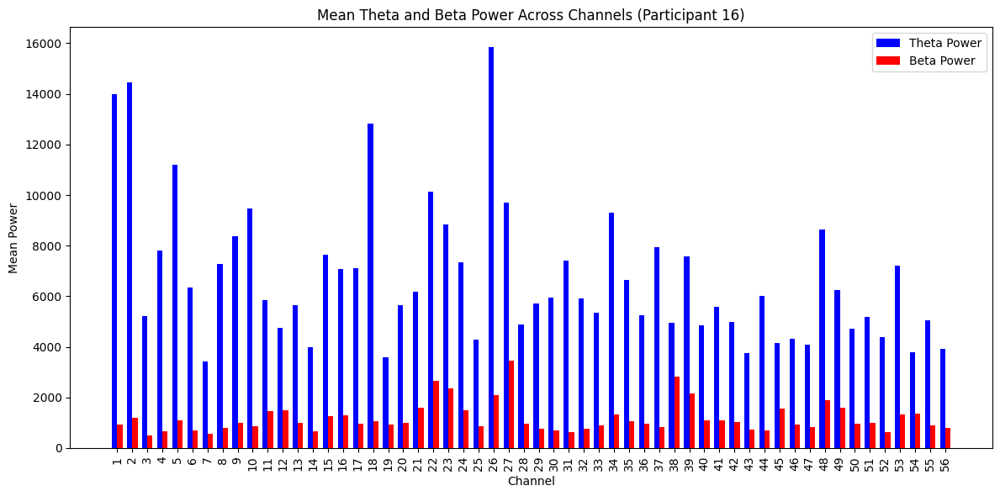

Participant 16: Top Channels by Lowest TBR: [38 45 54 27 12]
Channel 38 - TBR: 1.747296888305055
Channel 45 - TBR: 2.6795205081451257
Channel 54 - TBR: 2.774379685597784
Channel 27 - TBR: 2.82017381944893
Channel 12 - TBR: 3.1493353606289873
Selected Data Shape for Participant 17: (385, 56, 239)


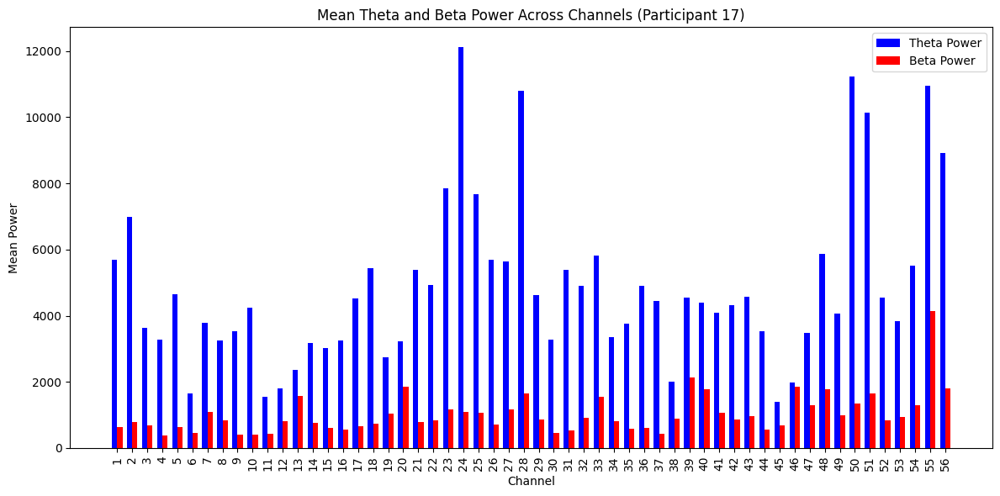

Participant 17: Top Channels by Lowest TBR: [46 13 20 45 39]
Channel 46 - TBR: 1.0660600553444193
Channel 13 - TBR: 1.4966341761944815
Channel 20 - TBR: 1.754344293725232
Channel 45 - TBR: 2.057871153017236
Channel 39 - TBR: 2.125378300314067
Selected Data Shape for Participant 18: (385, 56, 195)


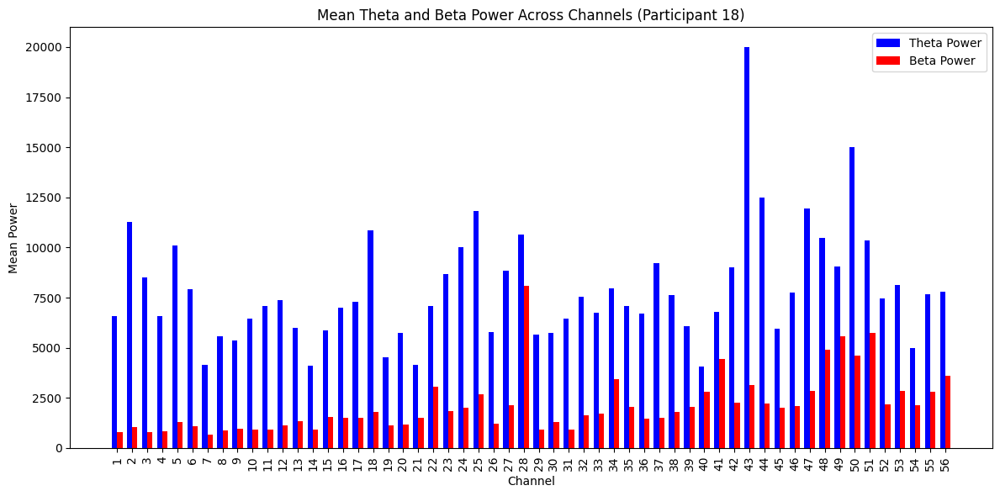

Participant 18: Top Channels by Lowest TBR: [28 40 41 49 51]
Channel 28 - TBR: 1.319794942307902
Channel 40 - TBR: 1.4485266245081188
Channel 41 - TBR: 1.5248390400566516
Channel 49 - TBR: 1.6205566377155771
Channel 51 - TBR: 1.8010841702759826
Selected Data Shape for Participant 19: (385, 56, 286)


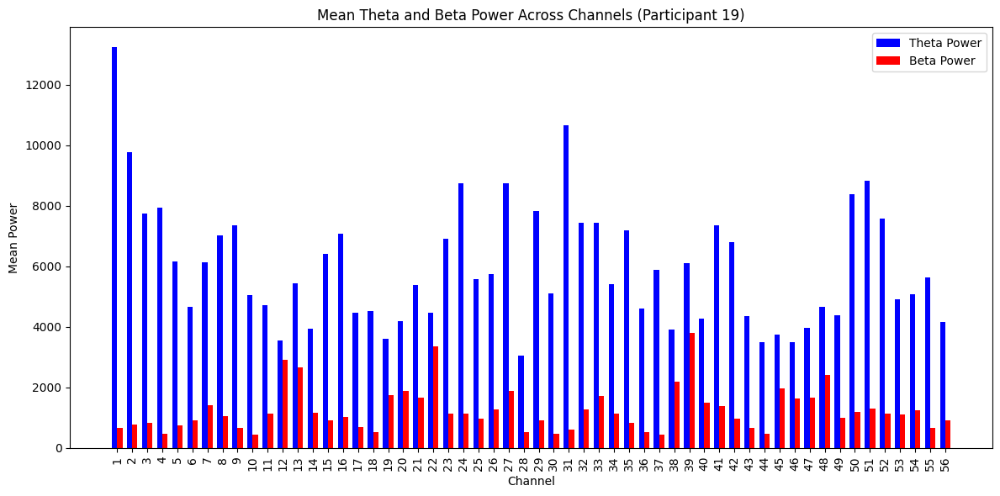

Participant 19: Top Channels by Lowest TBR: [12 22 39 38 45]
Channel 12 - TBR: 1.2125325670554015
Channel 22 - TBR: 1.3392362237548319
Channel 39 - TBR: 1.6089579966427745
Channel 38 - TBR: 1.7719499953754343
Channel 45 - TBR: 1.8972204891528563
Selected Data Shape for Participant 20: (385, 56, 197)


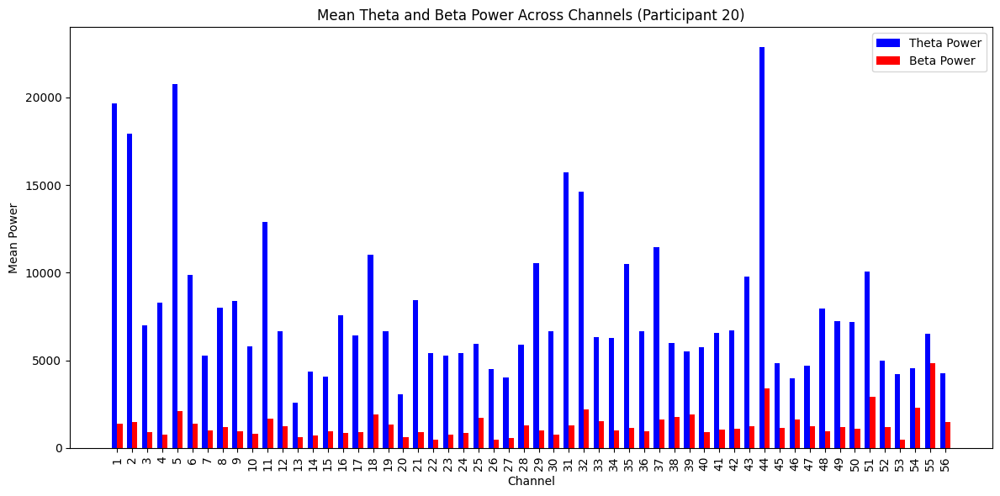

Participant 20: Top Channels by Lowest TBR: [55 54 46 56 39]
Channel 55 - TBR: 1.3532222445125415
Channel 54 - TBR: 1.972736612511771
Channel 46 - TBR: 2.433478088405651
Channel 56 - TBR: 2.875536345259419
Channel 39 - TBR: 2.8920960636172093
Selected Data Shape for Participant 21: (385, 56, 234)


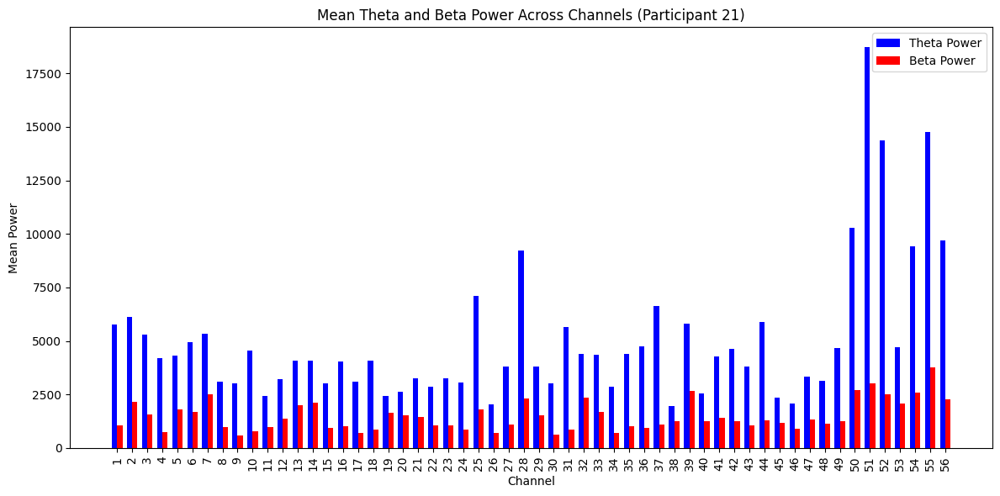

Participant 21: Top Channels by Lowest TBR: [19 38 20 32 14]
Channel 19 - TBR: 1.4553509315413464
Channel 38 - TBR: 1.5584339198137265
Channel 20 - TBR: 1.7319654083529092
Channel 32 - TBR: 1.8531119783297416
Channel 14 - TBR: 1.9358004595301557
Selected Data Shape for Participant 22: (385, 56, 203)


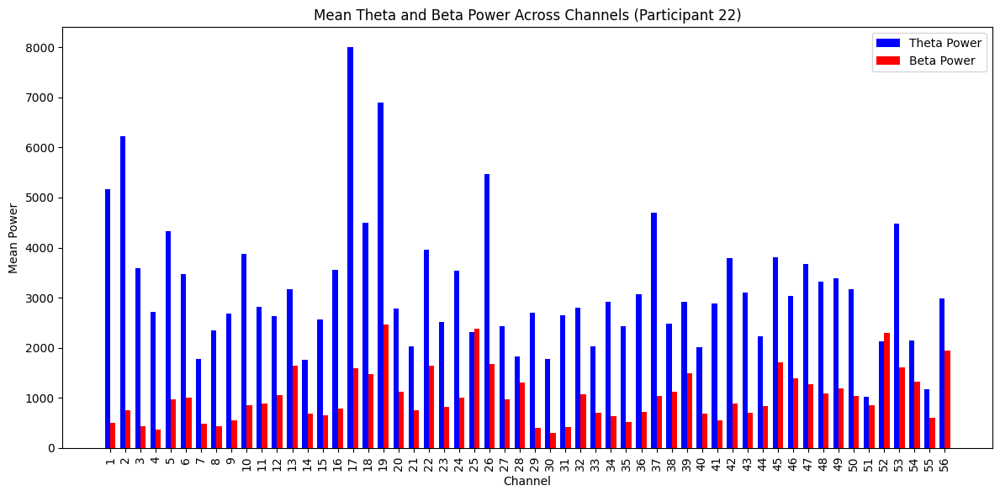

Participant 22: Top Channels by Lowest TBR: [52 25 51 28 56]
Channel 52 - TBR: 0.9208461183432921
Channel 25 - TBR: 0.9675994849649366
Channel 51 - TBR: 1.1865373478132173
Channel 28 - TBR: 1.4103265578761548
Channel 56 - TBR: 1.5393232507501111
Selected Data Shape for Participant 23: (385, 56, 223)


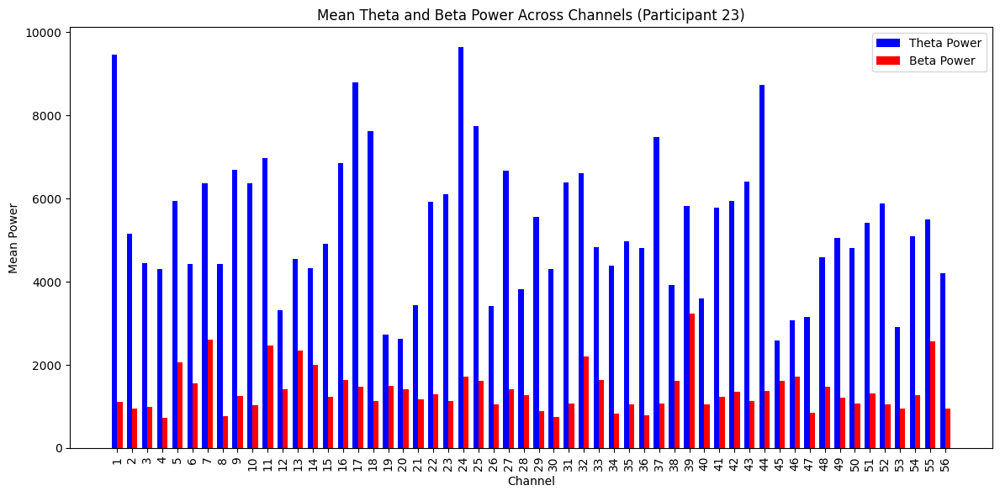

Participant 23: Top Channels by Lowest TBR: [45 46 39 19 20]
Channel 45 - TBR: 1.5925710973877922
Channel 46 - TBR: 1.7758169950975415
Channel 39 - TBR: 1.7968711589673614
Channel 19 - TBR: 1.8280746555503828
Channel 20 - TBR: 1.8531166841456455
Selected Data Shape for Participant 24: (385, 56, 265)


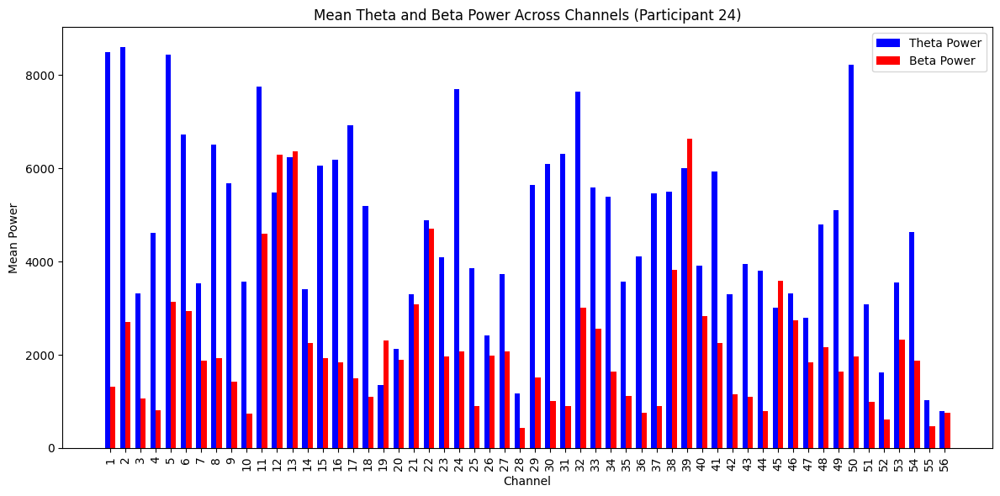

Participant 24: Top Channels by Lowest TBR: [19 45 12 39 13]
Channel 19 - TBR: 0.584278575435393
Channel 45 - TBR: 0.8379827705069901
Channel 12 - TBR: 0.8687699239923559
Channel 39 - TBR: 0.9060470262672443
Channel 13 - TBR: 0.9789765652109123
Selected Data Shape for Participant 25: (385, 56, 255)


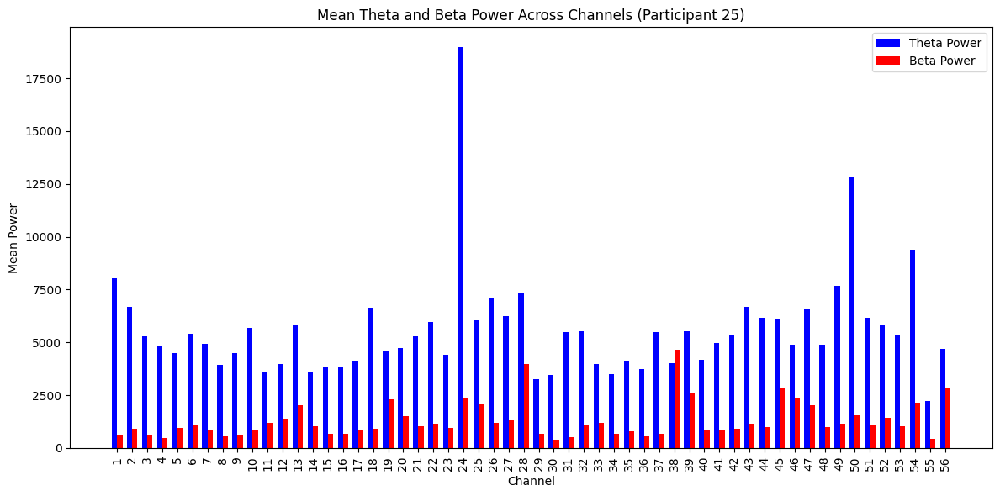

Participant 25: Top Channels by Lowest TBR: [38 56 28 19 46]
Channel 38 - TBR: 0.8679846304740213
Channel 56 - TBR: 1.6595447184700227
Channel 28 - TBR: 1.8528530099638578
Channel 19 - TBR: 1.9861002478975178
Channel 46 - TBR: 2.038986155265705
Selected Data Shape for Participant 26: (385, 56, 226)


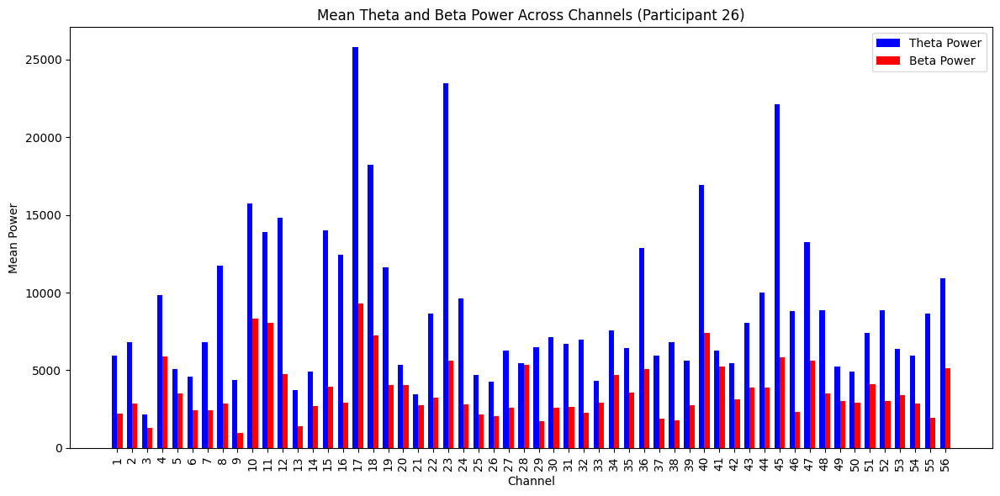

Participant 26: Top Channels by Lowest TBR: [28 41 21 20  5]
Channel 28 - TBR: 1.0197412089034055
Channel 41 - TBR: 1.1994901036739336
Channel 21 - TBR: 1.2438960671501824
Channel 20 - TBR: 1.3241096770123633
Channel 5 - TBR: 1.4521164964241118
Selected Data Shape for Participant 27: (385, 56, 264)


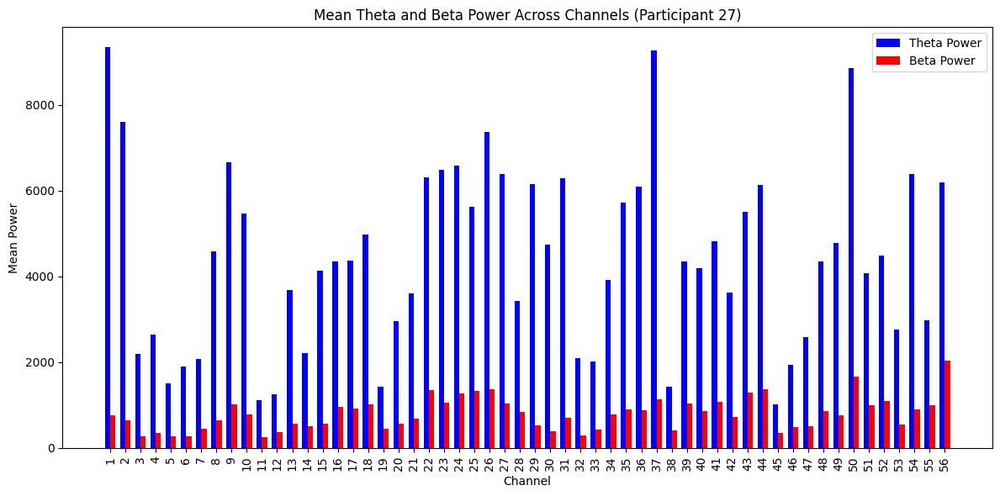

Participant 27: Top Channels by Lowest TBR: [45 55 56 19 38]
Channel 45 - TBR: 2.801272284301511
Channel 55 - TBR: 2.990841344682236
Channel 56 - TBR: 3.0319073510808585
Channel 19 - TBR: 3.1503241210785675
Channel 38 - TBR: 3.4230222422859913
Selected Data Shape for Participant 28: (385, 56, 259)


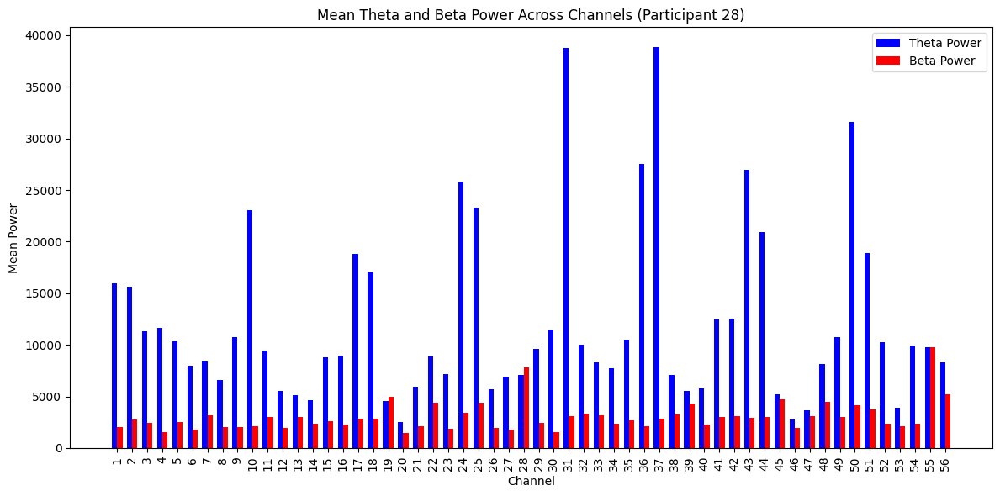

Participant 28: Top Channels by Lowest TBR: [28 19 55 45 47]
Channel 28 - TBR: 0.9042666606582138
Channel 19 - TBR: 0.9227651738832169
Channel 55 - TBR: 1.0050094505655733
Channel 45 - TBR: 1.0968242753934068
Channel 47 - TBR: 1.1928196267778515
Selected Data Shape for Participant 29: (385, 56, 260)


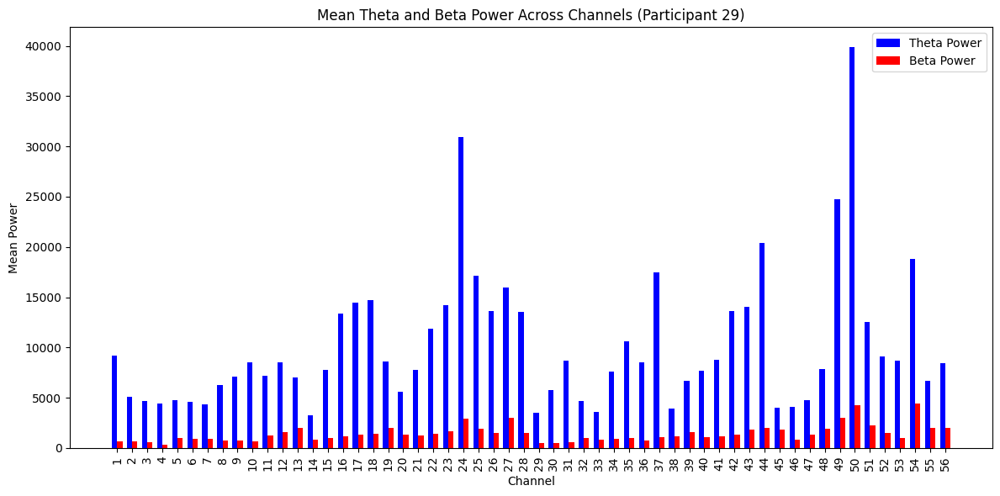

Participant 29: Top Channels by Lowest TBR: [45 38 55 47 13]
Channel 45 - TBR: 2.1858904807656008
Channel 38 - TBR: 3.3334633462671768
Channel 55 - TBR: 3.3691238455757526
Channel 47 - TBR: 3.454445001868556
Channel 13 - TBR: 3.4816544872208293
Selected Data Shape for Participant 30: (385, 56, 290)


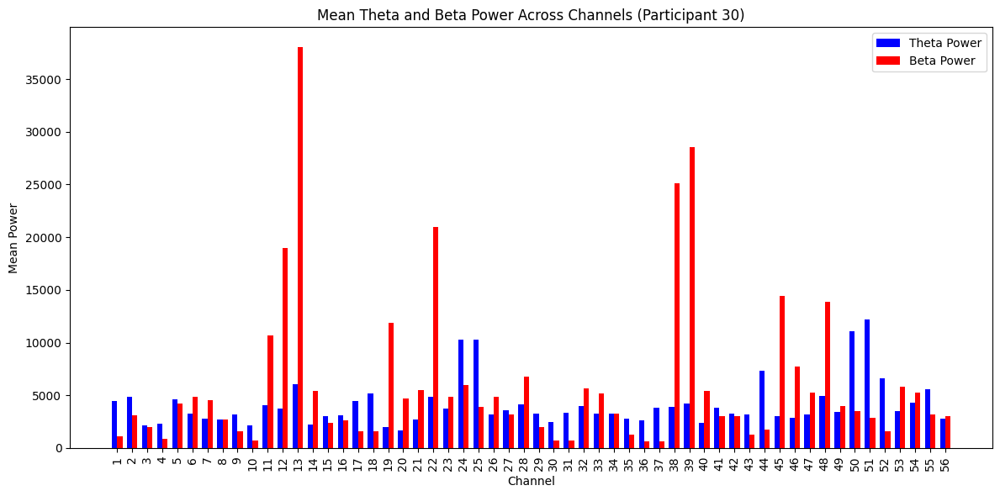

Participant 30: Top Channels by Lowest TBR: [39 38 13 19 12]
Channel 39 - TBR: 0.14761708180625635
Channel 38 - TBR: 0.15668781456588834
Channel 13 - TBR: 0.15903098959637982
Channel 19 - TBR: 0.16384253871593968
Channel 12 - TBR: 0.19687202984580313
Selected Data Shape for Participant 31: (385, 56, 287)


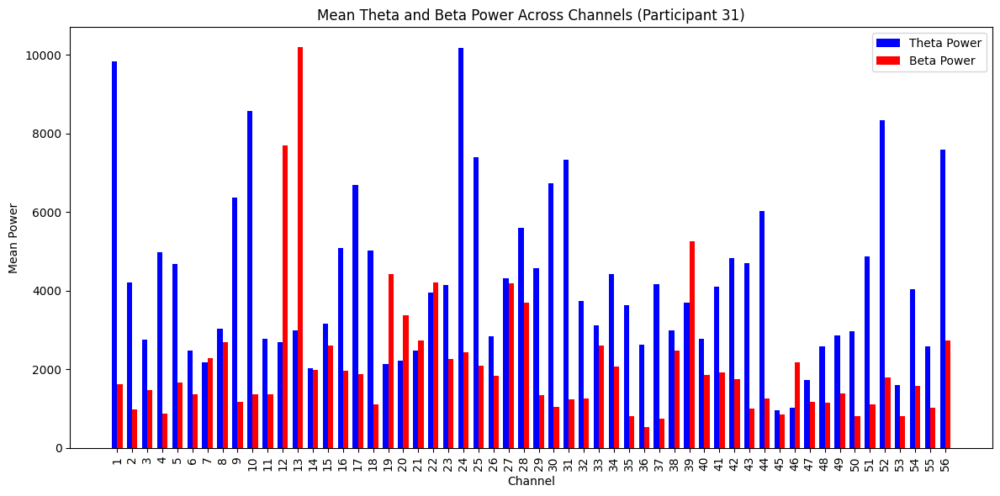

Participant 31: Top Channels by Lowest TBR: [13 12 46 19 20]
Channel 13 - TBR: 0.2944789643425802
Channel 12 - TBR: 0.35095992559820416
Channel 46 - TBR: 0.4681625359488277
Channel 19 - TBR: 0.4814724231515042
Channel 20 - TBR: 0.6589153032432195
Selected Data Shape for Participant 32: (385, 56, 229)


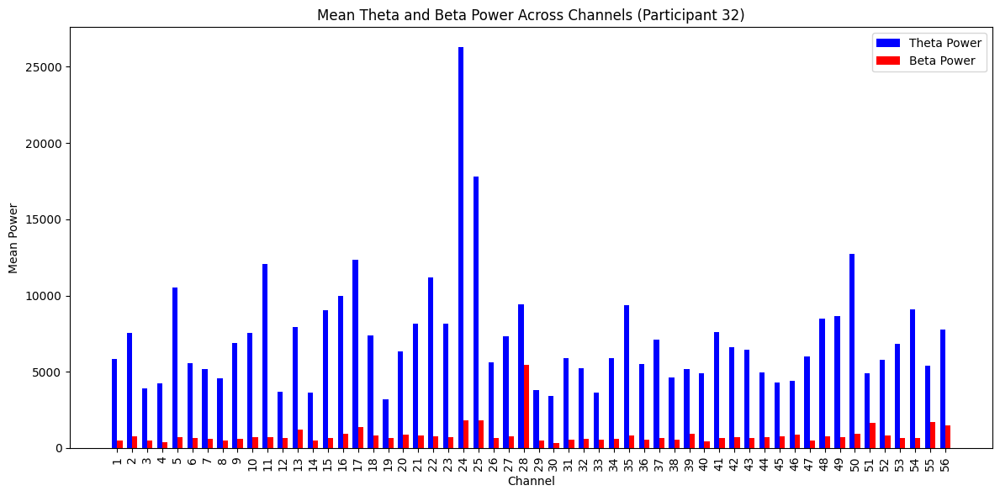

Participant 32: Top Channels by Lowest TBR: [28 51 55 19 46]
Channel 28 - TBR: 1.7211779587931788
Channel 51 - TBR: 2.9946132427486947
Channel 55 - TBR: 3.169284065126283
Channel 19 - TBR: 5.012414623301431
Channel 46 - TBR: 5.114317310512492
Selected Data Shape for Participant 33: (385, 56, 172)


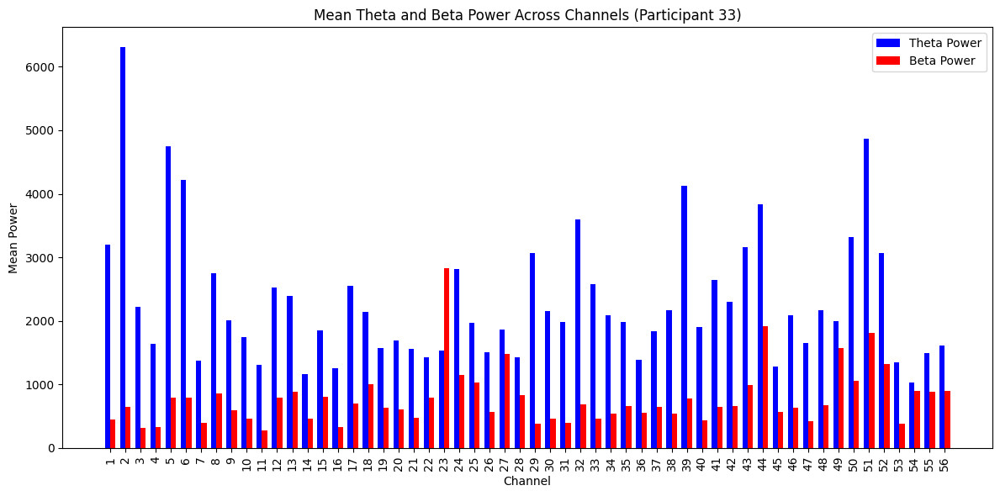

Participant 33: Top Channels by Lowest TBR: [23 54 27 49 55]
Channel 23 - TBR: 0.5437781119104128
Channel 54 - TBR: 1.1401680910419467
Channel 27 - TBR: 1.2545258080285082
Channel 49 - TBR: 1.2707248000429652
Channel 55 - TBR: 1.6746708057865278
Selected Data Shape for Participant 34: (385, 56, 219)


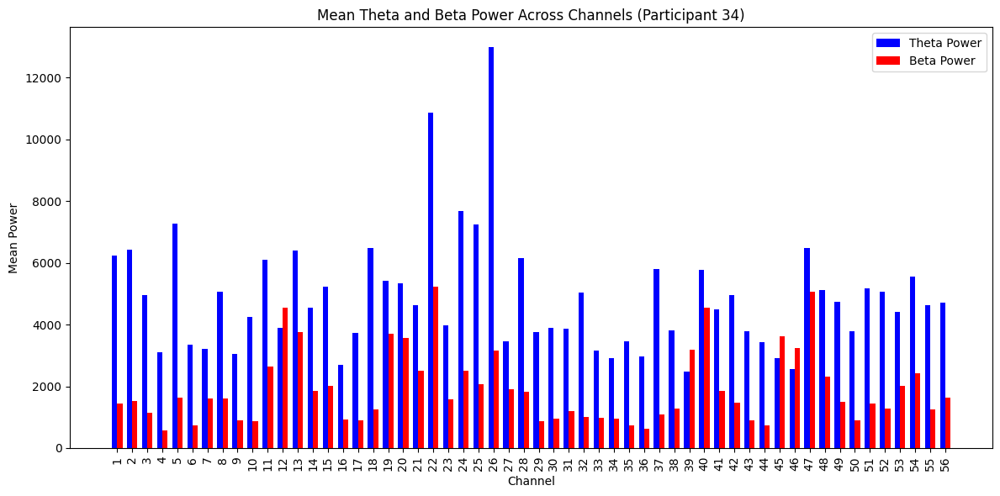

Participant 34: Top Channels by Lowest TBR: [39 46 45 12 40]
Channel 39 - TBR: 0.7825403706652646
Channel 46 - TBR: 0.7880608617375466
Channel 45 - TBR: 0.8048969783768937
Channel 12 - TBR: 0.8565304518967555
Channel 40 - TBR: 1.2692425850413145
Selected Data Shape for Participant 35: (385, 56, 217)


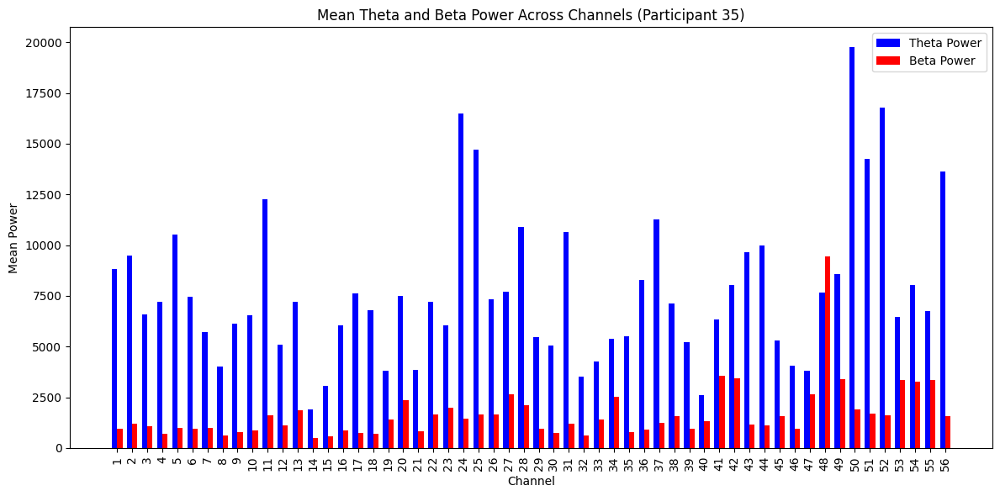

Participant 35: Top Channels by Lowest TBR: [48 47 41 53 55]
Channel 48 - TBR: 0.8125588787915254
Channel 47 - TBR: 1.4281221202599186
Channel 41 - TBR: 1.7798155067559571
Channel 53 - TBR: 1.9283802758017654
Channel 55 - TBR: 1.9958916619376845
Selected Data Shape for Participant 36: (385, 56, 129)


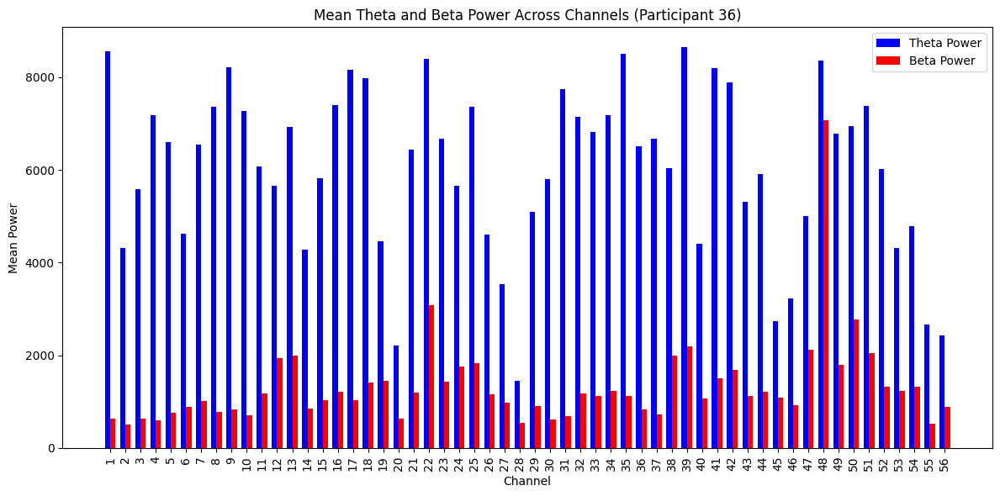

Participant 36: Top Channels by Lowest TBR: [48 47 45 50 28]
Channel 48 - TBR: 1.1821962649943365
Channel 47 - TBR: 2.363316670662007
Channel 45 - TBR: 2.4899412992536005
Channel 50 - TBR: 2.4999329649605184
Channel 28 - TBR: 2.6976496945282684
Selected Data Shape for Participant 37: (385, 56, 187)


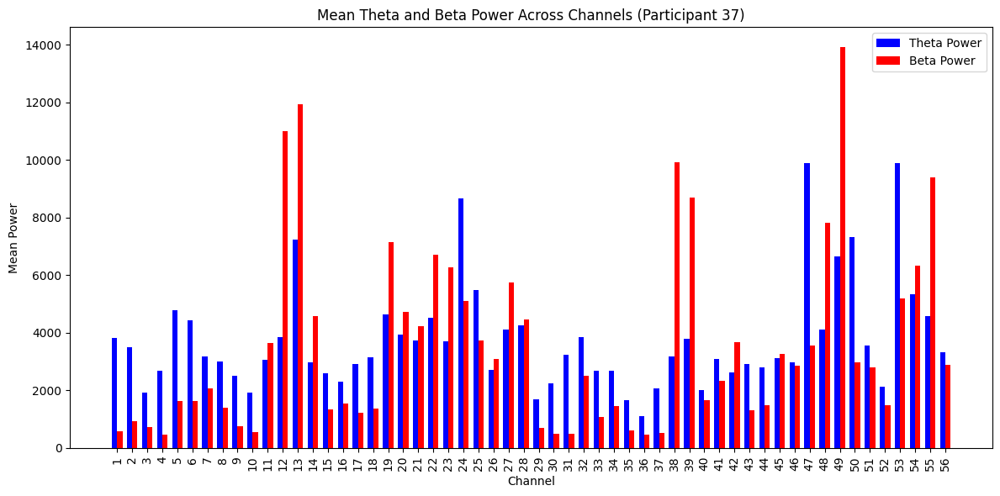

Participant 37: Top Channels by Lowest TBR: [38 12 39 49 55]
Channel 38 - TBR: 0.31899274743104583
Channel 12 - TBR: 0.34963324963006276
Channel 39 - TBR: 0.4352482718495987
Channel 49 - TBR: 0.4777733505043381
Channel 55 - TBR: 0.48817910331858866
Selected Data Shape for Participant 38: (385, 56, 51)


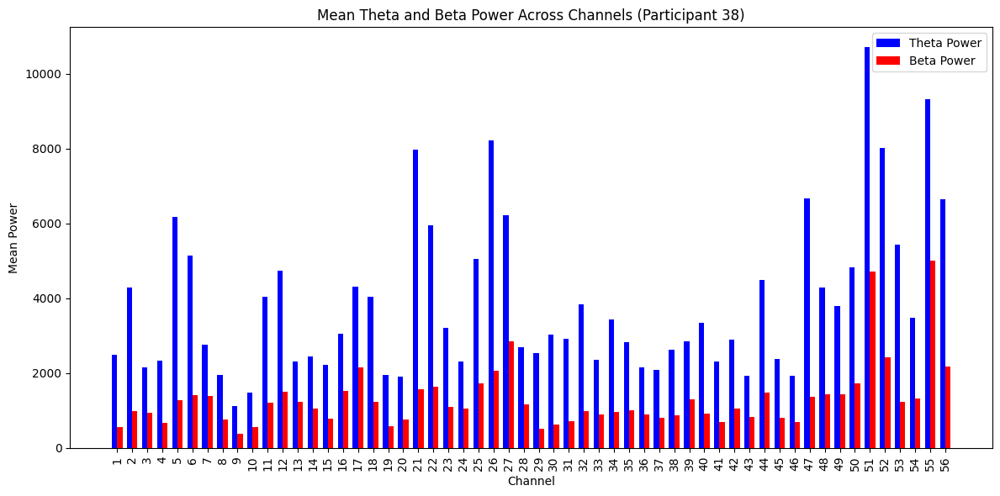

Participant 38: Top Channels by Lowest TBR: [13 55 17 16  7]
Channel 13 - TBR: 1.8515340849524329
Channel 55 - TBR: 1.8615651843405339
Channel 17 - TBR: 1.9941316426420244
Channel 16 - TBR: 2.001425139892095
Channel 7 - TBR: 2.003869042985819
Selected Data Shape for Participant 39: (385, 56, 269)


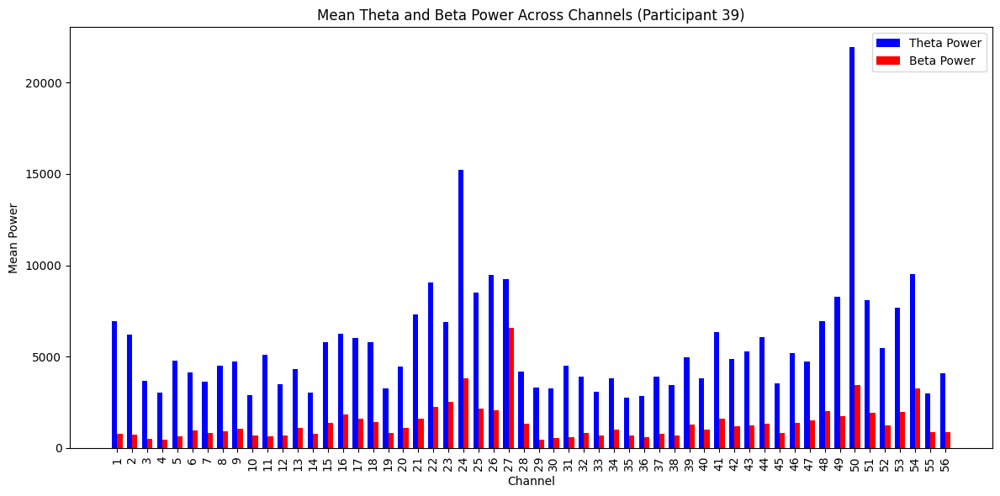

Participant 39: Top Channels by Lowest TBR: [27 23 54 47 28]
Channel 27 - TBR: 1.401066730173275
Channel 23 - TBR: 2.7156391807777256
Channel 54 - TBR: 2.923631909255804
Channel 47 - TBR: 3.144355065987709
Channel 28 - TBR: 3.164311400051207
Selected Data Shape for Participant 40: (385, 56, 234)


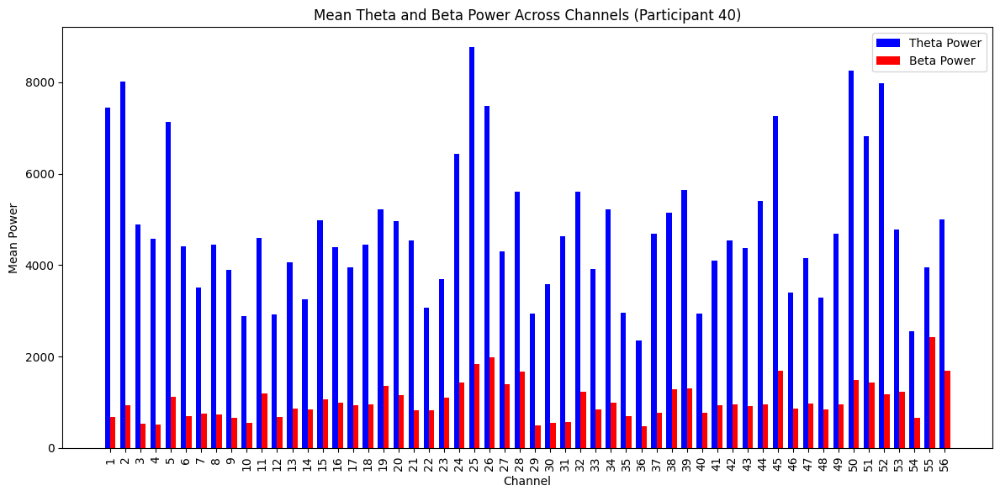

Participant 40: Top Channels by Lowest TBR: [55 56 27 28 23]
Channel 55 - TBR: 1.6313093167024952
Channel 56 - TBR: 2.953639428860301
Channel 27 - TBR: 3.0904799607597937
Channel 28 - TBR: 3.335803072097267
Channel 23 - TBR: 3.352090005945546
Selected Data Shape for Participant 41: (385, 56, 124)


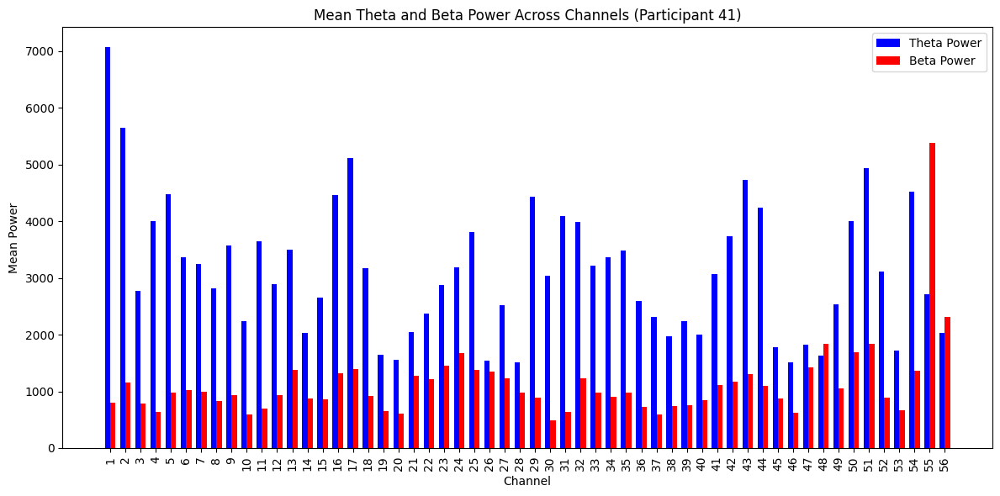

Participant 41: Top Channels by Lowest TBR: [55 56 48 26 47]
Channel 55 - TBR: 0.503515504696846
Channel 56 - TBR: 0.8757562381704914
Channel 48 - TBR: 0.885678586397254
Channel 26 - TBR: 1.1437037303630582
Channel 47 - TBR: 1.2752284073622537
Selected Data Shape for Participant 42: (385, 56, 204)


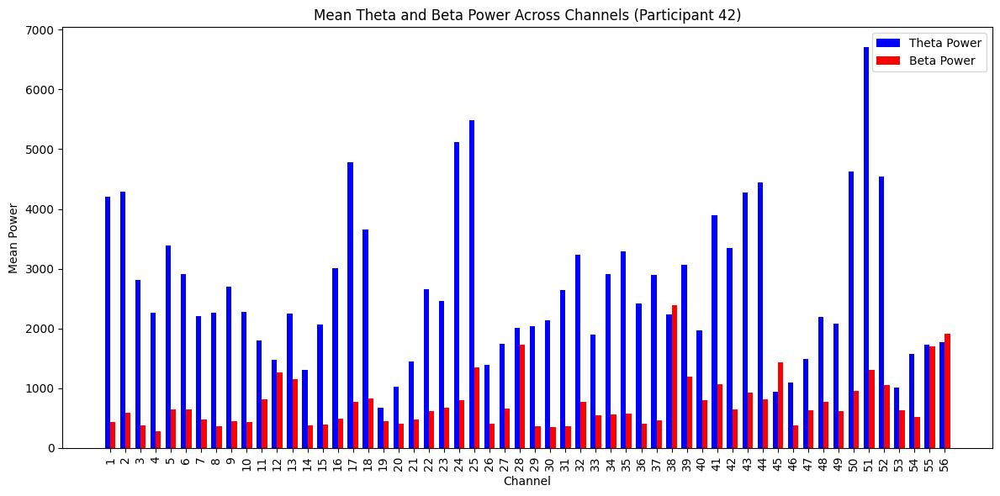

Participant 42: Top Channels by Lowest TBR: [45 56 38 55 28]
Channel 45 - TBR: 0.6561534915953045
Channel 56 - TBR: 0.928582929061953
Channel 38 - TBR: 0.9345125917602787
Channel 55 - TBR: 1.015413820503708
Channel 28 - TBR: 1.1561637557752698
Selected Data Shape for Participant 43: (385, 56, 262)


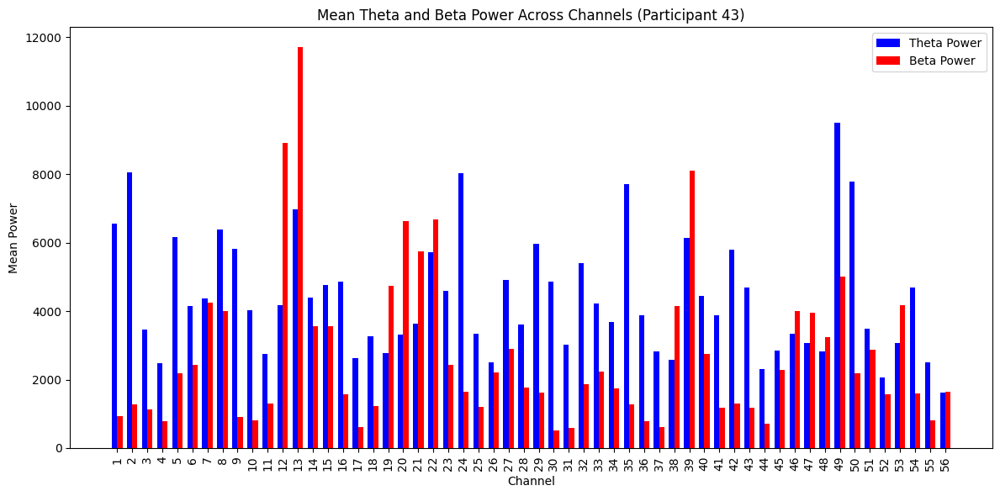

Participant 43: Top Channels by Lowest TBR: [12 20 19 13 38]
Channel 12 - TBR: 0.4671413829299376
Channel 20 - TBR: 0.5021261420860927
Channel 19 - TBR: 0.5863679280831748
Channel 13 - TBR: 0.5950109061509026
Channel 38 - TBR: 0.6220594634666782
Selected Data Shape for Participant 44: (385, 56, 254)


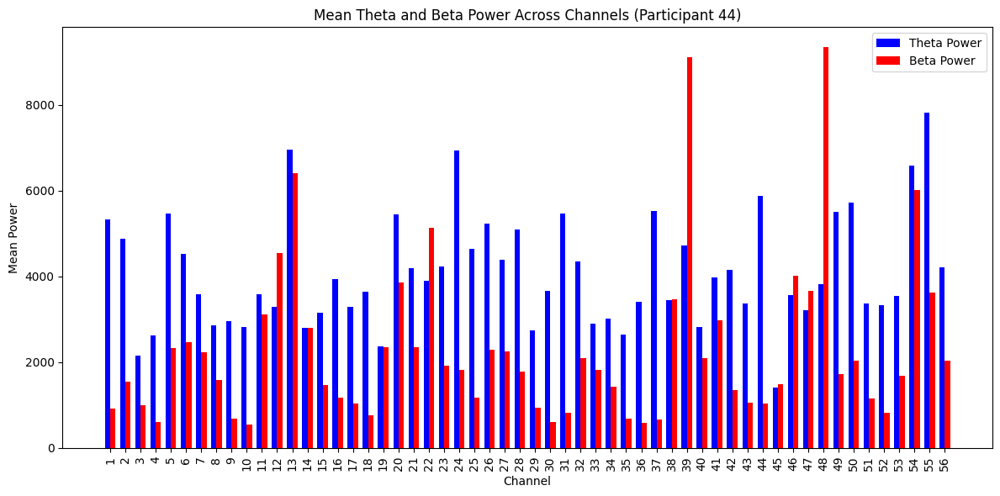

Participant 44: Top Channels by Lowest TBR: [48 39 12 22 47]
Channel 48 - TBR: 0.40930664910596115
Channel 39 - TBR: 0.5185102602259695
Channel 12 - TBR: 0.7251281802273419
Channel 22 - TBR: 0.7583208337678365
Channel 47 - TBR: 0.8760561329873978
Selected Data Shape for Participant 45: (385, 56, 142)


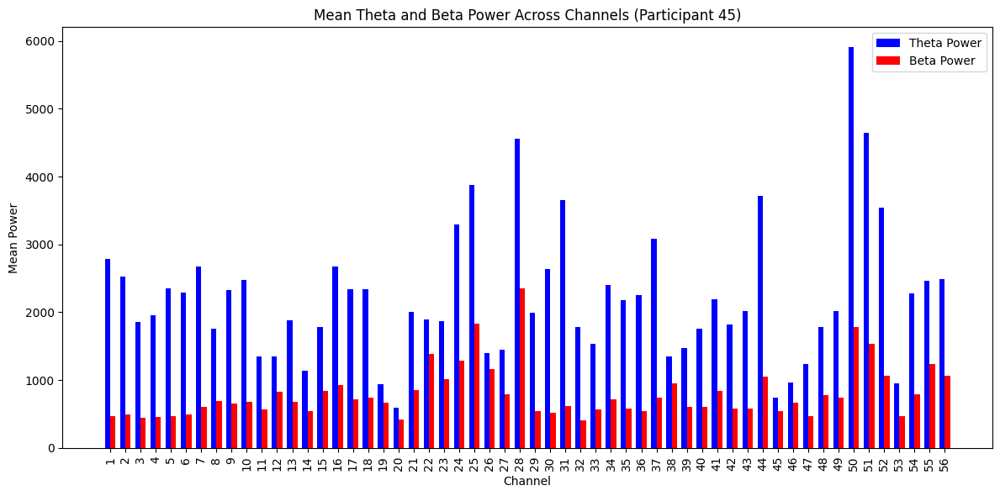

Participant 45: Top Channels by Lowest TBR: [26 45 22 20 38]
Channel 26 - TBR: 1.1993645542982525
Channel 45 - TBR: 1.3559107975013287
Channel 22 - TBR: 1.3646272851682366
Channel 20 - TBR: 1.3929831670367725
Channel 38 - TBR: 1.4074459517707663
Selected Data Shape for Participant 46: (385, 56, 270)


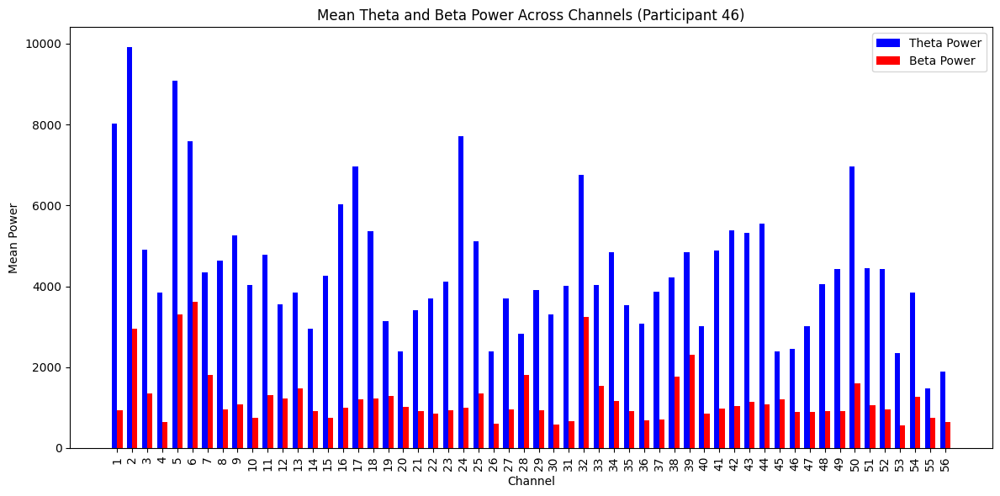

Participant 46: Top Channels by Lowest TBR: [28 55 45 32  6]
Channel 28 - TBR: 1.554861956537613
Channel 55 - TBR: 1.9745596517254538
Channel 45 - TBR: 1.9824738662214916
Channel 32 - TBR: 2.0837935781085735
Channel 6 - TBR: 2.0968500812697792
Selected Data Shape for Participant 47: (385, 56, 219)


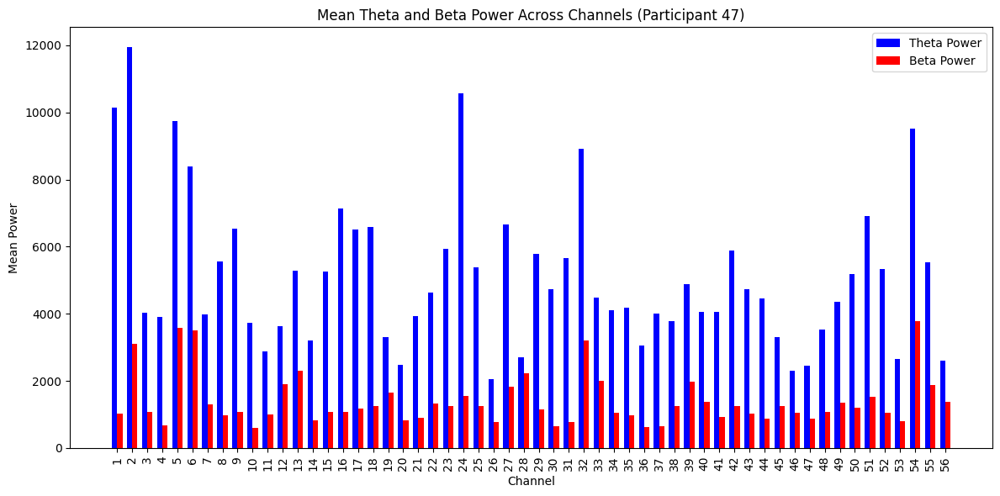

Participant 47: Top Channels by Lowest TBR: [28 56 12 19 46]
Channel 28 - TBR: 1.21717529872643
Channel 56 - TBR: 1.8756109869258422
Channel 12 - TBR: 1.902745040471654
Channel 19 - TBR: 1.998314453676462
Channel 46 - TBR: 2.190581397082947
Selected Data Shape for Participant 48: (385, 56, 283)


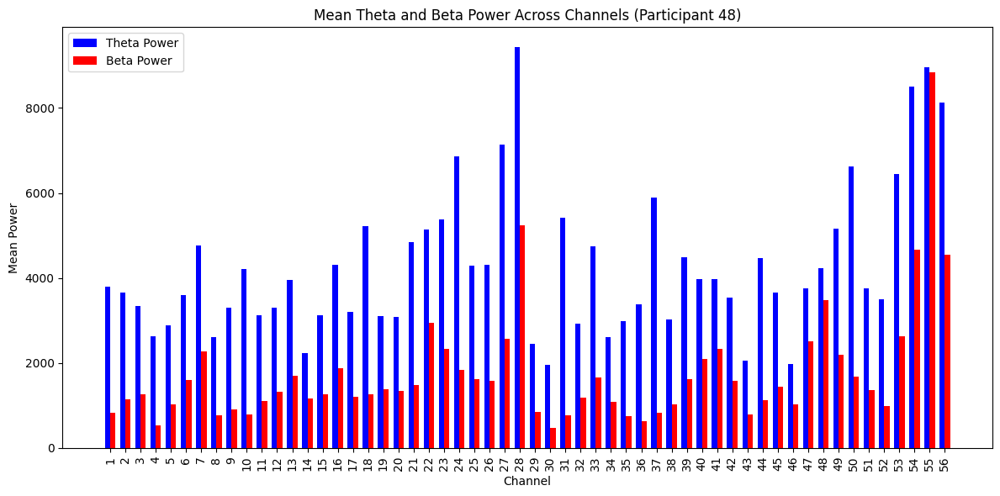

Participant 48: Top Channels by Lowest TBR: [55 48 47 41 22]
Channel 55 - TBR: 1.0133247336652158
Channel 48 - TBR: 1.211173898304553
Channel 47 - TBR: 1.4961817789530116
Channel 41 - TBR: 1.7000402654148583
Channel 22 - TBR: 1.7492416635281116


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
import scipy.io
from collections import Counter

# Step 1: Load the EEG data from a .mat file
mat_data = scipy.io.loadmat('/content/drive/MyDrive/EEG_dataset/control_Files_combined.mat')

# Verify shape of the loaded data
eeg_data = mat_data['combined_data']
print(f"EEG Data Shape: {eeg_data.shape}")  # Check the data structure

# Step 2: Define the trial details for each participant
participant_trials = {
    1: 281, 2: 262, 3: 295, 4: 229, 5: 255, 6: 135, 7: 232, 8: 254,
    9: 159, 10: 272, 11: 279, 12: 168, 13: 137, 14: 237, 15: 205, 16: 115,
    17: 195, 18: 229, 19: 222, 20: 209, 21: 160, 22: 229, 23: 203, 24: 99,
    25: 229, 26: 241, 27: 79, 28: 287, 29: 102, 30: 279, 31: 278, 32: 276,
    33: 280, 34: 241, 35: 288, 36: 273, 37: 267, 38: 259, 39: 273, 40: 279,
    41: 292, 42: 290, 43: 277, 44: 278
}

# Step 3: Sampling frequency and parameters
fs = 256  # Sampling frequency (Hz)
nperseg = 128  # Number of points per segment for STFT

# Number of time points and channels
time_points, num_channels, _ = eeg_data.shape

# Lists to store top 5 channels with highest and lowest TBR for each participant
top_channels_highest_tbr = []
top_channels_lowest_tbr = []

# Step 4: Loop through each participant to calculate the Theta-to-Beta Ratio (TBR)
for participant, num_trials in participant_trials.items():
    # Get the correct range of trials for the participant
    start_trial = sum([participant_trials[i] for i in range(1, participant)])  # Summing previous trials
    end_trial = start_trial + num_trials  # Get the end trial index for the current participant

    # Extract data for the current participant
    eeg_data_participant = eeg_data[:, :, start_trial:end_trial]

    # Verify the shape of the data slice for the participant
    print(f"Selected Data Shape for Participant {participant}: {eeg_data_participant.shape}")

    # Number of trials for this participant
    _, num_channels, num_trials = eeg_data_participant.shape

    # Initialize arrays to store power for Theta and Beta bands for each channel
    theta_power = np.zeros((num_channels, num_trials))  # (Channels x Trials)
    beta_power = np.zeros((num_channels, num_trials))   # (Channels x Trials)

    # Step 5: Apply STFT to each channel across the trials and calculate Theta and Beta power
    for channel in range(num_channels):
        for trial in range(num_trials):
            # Apply STFT to the trial and channel
            f, t, Zxx = stft(eeg_data_participant[:, channel, trial], fs=fs, nperseg=nperseg)

            # Magnitude of the STFT (frequency vs. time representation)
            magnitude = np.abs(Zxx)

            # Mask for Theta band (4-8 Hz)
            theta_mask = (f >= 4) & (f <= 8)
            # Mask for Beta band (13-30 Hz)
            beta_mask = (f >= 13) & (f <= 30)

            # Compute power in the Theta and Beta bands (sum of squared magnitude)
            theta_power[channel, trial] = np.sum(magnitude[theta_mask]**2)
            beta_power[channel, trial] = np.sum(magnitude[beta_mask]**2)

    # Step 6: Aggregate the power for Theta and Beta bands across trials for each channel
    mean_theta_power = np.mean(theta_power, axis=1)  # Mean Theta power for each channel
    mean_beta_power = np.mean(beta_power, axis=1)    # Mean Beta power for each channel

    # Step 7: Compute Theta-to-Beta Ratio (TBR) for each channel
    epsilon = 1e-10  # Prevent division by zero
    theta_to_beta_ratio = mean_theta_power / (mean_beta_power + epsilon)

    # Step 8: Find the top 5 channels by TBR (highest) and the bottom 5 channels (lowest)
    sorted_indices_highest = np.argsort(theta_to_beta_ratio)[::-1]  # Descending order for highest
    sorted_indices_lowest = np.argsort(theta_to_beta_ratio)          # Ascending order for lowest
    top_channels_highest = sorted_indices_highest[:5]  # Get top 5 channels by highest TBR
    top_channels_lowest = sorted_indices_lowest[:5]    # Get top 5 channels by lowest TBR

    # Store the top 5 channels for highest and lowest TBR for this participant
    top_channels_highest_tbr.extend(top_channels_highest)
    top_channels_lowest_tbr.extend(top_channels_lowest)

    # Optional: Plot the Theta and Beta power
    # (You can use the previous plotting code here if you still want to visualize)

# Step 9: Count the frequency of each channel across all participants for highest and lowest TBR
channel_counts_highest_tbr = Counter(top_channels_highest_tbr)
channel_counts_lowest_tbr = Counter(top_channels_lowest_tbr)

# Step 10: Sort channels by frequency of occurrence for highest and lowest TBR
sorted_channel_counts_highest = channel_counts_highest_tbr.most_common()
sorted_channel_counts_lowest = channel_counts_lowest_tbr.most_common()

# Step 11: Display the most common top channels with highest and lowest TBR
print("\nMost Common Channels with Highest TBR (across all participants):")
for channel, count in sorted_channel_counts_highest:
    print(f"Channel {channel + 1}: {count} occurrences")

print("\nMost Common Channels with Lowest TBR (across all participants):")
for channel, count in sorted_channel_counts_lowest:
    print(f"Channel {channel + 1}: {count} occurrences")


EEG Data Shape: (385, 56, 10129)
Selected Data Shape for Participant 1: (385, 56, 281)
Selected Data Shape for Participant 2: (385, 56, 262)
Selected Data Shape for Participant 3: (385, 56, 295)
Selected Data Shape for Participant 4: (385, 56, 229)
Selected Data Shape for Participant 5: (385, 56, 255)
Selected Data Shape for Participant 6: (385, 56, 135)
Selected Data Shape for Participant 7: (385, 56, 232)
Selected Data Shape for Participant 8: (385, 56, 254)
Selected Data Shape for Participant 9: (385, 56, 159)
Selected Data Shape for Participant 10: (385, 56, 272)
Selected Data Shape for Participant 11: (385, 56, 279)
Selected Data Shape for Participant 12: (385, 56, 168)
Selected Data Shape for Participant 13: (385, 56, 137)
Selected Data Shape for Participant 14: (385, 56, 237)
Selected Data Shape for Participant 15: (385, 56, 205)
Selected Data Shape for Participant 16: (385, 56, 115)
Selected Data Shape for Participant 17: (385, 56, 195)
Selected Data Shape for Participant 18: (

In [ ]:
# Channel 45: 22 occurrences
# Channel 28: 18 occurrences     45,55,38  -Fp2,o10,AF4
# Channel 55: 18 occurrences
# Channel 19: 16 occurrences
# Channel 38: 15 occurrences


# Channel 55: 20 occurrences
# Channel 39: 19 occurrences
# Channel 38: 19 occurrences
# Channel 12: 17 occurrences
# Channel 45: 17 occurrences